# Language Detection

Based on the two datasets with tweets from the weeks before the US Election 2020 we want to explore the sentiment of the tweets. 


In [1]:
'''Import libraries'''
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import re
import spacy
from spacy.language import Language
from spacy_langdetect import LanguageDetector



In [2]:
'''load files'''

trump = pd.read_csv('hashtag_donaldtrump.csv' , lineterminator='\n')
biden = pd.read_csv('hashtag_joebiden.csv',  lineterminator='\n')

In [3]:
# lets have a look at the raw data

trump.head()

,created_at,tweet_id,tweet,likes,retweet_count,source,user_id,user_name,user_screen_name,user_description,...,user_followers_count,user_location,lat,long,city,country,continent,state,state_code,collected_at
0,2020-10-15 00:00:01,1.316529e+18,#Elecciones2020 | En #Florida: #JoeBiden dice ...,0.0,0.0,TweetDeck,3.606665e+08,El Sol Latino News,elsollatinonews,🌐 Noticias de interés para latinos de la costa...,...,1860.0,"Philadelphia, PA / Miami, FL",25.774270,-80.193660,NaN,United States of America,North America,Florida,FL,2020-10-21 00:00:00
1,2020-10-15 00:00:01,1.316529e+18,"Usa 2020, Trump contro Facebook e Twitter: cop...",26.0,9.0,Social Mediaset,3.316176e+08,Tgcom24,MediasetTgcom24,Profilo ufficiale di Tgcom24: tutte le notizie...,...,1067661.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2020-10-21 00:00:00.373216530
2,2020-10-15 00:00:02,1.316529e+18,"#Trump: As a student I used to hear for years,...",2.0,1.0,Twitter Web App,8.436472e+06,snarke,snarke,"Will mock for food! Freelance writer, blogger,...",...,1185.0,Portland,45.520247,-122.674195,Portland,United States of America,North America,Oregon,OR,2020-10-21 00:00:00.746433060
3,2020-10-15 00:00:02,1.316529e+18,2 hours since last tweet from #Trump! Maybe he...,0.0,0.0,Trumpytweeter,8.283556e+17,Trumpytweeter,trumpytweeter,"If he doesn't tweet for some time, should we b...",...,32.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2020-10-21 00:00:01.119649591
4,2020-10-15 00:00:08,1.316529e+18,You get a tie! And you get a tie! #Trump ‘s ra...,4.0,3.0,Twitter for iPhone,4.741380e+07,Rana Abtar - رنا أبتر,Ranaabtar,"Washington Correspondent, Lebanese-American ,c...",...,5393.0,Washington DC,38.894992,-77.036558,Washington,United States of America,North America,District of Columbia,DC,2020-10-21 00:00:01.492866121


In [4]:
biden.head()


,created_at,tweet_id,tweet,likes,retweet_count,source,user_id,user_name,user_screen_name,user_description,...,user_followers_count,user_location,lat,long,city,country,continent,state,state_code,collected_at
0,2020-10-15 00:00:01,1.316529e+18,#Elecciones2020 | En #Florida: #JoeBiden dice ...,0.0,0.0,TweetDeck,3.606665e+08,El Sol Latino News,elsollatinonews,🌐 Noticias de interés para latinos de la costa...,...,1860.0,"Philadelphia, PA / Miami, FL",25.774270,-80.193660,NaN,United States of America,North America,Florida,FL,2020-10-21 00:00:00
1,2020-10-15 00:00:18,1.316529e+18,#HunterBiden #HunterBidenEmails #JoeBiden #Joe...,0.0,0.0,Twitter for iPad,8.099044e+08,Cheri A. 🇺🇸,Biloximeemaw,"Locked and loaded Meemaw. Love God, my family ...",...,6628.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2020-10-21 00:00:00.517827283
2,2020-10-15 00:00:20,1.316529e+18,@IslandGirlPRV @BradBeauregardJ @MeidasTouch T...,0.0,0.0,Twitter Web App,3.494182e+09,Flag Waver,Flag_Wavers,NaN,...,1536.0,Golden Valley Arizona,46.304036,-109.171431,NaN,United States of America,North America,Montana,MT,2020-10-21 00:00:01.035654566
3,2020-10-15 00:00:21,1.316529e+18,@chrislongview Watching and setting dvr. Let’s...,0.0,0.0,Twitter for iPhone,8.242596e+17,Michelle Ferg,MichelleFerg4,NaN,...,27.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2020-10-21 00:00:01.553481849
4,2020-10-15 00:00:22,1.316529e+18,#censorship #HunterBiden #Biden #BidenEmails #...,1.0,0.0,Twitter Web App,1.032807e+18,the Gold State,theegoldstate,A Silicon Valley #independent #News #Media #St...,...,390.0,"California, USA",36.701463,-118.755997,NaN,United States of America,North America,California,CA,2020-10-21 00:00:02.071309132


In [5]:
print(trump.shape)
print(biden.shape)

(970919, 21)
(776886, 21)


In [6]:
#trump.info()
#biden.info()

Sentiment analysis

#### Language detection using spacy
More details here: https://spacy.io/universe/project/spacy-langdetect


In [6]:
'''some general cleaning of the data'''
#add caption & small description

def clean(text):
    '''This function takes a string and cleans it from anything that is not a character also it lowers all characters.
    :param text: the string of text that should be cleaned
    :return: the cleaned text
    '''
    text = str(text).lower()
    text = re.sub('[^a-z]',' ',str(text))
    return text


As we don't have any data on which language the tweet was written, we will create a new column "tweet_lang"

In [7]:
## create a pipeline for language detection
@Language.factory("language_detector")

# define the function
def get_lang_detector(nlp, name):
    '''This function finds the language of a given text
    :param nlp: the language model
    :param name: the class object
    :return: the language of the text
    '''
    return LanguageDetector()

# load english 
nlp = spacy.load("en_core_web_sm")
# this is just an example of how this can look like
nlp.add_pipe('language_detector', last=True)
print(nlp("This is an english text.")._.language)

{'language': 'en', 'score': 0.9999969354515421}


In [12]:
print(nlp("This is an english text.")._.language['language'])

en


In [13]:
trump['cleantweet']= trump['tweet'].apply(clean)

trump['tweet'].drop(axis=1, inplace=True) # get rid of the text we don't need # inplace=True changes the thing in the data set

In [14]:
biden['cleantweet']= biden['tweet'].apply(clean)

biden['tweet'].drop(axis=1, inplace=True)

In [16]:
tweets = trump['cleantweet']
languages_spacy = []
# take the cleaned tweets and create an empty list
# loop through tweets and add languge to the list
for e in tweets:
    doc = nlp(e)
    # cheking if the doc._.languages is not empty
    # then appending the first detected language in a list
    if(doc._.language):
        print(doc._.language['language'])
        languages_spacy.append(doc._.language['language'])  
    else:
        print("NaN")
        languages_spacy.append('NaN')
###takes long time to process >3 hours

es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
fr
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
da
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
it
en
en
en
nl
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
sv
es
es
en
en
en
en
en
fr
en
en
en
vi
en
en
en
en
en
en
en
en
en
en
en
en
en
fr
en
fr
en
en
en
en
en
en
tr
en
en
fr
nl
en
en
en
en
en
en
en
en
en
en
fr
en
en
en
en
en
en
en
es
en
en
fr
en
en
en
en
en
da
en
en
en
ro
en
en
en
en
en
en
en
en
en
en
en
en
en
fr
en
en
en
it
en
it
en
en
en
en
fr
en
en
en
en
en
en
en
sv
en
en
en
en
en
fr
en
fi
en
en
en
en
en
en
fr
es
en
en
en
en
en
en
en
en
it
en
en
en
en
en
en
en
en
en
fr
en
en
en
nl
en
en
en
en
en
en
en
ro
en
en
en
sv
en
en
en
en
en
fr
en
en
en
en
fr
en
vi
en
en
en
en
en
en
da
en
en
en
en
fr
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
n

en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
pt
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
da
en
en
en
en
en
en
en
en
en
en
en
en
de
en
en
es
en
en
en
en
en
en
en
en
en
es
en
en
es
ro
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
ca
es
fr
es
en
en
en
en
en
en
en
en
en
en
en
en
en
pt
es
en
da
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
es
en
en
en
ro
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
de
en
en
en
en
en
en
en
en
en
pt
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
fr
en
en
en
en
en
de
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
de
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
id
es
en
en
fr
en
en
en
en
en
en
e

de
nl
pt
en
en
nl
nl
en
it
en
en
en
sv
it
en
es
en
en
es
en
en
en
en
en
en
en
en
en
en
de
en
nl
en
en
nl
en
en
en
en
en
en
fr
en
en
en
en
en
it
en
en
en
en
en
en
en
en
nl
en
en
en
en
en
en
en
en
en
en
fr
en
en
en
en
fr
en
en
en
en
fr
en
en
en
en
en
en
fr
en
en
en
en
en
en
en
en
no
en
ca
en
en
fr
it
en
sk
de
sw
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
nl
en
de
fr
en
en
en
af
ca
ro
en
tr
en
es
it
en
es
en
en
en
en
es
en
fr
en
en
it
it
en
en
it
en
en
it
en
it
ro
en
en
ca
nl
nl
en
en
en
en
en
en
en
en
en
fr
en
fr
en
en
en
en
en
en
en
en
en
en
en
ro
en
en
en
en
it
en
en
en
it
it
en
en
en
it
nl
en
en
tr
es
fr
en
fr
en
en
en
en
en
en
en
en
de
en
en
en
en
en
en
en
en
en
nl
en
en
nl
en
en
en
de
en
en
en
en
en
tr
fr
en
en
en
en
en
en
en
en
en
en
en
nl
fr
en
en
id
en
en
en
it
en
en
en
de
en
en
en
en
en
en
en
en
tr
et
es
en
en
en
en
it
it
en
en
it
de
en
en
de
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
nl
nl
en
en
en
en
fr
en
en
ca
en
en
en
en
it
en
en
fi
en
es
en
en
en
e

en
en
en
pl
en
fr
en
en
en
en
en
en
en
en
en
en
en
en
en
en
it
en
en
en
fr
en
tl
en
fr
en
ca
de
en
en
de
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
fr
de
it
en
it
it
en
it
en
en
en
de
en
en
en
en
en
en
en
it
en
en
en
en
es
en
en
en
en
en
de
en
es
en
en
en
en
en
en
en
en
de
nl
en
tr
en
en
en
en
sv
en
nl
en
en
en
it
en
en
en
en
en
en
id
nl
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
id
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
de
en
en
en
nl
en
en
en
en
en
it
en
en
en
en
en
en
fr
en
en
en
en
en
en
en
ro
it
en
en
en
en
en
en
en
en
en
en
en
hr
nl
ca
da
en
en
en
en
en
en
en
en
en
es
en
en
en
en
it
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
ca
en
en
en
en
en
en
en
en
en
en
de
en
ca
en
en
en
en
en
en
en
nl
en
it
en
en
en
en
tr
en
en
en
en
de
en
en
en
en
en
de
en
en
en
en
en
en
en
en
it
en
nl
en
en
en
en
en
de
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
fr
en
en
en
en
en
en
en
en
en
en
en
en
e

en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
de
en
en
en
en
en
en
en
es
en
en
en
fr
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
nl
en
it
fi
en
tl
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
es
en
en
de
en
en
en
en
en
es
en
en
en
en
en
it
en
en
en
en
en
en
en
cs
en
en
en
en
en
en
en
en
es
es
es
en
en
en
en
en
en
en
en
it
en
en
en
en
da
en
en
en
nl
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
sv
en
en
en
en
en
es
en
en
en
en
pl
en
en
pt
en
en
en
en
en
fr
en
en
en
id
en
en
en
en
en
en
en
en
fr
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
ca
en
en
en
en
en
en
en
en
en
en
en
en
da
it
en
en
en
en
en
en
en
en
en
ro
en
en
ro
en
en
en
en
en
ro
en
fr
es
en
en
en
ro
en
en
en
en
en
fr
en
en
en
en
ro
en
pl
en
en
en
en
en
en
de
en
en
en
en
en
en
en
en
en
en
en
nl
en
en
en
en
en
en
en
en
de
en
en
en
en
en
fr
en
en
en
en
en
en
en
en
en
es
en
en
en
en
et
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
e

en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
fr
en
en
en
en
nl
en
en
en
en
en
es
en
en
es
en
en
en
en
en
en
en
en
en
en
en
ro
en
en
en
en
en
en
en
en
it
en
en
en
en
ro
en
en
en
en
en
en
en
es
es
en
es
en
en
en
es
en
en
lv
en
en
en
en
en
de
sv
en
en
en
it
en
en
en
en
no
en
es
en
en
fr
en
en
en
en
it
en
en
en
en
en
en
en
en
en
lv
en
it
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
fr
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
ca
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
nl
en
en
en
en
en
en
vi
en
en
en
en
en
en
en
en
en
en
en
pl
en
en
en
en
en
en
ro
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
no
en
en
en
en
nl
en
en
en
en
en
en
en
it
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
de
en
fr
en
de
en
en
es
en
en
en
en
ro
en
en
en
es
en
en
en
en
en
en
da
ro
en
en
en
en
en
en
vi
en
e

en
en
de
en
en
en
en
en
it
en
en
en
en
en
en
en
en
en
en
en
fr
en
en
en
en
en
it
en
en
en
it
en
en
en
en
en
en
en
it
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
de
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
fr
it
en
en
en
ca
en
fr
en
en
en
en
en
en
en
en
en
fr
en
en
en
en
en
en
en
en
fi
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
de
en
en
en
en
en
en
tr
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
fr
en
en
da
en
en
en
en
en
en
en
en
en
en
en
en
it
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
ca
en
en
en
en
en
en
en
en
en
en
en
en
en
en
no
en
en
en
en
en
en
es
en
en
en
en
en
en
es
de
ca
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
ca
en
en
en
en
en
es
ca
en
en
en
en
en
lv
en
en
en
ro
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
nl
en
en
en
en
en
en
en
es
ca
it
fr
en
en
en
en
en
es
en
en
en
ro
en
en
ca
en
en
fr
de
en
en
en
en
en
en
ca
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
ca
en
en
e

en
en
ro
en
en
en
en
en
en
en
en
en
sv
fr
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
de
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
pt
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
da
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
ca
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
da
en
da
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
lv
en
en
en
en
en
nl
en
en
en
en
en
en
en
it
en
en
en
en
en
en
en
en
en
en
de
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
vi
en
en
en
en
en
en
ca
en
en
en
en
en
en
en
pt
en
en
en
et
en
en
en
en
fr
en
e

en
da
en
et
en
en
da
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
nl
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
ca
en
de
en
en
en
en
en
en
en
en
en
en
no
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
ro
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
fr
en
en
nl
en
en
en
en
en
en
en
en
ca
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
ro
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
so
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
da
en
en
fr
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
ca
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
nl
en
en
e

de
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
da
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
nl
en
en
de
de
en
en
de
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
ro
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
de
es
en
ro
en
en
en
en
en
en
en
es
en
ca
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
nl
en
en
en
en
en
en
nl
en
en
ca
en
tr
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
pt
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
de
en
en
en
en
es
en
en
en
en
en
en
en
en
en
nl
en
en
en
en
en
en
en
en
en
id
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
nl
en
en
en
en
en
en
ro
en
en
en
es
en
en
en
en
en
ca
en
en
en
en
en
en
en
en
c

en
it
en
en
en
en
en
en
en
en
en
sv
fr
en
en
tr
it
sl
de
en
it
en
tr
en
en
it
en
en
no
en
en
en
en
en
en
fr
en
en
de
en
en
nl
en
en
en
en
en
en
en
en
en
en
en
en
ca
en
en
en
en
en
en
fr
en
en
de
en
en
en
en
en
it
en
en
tr
en
en
pt
en
de
en
en
en
en
en
es
en
en
en
en
lv
en
it
en
en
en
it
en
en
en
en
en
en
cs
en
en
en
tr
en
en
en
en
en
en
it
en
en
en
en
en
en
en
en
en
en
en
en
it
en
it
en
en
en
fr
en
en
en
tr
en
tr
it
en
en
en
nl
en
it
en
en
en
en
en
en
en
en
en
en
es
fr
it
en
en
it
en
en
en
it
en
en
fi
it
en
en
en
en
en
en
en
en
en
en
ca
en
en
en
en
en
en
de
en
en
en
de
en
en
it
en
en
en
en
en
fr
fr
en
en
en
ro
en
en
en
en
de
en
pl
en
en
it
en
en
tr
en
it
en
de
en
en
en
en
en
ca
fr
en
en
en
en
de
en
en
en
it
en
en
en
it
en
en
en
en
en
en
en
en
it
en
it
en
en
en
en
ro
en
en
en
it
en
af
da
en
en
en
tr
en
es
en
en
it
en
en
en
en
en
ro
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
da
it
en
en
en
it
en
en
en
en
en
en
de
en
en
en
en
en
en
en
en
en
en
en
en
en
en
sv
en
en
tr
en
en
en
en
en
e

en
en
en
en
en
en
en
en
en
en
en
en
en
en
it
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
it
en
de
en
en
en
en
fr
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
fr
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
it
es
en
en
en
en
en
en
en
en
en
en
en
en
fr
ca
en
en
es
en
en
nl
en
en
en
en
en
it
en
en
en
en
en
en
en
en
en
en
fr
en
en
en
en
en
en
en
en
en
en
en
en
it
pt
en
it
en
en
en
en
en
nl
en
en
en
en
it
en
en
en
de
en
en
en
fr
en
en
en
en
en
en
af
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
it
en
en
en
en
en
fr
en
en
en
en
it
en
en
en
en
en
en
en
en
en
en
en
fr
en
en
en
en
fr
en
en
en
en
en
en
fr
en
en
en
en
en
de
it
fr
en
en
de
en
en
en
en
en
it
en
en
en
en
en
es
en
en
en
it
en
fr
en
en
en
en
en
en
en
it
en
en
it
en
en
en
en
en
es
en
en
en
en
en
en
en
it
en
en
en
en
it
en
en
fr
en
en
en
en
en
en
de
en
en
it
en
en
en
en
en
it
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
nl
en
en
en
en
en
en
ca
en
de
e

en
en
en
en
en
en
da
es
en
en
en
en
es
it
en
en
it
en
en
en
en
en
en
en
en
en
en
it
en
es
es
en
en
en
nl
en
en
fr
nl
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
fr
en
en
en
en
en
en
it
en
en
en
en
en
en
en
id
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
it
en
en
en
en
en
en
en
en
fr
en
fr
en
en
en
it
en
en
de
en
en
en
en
en
fr
en
en
en
en
en
it
en
en
fr
en
en
en
en
en
de
en
it
en
en
en
en
en
en
ca
en
en
en
en
it
en
en
en
en
de
de
en
es
en
en
en
en
en
en
ro
en
en
en
da
en
en
it
en
en
en
en
en
en
en
es
de
en
en
en
en
en
en
es
en
en
en
en
nl
es
en
en
en
en
en
en
en
en
it
en
it
es
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
es
en
en
fr
en
en
en
en
pt
en
en
en
en
en
en
en
en
es
fr
en
en
nl
en
en
en
en
en
en
en
en
en
es
en
tr
en
en
en
en
en
en
en
es
en
pt
en
en
en
es
en
en
en
en
en
fr
en
en
en
de
de
en
en
en
de
en
en
en
en
en
en
en
en
en
en
it
en
en
en
en
fi
en
en
en
nl
en
en
en
en
es
en
en
en
en
en
en
fi
en
en
en
en
en
en
fr
n

en
en
en
en
en
nl
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
ca
en
en
en
en
en
en
de
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
fr
en
en
en
en
en
en
en
en
en
en
en
en
en
en
de
en
en
ro
en
en
en
en
ca
en
en
en
en
es
en
es
en
en
en
en
en
fr
en
en
en
en
en
en
es
en
en
en
en
en
en
en
tr
en
es
fr
hu
en
en
en
en
en
en
en
en
en
de
en
en
en
en
en
en
en
en
en
en
fr
en
en
en
en
de
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
it
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
de
en
en
en
es
en
en
en
en
fr
en
en
en
en
en
fr
en
it
en
en
it
en
en
en
en
en
en
en
en
en
en
en
en
en
fr
en
ca
es
it
en
en
en
en
en
en
en
en
en
en
fr
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
hr
en
en
en
en
en
en
en
en
en
en
en
de
en
tr
nl
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
ca
en
en
en
en
en
en
en
en
en
en
en
en
en
en
pl
en
en
en
da
en
en
en
en
en
it
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
fr
en
en
en
en
en
en
ca
lv
it
en
en
en
en
it
en
e

en
en
en
en
pt
en
en
en
en
en
en
nl
en
en
en
en
en
en
it
en
en
en
en
en
en
en
en
en
en
en
en
en
fr
en
pt
en
en
en
en
en
en
en
en
fr
en
en
pl
en
en
en
en
en
en
en
en
de
en
en
de
en
en
nl
en
nl
en
fr
ro
en
en
en
et
en
en
en
en
en
en
es
en
en
en
it
it
en
en
es
en
it
en
en
en
en
en
en
en
en
en
it
en
de
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
de
en
en
en
en
en
en
en
en
en
en
en
en
en
it
en
en
en
en
en
en
en
en
en
en
en
nl
en
en
it
it
en
en
it
en
en
en
en
en
fr
en
en
en
en
en
en
nl
en
en
nl
en
en
en
en
en
nl
en
en
en
de
en
en
tr
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
it
en
en
en
en
en
it
it
en
en
en
en
en
en
en
en
en
en
en
it
en
en
en
en
en
fr
en
id
en
en
en
en
nl
en
da
en
it
en
en
en
en
en
en
en
en
en
en
pt
en
en
en
en
en
en
en
en
en
en
en
en
en
en
af
en
en
en
en
it
en
en
en
en
en
en
it
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
nl
es
en
en
en
en
en
en
en
en
en
en
es
en
hr
en
en
en
fr
ro
en
en
en
en
en
e

es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
af
en
en
en
en
en
en
pt
en
en
en
en
en
en
vi
en
en
en
en
en
es
en
en
pt
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
nl
en
en
en
en
en
en
en
en
de
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
it
en
en
en
en
en
en
en
en
en
en
en
ca
en
en
en
en
en
en
pt
pt
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
ro
en
en
es
en
en
en
en
en
en
en
en
en
ca
en
it
en
en
en
en
en
en
en
fr
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
da
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
nl
en
es
en
en
en
en
en
en
en
en
en
es
en
en
de
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
de
en
es
en
ca
en
en
fr
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
it
pt
en
en
en
en
en
en
en
es
en
en
en
en
es
en
nl
en
af
es
en
en
en
en
en
en
en
en
en
en
en
en
en
es
nl
es
en
en
es
e

en
en
en
en
en
en
en
en
en
en
en
af
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
nl
en
en
en
en
en
en
en
en
en
ca
en
en
en
en
en
en
en
en
de
en
en
en
id
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
it
en
en
en
en
en
en
en
en
en
en
en
en
en
en
fr
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
it
en
en
en
nl
en
en
en
en
en
en
en
en
en
en
en
sv
en
en
en
en
en
ca
ro
en
en
en
en
en
en
es
es
es
en
en
en
id
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
ro
en
en
en
en
es
en
en
en
en
en
en
es
en
en
en
en
ca
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
nl
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
sl
en
ro
en
en
en
en
en
e

en
en
en
en
tr
en
en
en
en
da
en
da
en
da
en
en
en
en
de
it
en
en
en
en
en
da
en
en
en
en
en
en
en
en
da
ca
da
en
en
da
en
en
en
en
en
nl
en
en
de
en
en
en
de
en
en
en
en
en
de
en
en
en
en
en
en
en
en
id
nl
da
tr
da
es
en
da
en
da
en
en
da
en
nl
en
da
en
en
en
da
en
en
en
en
en
en
en
en
en
it
en
en
en
en
en
en
en
da
da
no
en
en
en
en
en
en
en
da
en
en
en
en
en
en
en
es
it
en
ro
en
en
en
af
en
en
en
en
en
en
ro
en
es
en
en
fr
it
ca
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
nl
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
de
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
fr
lv
en
en
en
en
en
it
en
en
en
en
en
en
en
ro
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
it
en
en
en
en
en
es
en
de
en
en
it
en
en
en
en
en
nl
id
it
en
en
en
de
fr
en
en
en
sv
en
de
en
en
en
en
en
en
en
en
en
cs
de
en
en
en
en
en
it
en
en
it
en
en
en
en
en
es
et
e

en
de
en
en
en
en
en
en
en
en
en
en
it
en
fr
en
en
en
en
en
en
en
en
ca
en
en
en
en
en
en
en
en
en
en
en
en
en
en
it
en
en
de
en
es
en
en
de
en
en
en
en
en
en
en
en
de
fr
en
en
fr
en
en
id
en
en
en
it
en
en
no
en
it
en
en
en
en
en
en
ro
en
nl
en
en
en
en
en
de
es
en
en
id
it
fr
en
en
de
en
de
en
de
de
en
en
en
en
fr
en
de
fr
en
es
en
ca
en
en
en
fr
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
id
en
en
en
nl
en
en
en
nl
ca
en
es
en
es
en
en
en
es
ca
en
en
ca
es
sv
en
de
en
es
fr
en
en
nl
en
it
en
en
it
da
en
en
en
it
en
en
it
en
nl
it
ca
en
en
en
ca
en
nl
en
en
en
en
de
de
en
en
en
en
en
en
en
en
it
en
ca
en
es
es
en
en
es
en
en
it
de
en
en
en
en
en
de
en
es
en
en
nl
en
it
de
en
en
en
en
en
es
es
es
en
en
en
en
it
en
de
fr
de
en
fr
en
nl
en
en
en
en
en
en
en
en
en
lv
en
en
en
en
en
it
en
en
de
en
en
it
en
en
en
es
en
it
en
en
fr
en
en
en
ro
de
en
en
en
en
en
en
nl
en
en
en
en
en
en
en
en
de
en
en
en
en
en
en
en
en
en
en
en
en
en
nl
de
en
en
en
en
it
en
en
en
fr
en
en
en
en
en
en
en
da
e

en
ca
en
en
en
en
en
es
en
en
en
en
en
en
nl
en
en
en
ca
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
da
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
fr
en
en
en
en
en
en
en
en
en
de
en
en
en
en
en
en
es
en
vi
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
nl
en
en
es
en
en
nl
en
en
en
en
en
en
en
en
en
en
nl
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
de
en
en
en
en
en
en
en
en
en
en
en
en
en
en
it
en
en
en
de
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
nl
en
en
en
en
en
en
en
en
en
en
en
it
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
es
de
nl
en
en
en
en
en
en
en
pt
en
en
en
en
de
en
en
en
en
en
en
en
ro
en
en
en
en
en
es
en
en
en
en
en
pl
en
en
en
no
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
fr
en
en
en
en
en
en
en
en
en
en
en
en
en
nl
en
en
en
en
en
en
en
en
en
en
en
en
en
en
de
en
en
en
en
ca
en
en
en
en
en
en
fi
en
es
en
en
e

en
ro
en
en
en
en
en
es
en
en
en
en
en
es
da
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
fr
en
es
en
en
en
en
en
en
de
en
en
en
en
en
en
en
en
en
en
en
de
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
de
en
en
en
en
en
en
en
en
fr
fr
en
es
en
en
en
en
en
en
en
vi
en
en
en
en
en
en
en
es
en
en
en
en
es
fr
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
nl
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
de
fr
en
pt
en
en
en
en
en
en
en
es
en
sv
en
en
en
en
en
fr
en
en
en
en
en
en
en
en
en
it
en
en
en
en
en
en
en
ca
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
fr
en
en
en
en
en
it
en
en
en
en
fr
en
en
en
en
en
nl
de
ca
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
ca
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
de
en
en
en
en
en
en
en
it
en
en
en
en
en
en
en
en
en
en
en
pt
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
sv
en
en
en
en
en
en
en
en
en
en
en
ro
en
es
en
fr
e

en
en
en
en
en
en
en
lv
en
en
en
en
en
ro
it
ro
es
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
ro
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
it
en
en
en
en
en
nl
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
es
en
en
en
en
en
ro
en
en
en
es
en
en
it
en
en
en
it
en
en
ro
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
it
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
it
en
en
de
en
en
en
en
en
en
en
en
en
de
en
en
en
en
en
en
en
en
en
en
en
en
fr
en
en
it
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
it
en
en
en
en
en
pt
en
en
en
en
en
en
en
en
en
en
it
en
en
en
de
en
es
es
en
en
en
en
en
pt
en
en
fr
en
fr
en
en
en
en
fr
en
en
tl
en
en
en
en
en
es
ro
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
ro
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
lv
es
en
en
es
es
en
en
de
en
en
ro
en
en
en
en
en
ca
e

es
en
en
en
en
en
en
en
en
en
no
en
en
en
en
nl
en
en
en
de
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
fr
en
en
en
en
en
ro
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
et
en
en
en
da
en
en
en
en
en
en
en
ca
en
en
en
en
hu
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
sv
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
no
en
en
en
es
es
en
en
en
en
en
it
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
es
en
en
it
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
nl
en
en
en
en
en
en
it
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
ca
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
de
en
en
en
en
es
en
en
en
en
en
en
en
en
it
en
en
en
en
en
en
e

en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
ca
en
en
en
en
ro
en
en
en
en
en
en
lv
en
en
en
en
en
en
en
en
en
en
en
af
en
en
en
en
en
en
en
en
en
en
en
en
en
en
nl
id
en
en
en
en
en
en
en
en
en
en
en
en
en
fr
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
fr
en
en
en
en
en
en
en
en
tl
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
nl
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
sv
en
en
en
en
en
en
en
en
ro
en
nl
en
en
en
en
nl
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
fr
en
en
en
en
it
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
ro
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
nl
en
en
fr
en
en
es
en
en
en
en
en
en
en
en
fr
en
en
en
en
id
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
e

ro
en
en
en
en
en
en
en
nl
en
de
en
en
en
en
en
en
de
de
en
ca
tr
fr
en
ro
en
en
fr
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
ro
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
nl
en
en
en
en
en
en
de
en
en
en
tr
en
en
en
fr
en
fr
en
en
en
en
fr
tr
en
en
fr
en
en
en
fr
pl
en
nl
nl
en
fr
en
tr
en
en
en
en
en
it
en
da
en
en
en
tr
it
fr
en
en
en
en
en
it
en
en
it
it
en
en
fr
en
ro
nl
en
en
en
en
en
en
en
en
en
fr
en
en
en
nl
en
en
de
en
en
en
en
de
en
en
en
en
nl
de
de
en
en
en
en
en
en
en
it
en
en
en
en
en
en
fr
en
en
en
en
en
en
en
fr
en
en
en
en
en
en
en
it
de
en
en
en
fi
en
en
ro
en
fr
nl
en
en
en
en
nl
en
en
fr
fr
fr
en
en
ca
en
en
en
en
fr
en
en
en
en
en
en
en
nl
en
de
en
en
en
de
ca
en
de
es
es
ro
tr
es
en
en
en
fr
nl
fr
en
en
it
en
en
fr
it
en
it
en
en
de
it
en
it
en
en
ca
en
nl
en
en
en
en
lv
tr
en
no
de
en
en
en
en
en
nl
en
en
en
ro
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
de
en
en
en
en
en
en
en
en
fr
en
it
en
en
en
fr
en
en
en
en
en
en
en
en
en
en
p

en
en
en
en
en
en
en
en
en
en
en
nl
en
en
en
en
en
en
en
en
en
en
es
en
it
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
ro
en
en
en
en
en
en
en
en
en
en
ca
en
en
en
en
en
en
en
en
fr
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
it
en
vi
en
en
en
en
en
en
en
en
de
en
en
en
de
de
en
en
en
en
fr
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
de
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
de
nl
en
fr
es
en
en
es
en
en
en
en
tl
en
en
it
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
ro
en
en
en
en
en
en
en
en
en
ro
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
es
en
en
en
en
en
en
en
en
en
es
en
en
fr
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
de
en
en
en
es
en
en
en
de
en
en
en
ca
en
en
en
en
de
en
ro
en
en
en
en
en
en
en
en
fr
en
en
en
de
en
en
es
en
en
en
en
en
pt
en
en
en
es
en
en
en
en
en
nl
en
en
de
en
en
en
en
en
en
en
en
en
en
no
en
en
en
en
en
en
fr
nl
en
e

en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
fr
en
en
en
en
en
lv
en
en
en
en
en
en
en
en
en
en
en
fr
en
ro
en
en
en
en
en
fr
en
en
en
en
en
en
lv
en
en
en
en
es
en
en
en
en
de
en
en
en
da
en
en
en
en
en
en
en
en
en
en
en
en
en
en
de
en
de
en
en
en
en
en
en
en
en
fr
en
en
en
en
en
en
fi
en
en
nl
en
en
en
en
en
en
en
en
en
en
es
en
ro
en
en
en
en
en
ro
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
lv
en
en
en
en
en
en
en
en
en
en
en
en
en
ro
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
it
en
en
en
it
en
en
en
en
en
fr
en
en
en
en
en
en
de
en
en
en
en
en
en
en
it
en
en
en
en
nl
en
en
de
en
en
en
en
tr
en
es
es
en
de
en
en
en
en
en
id
en
de
it
en
en
en
en
en
en
en
en
ro
en
en
et
en
es
en
en
en
en
en
en
en
de
en
en
en
en
en
en
en
en
ca
en
en
de
en
fr
en
en
en
en
en
en
en
en
en
en
it
fr
en
es
en
en
en
en
de
en
en
ro
en
fr
en
en
de
es
en
en
en
en
en
en
da
en
en
e

nl
it
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
de
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
ro
en
en
en
en
es
en
en
en
en
en
en
en
en
en
nl
en
en
en
fr
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
nl
en
en
en
es
en
it
en
nl
en
de
en
en
en
it
en
en
en
en
en
en
en
en
en
en
en
en
en
tl
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
tr
en
en
es
en
en
en
en
en
en
en
no
en
en
en
fr
en
en
en
en
ro
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
no
ca
en
en
en
en
en
en
en
da
en
en
en
en
nl
en
en
de
en
en
en
en
en
es
es
en
en
en
en
en
en
en
en
en
en
nl
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
it
en
ro
en
en
en
ca
en
en
en
es
en
en
en
en
en
en
en
en
en
it
en
en
it
fr
en
en
en
en
en
en
nl
en
en
en
en
en
en
en
en
en
en
en
en
en
it
en
en
fr
en
en
en
en
en
en
en
en
en
en
en
en
en
e

en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
es
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
it
en
en
fr
it
en
en
es
en
en
en
en
ro
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
it
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
fr
en
nl
en
en
en
en
en
en
en
es
en
en
en
en
fr
en
en
ca
en
en
en
en
en
en
en
en
en
en
ro
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
ro
nl
en
fr
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
ro
en
en
en
en
es
de
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
ro
en
en
de
en
en
es
en
en
en
en
da
en
en
ro
en
en
en
en
en
en
en
en
en
en
fr
pt
en
en
en
en
en
en
en
en
en
es
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
it
pl
en
en
en
en
en
en
en
en
ro
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
it
en
en
en
en
en
en
en
e

en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
fr
en
en
en
ro
en
en
en
en
en
en
en
en
pt
en
en
es
en
en
en
en
en
fr
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
sk
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
pt
en
fr
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
ro
en
en
en
en
en
en
en
en
en
en
ca
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
it
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
ca
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
pt
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
vi
es
en
en
en
en
en
en
en
en
es
nl
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
nl
en
en
en
en
en
en
en
en
en
en
en
en
en
en
id
en
en
en
en
e

id
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
de
en
en
en
en
en
en
en
en
en
en
en
en
en
en
ro
de
ro
en
en
nl
en
en
en
en
en
en
ro
en
it
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
fr
en
en
en
es
de
en
en
en
en
en
en
en
en
en
es
en
en
sv
en
en
en
en
en
en
en
fr
en
en
en
en
en
en
en
en
en
pt
en
en
en
fr
sv
en
en
en
en
en
sv
en
en
en
en
en
en
it
en
en
en
en
en
en
en
af
en
et
hu
en
en
es
en
en
es
en
en
en
en
en
de
en
en
en
en
en
de
es
en
en
en
en
en
fr
en
en
en
de
en
fr
en
en
nl
en
de
en
en
en
en
en
en
de
en
en
nl
en
en
en
en
it
en
en
pt
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
pt
en
en
ca
en
en
pt
en
en
it
en
de
en
en
en
en
en
en
en
it
en
it
en
en
en
en
en
en
en
en
en
en
en
nl
nl
nl
en
en
en
en
it
en
nl
en
en
en
en
en
fi
en
it
en
en
en
en
en
en
en
en
it
en
en
en
en
en
en
en
ca
en
en
fr
en
de
en
en
en
en
en
en
it
en
en
en
de
en
en
it
en
en
en
en
en
ca
nl
en
en
fr
lv
en
en
en
en
en
it
en
en
en
en
de
en
e

en
es
en
de
et
en
en
ca
en
en
en
hr
en
en
de
en
en
de
en
en
en
en
en
id
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
fr
en
en
en
en
en
es
en
en
en
fr
en
en
en
en
en
en
en
en
en
de
de
en
en
en
en
de
en
en
ca
en
en
en
en
en
en
en
it
en
en
en
en
it
en
fr
en
en
en
en
en
en
en
en
es
it
en
en
es
en
es
en
en
pt
nl
en
en
en
en
en
en
pt
en
en
en
en
en
en
en
it
en
en
en
en
en
en
es
pt
en
en
en
et
en
en
en
en
en
en
en
en
en
en
en
fr
en
en
en
en
en
en
lv
it
en
en
ca
fr
en
en
en
en
en
en
it
en
en
en
en
en
tr
en
fr
en
ca
en
pt
en
en
en
en
en
en
en
en
en
en
ca
en
en
en
en
en
en
fr
en
en
en
en
en
en
en
en
en
en
ro
fr
en
en
en
en
it
en
es
en
en
en
en
en
en
fr
en
es
en
de
en
en
en
fr
en
nl
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
fi
en
en
en
en
en
en
en
es
en
en
en
de
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
ro
en
ro
en
en
fr
en
en
fr
ro
it
ro
en
en
en
en
en
en
en
en
en
en
en
en
de
en
en
en
en
en
de
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
ro
en
en
en
en
en
en
en
en
pt
en
en
e

en
en
en
en
en
en
en
en
en
en
en
en
fr
en
en
fr
en
en
en
it
en
en
en
en
en
es
en
en
en
en
de
en
fr
es
en
en
en
de
en
en
en
en
en
en
es
en
en
en
de
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
fr
en
en
es
en
en
en
en
en
en
en
fr
fr
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
fr
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
nl
en
en
de
en
en
en
en
de
en
en
en
en
en
en
en
en
en
en
en
en
ca
es
en
en
en
fr
en
fr
en
tr
en
en
en
en
en
en
en
es
en
it
en
en
en
en
en
en
en
en
en
de
en
de
en
sv
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
de
en
en
en
en
es
en
en
en
it
en
en
en
en
en
en
en
en
en
de
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
it
en
en
en
es
en
fr
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
de
nl
en
en
en
en
en
fr
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
fr
en
en
fr
en
fr
en
en
en
en
en
fr
en
en
en
en
en
en
es
en
en
en
en
en
it
it
en
en
en
en
en
en
en
en
en
it
e

en
en
es
en
en
en
en
en
fr
en
en
en
en
en
en
en
en
en
en
da
en
en
en
nl
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
fr
en
en
en
en
fr
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
nl
en
en
en
it
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
fr
en
en
en
nl
en
en
fr
en
en
en
en
en
en
en
en
en
en
en
nl
en
en
en
en
en
en
en
en
en
en
en
en
en
no
en
en
en
en
da
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
fr
en
en
de
en
en
en
en
en
en
en
en
en
en
en
en
en
en
no
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
es
vi
en
es
fi
en
ro
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
it
en
en
en
en
en
en
en
en
en
en
fr
en
en
en
en
en
en
en
en
it
en
en
en
en
es
en
en
en
en
nl
ro
en
id
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
nl
en
en
en
en
en
en
e

en
et
en
en
fr
en
en
pt
en
en
en
en
de
en
en
en
en
en
en
en
en
en
fr
ca
en
de
en
en
en
es
en
en
en
en
es
en
ca
en
en
en
en
nl
en
en
en
en
ro
sv
en
en
en
en
en
en
en
en
en
en
ca
en
en
en
es
en
en
en
en
en
fr
de
en
en
en
en
en
en
en
en
en
en
es
en
it
en
en
es
en
en
en
tr
en
en
en
en
en
en
ro
fr
en
en
en
en
en
en
en
en
de
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
fr
ro
en
en
en
en
en
en
en
en
en
en
sv
en
en
en
en
en
en
en
en
en
tr
en
en
ca
en
nl
en
en
en
en
en
de
en
af
en
de
en
en
en
en
fr
en
fr
en
en
no
en
en
en
nl
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
pt
en
en
sq
es
en
es
en
it
en
en
lv
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
lv
it
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
af
en
en
en
en
en
en
en
en
es
en
en
en
en
ca
en
en
en
en
en
en
en
en
en
en
en
en
da
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
tr
en
en
en
en
en
nl
es
en
en
en
e

en
en
en
en
ro
en
fr
en
en
en
en
en
en
en
en
en
en
de
es
en
en
en
en
en
de
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
es
en
en
en
en
de
en
en
en
en
en
en
en
en
en
en
it
en
en
en
en
pt
en
es
en
en
en
en
en
en
ro
en
en
en
en
en
en
en
en
en
en
en
en
en
ca
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
fr
nl
en
tl
en
en
en
en
en
de
en
ca
es
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
lv
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
de
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
de
es
en
en
en
en
en
es
en
de
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
sv
en
en
en
en
en
en
en
e

en
ro
en
en
en
en
en
en
en
en
en
en
en
sv
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
ca
es
en
en
en
en
fr
en
en
en
en
en
en
en
ro
en
en
en
en
en
en
en
en
en
en
en
en
en
en
ro
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
ro
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
nl
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
da
en
en
en
en
es
es
en
en
en
es
en
es
en
en
en
en
en
en
ca
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
nl
en
en
en
en
en
en
en
en
en
en
en
en
de
es
en
en
en
en
en
en
en
en
fr
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
ca
en
en
en
es
en
en
en
en
en
en
ca
en
en
en
en
en
fr
de
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
nl
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
ro
en
en
nl
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
e

en
fi
en
ro
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
ro
en
en
en
es
en
en
en
en
en
en
en
en
en
da
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
de
en
es
en
en
en
fr
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
de
ro
en
it
en
en
en
en
vi
en
en
en
en
en
en
en
en
en
en
de
de
en
en
en
en
en
fi
de
en
fi
en
en
en
en
en
en
en
en
nl
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
es
es
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
ro
en
en
en
en
en
et
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
fr
en
en
ro
en
en
en
en
ca
en
en
en
en
en
en
en
en
en
en
en
en
en
en
id
lv
en
en
fi
en
en
en
en
en
en
en
en
en
en
en
en
en
en
lt
de
de
en
en
en
en
en
en
nl
en
en
de
en
ca
en
en
en
en
en
en
en
en
en
es
es
en
en
en
en
en
es
es
en
en
e

en
en
en
en
ca
en
en
en
en
en
en
en
en
en
en
en
en
en
de
en
en
en
de
en
id
en
pl
en
en
en
en
en
en
fr
en
en
en
en
en
en
en
en
nl
en
fr
en
pl
en
en
en
tr
en
vi
en
en
en
en
ro
en
en
en
en
en
en
en
en
en
de
en
en
en
en
en
en
en
en
en
it
ca
it
en
en
en
fr
pl
en
en
en
en
en
en
id
de
en
it
en
en
en
ro
nl
de
en
en
tr
it
en
en
en
en
en
en
en
en
en
nl
nl
en
it
en
en
en
de
en
en
en
en
en
en
en
en
en
nl
de
en
it
tr
en
en
en
en
fr
en
en
en
en
en
en
en
da
en
en
en
de
en
en
en
fr
vi
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
tr
en
en
es
en
en
en
en
en
en
en
en
en
en
nl
en
en
fr
en
fr
en
en
en
en
en
en
en
ro
en
ca
sv
en
en
nl
en
en
es
en
es
it
es
en
de
en
en
es
en
en
it
en
en
en
en
lv
en
en
en
en
en
en
en
en
en
nl
en
en
de
en
en
en
en
en
en
en
it
en
en
en
en
en
fr
tr
en
it
en
en
fr
de
en
en
en
en
nl
en
en
en
en
fr
en
en
de
en
en
en
nl
de
en
en
fr
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
de
nl
en
en
fr
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
fr
fr
en
en
en
en
en
e

en
en
en
en
en
de
en
en
en
en
en
en
en
en
en
en
en
en
lv
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
ro
en
en
en
en
en
en
es
it
en
en
en
en
en
en
it
en
fi
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
fr
it
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
de
en
en
en
en
id
fr
en
en
en
ca
en
en
en
en
en
en
en
en
en
ro
en
en
en
en
ca
fr
pl
en
en
ro
ca
en
en
en
en
en
en
en
en
en
ca
it
en
en
en
en
en
en
en
en
nl
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
it
en
nl
en
en
en
en
en
en
nl
nl
en
en
en
en
en
en
en
en
es
en
en
en
en
en
es
en
en
en
en
en
en
fr
en
en
en
en
en
ca
en
en
en
en
en
en
en
en
en
en
en
en
en
en
fr
en
nl
nl
en
en
en
en
it
en
en
en
en
en
en
en
en
en
sk
en
en
en
en
en
en
nl
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
ca
en
en
en
en
ro
en
en
it
en
es
fr
it
en
en
en
es
nl
en
en
en
en
en
es
de
en
en
en
en
en
en
en
en
et
en
en
en
en
en
fr
en
en
en
en
en
en
en
en
en
en
en
en
en
e

en
en
de
en
en
en
es
en
nl
it
en
fr
en
en
en
en
en
en
en
en
en
en
en
en
fr
en
en
en
en
de
en
en
it
en
en
en
es
en
es
en
en
en
en
en
en
en
en
de
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
es
ro
en
ca
ca
en
en
da
en
en
en
es
lv
en
en
en
en
en
en
en
en
en
en
en
en
en
en
cs
en
en
es
en
en
en
en
en
en
en
en
en
en
en
sv
en
en
en
en
de
en
en
en
en
en
en
en
en
en
en
en
en
en
en
fr
en
en
en
en
id
en
en
en
en
en
en
fr
en
en
en
fr
en
no
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
fr
es
en
en
en
ro
en
en
en
en
en
en
en
it
en
en
en
en
en
en
en
it
it
en
en
en
en
en
sq
en
en
pl
en
en
en
en
af
en
de
en
en
en
en
en
fr
en
en
en
fr
en
en
en
en
en
en
en
en
en
en
en
en
en
fr
af
en
en
en
en
en
ro
en
en
en
en
es
en
fr
en
en
en
en
ca
en
en
en
en
en
en
en
en
en
en
en
it
en
en
en
en
en
en
en
en
en
ro
ro
en
en
en
pl
en
en
en
en
en
en
nl
en
en
en
en
en
en
en
en
en
en
en
en
en
en
fr
ro
en
en
en
ro
pt
fr
en
en
en
en
en
en
en
en
de
en
en
en
en
es
en
de
en
en
en
en
en
en
en
en
e

en
en
en
en
en
en
ro
en
en
en
en
en
es
it
en
en
ca
en
en
en
en
en
en
en
en
id
it
de
en
en
en
en
en
en
en
en
en
en
en
en
da
en
en
de
en
en
en
en
en
en
fr
en
en
en
en
en
ro
en
en
en
en
de
en
en
en
en
en
nl
en
en
en
en
en
en
en
en
nl
es
en
en
en
en
en
en
en
en
en
en
en
de
en
en
en
en
en
en
en
en
en
ro
en
fr
en
en
en
en
en
en
en
en
en
en
en
it
en
en
en
de
nl
en
en
en
en
en
fr
en
en
en
en
en
en
ca
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
de
fr
en
en
en
en
en
en
en
en
en
en
en
no
en
ca
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
nl
en
de
en
en
en
en
en
en
nl
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
it
en
en
en
hr
en
en
en
en
en
de
en
en
en
en
en
en
ro
en
en
en
en
de
en
ca
nl
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
nl
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
pt
en
en
en
en
en
en
en
en
en
en
it
en
en
en
en
en
en
en
en
en
nl
en
en
en
en
en
e

en
en
en
en
da
en
en
pt
ro
en
it
en
en
es
en
en
en
en
en
en
en
nl
en
en
en
nl
en
en
en
en
en
en
en
es
en
en
en
en
en
nl
en
en
en
en
nl
en
en
en
en
en
en
en
ro
en
en
en
en
en
en
en
en
ro
en
en
en
en
en
en
en
en
en
en
en
en
nl
en
en
en
en
en
en
en
en
en
en
en
en
en
de
en
en
en
en
lv
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
pt
et
en
en
en
en
en
en
en
en
en
nl
en
en
en
en
en
en
fr
en
ca
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
fr
es
fr
en
en
en
en
en
es
es
en
en
es
en
en
fr
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
nl
en
en
en
en
en
en
es
en
en
en
en
de
en
de
en
en
en
en
en
en
en
fr
it
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
it
en
en
en
en
en
en
en
en
en
en
en
en
en
en
de
en
en
en
en
en
en
en
en
en
en
p

en
en
en
en
en
en
ca
en
en
en
en
en
en
af
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
es
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
pt
en
en
en
en
en
en
sq
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
es
en
af
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
es
de
en
en
en
en
en
en
en
en
de
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
es
en
en
en
en
en
de
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
ca
en
en
it
en
en
en
en
en
en
en
en
en
en
en
en
en
en
ro
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
ca
en
en
en
en
en
en
en
en
en
en
en
es
ro
en
it
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
no
en
en
en
en
en
es
en
en
en
en
en
ro
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
e

en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
pl
nl
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
pt
it
en
ro
en
en
en
en
en
en
en
en
fr
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
sv
en
en
en
en
en
en
en
en
en
en
nl
en
en
en
nl
en
en
en
en
nl
en
en
ca
en
en
en
en
hu
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
pl
en
en
en
en
en
en
fi
en
en
en
de
de
en
en
en
fr
en
en
en
en
en
en
en
en
en
en
en
en
ro
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
it
en
en
en
en
en
nl
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
nl
en
en
en
en
en
en
en
en
en
en
en
ca
en
en
es
en
en
en
en
ro
en
fr
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
es
es
en
en
en
en
en
en
en
de
en
en
en
ro
en
en
en
en
en
en
en
en
en
en
en
en
en
de
en
en
en
en
da
en
en
en
en
en
en
en
en
en
fr
en
en
en
en
en
en
en
en
e

en
en
en
en
en
en
id
en
en
fr
en
pt
en
en
en
en
en
en
en
fr
en
en
en
en
en
en
en
en
en
ca
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
pt
en
en
en
en
de
de
fr
de
en
nl
nl
es
en
en
es
en
en
fr
en
de
en
en
nl
en
nl
it
de
ca
fr
fr
en
en
en
en
en
en
en
en
es
en
en
en
es
en
fr
en
en
en
en
en
en
en
en
en
fr
en
en
en
en
sv
nl
en
ro
en
en
en
en
en
en
en
it
en
nl
en
en
es
so
en
it
en
en
en
af
en
en
de
nl
de
ca
en
en
en
en
en
nl
en
fr
en
en
it
en
en
tr
fr
en
en
en
en
en
en
en
de
en
de
fr
en
en
en
en
en
en
it
en
en
en
en
en
en
en
it
en
en
en
nl
en
de
en
en
en
ca
nl
en
en
en
en
en
en
en
en
fr
en
en
en
da
es
ro
en
en
en
en
en
ro
fr
en
en
en
en
en
pl
en
en
en
ro
fr
en
en
en
en
en
en
en
en
en
en
es
en
en
en
fi
ro
it
en
en
en
en
en
en
en
fr
de
en
en
en
en
en
en
en
en
en
de
en
en
en
et
en
en
en
fr
en
it
fr
it
de
en
en
ro
en
en
en
en
en
it
en
en
en
en
en
nl
en
en
en
ro
en
en
en
de
en
en
en
en
en
en
en
nl
en
de
en
en
en
en
en
fr
de
en
en
nl
en
id
nl
en
en
en
nl
en
en
en
en
hr
en
en
en
fr
it
en
fr
nl
e

en
en
fr
en
en
es
en
en
en
it
en
en
da
es
en
en
en
en
en
de
en
en
de
ro
es
en
en
en
en
en
en
en
fr
en
en
en
en
id
en
en
en
de
en
en
en
en
en
en
en
en
en
en
es
en
en
nl
en
en
sl
en
en
it
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
fr
en
en
en
de
en
en
it
en
en
en
en
en
en
en
ca
en
en
it
en
en
fr
en
en
en
en
en
en
en
en
en
en
it
en
en
en
nl
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
fr
en
en
pt
en
en
en
en
en
en
en
en
af
en
en
en
en
nl
en
en
en
en
en
en
en
en
en
en
en
en
en
en
nl
fr
it
en
en
fr
en
en
en
en
en
en
en
en
en
en
en
en
en
en
de
en
es
id
en
en
en
en
nl
id
en
en
en
en
en
en
en
de
fr
en
en
it
en
en
en
en
en
en
en
en
en
en
en
en
it
en
en
en
en
en
en
es
en
en
en
en
es
en
en
en
en
en
en
en
en
en
id
nl
en
en
en
it
en
en
en
en
en
en
en
en
en
it
en
en
en
pt
en
en
en
es
en
it
en
en
en
fr
en
en
en
es
en
de
es
en
en
sv
en
en
en
en
en
en
en
en
en
en
fr
en
es
en
es
en
id
en
en
en
en
it
en
en
nl
es
en
en
en
en
en
en
en
fr
en
en
en
nl
en
en
en
en
fr
en
en
en
de
en
en
en
en
e

en
en
en
en
en
en
en
en
en
en
fr
en
en
en
en
en
en
en
en
de
en
en
ca
en
en
en
en
es
en
en
en
en
fr
en
en
pt
en
en
en
id
en
en
en
en
en
en
nl
en
en
it
en
lv
en
en
en
es
en
lv
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
da
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
de
en
en
en
en
en
ro
en
en
en
en
en
en
en
en
en
en
en
fr
fr
en
en
en
en
pl
en
en
en
en
es
et
en
en
en
en
nl
en
en
en
en
en
en
en
en
es
en
pt
en
en
en
en
en
en
de
en
en
en
de
en
en
en
de
it
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
vi
en
en
en
fr
en
en
en
en
en
en
en
en
en
en
es
en
en
en
de
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
ro
en
en
en
es
en
en
en
en
en
es
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
nl
en
en
en
en
pt
en
en
en
es
en
en
en
en
pt
en
en
nl
en
en
en
en
en
de
en
en
en
en
en
en
en
de
en
en
en
en
fr
en
en
de
en
en
en
en
en
de
en
nl
en
en
en
en
en
en
nl
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
es
en
e

es
de
es
en
en
es
en
en
en
en
en
en
it
en
en
en
en
en
en
en
en
es
en
de
en
en
en
de
es
en
en
en
en
en
en
es
en
en
ro
fr
en
ca
en
en
en
en
en
en
ro
en
en
en
en
en
en
en
de
en
en
en
en
en
en
en
en
en
en
en
en
nl
en
fr
de
en
fi
en
es
en
en
en
en
en
en
en
pt
en
en
ro
en
lv
en
de
en
en
en
en
en
de
en
en
en
en
en
en
de
en
en
en
en
en
en
es
en
en
pl
en
en
en
en
en
it
en
en
en
en
en
de
en
es
en
en
fr
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
ca
en
nl
en
en
sl
en
en
en
es
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
ca
en
en
en
en
es
en
en
en
de
en
en
en
en
en
en
fr
en
es
en
en
en
en
en
en
en
it
ro
en
no
es
en
en
en
en
en
en
en
en
en
it
fr
en
en
de
pt
en
en
en
en
en
nl
es
en
en
en
es
en
ca
nl
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
nl
en
en
en
en
en
en
it
en
es
en
lv
en
en
en
fr
fr
en
en
en
en
en
en
de
en
de
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
es
en
en
es
en
en
es
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
fi
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
e

en
en
en
ro
en
en
en
ca
en
en
en
en
pt
en
en
en
en
en
en
en
en
en
en
en
ro
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
de
de
en
en
en
en
en
en
en
en
en
en
en
en
en
da
en
en
en
en
en
en
fr
en
en
en
en
en
de
en
en
en
en
ro
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
de
ro
en
en
en
es
en
en
de
en
en
en
en
en
fr
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
no
en
en
en
en
en
en
en
en
de
en
en
en
en
en
en
en
en
en
de
en
en
en
en
en
en
en
nl
en
en
pt
nl
en
en
en
en
en
en
en
en
da
en
en
en
en
en
en
pt
en
en
en
de
en
it
en
en
en
en
ca
en
en
en
en
en
en
en
en
en
en
en
en
en
it
en
en
de
nl
en
en
en
en
de
en
en
en
en
en
en
en
en
en
it
en
en
en
en
en
en
fr
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
nl
en
en
en
en
en
en
en
en
en
en
en
en
ro
en
ca
en
fr
en
en
en
de
ro
en
en
en
en
en
en
it
ro
en
en
en
en
en
en
en
en
en
en
en
da
en
en
en
en
en
nl
en
en
en
en
en
en
e

en
en
en
en
en
vi
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
de
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
ro
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
fr
en
en
en
es
en
en
en
en
en
en
fi
en
en
en
en
en
en
en
en
en
en
en
nl
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
ro
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
ca
en
en
en
en
en
en
en
en
es
en
en
es
en
en
en
en
it
en
en
en
en
en
en
en
en
en
en
en
en
de
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
nl
fr
nl
ro
da
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
da
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
e

en
en
en
en
en
en
en
vi
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
da
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
sv
en
en
en
en
en
en
en
en
en
it
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
pt
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
fr
en
it
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
et
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
nl
en
es
en
en
en
en
en
en
en
en
en
ro
pt
en
sv
en
en
ca
en
en
en
ca
en
en
en
en
en
en
en
en
en
en
en
es
ca
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
lv
en
en
en
en
en
en
en
en
ro
en
en
en
en
en
en
en
en
en
id
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
e

es
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
fr
fr
es
de
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
it
en
en
fr
en
en
fr
it
en
en
en
en
en
en
en
ro
en
pt
en
en
en
en
en
en
en
ro
en
en
en
nl
en
en
en
en
it
en
en
en
en
en
fr
en
en
en
en
en
en
en
en
en
en
en
en
fr
en
fr
en
en
en
en
en
en
en
fr
de
en
fr
fr
de
tr
de
ca
de
en
en
ro
en
en
en
ro
es
en
ro
en
en
en
en
en
fr
en
en
en
en
en
en
et
fr
en
pt
en
en
en
pt
en
en
en
en
en
fr
en
en
en
en
ro
en
en
en
en
en
en
en
en
es
en
nl
en
en
en
en
en
en
en
fr
en
en
ro
de
fr
fr
en
en
en
en
en
en
en
en
en
pl
de
en
en
ca
fr
de
nl
en
es
en
es
de
en
en
it
en
en
en
en
en
en
en
en
it
en
en
en
it
fr
en
en
en
en
ro
en
en
en
ca
en
de
en
en
en
no
en
en
it
de
en
fr
da
nl
en
en
en
en
en
en
en
en
de
fr
en
en
en
ro
en
en
es
en
en
en
en
en
en
en
it
it
en
en
de
en
da
en
en
en
fr
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
id
en
en
it
nl
en
da
es
en
en
en
en
en
en
it
en
en
en
ca
en
it
de
en
en
en
en
en
en
en
en
fr
en
en
en
fi
en
fr
it
de
en
e

en
en
en
en
en
en
en
de
en
en
en
en
en
en
en
en
en
en
pt
en
en
en
en
en
en
en
en
de
es
en
en
en
nl
en
en
en
en
en
en
en
pt
en
en
de
de
de
de
de
de
de
de
en
de
de
en
en
en
en
en
pt
it
en
en
en
fr
en
en
en
en
en
en
en
en
en
en
en
en
es
es
en
en
es
en
en
en
fr
en
tr
en
en
en
en
en
en
en
en
en
en
en
id
en
en
en
en
en
ro
en
fr
en
es
en
en
en
en
en
en
en
de
en
en
en
it
en
en
tl
en
es
en
en
en
en
en
nl
es
en
en
en
en
en
es
en
en
en
en
en
en
en
en
ca
en
en
en
en
en
en
en
en
en
en
it
en
en
en
en
en
en
es
en
en
en
it
en
es
en
en
en
nl
fr
en
en
en
en
en
en
en
en
sv
en
en
en
nl
en
pt
es
en
en
en
en
en
en
en
en
en
en
en
en
en
de
en
it
en
en
en
ca
vi
ca
en
en
en
en
en
en
en
fr
en
en
en
en
en
en
en
nl
en
en
en
en
en
es
fr
en
en
en
de
en
en
en
en
en
it
en
en
ca
es
en
en
en
it
en
en
en
en
en
es
en
en
en
ca
en
es
en
en
en
pt
en
en
en
en
en
en
en
en
es
de
da
en
en
es
en
en
en
en
en
en
it
es
en
it
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
nl
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
nl
en
en
en
e

en
en
en
en
en
en
en
en
en
en
en
en
en
sq
en
en
en
en
en
en
de
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
it
en
en
en
en
de
lv
en
en
es
en
en
en
en
en
fr
en
nl
en
da
en
en
ca
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
fr
en
es
en
en
en
en
en
en
en
en
da
en
da
en
en
en
en
en
en
en
en
en
en
de
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
ro
en
en
en
en
en
en
en
en
ro
nl
en
en
en
pt
en
en
en
en
ro
en
en
en
en
en
nl
en
en
nl
en
en
en
en
de
en
en
en
en
en
en
en
de
en
es
ca
es
en
en
en
en
en
en
en
en
vi
it
en
en
en
en
en
en
en
en
en
en
ro
es
en
en
en
en
en
en
en
en
en
en
en
en
it
da
en
en
en
de
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
it
es
en
en
en
en
en
en
it
en
en
en
en
es
en
en
en
en
en
en
ca
en
tr
en
en
en
ro
en
tr
es
en
en
en
en
en
en
en
en
en
en
en
en
en
de
en
es
en
en
en
de
en
en
en
en
en
en
en
en
en
en
en
en
pt
es
en
en
en
en
en
fr
en
en
en
fr
en
en
en
en
en
pl
en
en
es
fi
sv
es
es
pt
en
en
en
en
en
en
en
e

en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
fr
en
en
nl
en
en
en
it
en
en
pl
en
en
en
en
en
en
en
de
es
en
ro
en
nl
en
en
en
en
it
en
pt
en
en
en
en
en
en
en
it
en
en
en
en
en
en
en
en
en
en
en
en
en
en
fr
en
en
en
en
en
en
en
en
ca
en
en
nl
en
nl
en
en
en
en
en
en
nl
en
en
en
en
nl
en
en
en
nl
en
en
en
en
nl
en
en
en
en
en
en
en
en
nl
fr
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
nl
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
it
en
en
en
en
en
en
en
en
en
en
nl
en
ro
en
fi
en
en
en
en
en
en
en
en
en
en
es
en
en
en
fr
en
en
en
en
es
en
en
de
en
en
en
fr
nl
en
en
en
en
en
en
es
en
en
en
en
en
en
ca
de
en
en
en
en
en
ca
en
en
en
en
en
en
en
en
en
ca
en
en
en
it
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
lv
en
es
sv
nl
fr
es
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
ro
en
en
en
en
en
en
en
en
it
ro
en
it
en
es
en
en
en
en
en
en
en
en
fi
en
en
es
en
en
en
en
en
en
en
nl
en
es
en
en
en
en
en
en
en
it
en
en
en
en
en
en
es
ca
en
es
en
en
it
en
e

en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
ro
en
en
en
en
en
es
nl
en
en
de
en
en
ro
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
pl
en
en
en
en
en
en
en
en
en
en
en
tr
en
en
en
de
en
en
pt
en
fr
en
nl
en
en
en
en
id
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
de
en
en
es
en
en
en
en
fr
en
en
en
ro
en
en
en
en
de
en
en
es
en
de
en
en
en
en
en
lv
en
en
en
en
en
en
en
fr
en
es
nl
nl
en
en
en
en
en
en
en
fr
en
de
en
de
en
en
en
en
en
sv
en
en
en
en
en
en
en
id
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
de
en
en
en
en
de
en
en
en
en
fr
en
en
en
ro
en
en
en
fr
en
en
en
en
no
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
sv
nl
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
tr
en
en
ro
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
nl
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
es
en
it
en
es
en
en
en
en
en
en
en
en
e

es
en
en
en
en
en
ca
en
it
en
en
en
en
en
en
en
en
en
en
en
en
en
de
en
en
en
en
en
en
nl
nl
en
en
ro
en
en
en
en
en
es
en
en
en
en
en
en
es
en
en
en
en
en
en
es
en
en
en
en
nl
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
nl
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
es
en
en
en
en
en
es
en
de
en
en
en
en
en
en
en
en
it
en
en
en
en
en
en
en
de
en
en
en
en
en
en
hu
en
en
en
en
en
en
en
en
en
fr
en
en
en
en
en
en
es
es
en
es
en
en
en
fr
en
en
en
en
en
en
en
de
en
en
en
en
it
en
nl
en
en
en
en
en
ro
en
en
en
en
en
pt
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
fr
en
en
en
ro
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
tl
en
en
en
pt
en
de
en
en
en
en
ca
en
en
en
en
en
it
pl
en
en
en
en
nl
en
en
en
en
en
en
en
en
en
en
en
en
en
it
en
en
en
en
en
en
en
en
es
en
en
en
es
fr
en
en
en
en
en
en
en
en
en
lv
en
en
en
en
en
en
en
es
es
en
en
en
ro
en
en
en
en
en
en
en
en
en
fr
it
en
en
nl
en
en
en
es
nl
en
en
en
en
da
en
en
ca
en
en
en
en
en
e

nl
en
en
lv
es
en
en
nl
ro
ro
en
en
ro
en
nl
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
nl
en
en
en
es
en
en
en
es
en
es
en
en
en
en
en
en
en
tl
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
ca
ca
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
ca
en
en
es
en
en
en
en
en
en
en
en
en
ro
en
en
en
en
en
en
en
en
en
en
en
en
fr
en
en
en
en
en
en
nl
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
tr
es
nl
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
ca
en
en
en
ca
en
en
en
en
en
en
en
en
en
en
en
en
en
en
nl
en
en
en
en
en
en
en
en
en
en
en
en
es
no
en
en
es
en
en
en
en
de
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
ca
en
es
en
tr
en
en
de
en
en
en
en
en
en
en
en
en
en
en
en
es
pt
nl
en
en
en
nl
ca
nl
fr
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
pt
en
en
en
en
en
de
en
en
en
en
en
en
en
de
fr
en
es
en
en
en
en
en
en
en
fr
en
es
en
en
en
en
es
en
es
en
en
en
en
es
en
e

en
en
en
en
en
en
en
af
en
ca
en
en
en
en
es
en
fr
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
af
da
en
en
en
en
en
en
en
es
ro
en
en
en
en
en
en
it
en
en
it
es
en
en
es
en
en
pt
en
en
en
en
fr
en
en
en
es
en
en
en
en
en
en
en
en
es
lv
en
en
en
en
da
en
en
nl
en
en
es
en
es
en
en
no
pt
ro
en
en
no
en
es
en
en
en
en
nl
en
en
en
ca
en
en
en
no
da
da
af
en
it
en
en
fr
en
en
ro
no
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
es
en
en
en
en
ro
es
en
en
en
en
en
en
hr
en
en
en
en
af
en
en
en
en
en
en
ca
es
en
en
en
en
en
en
en
en
en
en
ca
en
en
en
en
en
en
en
fr
en
ca
en
en
en
en
en
en
en
da
en
en
en
en
en
en
en
en
en
en
en
en
es
fr
en
en
en
es
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
cs
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
es
en
pt
en
en
en
en
en
id
en
en
en
en
en
en
en
en
es
tl
en
en
en
es
es
fr
nl
en
en
en
en
sq
vi
en
fr
en
fr
en
en
en
en
it
en
en
en
af
pt
en
en
en
en
en
en
en
en
en
id
en
en
en
en
en
es
en
en
en
en
en
en
en
e

en
af
en
en
en
en
en
en
en
en
en
en
en
es
it
en
en
en
en
en
en
en
en
en
en
id
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
es
en
ca
es
en
en
en
en
en
en
en
es
en
en
es
no
en
en
en
da
en
af
en
en
en
de
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
es
en
en
en
es
en
en
en
en
en
en
es
af
en
es
en
ca
en
en
en
fr
en
en
en
en
af
en
en
en
en
en
it
ca
en
es
es
en
en
en
en
ca
en
es
en
en
en
ca
en
en
nl
es
de
ca
en
ca
en
en
en
en
en
es
en
da
en
en
en
ro
en
en
en
en
en
en
es
en
en
en
en
es
en
en
en
en
en
en
en
tl
en
en
en
en
en
en
ca
en
en
en
en
en
en
en
en
en
en
af
en
en
en
en
en
en
en
en
en
en
lv
en
en
en
en
en
en
af
en
en
es
en
en
es
en
en
es
en
en
en
en
en
en
en
en
en
fi
en
en
en
en
en
it
nl
en
es
en
en
en
en
en
en
en
en
de
en
en
sq
en
en
en
en
en
es
en
en
en
nl
en
en
en
en
en
en
en
es
ca
en
en
it
en
en
en
es
ca
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
id
en
en
en
en
nl
en
en
en
en
en
en
da
cs
en
en
en
en
en
en
en
es
en
en
fr
en
en
ca
en
en
en
en
en
es
e

de
en
en
it
es
en
en
en
en
es
es
en
en
ca
en
en
en
en
pl
en
nl
en
en
en
en
en
en
en
en
en
en
sq
en
nl
es
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
nl
en
en
fr
en
en
en
nl
en
en
en
en
en
en
en
en
en
en
en
en
nl
de
en
en
en
fr
en
en
en
en
en
en
en
en
en
en
fr
en
en
en
nl
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
nl
en
en
en
en
en
en
en
en
nl
en
en
en
en
en
en
en
en
en
en
ca
en
en
pt
de
en
en
nl
en
en
en
en
es
ro
da
en
en
en
en
es
vi
af
en
en
es
en
en
en
en
en
ro
en
en
en
en
es
en
id
en
en
en
en
en
en
en
en
en
de
en
en
en
en
en
nl
en
en
en
ca
en
en
en
en
en
nl
sv
en
nl
en
ca
en
en
en
nl
af
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
fr
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
pt
es
nl
id
en
ro
en
fr
en
nl
en
en
en
en
en
en
en
it
en
en
id
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
ro
nl
en
da
en
en
nl
nl
en
es
ro
en
en
nl
en
en
en
en
en
en
en
en
en
nl
en
da
en
es
en
nl
en
en
en
nl
en
en
en
en
en
en
de
en
en
es
en
en
no
es
e

en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
da
en
en
en
en
en
nl
en
nl
en
en
en
en
en
en
en
en
en
es
en
en
en
en
tl
en
en
en
en
en
pt
en
en
en
en
en
en
en
en
en
en
en
en
en
da
en
en
en
en
en
en
nl
en
en
en
ro
fr
en
en
en
en
en
en
sv
en
es
en
es
en
en
es
en
en
en
en
en
en
es
en
en
en
ca
de
nl
en
en
en
en
en
en
es
en
en
en
en
en
en
fr
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
af
en
en
da
en
en
en
nl
en
en
en
en
nl
en
en
es
en
en
en
en
en
en
it
en
nl
en
en
en
es
es
en
en
en
en
es
en
en
en
en
nl
en
en
af
en
ro
en
en
en
en
es
en
en
af
nl
en
no
en
pt
en
en
en
ro
en
en
ca
nl
en
en
en
en
en
nl
es
en
en
en
en
en
en
en
en
en
fr
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
ca
en
en
nl
en
es
es
en
en
en
en
en
en
en
nl
de
fr
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
es
en
nl
en
en
en
en
en
en
en
en
en
en
en
es
en
en
fr
en
en
en
en
en
en
en
en
en
en
en
en
en
nl
af
en
de
en
it
en
en
ro
en
es
en
en
en
en
en
en
en
e

en
en
en
en
en
en
pt
en
es
en
en
en
ro
en
en
en
en
en
en
en
en
en
en
fr
en
en
en
en
en
en
en
en
af
en
en
en
en
en
en
en
en
en
en
en
en
pt
en
en
en
en
en
nl
en
en
en
es
en
en
es
en
en
pt
en
en
id
en
en
en
en
en
es
en
en
en
en
en
da
en
en
en
en
en
en
ca
en
en
nl
en
en
en
en
en
en
en
et
en
en
nl
en
en
en
en
en
en
en
fr
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
de
en
en
en
en
ca
en
ca
en
ca
ca
en
en
es
en
es
en
en
en
en
en
en
en
en
en
en
en
es
es
en
en
en
en
en
nl
en
pt
nl
es
en
pt
en
en
en
en
en
en
af
en
en
en
en
en
nl
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
es
en
af
en
da
en
en
en
en
en
lv
da
ro
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
nl
nl
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
da
en
en
en
en
en
en
en
es
en
pt
en
en
en
en
en
en
en
en
en
en
en
nl
no
en
en
en
en
en
en
en
pt
ro
es
en
en
nl
en
en
en
en
en
en
en
en
en
en
en
en
en
en
e

en
pt
en
en
en
en
ro
nl
da
en
en
it
en
en
fr
en
es
en
en
en
nl
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
ro
en
en
en
en
en
en
en
en
en
en
en
es
en
en
es
en
fr
en
nl
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
es
en
pt
es
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
ca
en
en
en
es
en
en
en
es
en
en
en
en
en
es
es
fr
pt
en
en
en
en
en
en
en
en
af
en
en
en
en
en
en
en
es
en
ca
en
de
en
en
en
en
en
en
en
en
en
en
en
en
en
ca
nl
en
en
en
en
en
en
en
en
en
en
en
en
es
en
de
en
en
en
en
en
ca
en
en
en
ca
en
en
en
af
en
en
en
en
en
pt
af
en
en
en
en
en
en
en
en
en
en
en
ro
en
en
ca
es
en
en
es
en
en
en
en
en
en
es
en
en
en
es
en
en
it
en
en
en
en
en
en
en
en
en
en
en
en
nl
es
en
en
en
en
en
ca
en
en
en
en
en
en
af
en
en
fr
en
en
sq
en
en
en
en
en
en
en
de
es
nl
en
en
it
en
en
en
en
en
nl
en
en
en
en
en
en
en
en
en
fr
en
en
nl
es
ca
en
en
es
en
en
en
en
en
en
en
ca
en
en
en
en
es
en
en
en
en
en
en
e

en
en
es
en
nl
ca
en
en
en
en
nl
en
en
es
en
en
en
en
nl
en
es
es
en
nl
en
en
en
en
nl
en
en
nl
en
sv
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
pt
en
en
en
en
en
en
pt
en
en
ro
en
en
en
nl
es
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
nl
en
en
es
en
en
en
da
en
af
nl
en
nl
en
en
es
en
en
en
en
en
en
en
pt
en
en
en
en
en
es
en
en
en
fr
en
en
en
en
nl
en
en
en
en
en
en
en
es
en
es
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
pt
es
en
en
en
en
en
en
en
da
ca
en
en
en
en
en
en
it
en
en
en
en
en
en
en
en
en
en
ro
en
en
en
en
en
de
nl
en
en
en
ca
ro
en
es
en
en
en
no
en
en
en
en
en
id
en
en
en
en
en
es
es
pt
da
en
en
en
en
en
en
en
fr
nl
en
en
en
es
en
en
en
en
en
ca
en
en
nl
en
en
en
en
de
en
en
en
en
fr
en
en
en
en
en
en
en
en
en
en
en
en
af
en
en
en
es
en
en
en
en
es
en
es
en
en
en
en
pt
en
en
en
en
en
es
en
af
da
en
en
en
en
en
en
en
de
hr
ro
en
en
en
en
en
en
en
en
en
en
en
en
lv
en
en
fr
en
en
en
en
en
ca
en
en
fr
nl
en
en
en
en
e

en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
no
en
en
nl
en
en
en
nl
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
pt
en
en
en
es
ca
en
en
en
en
en
en
nl
en
lv
en
en
tr
nl
es
da
en
en
en
ca
en
en
en
en
en
en
en
en
en
en
ca
en
en
en
en
en
en
en
nl
en
en
en
en
en
en
en
en
pt
lv
en
en
en
en
en
en
en
en
en
es
en
da
fr
en
en
en
en
en
en
en
en
de
en
nl
en
en
en
en
en
en
en
en
en
en
en
en
en
nl
en
en
en
nl
en
en
en
en
en
en
en
en
en
en
en
en
en
en
ro
en
en
en
en
en
nl
en
da
it
en
en
en
en
tr
en
en
en
en
en
en
en
nl
en
en
en
en
en
en
en
id
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
fr
en
en
en
en
en
en
en
ca
en
en
ca
en
en
id
da
en
en
en
en
de
en
en
en
en
en
en
en
en
en
en
nl
en
es
en
en
ca
it
en
ro
en
en
en
nl
en
fr
en
en
es
en
en
en
en
en
fr
en
en
en
en
es
en
nl
en
en
en
en
en
en
et
en
lv
en
en
en
en
en
en
en
en
en
nl
en
en
en
en
en
en
nl
en
en
en
de
en
en
pt
en
en
en
en
en
es
en
en
en
en
en
en
en
de
fr
nl
es
en
en
en
en
es
en
en
en
en
en
ro
en
en
es
e

ro
en
en
en
ca
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
ro
en
en
es
en
ca
en
en
en
en
en
en
en
pt
en
en
en
ca
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
nl
es
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
ca
fr
es
da
en
en
en
da
en
en
en
en
en
en
en
en
en
en
en
ro
en
en
ro
en
en
en
en
en
en
en
en
en
en
es
en
en
en
pt
en
en
en
en
en
en
en
en
nl
en
en
en
en
en
en
en
en
en
en
en
nl
en
nl
en
en
en
vi
en
en
en
en
en
af
en
en
vi
en
en
en
en
en
ca
en
en
es
id
en
de
nl
en
en
en
en
en
en
en
en
en
nl
en
en
en
en
en
es
nl
en
en
en
en
en
en
en
en
en
en
en
en
en
lv
en
fr
en
en
en
en
en
da
en
en
en
en
en
en
en
fr
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
it
es
en
it
es
en
en
en
en
en
en
en
en
en
fr
en
en
en
fr
en
en
en
en
en
en
en
en
en
en
en
en
id
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
fr
es
da
en
en
en
en
en
nl
en
en
en
es
en
en
en
en
es
en
en
en
en
en
en
en
en
da
en
fr
e

en
en
en
lv
es
en
en
en
es
en
en
en
en
en
en
id
ro
fr
es
en
en
en
en
fr
en
en
en
en
en
en
en
en
en
en
en
en
en
en
nl
fr
en
en
en
en
en
de
en
en
en
en
no
en
en
et
en
nl
en
en
en
pl
en
en
en
fr
fr
fr
fr
ca
fr
en
ca
en
en
vi
en
en
en
en
en
en
en
de
en
en
en
it
en
es
en
en
en
en
en
en
es
en
en
en
en
es
nl
de
en
en
en
en
fr
en
en
en
en
en
nl
en
en
en
en
ro
en
en
es
en
en
en
en
en
es
en
fi
da
en
tr
en
de
en
en
en
en
en
en
en
en
en
en
en
fi
fr
en
en
nl
en
pl
en
en
en
en
en
en
ca
en
es
en
it
es
en
en
en
es
en
id
en
en
en
en
en
en
nl
en
en
en
en
en
it
en
en
en
de
en
nl
en
en
en
en
en
en
nl
en
en
en
en
no
fr
en
en
en
en
en
tr
en
en
ca
es
en
en
en
en
en
en
en
en
en
ca
en
en
de
de
en
en
en
en
en
id
en
it
en
en
ca
en
en
en
en
en
en
en
nl
en
en
en
en
en
en
en
en
en
en
en
en
en
ca
en
en
en
es
ca
en
en
en
nl
it
en
en
de
en
en
es
en
it
en
en
en
en
de
en
en
en
en
en
id
en
en
en
en
no
en
en
en
nl
en
en
en
no
en
en
en
en
en
es
de
en
nl
en
en
no
en
en
en
en
en
en
en
de
sk
en
en
en
en
it
it
de
nl
en
en
en
e

it
en
it
en
en
en
ro
en
en
en
en
en
fr
en
en
it
de
en
en
en
en
sv
en
en
pt
fr
en
en
nl
en
en
fr
de
en
en
en
en
en
en
it
tr
en
en
en
en
ca
en
en
en
de
en
en
en
it
en
en
en
en
en
en
en
en
en
en
en
en
de
nl
pl
en
en
pl
en
en
nl
en
de
en
en
sv
fr
en
en
en
nl
en
it
en
de
en
de
nl
en
it
en
en
it
en
en
en
en
en
en
de
en
en
en
en
en
en
de
en
en
en
en
en
en
en
en
en
en
en
fr
es
en
sv
fi
fr
en
en
it
sv
en
en
en
en
sv
en
en
es
en
en
sv
en
en
en
en
en
en
id
fr
en
fr
es
en
en
en
en
en
en
en
en
en
en
en
en
it
en
it
en
en
en
en
en
en
en
en
en
de
nl
de
en
fr
en
en
en
en
en
en
en
en
en
ca
en
en
lv
en
en
en
de
da
fi
de
fr
pt
en
en
en
en
en
en
it
en
ca
en
en
en
en
es
it
fr
en
en
en
en
es
en
en
es
en
nl
en
en
en
en
en
it
en
de
en
en
fr
en
en
en
en
en
ca
fi
en
en
it
en
en
en
en
en
en
en
en
en
en
es
en
de
lv
en
lv
nl
en
en
it
en
en
en
it
fr
fr
it
de
en
en
en
de
en
fi
es
en
en
en
nl
en
fr
de
it
en
en
en
es
en
en
en
en
it
ca
en
en
en
en
nl
en
en
fr
en
en
id
it
en
en
en
es
ro
en
en
en
en
de
ca
de
fr
en
en
en
d

nl
en
fr
pt
en
en
en
en
nl
en
en
en
en
en
en
en
en
de
en
id
en
it
fr
en
en
en
en
en
it
fr
en
it
en
de
en
en
sk
tr
en
en
en
fr
es
de
en
de
en
en
en
en
en
fi
de
en
en
en
en
en
en
en
ca
en
de
en
en
tr
en
en
en
fr
en
en
nl
id
en
en
en
en
en
en
en
de
en
en
en
es
en
en
en
en
en
en
en
da
en
en
en
en
en
id
en
en
en
en
en
en
en
en
en
en
fi
en
en
en
en
en
en
en
en
en
en
en
en
en
es
nl
en
en
it
en
en
fr
en
de
en
en
en
en
en
en
en
en
en
de
en
en
en
en
fr
en
en
fr
en
es
en
de
fr
en
en
en
en
en
en
it
de
en
en
en
en
fr
en
en
en
en
en
en
en
en
en
en
en
en
en
it
en
en
ca
en
en
en
en
en
en
en
it
en
en
en
en
en
en
en
es
it
en
en
en
ca
en
en
fr
id
en
en
en
ro
en
en
en
en
en
ca
es
en
en
en
it
en
en
en
en
tr
en
en
en
it
en
en
en
no
en
en
en
en
en
en
en
en
pt
en
nl
en
it
en
ro
en
en
it
en
en
en
en
en
en
pt
pt
en
en
en
en
en
en
en
en
en
en
en
en
it
en
fr
en
en
en
en
en
en
da
en
en
en
en
fr
en
en
de
en
pt
en
en
fr
en
en
en
en
en
es
en
en
en
en
en
en
en
en
it
en
en
en
en
en
en
en
fi
en
en
en
en
en
en
en
nl
pt
f

ro
en
de
en
es
en
en
en
en
ca
en
en
en
it
en
en
en
en
en
en
en
es
ro
es
es
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
it
en
it
en
fr
en
en
en
nl
en
en
en
en
en
es
en
en
en
tr
en
en
de
fr
en
en
en
en
hr
pt
en
en
en
en
en
en
en
en
en
en
en
en
it
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
es
en
en
en
en
en
en
cy
en
en
es
en
en
en
en
en
en
en
en
fr
en
en
en
en
en
en
en
en
en
en
en
fr
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
de
de
en
en
en
en
en
en
en
en
ro
en
en
en
en
en
en
es
sv
en
en
nl
en
ca
en
en
en
en
nl
en
en
en
en
en
fr
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
hr
en
en
da
en
en
pt
en
en
en
en
en
ca
en
en
en
en
en
en
en
en
en
en
en
de
en
en
nl
en
en
en
en
en
en
en
en
en
en
en
en
it
en
en
en
fr
ca
en
en
en
en
en
en
en
nl
en
en
de
es
es
en
en
en
en
nl
en
en
en
sv
en
en
en
en
en
fr
sv
en
en
en
en
es
en
es
en
en
de
de
es
en
en
en
en
ro
en
en
fr
en
en
en
en
en
nl
ro
en
en
en
en
en
en
en
es
en
en
en
da
en
nl
en
en
e

en
de
en
sq
es
tr
ca
en
en
en
en
pt
en
en
en
en
en
fr
en
en
en
en
da
en
en
en
de
en
en
en
en
en
nl
en
en
en
en
en
en
en
en
en
en
de
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
fr
en
en
en
en
en
en
en
en
en
en
en
en
sq
en
en
en
en
en
en
en
en
en
vi
en
it
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
nl
en
en
es
en
en
en
en
en
fr
en
en
da
en
ca
en
en
en
en
en
ca
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
de
en
en
en
fr
en
en
en
it
en
en
en
en
en
en
es
en
en
en
en
en
en
en
lv
en
en
en
en
en
en
en
en
en
en
da
en
en
en
es
en
en
en
en
en
en
en
en
en
fr
en
en
en
en
en
en
en
en
en
en
en
en
pl
en
en
en
en
es
en
en
fi
ro
en
en
en
en
en
en
en
en
en
en
it
en
nl
en
nl
af
es
en
en
ro
en
en
en
en
en
en
pt
en
en
en
en
en
en
en
fr
en
en
en
en
it
en
en
en
en
en
en
en
ro
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
fr
en
en
en
en
en
en
nl
en
en
en
en
en
nl
en
en
en
ca
de
en
en
nl
en
en
en
en
en
en
en
en
id
en
en
en
en
es
en
en
en
en
es
nl
en
en
en
en
en
fr
e

en
en
en
en
en
en
da
en
en
es
en
en
en
es
en
en
en
en
en
en
en
en
en
en
fr
es
en
fr
en
en
ro
en
fr
en
en
en
en
en
en
en
en
en
cs
en
en
en
fr
en
en
en
ca
id
tr
en
en
en
en
en
en
fr
en
en
fr
it
en
pt
en
en
en
en
en
en
nl
fr
en
en
en
en
en
en
en
en
en
en
en
en
en
en
no
en
en
tr
en
en
en
en
en
en
en
en
en
en
fr
en
en
es
en
en
en
en
ro
en
en
en
en
en
en
en
de
fr
tr
en
en
en
en
en
en
en
en
en
en
en
en
en
en
da
en
es
en
de
en
en
en
en
en
en
en
en
es
en
it
en
en
en
sv
en
en
en
en
en
en
en
da
en
en
en
sq
da
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
no
en
en
en
sv
en
tr
en
en
en
es
en
en
nl
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
ro
en
en
fr
en
en
en
en
ca
en
en
en
en
es
en
en
it
ro
it
en
en
en
en
en
es
lv
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
it
en
en
en
en
en
en
en
nl
fr
en
en
en
en
en
de
en
en
en
fr
es
id
en
en
en
es
en
en
fr
en
pt
nl
en
en
ro
en
en
en
de
en
en
it
en
en
en
es
en
en
en
de
en
en
en
en
tr
en
en
fr
fr
en
en
en
e

en
en
en
en
fr
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
lt
en
ro
en
ro
pt
da
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
nl
pt
it
en
nl
fr
en
en
en
en
ca
en
es
en
en
en
en
en
en
de
en
de
en
id
en
vi
en
en
en
en
de
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
ca
en
en
en
en
en
lv
de
es
en
it
en
en
en
en
en
en
en
en
en
en
en
it
en
en
en
en
en
en
en
en
fr
en
ca
en
en
en
en
en
fr
es
fr
en
en
en
en
en
es
en
en
ro
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
ca
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
ca
en
en
en
en
en
en
en
en
en
en
en
en
ca
en
en
en
en
en
en
en
hr
en
en
en
en
es
es
en
en
en
de
en
en
en
en
nl
en
en
en
vi
es
en
es
en
en
en
en
et
en
en
en
en
en
en
en
es
de
en
en
en
en
en
en
en
en
en
en
en
nl
en
en
en
en
en
ca
nl
pt
en
en
en
en
en
en
fr
ro
en
en
ca
en
en
en
en
ca
de
ro
en
en
en
en
en
es
en
de
en
en
en
en
en
en
pt
ca
en
it
en
en
en
en
en
en
en
en
en
en
en
en
ro
en
en
en
en
en
en
en
en
no
en
en
en
en
en
en
en
en
en
en
en
pt
e

ro
en
id
en
en
en
de
en
en
en
en
en
fr
en
en
en
en
en
en
es
ca
fr
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
ro
en
en
en
en
nl
en
en
en
en
en
en
en
en
en
de
en
en
it
en
en
en
da
en
nl
en
en
en
en
en
en
ca
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
nl
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
no
en
en
en
en
de
en
en
en
en
en
en
en
en
en
en
en
en
en
ro
en
en
en
en
en
en
en
nl
en
nl
en
en
en
en
en
en
it
en
en
en
en
de
en
en
en
nl
es
en
no
en
en
en
en
en
en
en
en
nl
fi
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
es
en
en
en
en
en
en
en
es
fr
en
en
en
en
en
en
en
en
en
en
en
en
de
it
en
da
en
en
en
en
en
en
en
en
de
es
en
en
en
en
en
en
en
en
en
en
en
ro
en
en
en
en
en
en
en
en
en
ro
en
it
en
en
en
es
ro
en
fr
en
tr
en
ro
en
en
en
en
en
en
en
en
en
en
en
nl
en
nl
en
de
ca
en
en
en
en
en
en
en
en
es
en
de
en
en
en
en
en
de
en
en
de
af
en
de
en
it
en
en
en
en
en
en
de
en
en
en
en
en
en
en
en
en
en
en
en
de
e

en
en
en
en
en
en
it
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
pl
en
en
en
en
en
en
pl
en
en
en
en
nl
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
nl
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
ro
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
ro
en
en
en
en
en
de
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
it
en
en
en
en
en
it
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
nl
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
no
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
da
ca
en
en
en
en
en
en
en
en
en
en
en
pt
en
en
en
en
en
en
ca
da
en
en
en
ca
en
en
en
nl
en
en
en
en
en
en
en
en
de
en
en
en
ro
en
en
en
es
en
en
en
en
en
en
ro
en
en
en
en
en
en
en
en
en
en
en
es
en
en
ca
en
es
en
ca
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
ro
es
en
en
en
e

ca
en
en
en
en
en
en
en
en
es
en
sv
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
ro
en
ro
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
ro
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
pt
en
en
en
es
en
en
en
tr
ca
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
ro
en
en
en
en
en
en
en
ro
en
en
en
en
en
en
en
en
ca
en
en
en
en
en
en
en
pt
en
en
en
en
en
en
de
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
es
en
fr
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
nl
en
en
de
en
en
en
en
es
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
ca
en
en
en
it
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
ro
en
en
en
en
en
vi
en
en
en
en
en
es
en
en
es
en
en
en
e

en
en
en
fr
en
en
en
es
en
en
en
en
fr
en
de
nl
en
en
en
en
de
tr
en
nl
fr
en
en
en
en
fr
en
en
de
en
en
en
en
en
en
en
it
en
de
de
de
de
en
en
de
so
de
en
ro
fr
en
en
fr
tr
en
en
en
en
en
en
en
en
en
en
pt
fr
en
fr
en
en
en
en
en
ro
en
fr
fi
cy
en
fr
id
en
en
en
en
en
ca
en
en
ro
en
en
fr
en
en
en
en
ro
en
en
en
en
en
en
en
en
en
sv
tr
en
en
en
en
en
en
en
en
fr
en
en
en
it
en
en
en
en
en
en
id
en
en
en
en
en
en
en
fr
en
pt
en
en
en
en
en
en
en
en
nl
sv
en
it
en
en
en
en
it
ca
fr
en
id
en
en
en
en
en
en
en
en
en
en
en
pl
en
en
en
en
es
en
en
en
en
nl
en
en
en
en
en
en
en
en
en
en
ca
en
en
en
de
en
it
en
en
de
en
en
fr
es
nl
en
en
en
en
en
en
en
en
en
en
pt
en
en
es
en
pt
en
pt
nl
en
en
en
fr
ro
nl
en
en
en
en
nl
de
en
en
en
de
en
en
en
en
en
en
en
en
en
en
en
en
fr
en
en
en
en
en
en
en
nl
en
en
de
en
en
en
en
en
en
en
fr
en
cy
en
fr
en
en
de
en
it
en
en
en
en
en
en
en
en
en
en
es
en
id
de
es
en
ro
en
en
nl
en
de
en
en
en
en
en
en
de
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
s

pt
en
en
en
en
en
en
en
en
en
en
da
en
en
en
en
en
it
en
en
en
nl
en
en
en
en
en
en
ro
en
en
en
en
en
en
de
en
en
en
en
es
en
en
en
ca
en
en
de
en
en
en
en
en
en
en
en
en
en
en
en
es
fr
en
fr
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
ca
en
en
en
en
en
en
en
lv
en
en
en
en
en
en
nl
en
en
en
en
en
en
fi
en
en
en
en
en
en
en
en
en
en
en
en
pt
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
tr
en
en
en
en
en
es
en
es
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
nl
en
en
en
de
en
en
fr
en
fr
no
en
en
ca
en
en
en
fr
en
fr
en
en
en
en
en
en
en
en
en
en
fr
en
en
en
en
en
de
en
en
de
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
no
en
en
en
en
en
en
en
en
en
en
en
en
en
nl
en
en
nl
en
en
en
en
en
en
en
en
en
en
en
en
it
en
nl
af
en
en
nl
de
de
en
en
nl
en
es
en
en
en
en
en
en
en
en
en
en
fr
fr
en
en
en
en
en
en
en
de
es
en
it
en
en
en
en
en
en
de
en
en
en
en
en
en
en
en
vi
en
en
tr
en
en
en
en
e

en
en
nl
en
en
en
en
ro
en
en
fr
et
en
en
en
en
en
en
en
en
en
ro
en
en
en
ro
en
fr
en
en
en
en
it
en
en
en
en
en
ca
en
en
it
en
en
en
id
en
en
en
en
de
en
en
en
fr
de
en
nl
en
en
en
en
en
fr
en
es
en
en
en
en
en
en
en
en
en
de
en
en
en
en
en
fr
ro
en
fr
en
en
en
nl
en
en
en
nl
en
es
en
tr
en
en
ro
en
en
en
en
en
sv
en
en
en
en
en
en
en
en
en
en
en
da
en
en
en
en
en
en
en
de
en
en
en
en
en
en
en
en
en
fr
en
en
en
en
nl
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
nl
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
fr
en
en
it
en
en
en
en
en
en
en
en
pt
es
it
en
en
en
en
es
en
en
en
en
en
en
en
en
de
en
en
en
en
en
fr
en
en
es
en
en
en
ro
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
fr
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
de
en
ro
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
tr
en
en
en
en
en
en
en
en
da
en
en
da
en
en
en
en
en
ca
en
en
en
en
en
en
de
en
en
en
en
en
fr
en
e

en
lv
en
en
ro
en
en
en
en
en
en
en
en
en
en
lv
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
ro
en
en
ro
en
fr
en
en
en
en
nl
en
ro
en
en
en
ro
fr
en
en
en
en
en
en
en
es
en
en
en
en
nl
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
nl
en
es
en
en
en
en
en
de
en
en
en
en
en
en
en
en
en
en
en
en
en
en
fr
en
de
en
en
en
en
en
en
en
en
en
de
da
en
ro
de
en
en
es
en
en
it
en
en
it
en
en
en
en
en
en
en
en
es
en
es
tr
en
en
fr
en
en
en
tl
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
fi
en
en
en
en
en
en
es
en
en
fi
ro
en
ca
nl
en
en
en
it
en
en
fi
en
en
en
it
en
en
de
en
en
en
en
en
en
af
en
ro
en
de
en
en
en
en
ca
en
en
es
en
it
it
en
en
en
en
en
en
en
en
nl
en
fr
en
en
en
en
en
en
en
en
en
en
en
lv
en
en
en
nl
es
en
en
en
en
en
en
en
en
en
en
en
en
en
de
en
en
es
en
en
es
en
en
ro
en
en
en
en
en
en
en
en
pt
en
en
en
en
en
en
en
en
en
pt
en
id
en
en
en
es
en
de
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
fr
en
en
en
en
en
en
en
en
en
en
en
en
i

en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
fr
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
da
en
en
en
en
en
en
en
en
en
en
en
en
en
en
ro
en
en
en
en
en
en
en
en
en
en
de
en
en
en
en
en
en
en
de
de
en
en
es
en
en
en
en
en
en
en
en
en
ca
en
ca
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
it
en
en
en
en
ro
en
de
en
en
fr
it
en
en
ca
en
en
en
en
ro
en
en
en
en
en
en
en
pt
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
de
en
en
de
ca
en
en
en
en
en
nl
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
ro
en
en
en
en
en
en
en
en
en
en
en
es
en
fr
es
en
en
en
en
en
en
sv
da
en
en
en
en
en
en
fr
en
en
en
en
en
en
nl
en
en
en
en
en
en
en
en
de
en
en
en
es
en
en
en
en
en
es
en
en
en
id
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
it
ro
en
tr
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
tr
en
en
en
en
en
en
en
en
en
en
da
en
en
en
en
en
en
en
it
fr
en
en
nl
en
en
en
en
pt
en
en
en
en
en
en
es
en
en
e

en
en
en
en
en
en
en
es
en
tr
es
en
en
en
ca
en
en
en
en
en
en
en
en
en
ro
en
en
en
en
en
nl
nl
en
en
en
fr
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
fr
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
fr
en
es
en
es
da
en
en
fr
en
en
nl
en
en
en
en
en
en
en
en
en
en
en
en
en
no
en
en
de
en
ro
en
en
en
en
en
en
en
es
en
en
en
en
en
en
fr
en
en
en
en
en
en
en
en
es
en
en
en
en
nl
en
en
en
en
en
en
en
ro
en
en
en
en
en
en
en
en
en
en
en
fr
en
en
lv
en
en
en
en
ro
en
en
en
en
en
en
nl
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
nl
en
es
en
fr
en
en
en
en
en
fr
en
en
fr
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
de
en
en
en
es
af
en
en
en
en
en
en
en
en
en
en
en
en
en
en
e

en
nl
en
cs
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
de
en
en
en
en
en
en
es
en
en
en
lt
en
en
en
en
en
en
ro
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
ca
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
fr
ro
en
ro
en
en
en
en
en
en
en
en
en
en
en
ca
en
en
en
en
en
en
en
en
nl
en
en
en
en
en
en
en
en
en
en
en
en
it
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
ro
en
en
en
en
en
en
en
en
en
en
en
en
sq
en
en
en
en
en
en
en
en
en
en
en
en
en
es
da
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
ro
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
pt
en
en
no
en
en
en
en
en
en
tl
en
en
en
en
en
es
en
en
en
en
en
es
en
fr
en
en
en
nl
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
es
en
de
en
ro
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
ca
en
en
en
id
en
es
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
it
en
en
e

en
en
en
en
en
tr
en
en
en
de
fr
en
tr
en
en
en
es
es
fr
en
en
fr
en
it
en
en
es
en
en
es
de
en
en
en
de
nl
en
it
ro
fr
en
en
en
en
de
fr
en
en
en
en
tr
fr
en
en
en
fr
fr
en
en
en
en
en
en
en
de
es
it
en
es
en
en
en
en
en
es
en
ro
en
en
tr
en
nl
en
en
en
en
en
nl
en
fr
nl
en
en
en
en
en
ca
en
it
en
en
en
en
de
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
de
en
en
en
en
en
nl
en
en
en
en
en
en
en
en
en
id
it
en
en
en
en
en
en
en
tr
en
en
en
fr
en
en
fr
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
ca
en
en
it
en
en
en
en
en
en
en
de
fr
fr
en
nl
en
en
en
nl
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
it
en
en
nl
de
en
fr
en
en
es
en
en
de
en
en
en
en
es
fr
en
en
en
fr
en
en
it
ro
en
en
nl
en
en
no
en
de
fr
en
en
ca
en
de
fr
en
en
en
en
ro
en
en
en
en
en
en
de
en
en
en
af
en
da
en
fr
en
en
en
en
en
en
en
fr
en
fr
en
en
en
en
en
es
it
en
en
en
en
en
en
en
en
en
en
es
en
en
es
en
de
it
en
de
en
en
en
de
en
en
en
en
en
en
en
en
nl
en
en
it
en
en
en
sv
en
e

en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
es
en
en
en
pt
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
ro
en
fr
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
it
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
de
en
en
en
en
nl
en
en
en
en
en
en
en
en
en
fr
en
en
en
en
en
ro
fr
en
en
en
en
es
en
sv
it
en
en
it
en
en
en
hu
ro
en
en
en
en
en
de
en
en
en
en
en
en
en
id
en
en
it
fr
en
en
en
en
en
ro
en
en
en
en
en
en
en
en
en
en
en
en
en
es
de
en
en
en
en
en
en
fr
en
nl
en
en
en
en
en
en
en
nl
en
en
en
en
en
en
en
en
en
ro
id
en
en
en
en
en
ca
en
en
en
en
en
en
en
en
en
pt
en
en
it
en
en
id
en
es
en
en
no
id
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
ca
en
en
en
en
en
en
en
en
en
en
en
fr
de
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
nl
en
en
en
en
en
ca
en
id
en
en
en
es
en
en
de
it
en
en
en
en
en
en
en
en
en
en
en
en
en
en
e

sl
en
en
en
en
en
en
en
en
en
de
en
es
en
en
en
en
sl
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
ro
en
en
ca
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
it
de
en
es
en
en
fr
es
en
en
en
en
en
fr
en
en
en
de
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
sq
en
en
en
en
en
en
en
fi
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
nl
en
en
en
en
de
en
en
en
en
en
de
pt
en
en
en
en
en
en
en
en
en
en
ca
en
tr
en
en
en
en
it
en
en
en
en
en
en
en
en
en
en
en
en
en
en
fr
en
en
en
en
en
en
en
en
en
it
it
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
ro
en
en
en
en
en
en
en
en
en
en
en
en
en
en
tr
en
sv
es
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
ca
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
it
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
nl
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
it
en
en
en
en
en
en
en
en
en
en
en
en
en
e

en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
it
en
en
en
en
fr
en
en
it
fr
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
ca
en
nl
en
en
en
en
en
en
tr
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
tr
en
en
en
en
en
en
en
en
en
fr
en
en
en
en
en
en
it
en
en
en
en
en
en
id
es
en
en
en
en
en
en
es
fr
en
en
en
tr
en
en
en
en
en
en
en
fr
en
en
en
en
en
fr
ca
en
en
en
en
en
en
en
en
en
en
en
fr
en
en
nl
en
en
tr
en
en
en
en
en
en
en
en
en
en
en
fi
en
cs
en
en
en
es
en
en
en
en
en
en
ro
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
ca
en
en
en
en
en
tr
en
en
en
en
en
en
en
nl
en
en
fr
en
en
en
en
fr
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
it
en
en
en
en
en
ca
en
nl
en
en
en
en
en
en
en
en
no
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
no
en
en
en
en
en
es
en
en
it
en
en
fr
en
en
en
en
en
en
en
en
en
en
en
en
en
en
ro
en
en
en
en
en
en
en
de
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
fr
en
en
ca
en
en
en
en
en
e

en
en
en
en
en
en
en
en
en
en
fr
en
en
en
en
en
en
en
fr
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
nl
en
en
en
en
en
en
en
en
en
en
en
es
es
en
en
en
en
en
en
en
en
en
en
en
ro
en
en
en
fr
en
en
en
en
en
en
pt
en
en
en
en
en
fr
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
fr
en
en
en
en
en
en
fr
en
en
es
en
en
en
en
en
nl
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
fr
en
es
ro
en
en
en
en
en
en
en
en
en
en
id
en
en
en
en
en
en
en
en
en
en
af
en
en
en
en
en
en
en
ro
en
en
en
en
en
en
en
en
en
en
es
en
pt
nl
en
en
en
en
en
en
en
en
it
en
en
en
en
en
en
en
en
en
en
en
fr
en
en
en
en
en
en
en
fr
en
fr
en
en
nl
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
nl
en
en
it
en
es
en
en
fr
en
en
en
en
en
en
en
en
fr
en
en
en
en
en
en
en
en
en
es
es
en
ro
en
es
en
en
en
en
en
en
en
en
en
en
de
en
en
en
en
en
en
en
en
en
en
fr
en
en
en
en
it
en
en
en
en
en
en
en
en
en
en
nl
en
en
en
en
en
en
en
fr
ca
en
en
fr
en
fr
en
en
en
en
en
en
en
fr
fr
en
e

en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
es
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
fr
sv
en
en
en
en
pt
en
en
en
en
en
en
en
en
ro
en
en
en
en
en
en
nl
en
en
en
en
en
en
en
en
en
en
lv
en
en
en
id
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
ro
en
en
en
en
en
en
en
ca
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
es
en
en
en
en
en
en
ca
en
en
es
en
en
en
en
da
en
en
en
en
en
en
en
en
en
en
vi
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
fr
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
it
en
en
en
en
da
en
en
en
en
en
en
en
en
en
en
en
en
it
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
ro
en
et
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
ro
en
nl
en
en
es
en
en
en
ca
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
nl
en
en
en
en
e

en
en
en
en
en
sv
en
en
en
en
ro
en
en
en
en
en
en
en
en
en
en
en
en
en
en
de
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
ro
en
en
en
en
en
en
en
en
en
en
ca
en
en
de
en
en
en
en
pt
en
en
en
en
en
af
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
nl
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
da
nl
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
nl
en
fr
en
en
en
en
en
en
en
en
en
en
en
fr
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
fr
ca
en
en
en
en
en
en
en
en
en
fr
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
de
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
nl
en
en
en
en
nl
en
en
en
da
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
nl
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
fr
en
en
en
en
en
ro
en
en
en
en
en
en
en
en
en
es
en
en
en
en
e

da
en
en
en
en
en
en
en
nl
en
en
en
en
en
en
en
en
en
en
en
en
en
en
nl
en
en
en
en
nl
en
en
en
de
en
en
en
fr
fr
ro
en
en
en
en
fr
es
en
en
en
en
de
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
de
en
en
en
en
en
en
en
en
en
en
en
tl
en
en
en
it
en
de
fr
nl
en
en
en
en
en
en
fr
en
ca
en
en
en
en
en
en
en
en
en
es
en
en
en
en
fr
en
en
hr
en
en
en
ca
en
en
en
en
en
en
en
en
en
en
en
nl
en
en
en
it
en
en
en
en
en
en
fr
en
en
en
en
it
en
en
en
fr
fr
fr
it
en
en
en
en
en
en
de
en
en
en
en
en
en
en
fr
en
en
en
en
en
en
ca
en
en
en
de
en
en
ro
it
fr
en
en
en
en
en
en
en
en
en
cs
en
de
en
en
en
en
en
en
en
en
fr
nl
en
fr
da
en
en
en
en
it
en
ca
en
en
fr
en
en
en
en
en
en
en
fr
en
en
en
en
de
en
en
en
es
en
en
en
en
fi
de
en
pt
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
de
en
en
es
fr
en
en
es
en
en
en
en
en
en
en
en
en
en
nl
en
en
en
nl
en
en
en
en
en
en
en
en
en
en
en
en
it
it
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
it
en
en
en
en
nl
de
es
en
en
en
en
en
en
en
en
en
en
en
en
en
tr
e

en
en
de
en
en
nl
en
en
en
fr
en
en
en
en
en
en
en
en
en
en
en
en
en
en
fr
en
en
en
da
en
de
en
en
en
ca
de
en
en
en
en
en
nl
en
hr
en
en
en
fr
en
es
ca
en
en
ca
hr
en
sv
en
pt
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
nl
en
ca
de
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
id
en
en
en
en
en
en
en
fr
en
en
en
en
en
en
en
en
en
en
de
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
it
en
en
en
en
en
en
en
nl
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
nl
en
en
en
en
en
en
en
en
en
en
es
fr
en
en
en
en
en
fr
en
de
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
es
fr
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
nl
no
no
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
fr
en
en
en
en
en
en
it
fr
en
en
en
en
en
en
en
en
en
en
en
fr
it
en
en
en
en
en
en
en
en
en
en
nl
en
en
en
en
en
en
ro
en
en
en
en
it
en
en
en
en
fr
en
en
en
en
en
en
en
en
de
en
en
nl
en
en
d

it
en
en
en
en
en
en
en
af
en
en
ca
en
en
en
en
ca
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
fr
en
en
en
en
en
en
en
en
en
en
fr
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
de
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
fr
en
en
en
en
it
en
en
en
en
en
es
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
ca
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
fr
en
en
en
en
en
en
es
en
en
es
en
en
en
en
en
en
en
en
en
nl
en
en
en
en
en
it
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
ro
en
en
en
en
en
it
ro
en
ca
en
en
en
en
en
en
en
en
en
en
en
en
nl
en
en
en
en
en
en
en
en
en
en
en
en
en
nl
en
en
en
en
en
en
en
en
af
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
ro
en
nl
en
en
nl
de
en
de
en
fr
en
en
en
en
en
en
nl
en
en
en
es
en
en
en
en
en
en
en
es
en
en
nl
en
en
en
en
en
en
en
en
en
en
en
en
en
en
fr
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
de
en
en
en
en
en
en
en
en
en
es
fr
en
en
e

en
en
de
en
en
en
ca
en
en
en
en
en
en
en
es
en
pt
en
en
en
en
nl
en
en
fr
en
nl
en
en
en
en
en
en
en
en
en
de
de
en
en
en
en
en
pt
en
en
en
en
en
en
en
es
en
nl
en
en
en
en
en
en
es
en
et
en
nl
en
en
en
en
en
lv
en
de
en
en
en
en
fr
en
fr
en
en
en
en
en
en
nl
da
de
en
en
en
en
en
en
en
en
nl
en
de
en
de
en
en
de
es
en
en
en
en
de
nl
en
it
en
en
en
en
en
en
en
en
es
en
en
de
en
en
en
en
de
en
en
en
en
en
en
en
en
en
es
en
en
en
af
en
en
en
en
en
en
en
en
de
en
en
en
de
nl
en
en
en
en
en
en
en
en
en
en
en
en
de
en
en
en
en
en
en
en
en
en
en
en
fr
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
nl
en
en
en
en
en
en
en
en
ca
en
en
en
en
en
it
en
en
en
en
en
en
ca
en
en
en
en
en
en
en
it
it
de
en
en
en
en
en
en
en
en
en
en
nl
en
de
en
en
en
en
en
en
nl
en
en
de
en
en
ro
en
en
es
en
en
en
en
de
en
fr
en
en
en
en
tr
en
en
en
fr
en
en
ro
en
en
it
pt
en
en
es
en
en
en
en
en
en
tr
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
nl
nl
ca
en
fr
en
en
en
en
de
en
de
en
en
en
en
en
en
en
f

en
lv
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
nl
en
en
en
en
en
en
en
en
en
en
en
de
en
en
en
en
en
en
en
en
en
en
en
en
en
en
lv
ca
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
ro
de
en
en
en
en
en
de
en
en
en
en
ca
nl
en
en
ro
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
ro
en
en
de
en
es
en
it
en
pt
en
en
en
en
et
en
en
en
en
en
en
da
en
en
es
es
en
en
en
en
en
en
en
en
it
en
en
en
en
en
en
en
de
en
en
en
en
en
en
en
en
en
en
en
en
en
en
pl
en
en
fr
en
en
es
de
en
en
es
es
es
en
en
en
en
en
en
en
da
en
en
ro
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
es
en
da
en
en
en
en
de
nl
en
en
en
en
en
en
en
en
en
en
es
en
no
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
ro
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
de
en
en
en
en
en
en
en
en
en
en
en
es
en
en
pt
en
en
en
en
fr
en
en
en
en
en
en
en
en
en
en
en
en
en
en
pt
en
no
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
cs
en
en
en
en
en
en
en
en
en
da
es
en
en
en
en
en
en
en
en
en
en
e

en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
ro
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
de
en
en
en
en
en
en
nl
en
en
en
en
en
de
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
fr
en
en
en
en
en
en
en
en
vi
fr
en
en
en
ro
en
en
de
de
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
de
en
en
en
en
en
en
de
en
en
en
en
en
it
de
en
en
en
en
en
en
en
en
en
en
en
en
en
en
de
en
nl
en
en
en
fr
it
en
en
pt
en
en
en
en
nl
ca
en
en
en
en
en
en
en
ro
es
en
en
en
en
en
es
en
en
en
en
en
de
en
en
en
en
en
en
en
en
en
es
en
en
es
en
en
en
en
en
de
tr
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
de
en
it
en
en
en
en
en
en
fr
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
lv
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
fr
en
en
en
en
en
en
en
en
fi
it
en
en
en
en
de
es
en
en
en
en
en
en
tr
tr
en
en
en
en
en
en
en
en
en
en
it
en
en
en
en
fr
en
en
en
it
en
en
en
en
en
en
en
en
en
en
en
en
en
e

en
en
en
en
en
en
en
en
en
en
en
de
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
pt
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
it
es
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
de
en
en
fr
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
es
en
en
en
en
it
en
en
en
en
en
id
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
de
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
de
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
ro
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
pt
en
en
en
en
en
en
en
ro
nl
en
es
en
en
en
en
en
es
nl
en
en
en
en
en
en
en
en
en
en
en
es
en
en
nl
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
es
en
hr
en
en
en
en
en
en
en
en
en
en
en
en
en
en
pt
en
en
en
en
en
en
ro
en
en
en
en
en
en
en
en
en
en
cs
en
en
en
en
en
ro
en
en
en
en
es
en
en
en
e

en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
fr
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
nl
en
en
en
en
en
en
en
en
pt
en
en
en
en
en
en
ro
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
ro
en
en
en
en
en
en
et
en
en
ca
en
en
en
en
en
en
en
en
en
en
fr
id
en
es
en
en
en
ca
en
en
en
de
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
fr
en
en
en
en
pt
en
en
en
en
en
en
en
en
en
es
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
fr
en
en
en
en
en
en
en
en
en
de
en
en
en
en
en
en
en
en
fr
en
en
en
en
de
en
en
en
en
en
en
en
en
en
en
nl
ro
en
en
en
en
en
en
es
no
en
en
en
en
en
ro
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
nl
en
en
en
en
en
en
en
en
en
en
en
en
en
nl
en
no
en
en
ro
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
fr
en
de
es
en
en
en
ro
en
en
en
en
es
en
en
en
es
nl
en
en
en
en
ca
en
en
en
en
en
en
en
en
e

es
en
ca
en
it
en
sv
en
es
en
ro
en
en
es
de
it
es
en
en
en
en
en
de
en
nl
en
de
en
en
en
en
en
en
es
en
en
en
de
en
en
en
de
en
en
en
en
de
en
en
en
en
de
es
en
en
en
en
en
en
es
nl
fr
en
en
en
en
en
en
en
en
en
ro
en
en
en
en
en
no
nl
en
de
en
en
en
en
en
en
en
en
de
en
nl
it
en
fr
en
en
en
en
en
en
en
fr
en
fr
fr
ca
en
en
en
en
de
en
da
en
en
ca
de
en
en
ro
en
de
fr
en
en
de
en
en
ro
it
en
en
en
id
en
en
en
en
en
de
en
tr
en
en
en
en
nl
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
ca
de
en
de
en
it
en
it
de
en
en
de
en
en
en
fr
da
en
fr
de
it
de
it
es
en
fr
fr
en
de
it
de
en
nl
en
nl
fr
en
fr
fr
es
en
en
en
it
de
en
en
es
en
pt
en
en
en
en
en
en
en
fr
en
nl
nl
en
it
fr
en
en
en
en
es
en
en
en
fr
en
en
fr
en
en
en
en
en
en
de
tr
en
en
de
fr
fr
en
en
de
en
ca
en
en
en
en
it
fr
en
it
fr
en
en
en
de
de
en
en
en
en
en
en
en
en
fr
de
en
it
en
en
en
en
de
en
de
en
en
en
en
en
en
en
de
en
en
en
en
en
en
en
fr
es
en
de
en
de
en
es
it
ro
en
fr
es
fr
fr
ro
en
es
en
de
en
it
es
it
ca
e

en
en
en
en
da
en
en
es
en
en
en
en
en
en
en
en
fr
en
en
en
en
en
ca
en
en
da
en
en
en
en
en
nl
en
en
it
en
fr
en
en
de
en
en
en
en
en
nl
fr
en
en
en
et
en
en
tr
es
en
en
fr
en
en
en
en
en
en
en
de
en
nl
en
fr
en
it
en
en
en
en
en
en
pl
en
en
en
en
en
en
en
en
it
de
en
it
en
en
en
en
es
en
de
en
es
en
en
en
en
en
en
en
fi
en
en
pt
en
en
en
en
pt
en
en
es
en
it
en
en
en
en
es
fr
en
en
en
en
en
en
en
de
en
en
en
en
es
en
en
it
en
en
en
en
ca
en
en
de
en
es
de
de
en
en
en
fr
en
de
fi
id
en
en
de
en
en
en
en
en
en
en
en
fi
en
en
en
de
ro
de
en
en
en
en
en
en
en
it
en
en
en
it
en
en
es
en
en
en
fr
de
en
en
en
en
de
en
en
en
en
en
en
en
en
de
en
en
en
en
en
en
en
en
it
en
es
en
en
da
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
es
en
en
es
en
ca
tr
en
en
it
en
en
ca
de
en
en
pt
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
sk
en
en
en
en
en
fr
en
en
en
en
en
en
fi
en
en
en
en
en
en
en
de
en
en
en
en
en
e

en
en
en
en
id
en
en
en
en
pt
en
en
en
en
en
en
en
en
fr
en
en
it
pt
es
en
pt
en
en
en
ro
en
en
en
en
en
en
nl
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
es
en
en
ca
en
en
en
de
en
en
en
en
de
en
en
en
en
en
en
en
en
en
en
en
fr
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
ro
en
en
en
en
en
en
en
en
ca
en
en
id
ro
en
en
en
ca
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
de
nl
en
en
en
en
tr
en
es
en
en
en
en
en
en
en
en
en
en
en
pl
en
en
en
en
en
en
en
es
es
tr
en
en
es
fr
en
en
en
en
en
en
en
en
en
en
en
it
en
en
en
en
en
en
en
en
en
ro
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
nl
en
en
en
en
ca
ca
en
en
en
en
en
en
es
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
ro
en
en
en
es
en
en
nl
en
en
en
en
de
en
en
en
en
en
ro
en
en
en
en
en
en
nl
en
en
en
en
en
en
es
en
en
en
en
en
sv
de
es
en
en
en
en
en
en
en
en
en
en
en
nl
en
en
en
en
en
en
en
en
en
en
sv
en
af
en
en
pt
en
ro
af
en
ro
fr
en
en
en
en
en
en
en
en
en
en
en
es
en
en
e

en
fr
en
en
ca
en
en
en
en
en
en
en
de
en
en
en
nl
en
de
en
en
en
en
en
en
en
en
en
de
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
ro
en
en
en
en
en
en
en
en
en
en
ca
en
en
en
de
en
en
en
en
en
nl
en
en
en
en
de
en
da
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
ro
en
en
en
en
en
en
en
de
en
es
en
en
es
en
fr
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
ca
en
en
en
en
en
ro
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
it
en
en
en
en
nl
fr
en
en
en
en
ro
en
nl
en
en
sv
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
fr
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
fr
en
en
fr
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
de
en
en
ca
en
de
en
nl
en
en
en
es
en
en
en
en
en
en
en
it
en
lv
en
en
fr
vi
en
en
en
en
de
en
en
en
en
en
en
en
en
en
en
en
en
en
en
ca
ca
es
es
en
en
en
en
en
fr
en
ca
en
en
en
en
de
en
en
en
en
en
en
en
en
en
en
en
en
en
en
e

en
en
en
en
en
en
en
lv
en
en
en
en
en
en
en
en
nl
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
pt
en
en
en
en
ca
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
ca
af
en
en
en
en
en
ca
en
en
en
en
en
en
en
en
fr
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
fr
it
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
fr
en
en
en
en
en
en
en
ro
en
en
en
en
en
en
en
en
fr
en
en
es
en
en
en
en
en
en
en
fr
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
fr
en
af
en
en
de
es
en
en
en
en
en
en
en
en
en
en
es
en
en
en
nl
en
en
en
en
en
en
en
da
en
en
en
en
en
en
en
en
en
en
en
en
fr
en
en
en
en
en
en
en
en
en
en
en
no
en
en
nl
en
en
fr
en
en
en
en
en
en
en
fr
en
en
en
en
en
en
en
en
en
de
en
en
en
en
en
en
en
en
en
en
de
en
en
nl
en
en
en
en
en
de
en
en
en
en
en
fr
en
en
en
en
en
en
en
en
en
en
en
en
it
en
en
en
en
es
en
de
tr
lv
en
en
fr
es
en
en
en
en
en
en
en
en
fr
es
en
en
en
en
it
en
en
en
de
en
en
en
en
en
ro
en
en
en
it
en
en
en
e

en
en
en
en
en
en
en
es
en
en
fr
en
en
en
en
en
en
en
en
fr
en
en
fr
en
ca
ro
en
id
en
en
en
en
sv
pt
en
en
en
id
ro
en
en
en
es
en
et
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
af
en
de
en
en
en
en
en
fr
en
en
fr
en
en
en
en
en
en
en
de
en
en
en
en
en
tl
en
en
lt
en
en
ro
en
en
en
en
en
en
en
en
sv
ca
es
en
it
en
en
en
de
en
en
ro
en
en
en
en
en
en
en
ca
nl
en
ro
en
it
en
es
en
en
en
en
en
en
en
en
de
en
en
en
en
en
en
en
nl
en
en
en
ro
en
en
en
es
en
en
en
en
en
da
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
nl
en
en
en
en
en
en
en
en
en
en
en
en
ro
nl
it
en
en
en
en
en
pl
en
en
en
en
de
en
en
en
en
en
en
fr
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
tr
en
en
en
en
en
en
ca
en
en
en
en
en
fr
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
de
en
en
en
en
ca
ro
en
en
es
en
en
en
en
en
ca
pt
en
en
en
en
en
en
tr
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
id
en
en
en
en
en
en
en
en
en
en
en
en
en
da
en
e

en
en
en
en
en
en
en
en
es
en
en
tr
en
en
en
en
en
en
en
it
en
en
ro
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
nl
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
ro
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
sv
en
en
en
en
en
en
de
en
en
en
en
en
en
en
en
en
en
en
en
en
en
ro
en
en
de
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
pt
it
en
en
en
en
ca
en
en
nl
en
en
en
en
en
en
en
en
en
en
en
vi
en
en
en
en
en
en
en
da
en
fr
en
en
en
en
en
en
en
en
de
en
en
en
en
en
en
nl
en
it
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
it
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
da
en
en
en
en
en
en
en
en
en
en
en
en
ca
en
en
en
en
en
en
es
en
es
en
en
en
en
en
en
en
en
en
en
en
en
de
en
en
en
en
en
it
en
de
en
en
en
en
en
en
en
en
en
en
it
en
sv
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
e

es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
de
en
en
en
en
en
en
en
fr
en
en
it
en
en
en
en
en
en
en
en
sv
en
en
en
en
en
es
en
en
en
en
en
en
en
fr
en
en
en
en
en
en
en
en
en
nl
en
fr
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
da
en
lv
fr
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
ro
es
en
pt
en
en
en
en
en
en
en
ro
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
fr
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
de
en
es
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
et
en
en
en
en
ca
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
ro
en
en
en
en
es
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
e

es
tr
en
en
en
en
en
en
fr
en
en
en
en
en
en
en
en
id
en
en
en
en
en
ro
en
en
en
en
de
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
hr
en
en
en
en
en
pl
en
en
ro
en
en
en
en
en
en
de
en
ro
en
en
fi
en
en
ro
en
en
en
en
en
en
en
en
de
en
en
en
en
es
en
en
pt
en
en
en
en
en
es
en
en
en
en
en
en
en
ro
en
cs
en
id
en
en
en
es
en
en
en
en
en
en
en
en
en
en
it
fr
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
it
en
en
lv
en
en
en
en
en
en
ro
en
en
en
en
en
en
en
fr
nl
nl
en
en
en
sl
fr
en
en
en
en
en
en
en
en
en
en
en
nl
en
en
en
en
en
en
en
en
en
en
en
en
ca
en
en
en
en
en
en
en
en
en
en
en
en
en
sv
en
fr
en
es
en
de
en
pt
ca
en
en
en
en
en
en
en
en
en
en
ca
en
en
en
en
en
en
en
fr
en
en
fr
en
en
af
en
de
en
en
en
en
en
en
en
fr
en
en
en
en
en
en
fr
en
en
en
en
en
en
en
en
en
ca
en
en
es
en
en
en
es
en
es
ca
de
en
en
en
en
es
en
en
fr
en
en
en
fr
en
en
nl
fi
en
it
en
en
en
en
en
en
de
en
fr
en
en
en
es
en
en
en
es
en
en
en
ro
de
es
en
en
en
en
e

en
da
en
en
en
de
en
it
de
en
en
en
en
en
tr
en
en
fr
en
en
de
en
en
en
en
en
en
en
en
en
ca
en
en
en
en
en
en
en
en
pt
en
en
en
de
en
pl
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
fr
en
en
de
en
en
en
en
en
en
en
nl
en
pt
en
en
en
id
en
en
de
en
en
en
en
en
en
fr
en
es
it
en
en
fr
en
en
en
en
en
en
de
en
en
en
en
es
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
id
de
en
en
ca
en
en
en
en
en
de
en
en
de
fr
en
en
en
en
lv
en
en
en
en
en
pt
en
en
en
es
en
en
en
it
en
en
en
en
en
en
de
it
en
en
en
fr
en
en
en
en
en
en
fr
en
en
en
fr
en
en
en
en
en
en
en
en
en
en
en
en
en
en
fr
en
en
fr
en
en
en
en
en
en
en
en
en
it
de
en
en
en
en
fr
en
en
en
de
fr
en
en
ro
de
en
en
nl
en
en
en
en
en
en
en
en
en
en
de
en
en
en
en
en
en
en
en
en
de
en
en
en
en
en
en
en
en
en
en
ro
en
de
en
en
en
en
en
en
de
en
es
en
en
en
en
en
de
en
fr
en
en
en
en
en
no
en
en
id
en
en
en
en
fr
en
en
en
en
en
en
en
fr
en
en
en
en
de
tr
fr
en
en
en
en
en
en
en
en
en
en
de
en
en
en
en
en
en
en
en
en
en
en
en
en
e

en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
fr
en
en
en
fr
en
en
de
en
fr
en
ro
en
en
en
fr
en
en
en
fr
en
en
en
en
en
en
en
en
en
en
fr
en
en
en
en
en
en
en
fr
en
es
en
es
en
en
en
en
en
en
en
de
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
es
en
en
en
en
en
en
en
en
en
en
en
en
en
ca
en
en
en
en
en
en
en
it
tr
de
en
en
en
en
en
en
en
en
en
en
en
en
en
it
en
en
en
en
en
en
en
en
fr
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
ro
en
en
en
en
en
en
es
nl
en
ro
en
en
de
en
en
en
en
en
en
en
it
en
fr
de
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
es
en
en
en
de
en
en
en
nl
en
en
en
es
en
en
en
it
en
en
en
en
en
en
en
en
lv
en
en
en
en
en
en
en
en
en
en
fr
de
en
en
ca
de
en
en
en
en
en
en
en
en
en
en
en
en
en
de
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
e

en
en
en
en
en
en
en
no
en
en
en
pt
en
en
en
en
en
ca
pl
en
en
en
en
en
en
en
en
en
en
en
en
en
en
it
en
en
en
en
en
en
en
en
fr
en
en
en
en
it
en
es
en
en
en
en
tr
en
en
en
en
en
en
en
en
en
en
en
pl
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
ro
en
en
en
en
en
en
es
en
en
en
en
it
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
de
en
en
en
en
en
en
en
en
en
en
en
it
en
en
en
en
en
en
en
en
en
en
fr
en
en
en
en
en
en
en
es
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
de
en
en
en
en
en
en
es
de
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
it
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
es
en
de
en
en
en
en
en
en
en
en
en
en
en
en
no
ca
en
en
en
en
en
en
en
en
en
en
en
en
en
fr
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
pt
sv
en
en
en
en
en
en
en
en
en
de
en
en
id
en
en
en
en
nl
it
en
en
en
pt
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
e

en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
sl
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
ca
en
fr
en
en
en
en
en
ro
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
it
en
en
en
en
en
en
en
en
id
en
en
fr
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
ro
en
en
en
en
en
en
es
en
en
en
es
en
en
en
en
en
en
es
en
en
en
en
en
ro
en
en
en
en
en
en
en
en
ro
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
fr
en
en
en
en
en
en
en
en
en
en
en
de
en
en
en
en
en
en
en
en
en
en
en
en
af
en
en
en
en
nl
en
en
en
en
es
en
en
en
it
en
en
en
es
en
en
en
en
en
ca
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
de
en
en
en
en
en
en
en
en
en
it
en
ro
en
en
en
en
en
en
en
en
en
en
en
en
en
en
da
en
en
en
en
en
en
en
es
de
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
ro
es
en
en
en
de
en
en
en
en
en
en
en
e

en
en
en
en
en
en
en
ro
en
en
en
en
en
en
en
en
en
en
ca
de
ca
en
en
en
de
en
nl
en
en
en
en
en
en
en
en
en
it
en
en
en
en
en
en
en
en
nl
en
en
en
en
en
en
en
de
de
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
da
en
en
en
en
en
fr
en
en
nl
en
en
en
en
fr
en
en
en
en
en
en
en
en
en
fr
en
en
en
it
en
fr
en
en
en
en
en
en
en
en
en
fr
en
en
en
fr
en
en
en
en
it
en
en
en
fr
en
en
en
en
sv
en
en
en
en
en
en
fr
pt
en
en
en
en
en
en
en
en
en
en
hu
en
it
de
de
en
en
en
en
en
fr
en
fr
en
en
en
en
en
en
fr
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
fr
ca
en
en
en
en
en
en
en
en
en
en
en
en
lt
en
en
da
it
en
fr
en
ro
en
en
en
en
en
en
fr
en
en
en
en
en
en
es
en
en
en
en
en
en
fr
en
en
en
de
en
en
en
en
en
en
en
en
en
en
en
en
en
it
en
en
en
en
nl
en
en
en
en
en
en
en
en
en
en
en
en
en
en
ro
en
en
en
en
en
en
ro
en
en
en
en
en
nl
en
en
en
en
en
en
fr
en
en
en
en
fr
en
en
en
ro
en
en
fr
en
en
fr
en
nl
en
en
en
id
en
en
en
en
e

en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
nl
en
es
nl
en
en
en
en
en
en
en
en
en
en
en
it
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
ca
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
nl
en
en
en
en
en
tl
en
tr
en
en
en
en
en
en
en
en
en
en
nl
en
en
en
en
en
en
en
en
it
en
en
it
en
en
it
de
en
en
en
fr
en
en
en
en
en
en
en
en
en
en
en
en
en
it
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
it
cs
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
fr
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
it
en
en
en
en
en
it
en
en
en
en
en
de
en
en
it
en
ca
en
en
en
en
en
de
en
en
en
en
lv
en
en
it
sv
en
en
en
en
it
en
en
en
en
es
es
en
es
en
it
en
en
en
en
en
en
da
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
nl
en
en
fr
en
en
en
en
de
en
it
en
en
en
en
en
af
en
en
en
en
en
en
en
it
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
pt
en
en
en
en
en
en
en
en
it
en
en
en
es
en
en
it
en
en
en
fr
en
en
en
pt
en
e

en
en
en
en
de
es
en
en
af
en
en
en
en
en
en
en
en
en
en
es
en
en
ca
en
es
en
en
en
en
en
es
en
en
en
en
en
en
en
en
it
en
en
pl
en
en
en
it
nl
es
en
en
en
en
en
en
en
en
en
en
en
en
en
fr
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
et
en
en
en
en
nl
en
en
en
ca
en
en
en
en
en
en
en
ca
en
en
en
fr
en
en
en
en
en
en
en
en
en
en
en
en
en
en
it
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
fi
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
it
en
es
es
en
en
en
en
ro
en
en
en
en
en
en
en
en
en
en
en
en
tr
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
it
en
en
en
en
en
en
en
en
en
fr
vi
sq
en
en
en
en
en
en
ca
en
nl
en
ro
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
ro
en
it
en
nl
en
en
en
en
en
en
en
en
en
nl
en
it
en
en
en
en
en
en
en
en
en
nl
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
e

en
en
en
en
en
en
en
en
en
en
en
en
en
en
nl
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
fr
en
es
en
en
en
da
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
pt
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
fi
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
it
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
nl
en
en
en
en
en
en
en
en
en
en
en
en
nl
en
en
en
ro
en
en
en
en
en
so
en
en
en
en
en
es
en
en
en
en
en
en
pt
en
es
en
en
en
ca
en
en
en
en
en
en
en
en
en
lv
en
en
en
en
en
en
en
pt
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
lv
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
sv
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
nl
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
e

en
en
en
en
en
en
en
en
en
fr
en
en
en
en
en
en
en
en
en
en
en
en
fr
en
en
en
en
en
en
en
en
en
it
en
en
en
en
en
es
vi
en
en
en
en
en
it
en
en
en
en
en
it
en
en
en
fr
es
en
en
en
en
en
it
en
en
en
fr
ca
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
lv
en
en
ca
en
en
en
en
tr
en
en
en
en
en
en
fi
en
en
en
en
en
en
en
et
fr
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
fr
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
de
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
fr
en
en
en
en
en
en
en
en
en
en
de
de
fr
en
de
en
en
en
en
en
sk
en
en
en
en
en
en
en
en
en
en
en
en
en
de
en
en
en
en
en
nl
en
en
en
en
da
en
vi
en
de
en
en
en
en
en
fr
en
en
en
en
en
de
en
en
en
en
en
en
en
en
en
da
en
en
en
en
en
en
en
en
nl
en
en
en
en
en
es
en
en
ro
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
tr
en
en
en
en
en
en
en
en
sv
en
en
id
en
en
fr
de
de
af
nl
nl
es
en
it
en
en
en
en
en
en
nl
en
en
en
ca
ro
en
de
en
en
en
en
de
en
en
en
en
en
en
en
fr
en
en
en
en
en
en
de
i

en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
it
en
en
en
en
fr
en
en
en
en
de
de
en
en
en
es
en
lv
en
en
en
en
en
en
en
en
tr
en
en
en
en
en
en
nl
en
en
en
en
fi
en
en
en
en
en
en
de
de
en
en
en
en
en
en
en
en
en
en
it
en
en
en
pl
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
fr
en
en
ca
en
en
en
en
en
es
en
en
en
en
en
en
ro
en
en
en
en
en
en
en
en
en
en
de
en
it
en
en
en
ro
en
en
en
en
en
en
en
en
en
en
en
en
en
nl
en
en
it
en
en
en
it
en
af
en
en
de
en
en
en
de
en
en
en
en
it
en
en
en
en
en
en
en
en
en
en
en
en
nl
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
es
en
de
da
es
en
fr
de
en
es
en
en
en
en
en
de
en
en
en
en
en
en
id
de
en
en
af
en
en
en
en
en
de
en
en
en
en
en
en
es
en
en
en
de
it
en
en
en
en
en
de
en
en
en
en
en
en
en
en
en
en
en
en
en
de
ro
en
en
nl
de
en
en
en
en
es
en
en
en
en
en
en
en
it
en
de
en
de
en
en
en
en
en
en
en
en
it
en
it
en
en
fr
en
en
en
en
en
en
en
en
en
en
de
en
en
de
de
en
en
nl
de
en
en
pt
ca
en
en
de
en
en
en
en
en
e

en
ca
fr
en
en
en
en
en
en
en
en
en
en
af
en
en
en
en
de
en
en
en
en
en
ro
en
en
fr
en
en
en
it
en
en
da
en
en
de
it
en
en
en
en
en
en
ro
en
en
en
en
en
en
nl
en
nl
de
en
en
en
en
en
en
it
en
en
en
en
en
en
en
en
en
en
de
en
en
en
fr
en
it
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
de
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
de
en
en
en
it
en
en
en
nl
en
en
it
en
en
en
en
en
en
en
en
en
en
nl
en
en
en
en
en
en
en
en
en
en
en
fr
en
en
en
en
et
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
it
it
en
en
en
en
en
en
en
et
en
tr
en
en
en
en
en
en
en
en
nl
en
en
en
en
en
en
en
en
en
en
en
ro
en
en
pt
en
en
ro
en
en
nl
en
fr
en
en
en
de
et
en
en
en
ro
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
es
en
en
en
en
en
en
en
en
en
en
de
es
en
en
de
en
fr
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
de
en
en
en
nl
en
en
en
af
en
en
en
en
ro
en
e

af
fr
en
en
en
es
en
en
en
en
es
en
es
en
en
en
en
en
pt
en
en
es
en
en
ca
en
en
en
es
es
en
en
de
en
en
en
en
en
sv
en
en
nl
en
it
ro
es
it
de
en
de
en
en
en
id
en
en
en
en
en
en
en
en
en
en
en
sv
en
en
en
en
en
en
fr
en
en
de
en
pt
it
ca
en
en
en
en
en
en
en
de
en
da
en
en
en
en
en
en
fr
en
it
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
ro
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
nl
en
en
en
en
en
en
en
en
ca
en
en
en
en
en
es
en
en
en
ca
en
ca
en
en
en
en
es
en
ca
en
en
en
en
en
en
ca
en
en
en
en
en
en
en
en
en
ca
en
en
en
en
nl
en
ca
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
de
en
en
es
en
de
fr
en
en
de
en
en
en
en
en
en
en
en
en
en
en
es
en
en
fr
en
en
en
id
en
it
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
de
en
en
en
en
en
en
en
ca
en
en
nl
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
de
en
en
en
en
en
en
sq
en
en
en
de
en
en
en
en
en
en
en
en
ca
en
en
en
en
en
en
en
vi
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
e

en
en
en
pt
en
en
en
en
en
en
ro
en
en
en
en
en
en
en
en
en
en
it
en
en
en
en
es
pt
en
en
en
en
en
es
en
es
en
en
en
en
en
en
en
it
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
af
es
en
en
en
en
en
en
es
en
en
en
en
en
en
de
en
de
en
de
en
en
en
fr
en
en
en
en
ca
en
tr
en
en
en
en
en
en
en
en
en
lv
en
en
en
en
en
en
en
en
en
ca
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
es
en
en
en
it
en
fr
en
en
en
en
fr
en
en
en
en
en
en
en
en
en
fr
es
en
en
sv
en
en
en
en
de
fr
en
en
en
en
fi
en
en
en
en
en
en
en
en
en
en
de
en
en
en
da
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
de
en
en
en
en
en
en
fr
nl
tr
en
en
en
it
en
en
en
en
en
fr
en
es
en
en
en
en
en
en
es
en
en
en
id
en
en
en
en
en
en
en
en
fr
en
en
en
en
en
de
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
pt
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
de
en
en
en
de
en
en
en
en
en
en
en
en
en
en
en
en
nl
en
en
en
en
en
e

en
id
en
en
ca
en
en
en
en
en
ro
en
en
it
it
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
es
en
en
en
en
en
en
en
en
en
en
es
es
es
en
en
en
ca
en
en
en
en
en
en
en
en
en
en
de
en
en
en
de
it
en
en
en
en
ca
de
en
en
en
en
en
en
en
en
en
en
en
en
en
it
de
en
en
en
fr
ro
en
en
en
en
en
en
en
en
hr
en
en
en
en
en
nl
en
en
en
ca
it
en
en
de
fr
en
en
en
en
ro
en
en
en
ro
en
en
en
en
en
de
en
en
en
en
en
en
en
pt
en
en
it
en
en
en
en
en
en
en
en
it
en
en
en
en
en
en
en
en
en
en
en
nl
af
pl
en
en
en
en
it
en
en
en
en
en
ca
en
en
en
en
en
en
en
en
en
ro
ca
en
es
en
en
ca
en
es
en
en
en
en
en
en
en
it
en
en
en
es
en
pl
en
en
en
it
en
ro
en
pt
en
en
en
en
en
de
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
pt
en
en
en
en
en
en
en
fr
en
en
en
en
en
en
en
en
en
en
en
en
en
en
it
it
en
en
en
en
en
en
en
en
en
et
en
en
en
en
en
en
en
es
es
fr
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
it
en
en
en
vi
e

en
en
en
en
en
en
en
en
en
en
en
en
it
en
en
en
en
sv
en
en
en
en
en
en
en
en
it
en
es
en
en
no
en
es
en
en
af
en
it
en
en
ca
fr
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
ro
en
en
it
en
en
en
en
en
en
en
af
en
en
en
en
en
en
en
en
en
en
en
de
nl
en
nl
en
en
en
en
en
en
en
ro
en
en
en
en
en
en
en
en
pt
fr
en
en
en
de
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
da
de
en
en
en
en
es
fr
id
en
en
sq
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
ca
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
ca
en
en
en
en
en
ro
en
en
en
en
de
en
en
en
en
en
en
en
en
fr
en
sq
en
en
en
en
en
en
en
id
nl
en
en
en
en
en
en
fr
en
en
en
de
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
es
en
en
es
en
en
en
en
en
en
en
en
en
en
en
sv
en
en
en
es
fr
en
en
en
en
en
en
en
en
en
ro
nl
en
en
en
en
en
en
it
e

en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
it
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
es
en
en
en
ro
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
de
en
en
en
en
en
en
en
en
en
en
en
es
ca
en
en
en
en
en
en
en
en
en
en
en
en
en
en
nl
en
en
en
en
en
en
en
en
en
en
en
ro
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
es
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
fr
en
en
en
en
en
es
ca
en
en
ca
es
en
en
en
en
en
en
en
en
en
tr
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
nl
en
en
en
ro
en
en
pl
en
en
en
en
en
fr
en
en
en
en
en
en
en
en
es
ro
en
en
en
en
en
en
en
en
en
en
en
en
en
lv
en
en
ro
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
pt
en
en
en
en
en
en
en
no
es
en
en
en
en
en
nl
en
en
en
en
en
en
en
en
en
en
en
fr
en
en
en
es
en
en
en
en
en
en
ro
en
en
it
en
de
en
fr
fr
en
es
en
en
ro
en
en
en
e

fr
en
en
fr
en
en
en
en
es
en
en
nl
de
en
en
en
en
en
en
es
en
en
pt
en
en
en
fr
vi
en
en
fr
en
en
fr
fr
en
en
en
en
en
en
en
pt
en
en
en
en
en
en
ca
en
en
en
en
en
en
en
en
tr
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
fr
da
en
en
en
en
en
en
en
en
en
en
en
en
fr
en
en
en
fr
en
en
en
en
en
fr
en
en
en
en
en
en
en
nl
en
es
en
fr
en
en
en
en
es
en
it
fr
en
en
en
fr
en
en
fr
en
en
en
en
en
fr
en
en
es
tr
en
fr
en
sq
en
en
en
en
en
en
tr
en
en
en
en
en
en
en
en
en
tl
lv
en
en
en
en
de
en
en
en
en
en
it
en
en
es
es
en
en
en
de
en
en
en
de
en
en
en
en
en
en
es
en
en
da
en
en
en
en
en
en
en
en
en
en
en
en
en
nl
en
de
en
en
en
da
en
en
en
de
en
en
en
en
en
en
en
en
en
en
en
it
en
en
en
en
ro
en
en
en
en
de
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
es
tr
af
en
en
en
en
en
pt
en
en
en
en
en
en
it
en
en
en
en
en
nl
en
en
en
en
lv
en
en
en
es
en
es
es
ro
en
en
en
en
en
en
en
it
en
en
en
en
es
en
en
en
en
en
en
en
en
no
en
en
en
en
fr
en
en
en
en
en
de
de
nl
en
en
en
en
en
e

en
en
en
ca
en
en
en
es
en
lv
en
en
en
en
de
nl
de
en
it
en
de
nl
ro
en
en
en
en
en
it
es
en
en
fi
en
en
de
it
ca
es
en
en
fr
en
en
en
en
en
fr
en
en
en
es
en
en
en
ro
it
en
en
en
de
en
en
en
en
en
en
de
en
en
nl
en
en
en
en
en
en
de
en
es
en
en
en
de
ca
en
de
en
en
pt
en
en
en
en
en
en
en
en
en
en
lv
de
en
en
en
es
en
en
en
en
en
en
en
de
es
nl
en
de
es
en
en
tr
en
en
it
en
en
nl
en
en
it
en
it
ro
en
en
nl
en
en
de
en
en
en
en
en
en
en
en
en
en
en
en
pl
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
de
it
en
it
en
en
en
ro
en
de
en
lv
en
en
tr
da
en
fi
lv
en
it
en
en
en
en
en
en
it
en
en
it
de
en
en
de
es
en
en
en
en
en
tr
en
en
en
en
es
en
en
en
en
en
no
en
en
en
en
en
en
en
en
en
en
en
fr
en
en
ro
en
en
en
de
en
en
en
en
fr
en
it
de
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
es
en
it
en
en
fr
es
en
en
de
en
en
en
no
en
en
en
en
en
en
en
en
en
es
de
en
ca
en
en
en
lv
en
en
en
en
en
en
en
en
en
en
es
fr
es
en
en
en
en
en
fr
en
en
en
en
en
en
en
en
en
en
en
en
en
en
e

en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
it
en
en
en
en
en
en
en
en
tr
en
en
en
en
en
en
en
es
en
es
en
en
en
en
es
en
fr
en
en
ro
en
en
en
en
en
es
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
tl
en
en
en
en
es
en
en
en
en
fr
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
hr
en
en
nl
en
en
en
en
en
en
en
en
en
en
da
en
en
en
en
es
en
en
en
en
en
en
es
en
en
en
it
en
es
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
fr
en
en
en
en
en
fr
en
en
en
en
en
en
en
en
en
en
en
nl
es
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
fr
en
en
en
fi
en
en
en
fr
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
ro
en
en
en
it
fr
en
en
en
en
en
en
en
en
en
sv
en
ro
fr
en
en
en
en
es
fr
en
en
en
en
en
ca
en
en
pt
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
da
de
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
de
en
en
en
en
nl
en
en
en
en
en
en
en
nl
en
en
e

en
en
es
en
nl
en
en
en
en
en
en
fr
en
en
en
en
en
en
en
en
en
en
en
en
nl
en
en
en
en
nl
en
es
en
en
en
en
no
en
en
en
en
nl
en
de
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
es
en
cy
es
en
en
en
en
de
en
en
de
sv
en
fr
en
en
en
en
en
en
es
en
en
en
en
en
en
en
es
en
en
cy
en
it
nl
nl
en
en
es
en
es
en
en
en
en
en
en
fr
fr
en
de
es
en
ca
en
en
en
en
en
en
en
fr
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
ca
fr
en
fr
en
fr
es
en
en
en
en
es
tr
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
nl
en
en
it
en
en
en
en
en
en
en
en
en
es
en
sq
en
en
en
es
ro
es
en
en
en
fr
en
en
en
en
en
en
en
nl
en
en
en
en
es
en
en
en
en
en
en
en
en
en
fr
da
en
en
nl
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
ro
en
en
es
en
en
da
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
fr
en
en
es
en
en
ca
en
en
en
en
en
en
en
en
en
en
en
en
en
nl
en
en
de
en
en
en
en
es
en
en
en
en
en
fr
en
ca
en
en
en
en
en
en
en
en
en
en
en
en
en
e

it
en
it
en
de
en
en
en
en
en
en
en
en
en
en
es
en
en
de
en
en
en
en
es
nl
en
en
en
en
en
en
en
de
en
en
en
en
de
en
en
en
en
de
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
fr
en
fr
en
en
en
en
en
en
ro
it
en
en
en
en
en
ca
en
en
en
nl
en
en
en
en
es
ro
en
en
en
en
en
fr
en
en
en
en
da
en
de
en
en
en
en
en
en
en
en
en
en
en
nl
en
en
en
en
fr
en
en
nl
en
en
en
en
en
de
fr
en
en
en
en
es
nl
en
it
en
es
en
ro
tr
en
fr
en
en
en
en
es
nl
en
fi
ca
en
es
en
en
en
en
en
en
en
en
en
en
en
ca
en
en
en
en
en
nl
en
es
it
en
en
en
en
en
en
en
en
en
en
fr
en
sv
en
en
en
es
fr
en
en
en
en
en
en
en
en
en
en
en
en
en
da
en
en
it
en
en
tr
ca
es
en
en
en
en
en
en
en
en
en
en
it
en
en
fr
en
en
ro
en
en
es
en
en
en
en
es
en
en
it
en
en
en
en
en
en
da
en
en
nl
en
en
ro
en
en
en
en
en
en
en
en
en
en
ro
en
de
en
ro
no
en
es
en
it
da
en
en
en
fr
en
en
en
nl
en
en
en
de
en
en
nl
en
en
en
en
en
nl
es
en
de
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
nl
en
en
en
en
en
lv
i

en
en
en
en
en
en
en
en
en
en
en
ca
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
sq
en
en
es
en
es
en
hr
it
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
es
en
en
fr
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
fr
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
fr
en
nl
en
en
en
en
en
en
en
en
en
en
en
fr
en
en
en
en
en
en
en
en
en
en
pt
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
nl
en
en
en
en
fr
en
en
en
en
nl
en
en
en
vi
en
en
en
en
en
en
ro
en
nl
en
en
en
en
en
en
en
en
en
fr
fr
en
en
en
en
en
en
en
en
en
en
en
nl
en
hr
en
en
no
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
ca
nl
en
en
en
en
ca
en
en
en
en
en
en
en
sv
en
fr
en
en
en
en
en
en
fr
en
en
en
en
en
es
fr
en
en
en
en
en
en
en
en
en
ro
en
en
en
en
en
en
en
en
nl
en
en
en
it
en
en
fr
en
en
en
en
en
en
en
en
en
fr
en
fr
en
en
es
en
en
en
en
en
en
fr
en
en
en
en
en
en
en
en
en
en
en
ro
en
en
en
en
en
en
en
en
en
en
en
ro
es
en
nl
en
en
en
es
e

it
en
en
en
en
en
en
en
de
ca
en
en
en
en
en
es
en
en
en
en
en
nl
en
en
en
en
en
en
en
en
ro
en
en
en
en
en
en
en
en
fr
en
ro
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
fr
en
en
en
en
en
en
en
en
en
en
en
en
en
en
de
en
en
en
de
en
en
en
et
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
nl
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
de
en
en
en
en
en
en
es
en
en
en
en
tr
en
ro
en
en
en
en
en
en
en
en
fr
en
en
en
en
en
en
en
en
es
en
ro
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
ca
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
it
en
ca
en
en
pt
en
en
en
en
en
en
it
en
en
en
en
en
fr
en
ro
en
en
en
en
en
en
en
en
lv
en
en
en
en
en
en
en
en
en
en
en
en
en
en
sv
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
fr
en
en
en
en
en
en
en
en
ca
en
it
en
en
en
en
en
en
en
en
sv
en
en
en
en
en
en
en
en
pt
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
ro
en
en
en
en
en
en
es
en
de
en
en
pl
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
es
en
en
en
en
en
e

en
en
en
en
en
en
en
en
en
en
es
en
en
es
en
en
en
fr
en
en
en
en
en
en
lv
en
en
en
en
en
es
en
en
en
en
es
en
en
en
en
en
en
en
en
de
en
en
en
en
en
en
en
en
en
vi
en
en
en
en
en
ro
en
en
ca
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
ca
ro
en
sv
en
en
fr
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
ca
en
en
en
en
en
es
en
en
en
en
ca
en
en
en
en
en
en
en
nl
ro
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
id
id
en
en
ro
en
ro
en
en
en
en
en
en
vi
en
en
en
en
en
en
fr
en
nl
fr
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
ro
en
en
en
en
en
ro
en
en
en
en
en
nl
en
en
en
es
en
en
es
en
en
ca
en
en
en
en
en
en
en
en
en
en
en
en
en
pt
en
en
en
en
en
en
en
en
id
en
en
en
en
en
en
en
en
en
en
en
ro
en
en
en
en
en
en
nl
en
en
es
es
es
en
en
en
en
en
en
ro
en
en
en
en
en
en
en
en
en
en
ca
en
en
en
en
en
tl
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
e

ca
en
en
en
en
en
en
da
es
en
en
en
en
en
en
lv
it
en
en
en
en
en
en
en
de
en
en
en
en
en
en
en
en
en
es
es
en
en
en
en
en
en
en
es
en
en
en
en
tl
en
en
en
en
en
fr
af
en
en
en
en
en
en
en
en
en
en
en
ro
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
nl
en
en
fr
en
en
sv
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
nl
en
en
en
en
en
en
tr
en
ro
en
en
en
en
ca
en
en
en
en
en
es
en
nl
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
es
es
en
en
tr
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
nl
en
en
en
en
en
en
en
en
en
ca
en
fr
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
ca
en
en
en
en
en
en
en
nl
en
en
ro
en
en
en
en
en
en
en
en
en
es
en
en
en
lv
en
en
en
en
en
en
es
en
en
nl
en
en
en
en
it
en
en
en
ca
en
en
en
en
en
en
en
en
en
en
en
en
en
en
da
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
fr
en
vi
en
en
en
en
en
en
fr
en
en
en
en
en
de
en
en
e

en
en
de
en
en
en
en
en
en
sk
en
en
de
en
en
en
en
en
en
en
de
en
fr
en
ro
fr
es
en
it
en
en
en
da
no
en
en
en
fr
en
da
en
en
en
en
it
it
en
en
it
en
en
en
de
ro
en
en
en
es
en
en
en
en
en
en
no
en
en
en
it
ca
en
en
it
de
it
it
ca
en
es
es
fr
nl
en
en
ro
de
en
en
en
fr
en
en
en
en
en
en
es
en
nl
en
en
en
nl
en
es
en
en
de
en
nl
ca
en
nl
nl
en
en
en
en
en
en
fr
en
en
en
en
en
en
it
en
en
en
en
en
en
de
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
fr
en
fr
ro
en
en
it
en
en
en
en
en
it
en
en
en
en
en
en
en
en
en
en
en
en
en
es
ro
lv
en
en
en
ca
it
en
en
en
en
en
en
en
en
en
en
en
en
ro
de
nl
es
en
en
en
en
de
ro
en
nl
es
en
en
it
en
en
nl
en
en
nl
nl
en
en
da
fr
en
en
en
en
en
en
en
en
en
en
en
en
en
de
en
en
en
en
en
es
en
en
en
en
ca
fr
en
en
en
fr
en
en
en
en
es
en
en
en
en
it
en
en
en
de
en
en
ca
fr
fr
it
fr
en
fr
en
en
en
en
en
en
fr
en
en
en
it
de
en
ca
en
nl
en
fr
fr
en
en
en
it
tr
en
nl
en
en
en
en
fr
nl
de
en
en
en
en
af
en
ro
de
en
en
en
fr
de
en
en
en
en
en
en
en
en
en
en
e

en
en
ca
en
en
en
en
en
en
en
en
en
en
de
en
de
fr
en
nl
en
ca
en
ca
en
en
en
en
ro
en
en
en
en
en
en
en
fr
en
en
en
en
es
fr
de
en
fr
en
en
en
es
es
en
en
en
en
es
en
en
en
et
en
en
en
en
en
en
en
en
en
en
nl
en
en
en
it
en
en
fr
en
en
en
en
en
en
en
fr
en
es
en
en
en
es
en
en
en
fr
en
en
en
en
es
en
en
en
en
fr
en
en
en
nl
en
fr
ro
en
pt
en
da
en
en
en
en
en
en
en
fr
en
en
en
fr
en
en
en
fr
en
en
en
it
nl
en
en
en
en
en
en
en
en
es
en
en
en
en
en
it
en
en
en
en
en
en
de
en
en
en
de
en
en
en
en
en
en
en
en
en
fr
en
en
en
en
fr
ro
en
en
en
en
en
de
en
en
en
en
en
en
en
en
en
en
en
en
en
it
es
en
en
ca
en
en
en
en
ca
en
en
en
en
en
en
es
en
de
en
en
de
en
nl
en
en
en
en
it
en
en
en
en
en
en
en
es
en
en
de
en
de
en
en
it
en
en
en
en
en
en
en
en
en
en
fr
en
en
it
es
en
en
en
en
en
en
tr
en
nl
en
en
en
nl
en
it
it
de
en
en
en
en
es
en
en
fr
en
en
en
da
en
en
en
lv
de
en
en
en
en
en
en
en
it
en
en
en
en
en
en
no
en
en
en
en
en
de
de
en
en
en
it
en
en
en
en
es
en
en
en
en
en
en
en
en
es
en
e

en
en
en
fr
en
en
nl
es
en
en
en
es
en
en
en
cs
en
en
en
en
es
en
ro
en
hr
en
en
it
en
en
nl
en
en
en
en
en
en
es
en
ca
en
en
en
en
en
en
en
en
en
en
en
en
en
pt
en
en
en
en
en
en
en
en
en
es
en
es
en
en
en
en
ca
en
en
it
en
en
en
en
en
en
en
en
en
en
en
en
en
nl
en
en
en
fi
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
it
en
en
en
en
en
en
fr
en
en
en
en
de
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
de
de
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
es
en
en
en
en
de
ro
en
fr
ca
fr
en
en
nl
en
en
en
en
en
de
en
en
it
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
da
en
en
en
en
en
en
fr
en
en
es
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
it
en
en
en
en
en
en
en
en
en
en
en
nl
en
en
es
en
ca
en
en
en
ca
en
en
nl
en
pt
en
en
en
en
en
en
en
en
en
en
en
en
en
it
en
en
en
en
en
e

ro
en
en
es
en
en
it
en
en
en
de
en
en
en
en
fi
en
es
en
en
en
en
en
en
en
en
da
en
en
de
cs
en
de
nl
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
fr
ro
de
en
en
de
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
fr
it
en
en
fr
ro
en
en
en
en
ro
ro
en
nl
en
en
en
en
en
en
en
en
en
en
en
fr
en
en
en
en
fr
en
en
en
en
en
en
en
en
pt
en
en
en
en
en
en
en
en
en
fr
en
de
en
en
en
en
en
en
fr
fr
en
en
en
en
en
en
en
es
en
en
en
en
en
en
fr
en
en
en
en
en
en
en
en
en
en
de
de
fr
en
en
fr
en
en
en
fr
en
en
es
en
en
en
en
en
en
en
en
en
en
lv
en
de
en
en
en
en
en
en
en
en
en
en
en
fr
en
en
en
en
en
en
sq
en
en
it
en
en
en
en
en
en
en
de
fr
en
en
en
en
en
en
fr
de
en
en
en
en
en
en
en
en
en
en
en
ro
en
en
en
en
de
en
en
en
en
en
en
en
fr
de
en
en
en
en
en
en
en
en
ca
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
de
es
en
en
en
en
en
en
en
es
es
de
en
en
en
nl
en
en
en
en
en
en
de
de
en
tr
en
en
en
en
en
en
en
en
en
s

en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
fr
en
en
en
en
en
en
en
en
en
en
en
fr
en
en
ro
ca
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
nl
en
en
en
en
en
en
en
en
en
en
af
en
en
en
en
en
en
en
en
en
en
en
ca
en
en
en
en
de
en
hu
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
fr
en
en
en
en
it
en
de
en
en
de
en
hr
en
en
en
en
nl
en
en
en
tl
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
fr
en
en
it
en
en
ro
en
en
en
en
en
fr
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
es
en
es
en
en
en
en
es
en
en
en
en
en
en
en
en
de
en
de
en
en
en
en
es
en
es
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
it
en
ca
en
en
en
en
nl
en
es
en
en
en
en
es
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
nl
ca
en
en
ro
en
en
en
en
en
en
en
it
it
en
en
en
en
en
de
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
id
en
en
en
en
en
en
en
en
en
en
de
en
en
e

en
en
en
en
en
en
en
en
nl
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
ca
en
en
en
en
en
en
af
nl
en
en
it
en
en
en
ro
en
en
en
fr
en
en
de
en
en
en
en
de
en
en
en
en
es
it
de
de
en
en
en
en
en
en
en
en
en
en
en
en
fr
en
en
en
en
en
en
de
en
en
en
en
ca
en
en
pt
en
en
en
af
en
de
en
nl
en
en
en
en
en
en
en
en
fr
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
fi
en
en
no
es
en
en
en
en
en
en
it
en
en
en
it
en
en
en
en
en
en
en
en
ro
en
en
en
en
en
en
en
id
en
fr
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
nl
en
en
en
en
en
en
en
en
it
en
en
en
en
fr
de
en
en
nl
en
it
en
en
en
pt
en
en
nl
en
it
en
en
en
nl
en
en
en
lv
en
en
en
en
en
en
en
en
en
de
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
fr
en
en
en
en
en
ro
en
en
en
en
en
en
en
en
en
de
en
en
tr
en
en
en
en
en
en
en
en
de
da
en
en
en
en
en
en
en
en
nl
en
en
en
en
es
en
en
en
en
en
c

en
en
en
en
en
en
en
en
nl
en
en
en
en
vi
en
en
en
en
es
ro
en
en
en
en
en
en
en
en
en
en
en
en
tr
en
en
en
en
en
en
en
en
en
en
en
en
es
es
es
es
es
es
es
fr
es
es
nl
en
en
tl
en
en
en
en
fi
en
en
en
en
en
es
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
fr
en
en
en
en
en
en
ca
en
de
en
en
da
en
en
fr
en
en
en
en
en
en
en
en
en
en
en
en
en
lv
es
es
en
en
en
fr
it
it
en
en
hr
en
en
en
en
en
en
en
en
en
en
en
en
en
es
es
en
en
es
en
en
en
en
en
es
en
en
en
ro
en
es
pt
en
en
en
en
es
en
en
en
en
en
en
en
sq
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
fr
ro
en
en
en
en
nl
en
en
pt
en
en
en
en
en
en
en
en
en
en
en
en
en
en
nl
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
pt
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
ca
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
da
en
fr
e

en
es
en
en
en
en
en
en
en
en
es
en
en
en
en
de
en
en
en
en
en
en
en
en
en
en
en
en
en
en
vi
en
en
en
en
en
en
fr
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
de
en
en
en
en
en
en
en
en
en
nl
lv
en
en
pt
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
af
en
en
de
en
ca
en
id
en
en
en
en
en
en
en
no
en
en
en
en
en
en
en
en
en
de
en
en
es
en
en
en
en
en
en
en
en
en
nl
en
en
en
en
en
en
en
en
en
en
en
en
sq
en
en
nl
en
en
en
en
en
sl
en
en
en
en
en
pt
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
fi
en
en
es
en
en
en
en
en
en
de
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
da
en
en
en
en
en
en
en
da
en
en
en
en
af
en
en
en
en
en
en
en
en
en
en
en
en
en
en
ca
en
en
en
en
sl
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
fr
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
fr
en
en
en
en
en
en
en
cs
e

pt
ro
en
en
en
en
en
en
en
en
de
en
en
en
en
es
en
de
de
en
en
en
nl
de
en
en
en
nl
en
en
en
en
es
it
en
de
it
en
en
en
en
it
nl
en
it
nl
en
en
en
en
en
ca
en
pt
en
en
en
en
en
en
en
en
fr
en
fr
nl
en
fi
en
de
hu
es
en
en
en
de
en
it
en
en
it
en
lv
en
en
en
de
en
en
de
it
en
en
de
en
fr
es
en
en
de
ca
en
de
fr
en
en
en
ca
it
en
en
nl
en
en
fr
en
en
en
en
en
en
de
fr
es
it
de
en
en
nl
en
en
en
en
vi
en
en
en
en
en
en
de
en
de
en
sq
en
en
en
nl
en
en
en
en
en
en
en
en
en
it
fr
ro
en
en
fr
en
nl
en
en
en
de
en
de
en
sv
en
en
de
en
en
en
en
en
en
en
en
fr
en
it
en
ro
en
da
en
en
es
en
en
en
en
en
nl
en
en
en
de
fr
de
de
en
nl
en
en
en
nl
en
en
it
en
de
en
en
nl
en
en
en
en
af
en
nl
it
ca
en
ca
en
en
en
fr
fr
en
fr
en
en
en
fr
lv
en
en
en
en
en
en
en
en
en
en
ro
en
en
en
en
es
en
en
en
en
en
en
en
en
de
en
en
en
en
en
en
en
en
en
en
en
en
tr
en
en
en
en
es
en
en
en
it
en
de
en
en
it
en
en
en
en
en
en
nl
de
de
en
en
en
en
en
de
en
en
en
en
en
en
en
ro
en
fr
en
en
en
en
en
de
en
en
hr
en
en
e

nl
en
fr
en
en
it
de
de
en
lv
en
en
es
en
es
en
en
nl
en
fr
fr
en
en
it
en
de
en
nl
nl
en
en
fr
en
en
en
fr
it
es
de
ca
en
fr
de
en
en
en
en
en
ca
en
fr
en
en
en
en
en
en
en
de
en
da
en
en
no
en
en
nl
de
de
en
de
en
en
en
es
nl
en
en
en
en
en
en
en
nl
es
en
en
it
nl
en
tr
en
de
de
es
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
fr
en
en
fr
fr
sv
en
en
tr
en
es
en
en
nl
de
en
en
en
en
it
en
en
nl
en
fr
en
en
en
en
en
en
en
de
en
en
en
fi
en
ca
de
en
en
en
en
en
en
en
en
en
en
es
de
en
de
nl
en
en
en
en
en
en
it
en
fr
it
no
en
de
en
de
en
nl
en
en
en
en
it
en
en
en
en
en
it
en
en
en
en
en
en
en
fr
en
en
en
en
en
en
de
de
en
en
en
en
da
en
en
de
en
en
en
en
en
en
en
en
es
de
en
en
en
en
de
en
en
en
de
en
en
de
es
en
de
en
pt
en
en
en
en
de
en
en
en
de
en
en
en
de
vi
en
en
en
ca
nl
en
en
nl
en
id
it
en
en
en
en
nl
en
en
tr
af
fr
en
en
en
en
tr
en
en
en
de
fr
en
nl
lv
en
en
de
en
de
en
it
en
it
en
de
en
en
de
fr
fr
en
fr
de
en
fr
pl
en
it
en
en
nl
en
en
en
ca
en
en
en
en
en
en
en
en
i

en
en
es
en
en
de
es
en
en
en
en
en
en
en
en
en
en
tr
es
en
de
en
en
en
en
en
en
en
ca
en
en
en
en
en
it
es
en
en
fr
en
en
en
es
de
id
en
en
en
en
en
en
de
en
en
en
en
nl
en
en
es
en
en
en
it
en
en
en
es
ro
en
en
it
en
de
en
en
en
da
en
en
en
en
en
en
en
en
lv
en
it
en
en
en
en
it
en
en
en
en
es
it
fr
en
nl
en
en
en
en
en
fr
en
en
ro
en
en
en
en
en
nl
en
en
en
ca
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
vi
en
en
en
en
en
en
en
ro
en
en
en
it
ro
en
ca
en
en
en
en
en
en
en
es
en
en
ca
es
en
en
en
en
en
en
en
en
en
en
en
en
de
en
en
en
en
de
it
en
en
en
de
en
en
en
en
nl
de
en
en
ca
en
en
en
en
en
en
it
nl
en
en
ro
hr
en
ro
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
de
en
en
en
en
en
en
en
en
en
en
en
en
en
pt
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
it
en
fr
en
es
it
en
en
en
en
it
en
en
en
en
en
en
es
ca
en
en
en
en
fr
es
en
en
en
en
it
en
en
de
en
en
en
de
en
en
es
en
en
en
en
es
en
en
en
ca
de
en
en
es
en
en
nl
en
es
en
fr
de
en
en
en
es
en
en
en
fr
es
en
es
d

en
en
en
fr
de
en
en
en
es
en
en
en
en
en
en
en
en
fr
en
nl
en
en
en
en
en
en
en
en
en
en
en
en
en
fr
fr
en
en
en
en
en
en
de
en
en
fr
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
cs
en
en
en
en
en
en
en
ca
en
en
en
es
en
en
en
ro
en
en
en
en
en
en
en
en
en
ca
nl
en
en
de
en
en
en
en
de
en
en
en
en
en
en
en
en
en
en
en
de
en
nl
en
en
en
en
it
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
es
lv
en
en
en
es
en
it
fr
en
en
en
es
en
en
it
en
en
en
en
en
en
en
en
en
en
it
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
de
en
en
en
ca
fr
en
en
en
de
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
ro
en
en
fr
en
en
de
en
en
en
en
en
en
en
en
en
ca
en
nl
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
ro
en
en
en
en
en
en
en
en
en
en
pt
ca
en
en
ro
en
en
en
en
en
en
de
en
de
en
en
en
en
da
en
en
en
pt
es
fr
en
en
en
en
en
en
en
en
en
en
en
en
ro
fr
en
it
fr
en
en
en
nl
en
en
en
et
en
en
en
en
en
de
it
en
en
en
en
fr
en
en
fr
en
en
en
et
en
en
en
it
en
en
en
e

tr
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
ro
en
en
en
en
en
en
en
en
en
en
en
en
es
en
ro
ro
de
en
en
en
en
en
de
en
en
en
fr
en
es
en
en
en
en
en
so
en
en
en
en
en
en
en
en
en
en
en
it
en
en
en
en
en
en
en
en
en
pt
en
en
en
ro
en
en
en
en
en
en
en
ca
de
en
en
en
en
en
en
en
en
en
fr
en
en
en
it
en
en
en
en
en
en
en
it
en
en
da
en
en
en
en
id
nl
en
en
de
en
ro
en
en
en
en
en
nl
en
en
en
en
en
en
en
pt
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
fr
en
en
en
en
en
en
en
de
en
en
en
en
it
de
en
es
en
en
en
en
en
en
en
en
nl
en
en
en
de
en
en
en
en
en
en
en
en
en
en
fr
en
en
en
en
de
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
nl
en
pt
en
en
en
es
en
en
en
en
en
fr
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
it
nl
en
en
en
es
en
ca
en
en
en
en
en
fr
de
en
fr
en
sq
de
en
en
en
en
en
en
es
en
en
en
en
en
en
en
ca
en
de
nl
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
nl
es
de
de
en
en
e

fr
en
en
en
en
en
en
tr
en
en
da
fr
en
en
en
en
en
en
en
en
en
es
en
en
es
en
en
en
fr
en
en
en
en
en
en
de
en
en
en
en
en
es
es
en
es
es
en
es
de
nl
en
en
en
en
en
en
en
en
fr
en
en
en
en
en
en
en
en
en
en
en
fr
en
en
en
en
en
lv
en
es
en
en
en
en
en
en
en
en
en
en
sv
no
en
en
en
ro
en
en
tr
fr
en
en
en
en
en
de
en
en
fr
fr
en
fr
en
sv
en
en
en
de
en
en
nl
en
en
en
en
en
en
en
en
de
en
en
en
en
fr
en
en
en
sv
en
en
en
en
en
en
en
en
en
de
en
fr
es
en
en
en
tr
en
es
en
ca
en
en
fr
en
fr
en
en
da
de
en
en
en
ro
tr
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
fr
en
en
en
en
en
en
en
en
en
fr
en
en
en
en
de
ca
en
en
en
ro
en
en
en
en
en
en
en
en
en
en
en
en
ca
en
en
en
en
en
en
fr
en
en
en
en
fr
fr
en
en
en
en
en
en
en
en
en
en
de
en
en
en
ca
fr
en
en
en
en
en
en
en
de
it
en
en
ca
en
nl
en
en
ro
en
it
en
en
en
en
es
en
en
fr
en
en
en
de
en
de
nl
en
en
en
en
de
en
en
en
en
en
en
es
en
fr
en
en
en
fr
en
en
nl
en
en
en
en
en
fr
en
en
en
en
en
es
pt
en
en
en
nl
es
en
fr
ca
en
it
en
en
es
e

en
en
en
en
en
de
en
es
en
en
it
en
en
en
en
en
en
en
en
en
it
de
en
en
en
de
en
en
en
en
en
en
en
en
en
en
en
en
en
nl
en
en
ro
en
en
en
en
en
en
en
de
en
pt
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
et
en
en
en
en
en
en
tr
en
en
en
en
en
en
en
en
en
nl
en
en
es
en
it
en
en
en
en
ro
ca
en
en
en
ro
es
en
en
en
it
en
en
en
ro
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
nl
en
en
pt
af
en
en
en
en
en
en
ca
en
en
en
en
en
en
en
fr
en
en
en
en
fr
en
en
en
en
en
en
en
en
en
en
en
en
en
nl
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
nl
en
en
en
en
en
en
en
es
it
en
en
en
tr
ca
en
en
en
en
en
tr
en
en
en
en
en
en
en
en
en
en
nl
en
en
en
fr
en
en
en
fr
nl
fr
en
en
en
en
en
en
da
de
en
fr
en
it
vi
en
en
en
en
en
en
en
en
en
en
en
de
en
en
en
en
en
fr
es
es
en
en
it
en
en
ca
en
en
ro
fr
en
es
fr
en
en
id
en
en
en
en
es
es
en
de
es
es
en
en
en
en
en
en
en
en
tr
en
en
en
en
en
en
vi
en
en
en
en
fr
en
en
ro
en
en
en
en
en
en
en
en
es
ro
en
en
en
fr
en
en
en
es
en
e

en
ro
nl
en
en
en
en
no
en
en
en
en
ro
en
en
ca
tr
en
en
lv
en
en
de
en
en
en
en
en
en
es
de
en
en
en
fr
no
en
en
en
en
en
es
en
en
ca
en
en
en
fr
en
en
en
en
en
de
en
en
en
en
fr
en
en
en
en
en
fr
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
id
es
en
es
en
en
en
en
en
en
en
en
en
en
de
en
en
en
en
en
en
en
en
en
en
tr
en
en
en
en
vi
en
en
de
en
en
en
en
en
en
en
ro
en
es
es
en
fr
en
en
en
en
en
en
en
en
fr
en
en
nl
en
en
en
ro
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
da
en
en
en
en
es
en
en
en
en
en
es
en
en
en
en
en
en
en
es
fr
en
en
en
en
en
en
de
en
en
ro
en
no
hr
no
en
de
it
en
en
en
en
en
en
en
en
en
nl
en
en
fr
en
en
en
en
en
en
en
it
en
en
pt
en
en
en
en
en
en
en
en
ro
en
lv
en
en
en
en
en
ca
en
en
en
fr
en
en
en
hr
en
en
ro
de
af
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
ca
en
sv
en
en
en
en
en
en
es
nl
en
en
nl
en
en
fr
ca
en
en
fr
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
sv
en
en
en
en
en
ro
en
en
en
fr
en
en
de
af
en
es
en
en
en
en
fr
en
en
en
e

en
en
en
en
en
en
en
en
en
en
en
de
en
en
en
en
en
en
en
en
en
en
de
fr
vi
en
en
en
en
en
en
en
en
en
fr
en
en
en
en
ca
en
en
en
en
en
en
en
en
en
fr
en
en
en
en
en
en
en
en
ro
en
nl
en
en
es
en
en
de
en
en
en
en
en
en
en
ro
en
en
en
en
de
en
en
en
de
en
en
en
en
en
en
en
en
sq
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
de
en
en
en
en
es
en
en
nl
en
ro
en
en
en
en
en
en
en
en
en
en
en
en
en
en
lv
es
en
en
en
de
en
en
fi
en
en
en
en
es
pt
en
en
en
en
es
de
ro
en
en
en
en
en
en
en
it
en
en
en
en
en
en
en
en
en
tr
es
es
es
es
es
es
en
en
es
es
es
es
es
es
es
ro
en
en
ca
en
ca
en
de
en
nl
en
en
ro
de
en
ca
de
en
en
en
en
nl
en
en
it
en
fr
en
en
en
en
en
en
en
en
en
en
en
en
ca
en
en
en
en
en
en
en
en
en
en
en
en
it
en
en
es
en
en
en
es
en
en
en
en
en
ro
nl
ro
en
en
en
en
en
en
en
en
de
en
en
en
en
en
en
pt
en
en
en
en
en
ca
fr
de
en
en
en
en
en
en
en
en
it
fr
en
en
en
fr
en
nl
en
en
en
en
da
en
en
en
en
de
de
en
en
en
ca
en
en
en
en
en
en
en
en
en
en
en
en
et
en
de
en
en
en
en
en
en
nl
e

en
en
de
en
en
en
en
es
en
en
en
en
en
en
en
ro
en
es
en
en
en
en
en
en
en
da
en
en
en
en
en
en
en
en
en
en
en
nl
en
en
en
en
en
en
en
en
en
en
en
en
en
en
sq
en
it
en
en
en
en
en
en
de
it
es
tl
en
en
en
en
en
en
pt
en
en
en
ca
en
en
en
en
en
en
en
en
en
en
nl
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
fr
en
lv
es
de
en
en
en
en
en
en
pt
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
es
en
en
en
en
en
en
en
en
es
en
de
en
en
en
es
en
de
en
en
en
en
en
es
en
en
en
nl
en
en
en
id
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
da
en
en
en
en
en
en
en
en
en
en
da
en
en
en
en
en
en
pt
en
en
en
en
en
en
en
en
en
no
en
en
en
en
ca
en
en
en
es
es
en
de
en
en
en
en
en
en
en
en
en
en
en
af
en
en
en
en
en
pt
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
ro
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
pt
en
en
en
en
en
en
de
vi
ro
en
de
en
es
en
en
en
en
en
es
en
fr
en
en
en
en
en
en
en
en
en
es
en
e

en
en
en
es
en
en
en
en
en
en
en
en
en
en
ca
en
en
en
en
en
en
en
en
en
en
pt
en
en
en
en
en
en
en
it
en
en
en
en
en
en
en
es
en
en
en
es
en
en
pt
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
ca
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
ca
en
en
en
en
en
en
en
en
es
en
en
en
ro
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
lv
en
en
en
es
en
en
en
en
en
en
en
en
en
ca
fr
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
pt
en
en
en
en
en
en
en
es
nl
en
ro
en
en
es
en
es
en
es
en
pt
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
es
es
en
en
af
en
en
en
en
hr
de
en
en
en
ca
ro
en
en
en
en
en
id
en
en
en
en
en
en
en
cs
en
en
en
en
en
en
en
en
en
en
no
en
en
ro
en
en
es
pt
en
en
en
en
en
en
en
de
en
de
ca
en
ro
en
es
en
en
sq
en
ca
en
en
en
en
en
en
en
ro
en
en
en
en
en
en
en
en
fr
en
en
en
en
en
en
en
en
en
en
en
en
en
en
pt
en
en
en
en
en
en
en
en
en
en
en
e

es
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
vi
en
pt
en
en
en
en
en
en
en
en
en
en
nl
en
en
en
en
en
en
en
ca
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
de
en
en
en
it
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
de
en
en
fr
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
fr
en
en
en
en
en
en
en
en
en
ca
en
en
en
en
en
en
en
en
en
en
sv
en
en
tl
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
de
en
ca
en
en
en
en
vi
en
es
en
es
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
pt
en
en
en
en
en
en
en
en
en
es
en
en
en
es
en
ca
en
en
ro
en
en
en
en
en
en
en
en
en
en
en
en
ro
en
es
en
en
en
nl
en
en
ca
en
en
en
en
en
en
en
en
en
en
en
en
en
en
fr
en
en
en
en
en
en
en
ca
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
de
da
en
e

en
en
en
en
en
ca
en
en
en
en
en
en
ca
en
en
en
en
en
ca
en
en
en
en
ro
en
en
en
en
tr
en
en
en
en
en
en
en
fi
en
en
es
en
en
en
en
en
en
en
en
vi
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
fr
en
en
en
en
en
en
es
en
en
en
en
en
en
pt
en
en
es
en
en
en
en
en
en
en
en
en
en
tr
ca
en
en
en
en
en
en
en
en
ca
en
en
en
en
es
en
en
en
en
en
en
en
de
en
en
en
en
en
en
en
en
en
en
en
ca
en
id
en
en
en
en
fr
en
en
en
en
en
en
en
en
en
ro
ro
en
tr
en
en
pl
es
en
en
en
en
en
en
et
en
en
en
en
en
en
en
en
en
en
en
en
da
en
pt
en
en
en
en
en
en
en
en
en
en
en
fr
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
ro
de
en
en
en
en
en
en
en
ca
nl
en
en
fr
en
af
de
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
ro
en
en
en
en
en
en
en
de
en
en
en
en
en
tl
en
es
en
en
en
en
en
en
en
en
en
lv
da
en
en
en
en
en
en
en
da
en
en
en
en
en
es
en
en
en
en
en
en
en
en
cy
en
en
en
en
en
en
en
en
en
fr
pt
en
en
en
en
en
en
en
en
es
en
en
de
en
en
it
en
en
en
en
e

en
en
en
en
es
en
de
ro
en
en
de
en
es
lv
en
en
it
en
de
en
en
en
en
en
en
es
en
fi
id
fr
de
en
en
en
es
en
en
en
it
en
en
en
en
en
en
en
en
en
it
de
en
es
en
en
en
fi
en
ca
en
fr
en
en
ca
en
en
en
en
de
en
it
fi
de
en
en
en
en
it
en
en
en
en
hr
de
en
en
en
en
en
fr
en
de
en
en
en
en
en
nl
en
fr
en
en
en
en
en
en
en
en
en
es
de
en
de
en
en
en
fi
fr
en
en
en
en
en
en
en
en
fr
en
it
en
es
no
en
en
fi
en
en
nl
en
en
en
en
en
de
en
en
en
en
en
de
en
en
en
fi
es
en
en
de
de
de
en
en
en
en
id
en
nl
en
de
cs
en
en
en
en
en
da
en
fr
en
en
en
de
en
en
nl
de
en
en
ca
it
da
en
en
es
en
en
en
de
en
en
en
nl
en
fr
de
en
en
en
de
en
en
en
en
en
en
en
it
de
en
en
en
en
en
en
de
en
en
en
en
de
en
en
en
en
en
en
fr
ca
de
en
lv
nl
en
en
en
ca
en
nl
en
en
en
en
fr
en
de
af
en
en
en
en
fr
de
en
en
en
en
en
ca
en
fr
en
en
en
en
en
de
en
de
en
en
en
en
en
en
de
en
en
ca
en
en
en
de
en
fr
en
en
en
en
en
en
en
en
en
en
fr
fr
en
en
es
en
en
en
fr
nl
en
fr
ca
en
en
fr
en
en
en
de
en
en
de
fr
tr
en
en
en
en
en
e

es
fr
en
en
en
en
en
en
en
en
en
en
fr
nl
en
en
en
de
en
en
de
en
en
en
en
en
es
en
it
en
en
en
en
en
de
en
en
nl
en
fr
de
en
en
ro
en
en
en
en
en
en
en
de
en
ro
en
en
en
en
ca
en
ro
en
en
de
en
en
en
en
da
en
en
en
en
en
en
en
fr
en
fr
en
fr
en
en
en
en
de
en
en
en
sq
ro
en
en
fi
en
en
en
en
ca
en
fr
en
en
en
ca
de
en
en
en
en
tr
en
en
en
de
en
nl
ro
en
en
en
ro
en
en
en
en
en
es
en
en
ca
de
en
en
en
en
en
en
en
de
en
en
en
en
en
en
en
en
en
en
en
es
ro
de
en
de
de
de
en
en
en
en
en
en
it
en
en
en
en
es
en
en
vi
en
en
de
en
en
fr
en
en
en
ro
en
en
en
en
en
en
ro
en
de
en
en
en
id
es
en
en
en
it
en
nl
it
en
nl
en
de
en
es
en
nl
lv
ro
ro
en
en
ro
so
en
en
en
en
en
en
en
it
hr
en
tr
fr
en
en
ro
en
de
en
en
en
en
fr
en
en
fr
en
en
en
de
da
en
tr
en
en
en
en
en
en
en
en
da
de
en
en
en
ro
en
es
en
nl
en
nl
en
ro
en
en
en
en
de
nl
en
ro
en
de
en
en
en
en
fr
en
vi
fr
en
tr
ro
en
en
en
en
en
nl
fr
en
en
es
en
en
fi
en
de
ro
it
en
en
en
en
fi
en
en
en
id
sv
en
en
nl
ca
en
en
en
en
pt
nl
en
en
d

en
it
de
it
en
en
nl
fr
en
en
en
en
en
en
en
en
en
en
en
de
en
de
en
fr
nl
sl
en
en
en
en
en
en
en
en
en
en
en
en
af
en
en
en
fr
en
es
it
en
de
es
en
en
en
en
en
en
cs
en
en
en
en
es
en
de
en
en
en
en
en
en
en
en
en
en
ro
en
ca
en
de
en
fr
en
en
de
en
da
en
en
es
en
en
en
en
es
fr
en
en
en
en
it
en
nl
en
en
en
lv
en
it
en
it
ro
en
fr
en
en
en
en
en
es
en
en
en
de
en
de
es
en
en
en
en
nl
fr
en
en
en
nl
pl
en
en
fr
en
en
en
en
es
da
en
en
de
en
es
en
es
en
en
ro
en
en
en
en
en
en
en
fr
en
en
ca
en
es
en
en
en
en
de
en
en
en
en
en
en
en
en
de
en
en
de
de
en
es
en
en
en
en
nl
fr
en
en
en
es
en
en
en
it
es
en
en
en
en
en
es
en
en
en
nl
en
en
en
nl
en
en
en
en
en
en
en
nl
it
it
en
en
en
en
en
en
en
en
es
nl
en
en
en
fr
en
en
en
en
en
en
en
en
en
so
fr
en
en
en
en
en
de
en
en
en
it
en
en
en
en
en
en
ca
en
en
ro
en
en
de
en
en
en
de
en
en
en
en
nl
en
en
en
en
en
en
fi
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
fr
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
de
en
en
en
en
de
en
en
e

tr
en
fr
en
en
en
en
en
it
en
en
en
en
en
en
en
en
en
en
en
ca
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
fr
de
en
en
de
en
en
en
en
en
de
en
en
en
en
en
en
en
en
en
en
fr
en
en
es
en
en
en
en
en
de
fr
en
fr
en
en
en
fr
en
es
en
en
en
en
en
de
en
en
en
en
de
en
nl
ca
en
en
en
en
en
en
en
en
en
es
en
fr
fr
en
en
en
de
en
ca
en
en
it
it
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
ro
de
en
fr
en
en
en
et
en
en
en
en
de
en
en
en
en
en
en
ro
ro
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
it
en
en
en
en
en
en
en
es
en
en
en
pl
en
es
en
en
en
en
en
en
en
en
en
en
nl
en
es
en
en
en
en
nl
fr
en
ro
es
en
en
en
en
it
es
en
en
en
en
it
pt
en
en
en
en
en
en
en
en
en
en
en
en
fr
en
en
nl
en
en
en
nl
en
en
en
en
en
nl
en
es
en
en
nl
en
en
en
en
en
en
en
es
en
pt
en
en
en
en
es
nl
nl
es
en
en
en
en
de
ro
it
en
en
en
en
en
en
en
en
en
fr
en
en
en
en
en
en
en
en
de
en
en
en
ca
en
en
en
es
en
en
en
it
en
en
nl
en
en
en
en
en
en
hu
en
en
en
e

en
en
en
de
en
en
en
en
en
en
en
en
en
fr
en
es
en
en
en
en
en
en
de
es
es
en
en
en
en
en
es
en
pt
en
pt
ca
en
ca
nl
en
en
en
en
en
en
en
en
fr
en
en
en
de
en
en
en
en
en
en
en
en
en
es
es
fi
en
en
it
en
en
en
it
en
de
en
en
ro
en
en
en
en
ca
en
en
en
en
de
en
en
en
nl
en
en
en
en
en
en
en
en
en
en
en
en
fr
es
en
en
en
en
en
en
en
en
en
en
de
en
en
en
en
fr
es
en
en
en
en
da
en
en
en
en
en
en
en
en
en
es
en
es
en
en
en
en
en
es
en
en
en
en
ca
nl
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
it
en
en
en
en
en
en
en
de
en
en
en
en
en
en
no
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
de
en
en
en
en
en
en
en
en
en
ca
de
en
en
en
en
en
en
en
sk
nl
en
es
en
nl
en
en
en
en
en
en
es
en
en
en
ro
en
en
en
en
en
en
en
en
en
en
es
ro
ro
en
ca
en
en
de
es
ca
it
de
ca
es
en
es
de
en
en
en
en
it
en
en
en
en
en
en
en
en
en
en
de
en
en
en
en
it
fr
en
es
en
en
en
en
en
en
en
ca
en
en
fr
en
en
en
en
en
en
en
en
fr
de
vi
en
en
pt
en
en
en
ro
en
en
en
ro
en
af
en
en
es
c

en
en
nl
es
es
en
en
en
tr
en
en
en
en
en
en
en
en
tr
fr
en
en
en
en
es
hr
en
en
en
en
en
en
en
fi
en
en
en
en
en
en
de
en
en
en
en
en
en
en
sv
en
de
en
en
en
en
en
en
en
en
en
en
de
es
en
en
en
en
en
en
de
en
en
en
en
en
en
ca
en
en
en
en
en
en
en
de
en
it
en
es
pl
en
en
en
en
en
de
en
de
es
de
es
en
en
es
en
en
ca
en
en
sq
en
en
en
pt
en
en
es
en
it
en
en
no
en
en
de
en
en
en
en
en
it
en
en
en
en
en
en
en
en
de
en
en
en
en
it
en
es
en
en
en
en
en
en
en
en
ca
en
en
en
en
nl
en
en
de
en
en
en
en
en
en
en
en
en
en
en
en
nl
en
en
en
en
en
ca
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
ca
en
en
pt
it
ca
en
en
de
nl
en
en
en
en
en
en
en
en
en
en
en
en
es
es
en
en
en
en
en
en
en
en
en
es
en
en
ca
ca
es
en
en
sv
it
en
en
en
en
en
nl
en
fr
en
en
en
en
en
en
en
en
en
en
en
es
en
hr
en
en
en
en
en
id
en
en
en
es
en
et
en
en
en
it
en
en
cy
en
es
en
en
it
en
en
en
fr
en
es
en
en
en
de
en
en
de
en
en
en
en
en
en
de
en
en
es
en
en
en
en
vi
en
en
en
en
en
en
de
es
en
es
en
en
en
en
en
en
en
en
de
e

en
en
en
en
de
es
en
en
en
et
en
en
fr
en
en
es
sv
en
en
en
fr
fr
en
en
fr
nl
fr
en
en
de
es
en
en
en
fr
fr
en
en
en
en
en
en
en
en
en
en
en
en
en
da
fr
en
de
en
en
en
nl
en
en
en
es
es
es
en
en
en
de
en
en
pt
en
es
de
en
ca
it
en
en
en
en
en
en
en
en
en
en
et
da
en
en
en
en
en
en
en
en
en
en
en
en
en
de
en
ca
tr
en
es
en
en
no
en
en
en
en
en
fr
en
es
en
fr
en
fr
de
en
en
en
en
en
en
no
en
en
en
en
es
en
en
en
en
en
en
de
en
ca
en
en
fr
en
en
en
en
en
en
en
en
nl
en
de
en
en
en
it
en
en
en
en
en
en
ca
en
en
en
en
en
en
en
en
en
en
en
it
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
it
en
en
en
en
en
ca
en
en
en
en
en
fr
pt
en
en
en
en
en
en
en
no
pt
da
en
en
en
en
en
en
en
de
en
en
de
es
ro
de
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
fr
en
it
en
en
en
en
nl
en
en
en
en
en
en
en
en
es
sq
en
en
en
en
en
en
pt
en
en
en
en
it
en
en
en
en
en
en
en
es
en
en
en
en
fr
en
en
no
en
en
en
en
en
en
en
en
de
en
en
ro
en
es
nl
fr
en
en
en
ca
es
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
es
e

en
en
en
en
vi
tr
en
en
de
en
en
id
fr
sl
fr
fr
en
en
en
en
es
en
en
en
fr
en
en
sl
es
en
en
en
en
en
en
es
en
en
en
en
en
en
en
fr
en
en
en
en
ro
es
en
tr
en
de
en
fr
en
en
en
en
ca
en
es
en
en
de
en
en
en
en
en
en
vi
de
en
en
sk
en
en
en
en
fi
en
en
en
en
en
en
es
en
en
en
en
en
es
en
en
en
en
en
es
en
ca
de
en
en
nl
en
en
en
en
nl
en
it
en
en
en
en
en
pt
en
en
en
ca
en
en
en
en
en
en
fr
en
fr
en
en
en
da
it
es
en
ca
en
en
en
en
en
en
en
en
it
tr
en
en
en
tr
nl
en
en
en
en
ro
en
lv
en
en
en
en
fr
en
en
en
en
nl
en
en
de
en
en
en
de
en
en
es
en
en
en
fr
en
en
en
en
en
en
en
es
en
en
en
en
es
en
en
de
es
en
de
en
en
nl
de
en
en
en
en
en
en
en
ca
en
en
it
es
en
en
en
en
en
en
es
en
en
fr
fr
en
it
en
en
en
en
ro
en
en
en
en
ro
en
en
en
en
da
en
en
it
en
nl
de
en
en
en
fr
en
en
en
en
en
en
en
en
en
en
es
es
fr
en
en
en
en
en
en
en
en
nl
en
en
en
nl
en
en
en
it
en
en
en
nl
en
de
en
en
en
en
en
en
en
en
en
fi
nl
en
en
en
en
en
en
de
en
en
en
en
en
en
en
en
en
de
en
en
en
en
en
en
en
en
en
r

es
fr
en
sv
en
en
en
en
en
es
en
en
en
en
de
en
en
es
es
tr
en
en
en
en
en
en
de
en
en
tr
en
de
en
no
en
es
en
pt
en
en
en
en
en
de
nl
es
en
en
en
en
en
de
de
en
fr
it
en
es
es
en
en
de
pl
en
nl
ro
en
en
en
en
en
en
en
en
fr
en
en
de
en
en
en
en
en
en
en
en
es
en
en
es
en
en
en
en
en
en
es
de
pt
en
en
en
en
en
en
it
es
de
en
nl
en
en
en
en
fr
es
en
en
en
en
en
en
id
nl
en
en
en
en
en
es
nl
en
en
en
de
en
en
pt
es
de
en
de
en
en
tr
fr
en
id
en
en
en
en
en
de
en
en
en
fr
en
en
en
en
en
en
en
en
en
it
fi
en
en
en
en
en
en
en
en
en
en
fr
en
en
da
en
en
en
en
en
en
en
en
en
en
en
en
en
en
de
en
en
de
en
en
it
en
en
en
en
en
de
pt
en
fr
en
en
en
de
en
pt
en
en
de
en
en
en
de
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
tl
en
en
ro
en
en
en
en
es
en
en
en
en
en
es
en
en
en
fr
ca
fi
en
en
en
en
en
en
it
en
en
en
en
en
en
pt
en
en
de
en
nl
en
fr
it
en
en
es
en
fr
cs
en
en
de
en
fr
es
en
en
en
es
es
en
en
en
de
en
en
en
en
en
en
en
en
ro
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
it
e

en
en
en
en
en
en
en
en
en
ca
es
it
en
en
en
nl
en
en
en
en
en
en
en
en
it
en
en
ro
es
en
en
en
en
en
en
fr
en
ca
nl
fr
nl
en
en
en
en
en
en
en
en
ro
en
en
it
fr
fr
en
en
en
en
lv
es
de
id
en
en
en
en
ro
en
fr
es
en
en
en
en
en
en
en
en
en
ca
ro
en
en
en
en
en
en
en
fr
en
fr
it
de
en
en
en
en
en
en
id
en
it
en
en
ro
en
en
en
en
en
de
ro
en
en
en
en
ca
en
en
en
ca
en
en
es
de
en
en
en
en
en
en
fr
es
it
en
nl
pt
en
en
en
fr
en
en
ca
fr
vi
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
nl
en
en
sv
en
es
es
en
de
es
en
en
no
en
en
en
en
fr
ro
en
en
en
en
es
en
en
nl
en
ca
en
da
id
en
en
tr
en
en
en
en
de
ro
en
it
en
en
en
en
en
en
en
en
en
en
en
en
de
en
en
en
en
es
fr
en
sv
de
en
tr
en
en
en
en
ca
fr
de
en
en
en
en
en
ca
en
en
en
en
en
en
es
en
en
id
fr
en
en
en
en
es
en
es
en
fi
en
ro
fr
en
en
es
en
de
fr
it
nl
en
en
es
fr
en
en
en
en
en
ca
en
pt
en
fr
en
en
en
en
ro
en
en
en
en
ro
en
en
es
en
fr
en
en
ro
en
de
en
en
en
lv
en
en
de
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
de
e

ca
es
en
en
en
de
en
en
ro
en
en
en
de
en
en
en
en
en
en
en
en
fr
en
en
en
en
it
en
en
en
en
en
en
en
en
en
en
en
en
fr
en
en
en
nl
en
en
en
en
ro
en
en
en
en
fr
en
en
en
en
en
en
en
en
en
en
fr
en
en
en
en
en
en
en
es
no
de
en
en
ro
ca
en
en
en
es
en
en
en
de
en
en
id
en
ca
en
en
en
en
en
en
en
en
en
en
en
af
fr
en
ca
en
en
en
en
en
tr
en
en
en
en
en
en
en
en
en
en
ca
en
it
en
en
en
it
es
en
en
fr
es
en
de
en
en
es
en
nl
en
en
fr
en
en
en
en
en
nl
en
es
en
en
en
en
en
en
en
fr
en
en
en
en
it
en
en
en
en
ca
es
ca
en
en
en
en
en
it
en
en
es
en
lv
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
tr
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
ca
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
es
en
de
fr
en
en
en
es
en
en
en
pt
es
en
en
en
id
en
en
en
es
es
ro
en
en
en
en
en
en
en
en
en
fr
pt
en
it
en
en
en
en
en
en
en
en
en
en
en
fr
et
en
en
en
en
en
en
es
en
ca
en
en
en
en
en
ca
en
en
en
en
en
en
en
en
en
en
en
en
en
ro
ro
en
de
en
en
en
it
en
sv
es
ro
es
es
en
en
nl
en
en
e

en
en
en
en
en
en
en
pt
en
es
en
en
cs
pt
en
en
en
es
es
en
en
en
en
en
en
en
en
en
en
en
en
en
nl
en
en
ca
en
en
en
en
en
en
ro
es
es
en
en
en
de
de
nl
en
en
fr
en
en
en
de
en
en
en
es
en
ro
en
en
en
af
en
en
en
en
en
ca
ro
en
en
en
fr
en
en
pt
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
de
en
en
en
en
en
en
it
en
de
en
en
en
en
en
en
en
en
en
en
nl
en
en
en
en
en
en
fr
fr
en
en
fr
en
en
en
en
en
en
tl
en
en
en
en
en
en
en
en
en
en
en
en
en
it
en
es
en
en
en
en
en
lv
en
en
en
en
es
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
it
en
en
en
en
en
id
fr
en
en
en
en
en
de
en
ca
en
en
en
fr
en
es
en
en
en
en
en
en
en
de
en
ca
en
de
pt
en
en
af
en
es
en
en
en
ro
en
ro
tr
en
it
en
en
en
en
es
en
en
en
fr
en
es
en
en
es
en
en
en
en
en
ro
en
en
en
es
ca
en
es
de
fr
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
da
en
fr
en
en
en
en
es
en
en
ro
en
nl
ro
en
en
en
en
en
it
en
en
es
en
en
en
en
nl
en
en
en
es
en
en
en
en
en
it
en
en
en
nl
en
en
en
en
en
e

en
it
en
en
en
ca
en
en
en
en
en
en
fr
en
en
en
en
en
en
en
en
en
en
fr
en
en
en
lv
en
en
ro
en
en
en
lv
en
en
en
en
en
en
en
en
en
en
en
nl
en
en
en
en
en
en
en
en
en
en
en
en
es
es
es
es
en
en
en
en
es
es
es
en
es
es
en
en
en
en
en
en
en
en
en
en
en
en
en
fr
en
en
en
en
en
en
en
en
it
pt
en
en
es
en
en
en
en
en
en
en
es
en
en
en
en
es
es
en
es
es
en
en
en
fr
fr
en
en
en
en
en
en
en
es
nl
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
ro
en
en
de
en
en
es
es
en
en
fr
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
es
en
en
en
it
en
en
en
en
en
en
it
da
en
en
en
fr
en
en
en
ro
en
en
en
en
en
en
en
en
en
en
it
en
en
lv
en
en
en
en
en
de
en
en
en
es
id
en
en
en
en
en
en
en
en
en
en
en
en
vi
en
en
en
en
en
en
en
en
es
en
en
en
en
en
de
es
en
es
nl
en
en
en
en
es
sl
en
en
en
es
en
en
en
en
en
en
en
fr
en
en
fr
en
en
en
en
es
en
es
en
de
en
en
en
en
en
en
en
en
en
pt
en
ro
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
es
en
en
en
it
en
es
en
it
en
en
en
en
en
en
en
en
en
en
ca
en
en
en
fr
en
e

en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
de
en
en
en
en
en
en
en
fr
en
en
fr
es
en
en
en
en
en
en
fr
en
en
en
en
en
nl
en
en
en
en
en
en
fr
en
en
en
en
en
en
en
en
en
en
ca
en
en
en
en
en
es
en
es
en
en
en
en
en
es
en
en
en
en
en
pt
en
ca
en
en
en
en
en
en
es
es
en
es
en
en
en
en
en
en
en
en
en
en
en
lv
en
en
en
en
en
en
en
en
da
en
en
ro
en
en
es
ro
en
tr
en
fr
en
en
ro
en
en
en
en
es
en
en
fr
nl
en
en
en
en
nl
en
en
en
en
en
en
fr
en
en
it
en
en
en
en
en
ro
en
en
pt
en
en
en
fi
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
pt
en
en
en
en
en
en
en
en
es
en
en
ro
en
en
en
en
en
en
en
en
en
id
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
ca
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
ca
en
en
en
en
en
en
en
en
en
en
en
en
hr
en
en
en
pt
en
ca
en
en
en
es
en
es
en
es
fr
en
en
en
en
en
en
en
en
es
fr
en
en
en
en
en
en
en
en
en
en
tr
en
en
en
en
en
en
fr
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
ro
en
en
en
en
en
it
en
en
en
en
en
en
en
e

en
pt
en
en
en
en
en
en
en
en
fr
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
ca
en
lv
en
en
en
en
es
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
fr
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
es
en
en
en
en
en
fr
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
fr
en
en
en
es
en
en
en
en
en
en
es
en
es
en
en
en
en
en
en
en
en
en
en
en
pt
en
lt
nl
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
lv
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
nl
en
en
en
en
en
en
en
en
ca
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
es
en
en
en
pt
en
en
en
en
lv
en
es
en
en
en
en
fr
en
en
en
en
en
en
es
en
en
en
en
en
en
es
en
en
en
en
nl
en
en
es
en
en
en
it
en
en
en
en
en
en
en
es
en
en
en
en
en
es
en
en
en
vi
en
en
en
pt
de
en
en
fr
en
en
da
en
en
en
en
en
en
en
ro
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
fr
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
e

en
en
lv
ca
en
en
en
en
ro
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
ca
es
en
en
en
en
it
en
en
en
en
en
en
ro
en
en
en
en
en
en
sv
en
en
en
en
en
es
en
en
en
en
en
en
en
en
no
es
da
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
es
ro
en
en
en
en
en
en
en
es
es
en
en
es
en
ca
en
en
es
en
en
en
ca
en
en
en
en
en
en
en
en
ca
en
en
en
en
en
fr
es
en
en
es
en
ro
es
en
en
en
en
en
en
en
ca
en
en
en
es
es
en
en
en
en
es
en
en
en
id
es
ca
en
ro
en
ro
en
en
en
en
en
en
en
id
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
lv
en
en
en
en
en
en
es
es
ro
en
en
en
en
en
en
en
en
en
en
en
pt
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
es
en
en
en
en
en
ro
en
en
en
es
en
en
en
en
en
es
en
ro
en
en
en
ro
en
ca
en
en
en
en
en
en
en
es
en
en
en
en
en
en
da
es
en
en
en
ro
es
en
en
en
en
en
en
en
en
da
en
es
en
en
en
es
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
nl
en
ro
en
en
en
en
en
es
en
en
en
es
en
en
en
en
en
en
en
ro
ca
en
e

en
en
sv
en
en
en
en
en
en
es
en
es
en
en
en
en
en
it
en
en
en
en
de
pt
en
en
en
lv
en
en
es
da
ca
en
en
en
en
en
en
en
en
en
en
en
fr
en
en
en
en
id
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
nl
en
en
en
en
en
en
en
en
en
en
en
id
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
es
en
en
en
pt
en
en
en
ro
en
en
en
en
en
en
en
nl
lv
en
en
en
en
en
en
en
en
en
en
en
en
da
en
en
en
nl
en
es
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
nl
en
en
en
ro
en
es
en
en
en
es
en
en
nl
en
lv
nl
en
en
en
en
en
en
en
en
da
en
en
en
en
nl
fr
es
en
en
en
en
en
en
en
en
es
en
en
en
vi
et
en
en
en
en
en
en
en
ro
en
en
en
en
en
en
en
en
ca
es
en
en
en
en
en
en
en
en
en
da
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
nl
en
pt
no
pt
en
de
en
en
en
en
es
en
en
hr
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
es
en
en
en
es
en
en
de
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
e

en
en
en
en
en
pt
en
en
en
en
en
nl
de
en
en
en
en
en
ro
en
de
en
it
en
nl
it
ca
en
nl
en
en
en
ca
en
en
en
en
en
en
en
en
en
en
en
en
en
en
de
en
de
en
en
pt
en
en
es
en
en
en
es
en
es
en
en
en
en
en
de
en
en
en
en
de
en
en
en
en
en
en
en
en
en
pl
en
da
it
en
en
en
en
nl
es
en
en
pt
en
en
en
en
en
en
en
en
en
en
en
nl
en
en
en
de
en
en
es
es
en
en
en
en
en
en
en
en
en
en
en
en
nl
en
nl
en
en
en
ro
en
en
en
en
no
en
en
en
en
en
en
en
en
de
nl
en
en
en
en
en
en
es
it
ro
en
fr
es
nl
en
en
en
en
en
en
en
en
en
en
de
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
ro
en
en
en
en
en
en
ca
de
de
en
en
es
en
en
en
en
es
pt
it
en
en
en
en
en
en
ro
en
en
en
en
en
en
en
en
nl
it
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
tr
en
en
en
es
id
en
en
en
en
en
en
da
en
it
de
nl
en
en
en
en
en
nl
ro
en
en
en
en
it
es
en
en
en
en
en
en
en
en
en
ca
en
en
en
en
en
en
en
en
en
es
de
ro
en
en
en
en
en
en
en
fr
fr
en
it
en
en
en
en
en
en
en
en
en
en
it
de
es
e

en
en
en
en
it
en
en
de
en
en
en
en
en
en
fr
en
en
en
en
en
id
en
en
en
en
id
it
pt
en
en
en
fr
fr
en
ca
fr
en
de
es
es
en
id
ro
fr
en
en
nl
en
nl
en
ca
en
de
en
en
ca
en
de
en
en
fr
en
en
en
en
en
ca
en
de
en
en
en
fr
de
it
en
en
en
de
en
en
fr
en
it
en
en
de
en
en
nl
en
en
en
en
nl
nl
en
en
en
en
en
en
en
es
en
de
en
en
en
en
en
en
en
en
ro
en
en
en
en
en
fr
id
en
en
en
fr
nl
en
en
es
en
it
en
de
en
en
en
en
en
en
en
en
it
en
en
en
en
en
en
en
es
en
it
it
en
ro
es
en
en
en
nl
es
sw
en
en
tr
en
es
en
en
nl
en
en
lv
it
en
en
da
es
en
en
en
en
en
en
en
en
da
en
en
en
en
en
it
en
nl
es
en
en
tr
en
en
en
en
en
en
en
sv
en
en
it
de
en
en
en
en
en
fr
en
en
ro
es
en
id
en
en
es
fr
en
en
en
en
de
en
fr
fr
en
en
en
en
en
en
en
en
de
en
en
en
fr
en
en
ca
nl
en
en
en
en
en
en
en
en
en
af
es
nl
fr
es
en
en
en
en
en
tr
it
en
nl
en
en
en
en
fr
en
nl
en
en
de
de
de
en
en
fr
en
fr
en
en
fr
en
en
en
en
de
en
en
en
pl
en
it
en
en
en
en
en
en
en
en
fr
en
it
en
ro
en
en
nl
es
en
da
ca
en
hr
en
en
en
fr
n

en
fr
en
en
fr
en
en
it
pt
en
en
en
en
en
en
ca
en
en
fr
fr
en
ro
en
en
de
en
en
en
en
en
tr
fr
en
en
en
es
en
en
en
en
en
it
en
en
en
es
fr
da
en
en
en
en
de
hr
fr
cy
en
en
en
sv
en
en
fr
es
vi
es
en
en
vi
es
en
en
en
en
de
en
en
de
en
en
en
en
en
en
en
fr
en
en
en
en
en
de
en
en
lv
en
en
en
en
tr
en
fr
fr
en
en
it
en
en
en
en
en
en
en
en
ro
en
en
fr
de
en
en
ca
en
fr
da
en
en
es
pt
en
en
en
en
ca
pt
de
en
en
de
en
en
en
fi
en
de
nl
en
en
pt
en
en
en
en
en
en
en
en
en
en
en
de
en
fr
en
pt
en
en
it
en
it
en
en
fr
en
en
en
en
en
en
en
en
en
en
en
en
it
en
en
en
es
de
en
es
en
en
en
nl
en
en
en
it
en
de
de
de
en
en
ro
en
en
nl
en
sl
fr
en
en
en
en
en
sv
en
en
en
en
fr
fr
en
en
en
en
en
fr
es
de
pl
lv
it
ro
fr
en
de
en
en
en
es
en
en
en
en
nl
en
en
de
en
en
lv
es
en
af
es
af
de
it
en
en
de
en
en
en
de
en
en
nl
en
en
en
fr
it
fr
ca
en
fr
en
it
en
en
en
de
en
it
en
en
de
fr
en
en
en
en
it
de
it
en
it
en
en
it
fr
pt
de
en
lv
en
en
en
en
da
ro
es
en
fr
ca
de
en
en
en
en
it
sl
en
nl
en
en
da
e

en
en
en
en
es
en
es
en
en
en
es
en
en
en
en
pt
en
it
en
en
en
en
en
en
de
en
en
en
en
it
es
en
es
lv
it
it
en
en
en
en
en
en
en
nl
en
en
en
en
de
en
fr
en
en
fr
en
en
en
en
en
en
tr
ro
en
nl
pt
en
en
en
en
de
en
it
en
es
en
ro
sk
fr
en
nl
sq
en
en
en
en
it
en
en
en
en
it
en
en
en
en
en
en
en
ca
en
es
fr
nl
en
en
fr
en
en
en
tr
en
en
en
tr
pt
ro
fr
en
pt
en
en
en
en
en
pt
es
en
tr
da
de
en
en
en
en
en
fr
ro
en
en
fr
en
fr
nl
ro
en
en
pl
ro
en
en
en
en
en
fr
pt
ro
de
en
en
en
nl
fr
it
en
de
en
en
en
en
ro
lv
es
en
ro
en
id
en
es
en
en
en
lv
en
fr
nl
en
en
en
en
es
en
de
en
en
en
en
en
en
es
nl
fr
en
fr
en
en
en
da
en
ro
en
en
en
en
en
de
de
en
af
pt
en
en
da
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
sq
en
fr
de
de
nl
en
fr
en
de
en
en
nl
en
en
en
en
en
en
en
en
en
es
en
en
en
fr
es
en
en
en
ro
fr
en
en
en
en
en
en
it
es
en
en
en
de
tr
fr
en
en
es
en
en
en
en
en
lv
en
es
en
en
de
en
de
fr
en
en
en
fr
en
en
de
en
es
en
en
es
en
en
de
fr
en
es
da
en
es
en
de
es
en
nl
es
en
en
e

de
en
en
en
en
nl
en
en
ca
fr
fr
en
es
en
de
ro
en
en
es
fr
en
es
it
en
es
ca
ca
de
es
ca
en
en
en
en
en
en
ca
en
en
en
en
nl
ro
es
en
en
en
en
en
en
lv
es
de
en
fr
en
en
en
en
en
en
es
es
en
en
en
en
en
en
en
en
en
en
es
en
en
en
es
en
es
en
pt
en
es
lv
en
en
ro
it
en
es
nl
en
en
es
en
ro
fr
it
de
en
it
en
en
en
en
en
de
de
en
en
es
en
fr
it
pl
it
en
en
en
en
en
de
tl
ro
en
it
en
en
en
en
de
en
en
nl
pt
en
id
en
es
en
en
en
en
cy
en
fr
da
en
en
en
en
en
en
it
en
es
en
en
en
en
es
en
en
en
en
en
en
en
en
ro
en
it
pl
en
en
it
en
en
en
en
en
en
en
en
de
en
en
en
en
en
en
en
en
en
es
de
vi
en
es
no
en
ro
en
en
en
en
en
en
ro
fr
vi
en
ca
it
es
en
en
en
en
en
en
es
en
fr
en
en
en
it
en
it
en
en
nl
en
de
en
en
es
en
es
tr
pt
en
it
en
en
es
en
en
en
en
en
en
es
en
en
en
en
fi
es
en
en
it
en
en
fr
en
pt
en
en
en
ro
en
en
en
en
it
de
en
fr
tr
en
en
en
lv
en
it
en
en
es
it
en
en
en
ro
fr
en
en
en
es
en
en
en
en
en
fr
fr
en
ca
en
en
en
en
en
ro
en
en
pt
en
en
en
pt
en
en
de
en
en
en
en
en
en
en
l

es
en
en
en
en
en
de
es
en
fr
en
en
it
en
es
en
en
en
en
en
en
en
en
sv
es
fr
en
ca
pt
en
en
de
en
en
en
es
en
en
en
en
en
en
de
en
en
en
it
sv
es
en
en
en
en
en
it
en
es
en
en
en
en
de
en
en
fr
en
it
fr
en
en
en
cs
en
ro
en
it
en
en
en
ro
en
en
fr
sv
nl
de
en
en
en
fr
en
ro
en
tr
en
en
en
en
en
en
en
fr
en
de
en
it
nl
en
en
en
en
es
ro
en
en
en
en
en
en
en
en
en
en
en
en
en
en
id
en
en
en
en
en
ca
en
de
en
en
en
en
es
ca
de
en
en
en
de
en
en
en
nl
it
en
en
de
en
en
no
es
en
en
en
en
en
en
en
pt
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
ca
en
en
en
en
en
nl
en
en
es
de
en
en
it
en
en
en
en
en
en
en
es
en
tr
lv
it
de
nl
en
en
es
en
en
af
en
en
es
fr
en
en
en
en
en
en
en
en
en
en
de
en
en
en
en
fr
en
en
en
en
pt
ca
en
en
en
en
en
es
sv
en
ro
en
en
en
en
en
en
en
en
ca
it
tr
es
en
en
en
en
it
en
en
ca
es
en
de
de
nl
en
pt
en
ro
en
en
en
fr
en
en
ro
en
fr
fr
en
en
en
en
en
en
ca
af
pl
en
en
en
en
en
en
en
en
ca
en
en
en
en
en
sv
en
en
en
en
en
lv
it
tr
es
en
en
en
en
es
en
e

en
en
en
en
nl
es
en
en
es
en
en
en
en
es
fr
es
en
en
en
en
en
en
en
ro
it
fr
en
en
en
en
en
en
de
ca
en
en
en
en
en
en
en
pt
en
lv
en
en
en
en
nl
en
ro
en
en
en
de
en
en
en
en
en
en
en
ca
en
en
en
en
pt
en
de
en
de
fr
en
en
en
en
en
en
en
nl
en
en
es
en
en
en
es
ro
es
en
es
lv
en
es
en
en
da
en
en
en
en
en
en
en
en
en
en
en
en
en
fr
en
en
en
en
en
en
cs
en
en
es
en
en
en
en
en
en
es
en
es
tr
en
vi
hu
de
af
en
en
fr
es
en
en
en
en
fr
nl
en
en
en
en
ro
en
en
en
fr
en
en
en
es
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
es
it
es
en
pt
en
en
en
en
pt
es
en
es
en
en
en
en
en
en
en
pt
en
en
en
en
en
es
en
de
es
en
en
en
en
en
en
es
en
nl
en
id
en
en
id
en
en
vi
en
en
no
ro
en
en
en
en
en
en
en
it
es
fr
en
id
en
da
es
en
es
es
en
en
ca
tr
da
en
en
en
en
en
en
en
en
en
en
it
pt
fr
en
es
en
es
pt
en
en
en
en
en
lv
es
en
es
en
en
en
en
en
en
es
ro
en
en
en
en
en
es
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
pt
en
en
en
es
en
en
en
en
en
en
en
es
en
en
en
en
en
e

en
en
en
en
it
en
en
en
es
en
en
fr
en
en
en
en
ca
ro
en
lv
ro
en
en
en
es
en
en
en
en
en
en
en
en
en
es
en
fr
en
ro
ro
es
en
en
en
en
nl
es
en
es
en
en
en
en
en
en
en
en
en
en
nl
en
en
en
es
en
pt
en
en
id
es
en
en
en
en
en
en
es
en
en
nl
en
de
en
en
en
ro
en
en
en
es
en
en
en
en
en
en
en
en
en
en
es
fr
en
en
en
en
es
en
en
en
en
en
es
en
nl
en
en
it
en
en
en
en
es
en
id
en
en
en
ca
en
en
en
en
es
en
ca
en
en
en
en
en
en
hr
es
en
en
en
en
en
en
en
en
tr
en
en
de
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
fr
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
es
es
en
es
en
ro
en
en
ro
en
en
en
de
fr
en
en
en
es
en
it
en
en
en
nl
nl
de
en
de
en
en
en
tr
sk
en
es
it
en
de
en
en
en
en
en
en
lv
en
en
ro
en
en
en
en
en
en
es
de
fr
es
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
tr
en
es
it
pt
en
en
en
en
en
es
nl
fr
es
sv
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
de
en
en
en
en
en
en
en
fr
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
pt
en
en
en
es
it
ca
en
en
en
en
en
n

da
en
en
en
en
en
es
en
en
en
es
en
en
en
tl
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
tr
en
es
en
en
fr
en
en
fr
en
en
en
en
en
en
en
en
en
de
es
en
en
en
en
fr
es
fr
en
en
en
en
en
en
de
en
en
en
en
en
en
fr
en
en
en
en
en
id
en
en
ro
nl
en
en
en
en
en
nl
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
nl
it
es
en
en
de
en
en
en
en
en
en
it
de
en
en
it
fr
en
en
en
en
en
en
nl
tr
en
en
es
en
en
en
en
en
en
en
en
en
es
en
en
en
de
de
fr
en
en
en
en
es
en
en
en
cs
en
en
en
ro
en
ro
es
en
et
en
tr
en
en
es
es
es
en
en
en
tr
en
es
en
en
tr
en
it
es
en
en
en
en
en
es
es
en
da
es
en
en
es
es
en
id
es
en
es
es
en
en
en
es
fr
en
ro
da
en
en
en
ca
en
en
en
es
en
en
en
fr
en
ro
en
en
en
ro
nl
nl
en
en
ro
en
en
en
en
en
es
it
en
en
en
en
en
hr
es
en
en
en
en
pt
ro
en
es
en
en
en
es
nl
pt
en
en
en
en
es
en
es
en
en
en
en
en
lv
en
en
de
en
es
en
en
it
es
en
id
en
en
en
en
en
es
pt
en
en
en
da
es
es
id
en
es
fr
en
en
es
en
en
es
en
en
en
en
de
en
en
en
en
pt
af
en
af
af
en
af
es
en
en
en
e

en
ca
en
en
en
en
en
en
cs
en
en
en
en
en
en
en
en
en
en
en
en
et
de
en
en
en
es
en
es
en
en
en
en
en
en
ro
en
en
en
nl
en
es
en
en
en
en
en
en
en
en
en
es
en
de
en
en
en
en
en
en
de
it
fr
en
en
en
en
en
fr
en
en
tr
en
en
en
es
en
en
en
en
ro
en
en
lv
en
en
en
en
da
en
en
en
ro
en
en
en
en
en
ro
en
en
no
en
en
hr
en
en
es
en
en
en
en
es
es
de
en
en
en
fr
en
tr
en
pt
ro
fr
en
ca
en
fr
en
en
ro
en
en
en
en
en
it
en
en
en
en
en
fr
fr
en
en
en
en
it
es
en
en
en
en
de
en
en
fr
en
en
fr
es
en
en
fr
en
en
en
en
pt
en
en
en
en
en
en
en
en
en
en
en
tr
en
es
en
en
en
en
en
en
es
en
en
da
en
en
en
tr
en
en
es
en
en
en
en
en
en
en
en
en
lv
en
en
en
en
en
de
es
en
en
en
en
en
en
it
en
fr
it
en
en
en
en
it
pt
en
it
en
ro
en
en
en
en
en
en
en
en
en
ca
en
en
en
en
en
pt
en
en
nl
en
ro
en
en
en
en
en
en
en
en
en
lv
en
fr
en
en
es
en
en
en
en
pt
en
en
en
en
en
en
en
fr
en
en
en
en
it
en
en
en
en
es
es
en
en
tr
id
en
tl
en
en
it
en
en
en
en
es
en
en
ca
fr
en
en
en
vi
en
en
en
en
tl
fr
es
en
en
en
en
en
e

en
en
fr
en
en
de
en
ro
en
en
en
da
en
en
en
es
es
en
en
en
en
es
en
en
en
en
ro
en
en
en
en
en
es
en
en
en
ro
de
en
ro
en
es
ro
en
ro
es
en
es
es
es
en
en
en
en
en
en
pt
es
nl
de
fr
en
en
en
en
nl
es
en
en
fr
fr
es
en
en
es
en
en
en
en
en
en
en
en
da
en
en
en
ro
en
en
en
en
en
hr
en
en
ca
es
en
en
en
en
en
en
en
ro
en
en
en
en
nl
en
en
fr
en
en
en
en
en
en
en
en
en
it
en
en
en
en
en
en
es
en
en
en
en
en
es
en
en
en
en
en
it
en
pl
ca
en
en
es
en
en
en
es
en
en
tr
en
sv
en
en
en
en
en
en
en
de
en
en
en
en
en
fr
nl
en
en
en
en
es
es
en
en
es
en
en
en
en
fr
en
hr
en
es
en
it
es
en
en
en
en
da
en
de
en
en
es
tr
en
en
en
ca
en
es
it
en
en
en
en
en
en
en
en
nl
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
es
en
en
en
en
en
en
es
en
en
ca
en
en
en
en
en
en
es
pt
en
en
en
fr
da
en
tr
nl
nl
en
tr
da
en
en
en
en
en
en
en
en
en
pt
en
en
en
en
es
en
en
en
it
en
en
en
fr
nl
en
en
fi
en
en
en
en
en
en
en
en
da
en
en
it
en
en
fr
en
en
es
en
fr
fr
ro
en
en
ca
en
en
en
en
en
en
en
p

en
en
pt
en
en
en
en
en
en
en
en
en
en
en
en
en
lv
en
es
en
id
en
en
es
en
en
ro
nl
en
nl
en
es
en
en
tr
de
es
en
de
fr
en
en
en
en
nl
en
de
en
fr
en
en
es
ro
en
en
en
en
ro
es
en
en
en
en
en
en
en
en
en
en
en
en
de
en
de
en
pt
en
en
es
ro
en
en
id
de
en
en
en
en
en
en
en
ro
de
en
en
en
es
en
en
en
en
en
nl
en
nl
en
en
en
fr
sv
en
en
en
en
en
nl
en
en
en
en
en
en
es
en
es
en
en
en
en
en
en
en
fr
en
en
en
en
en
en
en
id
en
ro
en
fr
en
en
en
en
en
en
fr
en
en
en
ca
en
fr
es
en
en
en
en
en
en
fr
en
en
en
en
fr
pt
en
en
en
en
en
en
ro
en
en
nl
nl
en
en
en
en
fr
en
fr
es
en
en
en
en
en
en
es
en
en
en
en
en
en
tr
es
en
en
en
es
en
en
en
ca
es
en
en
en
en
fr
en
en
en
en
en
nl
ro
en
fr
en
en
en
en
en
en
en
en
tr
en
en
es
en
en
en
en
en
en
fr
en
en
en
en
es
en
no
en
tr
es
en
en
de
en
de
tr
fr
en
nl
en
en
nl
en
fr
en
en
no
en
en
en
en
es
id
de
de
en
en
en
en
en
en
nl
es
en
id
es
en
en
en
de
en
en
nl
en
vi
en
en
en
es
en
fr
en
nl
en
de
en
fr
pl
en
es
en
en
fi
en
fr
en
en
en
pt
en
en
ca
en
en
es
e

en
en
en
en
en
en
en
en
es
ca
en
en
fr
es
de
en
en
en
en
en
en
en
en
es
de
en
en
en
en
en
en
de
it
en
en
tr
en
en
en
en
en
en
de
en
en
en
en
en
es
en
es
tr
en
en
ca
en
nl
pt
en
nl
en
es
en
hr
ca
en
nl
en
en
en
nl
es
en
en
fr
en
nl
en
en
en
en
pt
en
en
en
da
en
nl
en
en
fr
en
en
pl
it
en
en
ca
en
tr
fr
fr
en
en
fr
es
da
en
en
es
nl
fr
en
es
es
en
ca
es
en
en
de
nl
en
en
pt
nl
fi
en
en
ro
en
en
en
en
en
en
en
ca
en
en
af
tr
en
fr
en
en
en
en
en
es
en
en
nl
it
de
en
ro
fr
en
en
en
en
en
it
en
en
es
ro
en
en
en
en
es
en
en
es
en
en
it
en
en
en
en
en
de
en
en
fr
nl
es
it
en
es
ca
fr
en
fi
en
fr
tl
en
en
pt
fr
ro
en
ca
es
en
en
pt
en
en
en
en
en
en
ro
en
es
en
fr
en
en
en
en
en
en
en
en
de
es
tr
en
en
en
en
en
en
fr
en
en
en
en
ro
tr
en
en
es
sl
ca
nl
en
en
en
pl
en
en
hr
es
en
en
en
fr
en
en
en
en
en
es
en
en
es
en
de
en
en
en
en
it
en
fr
en
en
es
en
es
pt
fr
en
en
en
pt
en
tr
it
en
en
ro
en
en
en
en
fr
en
en
en
en
fr
de
en
en
en
en
en
en
en
da
en
de
en
en
en
en
en
en
en
es
en
en
en
en
af
e

en
nl
en
en
en
en
nl
ro
nl
de
en
en
en
tr
fr
de
en
en
tr
pl
en
en
en
en
en
sv
en
en
en
en
en
en
en
en
nl
tr
en
en
en
no
ca
en
pt
en
en
en
nl
es
en
en
en
fr
ro
en
ca
es
en
en
id
en
en
en
fr
en
fr
en
fr
fr
en
en
it
de
ca
en
en
fr
en
en
en
en
en
en
es
en
en
nl
en
en
pt
en
en
de
en
en
tr
tr
en
de
es
en
en
fr
pt
en
ro
en
es
ro
en
en
en
de
en
tr
en
en
en
en
en
en
ca
en
ro
en
en
es
en
ro
en
en
en
en
en
en
de
en
en
en
en
en
fr
en
en
en
en
en
en
en
en
en
it
en
af
en
en
en
en
no
en
en
en
tr
es
en
es
es
ro
en
en
fr
da
en
nl
es
en
en
es
en
en
it
en
en
tr
en
es
en
es
en
fr
en
de
en
en
ca
fr
en
ro
en
de
en
en
en
it
en
en
en
en
en
en
de
en
en
es
en
en
ro
en
en
en
en
nl
en
en
ca
en
en
ro
en
en
en
fr
en
de
fr
en
es
it
en
sw
en
es
en
en
en
en
en
vi
en
en
en
en
en
en
ca
fr
en
fr
en
en
nl
es
en
en
en
en
en
en
en
en
it
en
tr
en
en
en
es
en
en
en
tr
en
en
en
en
en
es
ro
ro
en
es
es
en
en
sl
pl
en
en
tr
en
de
it
nl
en
en
es
en
en
en
tr
nl
en
en
en
ca
en
en
id
fr
en
ro
en
es
en
nl
en
en
en
en
en
en
en
es
de
e

it
en
en
fr
it
tr
es
it
de
de
it
en
es
de
en
en
ca
es
en
fr
en
fr
en
en
en
en
en
en
nl
es
en
en
en
en
tr
nl
es
en
es
en
it
en
fr
de
de
en
en
de
en
en
en
en
en
en
en
en
en
en
it
en
en
en
es
lt
it
de
en
en
en
en
en
en
de
de
nl
fr
fr
fr
en
en
en
it
es
en
en
pt
tr
en
fr
en
en
en
en
en
en
en
en
en
da
tr
en
en
en
en
ro
en
ro
de
en
fr
en
nl
tr
en
en
tr
en
en
en
en
en
en
en
en
en
en
ro
en
en
en
en
en
en
tr
en
nl
fr
en
en
de
tr
en
en
vi
es
en
ro
it
en
en
en
en
en
lv
nl
en
en
en
fr
en
en
da
de
it
en
en
en
en
en
en
en
en
en
de
fr
es
en
fr
en
ca
es
ro
en
en
es
es
en
en
it
pl
en
en
en
lv
es
fr
en
it
en
es
en
lv
en
es
en
en
es
es
it
en
en
fr
nl
en
da
es
de
en
en
ca
en
en
en
es
en
en
en
en
en
en
en
sv
en
en
en
fr
en
en
nl
en
it
en
en
en
en
en
tr
fr
en
es
nl
fr
en
de
ro
hr
en
en
en
es
en
en
fr
en
en
en
en
en
en
en
en
tr
en
en
en
en
en
en
en
en
en
fr
fr
en
en
en
en
en
en
en
en
en
en
fr
es
en
pl
en
en
en
en
en
en
en
en
en
en
en
es
nl
en
en
de
fr
nl
en
en
en
en
en
nl
en
en
fi
lv
en
ro
en
en
en
en
de
en
e

tr
fr
en
es
en
en
hr
en
fr
en
en
en
ro
en
en
en
en
en
en
tr
tr
es
it
fr
lv
ro
it
en
fr
fr
en
fr
en
en
en
en
en
ca
tr
en
lv
en
en
en
en
en
en
es
fr
tr
es
en
en
it
en
en
tr
en
es
en
it
en
lv
es
en
en
en
en
en
ca
en
en
en
en
en
lv
en
en
tr
en
en
en
en
fr
en
en
en
ro
tr
fr
ro
en
en
en
en
es
en
en
lv
ro
en
en
it
en
en
en
en
es
en
en
lv
en
fr
tr
en
en
it
en
en
en
en
de
en
fr
tr
en
pl
en
en
en
en
es
en
en
en
en
tr
tr
en
en
en
tr
en
en
en
en
ca
tr
en
ro
en
en
en
en
en
en
en
fr
en
tr
tr
en
ro
tr
en
tr
en
en
en
ro
nl
es
en
fr
en
en
en
en
es
en
es
en
en
es
en
en
en
en
en
tr
tr
de
en
en
fr
en
en
de
fr
de
en
en
en
en
tr
no
tr
tr
tr
en
tr
nl
de
en
en
en
en
en
en
es
de
es
sq
de
tr
en
de
en
en
de
en
en
en
en
en
de
en
fr
en
tr
es
en
en
tr
en
tr
fr
en
tr
en
en
nl
en
es
es
es
en
en
de
en
en
nl
en
en
ro
en
en
en
en
fr
en
ca
tr
en
en
en
en
en
en
nl
en
en
en
fi
en
en
en
en
en
en
nl
en
es
en
en
en
pt
en
en
tr
en
en
en
en
en
fr
da
en
en
es
en
en
da
tr
es
en
en
en
en
en
en
tr
en
en
en
en
en
en
en
it
nl
en
fr
e

tr
en
fr
en
en
en
en
en
en
en
en
en
id
en
en
en
en
en
en
ro
fr
fr
fr
nl
en
en
en
fr
it
en
en
en
ro
en
tr
es
es
en
it
vi
en
pl
en
en
fr
ro
es
es
en
fr
en
en
en
de
en
en
en
sq
en
es
en
pt
en
ro
en
tr
tr
es
en
en
fr
da
en
en
en
en
en
en
en
en
en
en
en
sv
en
en
fr
de
en
es
es
tr
fr
en
pt
en
fr
en
en
tr
en
en
en
en
ca
nl
ro
en
lv
en
nl
da
en
es
en
en
ro
en
en
en
en
en
en
en
fr
en
en
sv
ca
en
en
en
en
fr
ca
de
en
it
en
nl
en
en
en
es
en
en
es
en
es
en
es
da
es
en
fr
en
ca
en
tr
en
en
en
en
en
ca
en
en
es
en
en
en
de
de
en
en
en
fi
en
en
en
en
en
es
en
tr
es
es
es
en
en
no
fr
en
da
tr
en
en
en
ca
tr
en
es
en
en
en
en
en
en
ca
en
en
fr
es
en
fr
en
en
pt
en
en
en
ca
ca
es
en
it
en
tr
en
en
en
en
en
en
fr
tr
en
en
en
en
en
ro
en
en
en
tr
en
en
en
en
es
en
tr
en
fr
fr
en
en
en
de
it
de
en
en
nl
en
es
es
en
es
fr
sk
en
tr
en
es
en
en
vi
nl
en
en
en
fr
fr
en
en
en
id
en
es
en
ro
en
en
es
en
en
en
en
en
en
fr
es
en
ro
en
en
tr
de
de
en
fr
en
da
it
fr
sv
it
en
en
en
en
en
en
en
en
en
ca
en
id
en
en
e

en
es
es
tr
en
es
en
en
de
en
en
en
tr
en
fr
ro
es
af
es
en
en
ca
en
en
pl
en
en
en
en
en
en
es
de
en
en
en
en
en
en
en
en
fr
en
en
en
ca
en
en
en
ca
fr
en
en
en
en
en
nl
en
en
en
it
es
en
en
de
en
en
en
en
es
en
de
it
en
en
en
es
en
de
en
fr
en
fr
en
pt
en
en
en
en
fr
es
en
ro
en
en
es
en
en
en
en
en
en
en
en
en
en
en
tr
en
es
en
it
en
es
en
en
es
en
en
en
en
tr
en
fr
en
en
en
en
it
en
fr
tr
en
en
es
it
es
da
en
nl
en
vi
en
es
es
fr
en
it
es
en
es
nl
fr
en
it
en
ca
en
en
en
en
en
en
en
en
tr
tr
en
en
en
en
en
en
nl
en
nl
en
en
en
id
en
en
en
fr
en
en
es
fr
en
fr
en
af
vi
en
en
en
tr
en
en
fr
en
en
pt
de
en
es
nl
es
en
en
en
fr
en
en
en
id
en
nl
en
tr
en
en
en
en
en
en
en
en
it
en
es
en
en
en
en
lv
ro
tr
en
en
en
hr
en
en
en
lv
en
nl
pt
en
da
en
nl
en
en
fr
en
en
en
nl
en
es
en
en
en
en
es
fr
en
it
fr
en
en
id
lv
en
de
en
en
en
fr
de
en
en
en
fi
tr
en
en
en
es
es
en
en
en
en
en
fr
es
it
it
en
en
en
en
en
en
tr
en
fr
fr
en
tr
fr
tr
en
en
en
en
ca
en
en
en
fr
en
en
en
en
en
en
en
lv
id
e

fr
en
nl
ro
en
es
it
ro
en
en
fr
es
en
en
en
en
es
es
en
en
de
en
en
en
da
en
tr
en
en
en
es
en
en
es
en
de
es
es
et
fr
en
ro
en
en
ca
en
en
tr
lv
en
id
en
en
en
en
tr
en
en
en
en
tl
en
nl
en
es
en
de
en
en
fr
en
fr
nl
pt
pt
es
en
en
en
it
es
en
en
nl
en
en
it
ca
es
en
en
tr
en
ca
en
en
en
en
tr
en
tr
en
en
nl
pl
id
en
en
en
en
ro
fr
en
en
en
en
en
en
pl
fr
es
en
en
en
fr
it
ro
en
en
da
en
nl
en
en
it
en
en
en
en
ro
ro
en
en
en
en
de
en
en
id
en
en
en
en
it
en
en
en
en
de
es
tr
fr
en
en
en
nl
en
fr
en
es
fr
fr
it
ca
es
en
es
nl
fr
en
it
en
en
en
en
en
en
en
es
en
fr
fr
en
fr
en
en
en
en
en
en
en
es
es
fr
en
de
en
de
en
fr
en
en
de
en
it
de
en
en
en
en
en
fr
en
ca
en
en
en
en
it
nl
en
en
en
en
en
de
en
de
de
de
en
en
en
en
en
en
en
en
it
tr
nl
lt
en
it
en
en
en
en
en
es
en
en
fr
en
en
tr
tr
en
en
en
en
en
sq
en
en
en
en
it
de
en
nl
fr
tr
nl
en
es
tr
en
es
en
nl
fr
en
en
en
en
en
tr
en
en
es
en
en
en
ca
es
de
en
en
en
id
de
en
en
en
en
en
en
de
fr
en
es
en
en
en
en
es
fr
de
en
es
no
en
e

en
it
tr
en
en
fr
en
en
en
en
en
en
en
en
it
en
en
en
en
en
en
fr
en
en
tr
en
en
en
en
en
en
it
tr
en
nl
en
en
en
es
tr
en
tr
en
pt
en
en
en
en
nl
en
tr
pl
en
en
en
en
es
en
tr
en
en
en
en
es
tr
en
en
en
en
en
en
en
fr
en
en
en
en
en
es
en
en
pt
fr
en
en
en
nl
es
en
it
en
ro
es
es
en
fr
en
tr
it
en
en
ro
pt
en
en
en
en
en
es
en
en
en
en
nl
en
it
it
es
en
en
en
es
en
tr
en
ro
en
es
en
fr
en
en
nl
en
en
en
en
en
de
it
en
sq
fr
en
en
es
en
nl
en
en
fr
en
en
en
en
id
en
it
it
en
de
es
en
en
en
pt
en
en
en
en
ro
en
en
en
fr
es
en
en
es
en
es
en
es
en
en
de
en
en
en
fr
de
nl
en
en
tr
en
en
en
en
en
en
de
en
en
en
en
de
en
en
en
en
en
en
it
en
de
en
en
en
en
en
en
en
es
en
pl
en
it
fr
en
de
en
en
en
da
en
fr
pt
en
en
en
en
en
tr
en
es
en
ro
en
et
en
id
nl
en
tr
en
tr
en
es
it
it
en
en
en
lv
en
en
en
it
de
en
en
en
it
en
pt
en
es
de
en
en
en
en
fr
en
en
en
nl
es
en
en
it
pl
en
en
en
fr
en
en
en
en
en
en
en
es
en
en
da
es
en
sv
en
en
en
ro
en
en
en
en
en
en
en
id
en
en
en
en
de
en
en
it
en
en
i

en
en
en
en
es
es
en
en
en
en
en
en
tr
en
en
en
en
pt
en
en
fr
en
en
tr
fr
de
en
en
en
en
en
en
fr
sl
en
en
en
es
en
en
en
tr
en
it
en
en
en
en
es
en
es
ro
en
es
en
en
en
en
en
en
es
nl
nl
en
es
ca
tr
en
en
fr
pt
en
en
en
es
en
fr
en
it
es
de
en
fr
tr
fr
es
en
en
de
it
tr
en
en
en
en
en
en
en
en
en
en
en
es
en
en
es
fr
en
en
en
en
ro
en
es
en
it
es
es
ro
en
lv
ro
en
en
en
en
en
en
tr
en
es
en
en
es
en
es
en
en
en
ro
it
en
ro
ca
en
en
es
en
en
tr
en
fr
de
tr
es
en
tr
en
cy
fr
tr
en
en
en
en
tr
en
en
fr
en
en
da
es
en
en
es
tl
en
it
en
ca
es
es
en
fr
en
ca
en
en
en
en
en
en
en
ca
es
en
ro
it
en
en
de
it
en
en
en
en
fr
en
en
de
en
es
en
pt
ro
en
en
es
lv
en
tr
en
fr
en
en
it
en
en
en
pl
en
en
lv
en
tr
en
en
de
it
en
de
en
it
en
en
en
en
fr
ro
it
en
en
ro
en
en
en
en
en
en
fr
de
fr
en
en
fr
en
en
en
en
fr
fr
fr
en
en
en
es
es
fr
fr
fr
en
it
fr
es
en
fr
ro
ro
fr
en
ro
en
en
en
de
es
es
nl
de
de
en
fr
fr
ca
en
en
en
en
it
es
en
en
en
hu
en
es
en
en
it
en
fr
en
ro
en
it
en
en
tr
en
it
en
es
d

en
en
es
en
en
es
en
en
es
it
en
en
en
en
en
en
es
en
en
nl
fr
en
en
id
es
es
en
fr
it
fr
es
en
en
en
en
en
es
de
fr
ro
en
de
en
en
en
en
it
en
en
pl
es
vi
es
es
es
en
en
en
en
en
en
en
es
en
pt
en
fr
ro
ca
en
en
fr
en
en
id
en
en
en
es
en
it
en
en
en
en
pt
es
ca
en
en
en
en
es
fr
en
en
en
it
en
nl
en
nl
es
es
fr
en
tr
es
en
en
en
es
en
es
sq
en
de
lv
fr
es
en
it
fr
en
en
vi
en
en
pl
en
en
es
en
en
en
en
en
it
fr
en
en
en
nl
ro
en
en
en
en
en
es
en
en
en
fr
es
es
en
es
en
es
en
ca
en
es
en
fr
es
en
es
it
es
fr
en
fr
en
fi
en
en
en
en
en
fr
es
it
en
en
ca
en
fr
id
es
en
es
en
en
en
en
en
fr
en
lv
ca
es
en
en
es
no
nl
en
ca
en
en
en
es
en
en
en
es
en
en
id
es
de
en
en
en
en
en
en
en
pt
es
en
fr
es
en
id
af
es
fr
pt
en
it
en
fr
en
en
en
es
en
en
en
en
it
en
en
en
nl
ro
es
id
nl
en
en
es
es
en
en
es
en
en
en
en
en
en
es
ro
de
en
fr
en
tl
en
it
en
es
es
en
en
en
es
fr
en
en
ca
fr
fr
en
es
fr
tr
es
es
en
tr
en
pt
es
en
en
en
es
en
it
ro
en
es
tr
es
en
en
ro
en
es
en
it
fr
en
en
en
en
en
ro
e

en
es
en
en
da
nl
fr
en
fr
es
ca
nl
en
en
fr
en
en
fr
en
en
en
en
en
pt
es
en
es
en
en
en
en
en
en
es
en
en
en
en
es
es
af
es
en
it
en
en
fr
fr
fr
en
en
es
en
es
es
en
es
en
en
pt
es
en
en
en
en
et
en
en
fr
es
en
ca
es
tr
en
en
en
en
en
fr
lv
en
en
es
nl
pt
en
es
es
nl
en
es
fr
es
en
en
en
en
en
es
es
en
en
fr
es
en
en
en
es
fr
en
it
es
en
de
es
es
en
en
en
de
en
en
en
es
fr
en
en
ro
de
en
fr
en
es
en
es
en
en
en
en
en
en
ro
en
en
en
en
en
en
en
lv
es
en
es
en
en
ro
en
fr
en
en
en
it
es
en
ca
fr
en
pt
es
en
en
es
es
en
id
en
pt
en
en
en
en
fr
en
es
ca
es
en
id
en
fr
en
es
es
en
es
en
en
en
es
en
en
en
es
en
de
en
en
en
ca
en
it
en
it
es
fr
en
en
en
en
fr
en
pt
es
es
es
en
en
en
en
en
en
ca
en
pt
en
en
en
en
en
es
en
en
en
tr
en
fr
nl
es
en
ca
es
en
es
en
es
de
en
en
en
en
en
en
en
ca
es
es
fr
en
fr
tr
fr
es
fr
it
es
nl
fr
it
en
en
et
fr
en
en
ca
en
es
fr
en
en
en
fr
en
da
en
en
es
fr
en
en
en
pt
nl
en
en
lv
en
en
es
en
en
fr
fr
en
en
en
en
en
es
en
en
ca
it
en
en
fr
en
fr
ca
en
en
en
e

nl
en
nl
en
es
en
es
en
es
en
en
en
en
en
en
en
ca
en
en
nl
en
en
en
en
en
fr
en
es
en
pt
en
en
es
en
es
fr
it
de
fr
ca
en
en
en
en
en
en
es
es
es
en
en
nl
en
de
en
en
en
en
es
es
en
en
en
en
es
fr
ro
en
en
es
ro
en
en
en
en
en
en
es
en
en
en
ca
en
es
en
en
it
en
es
en
en
es
en
en
en
en
es
en
ro
en
en
en
de
es
es
it
en
en
en
en
en
en
en
en
en
en
fr
fr
es
en
en
es
en
en
en
nl
id
en
en
en
en
en
en
es
pt
es
es
es
en
es
en
es
en
en
en
en
en
en
es
en
fr
en
fr
en
en
en
en
en
es
en
en
es
es
en
en
es
en
en
en
es
it
es
en
en
pt
es
es
nl
fr
fr
es
fr
en
es
en
es
en
en
en
es
es
en
en
id
en
en
en
en
en
en
en
en
en
it
es
de
en
en
en
en
en
en
en
es
en
en
en
en
es
en
en
es
lv
es
en
en
en
fr
en
en
en
es
en
ro
fr
en
en
es
da
en
fr
en
lv
es
es
es
en
es
fr
en
en
es
fr
en
en
es
en
en
fr
es
ca
fr
en
en
en
sv
en
en
pt
es
es
es
en
nl
en
en
sv
en
en
tl
en
en
it
en
fr
en
ro
en
es
en
en
es
en
it
tr
en
en
en
fr
es
es
es
pt
en
en
es
pt
es
en
en
en
en
es
en
sv
es
en
en
es
en
en
en
cy
ca
sv
en
en
en
ca
en
en
en
en
e

en
fr
it
en
en
pt
en
es
en
en
en
pl
en
en
es
es
pt
es
es
en
es
de
en
nl
en
es
fr
es
fr
en
es
es
it
es
en
en
fr
es
en
en
es
en
en
en
tr
en
en
en
en
en
en
en
en
es
en
es
en
en
fr
en
en
en
fr
en
en
fr
es
pt
en
en
en
en
en
en
es
en
fr
pt
fr
fr
da
es
en
es
pt
es
fr
fr
en
en
en
en
es
en
ca
en
pt
et
es
ca
en
es
ca
en
en
en
it
en
fr
en
fr
es
en
nl
pt
en
es
en
en
fr
en
en
en
es
es
fr
fr
id
es
tr
en
es
hr
ro
en
en
es
es
es
en
es
en
nl
es
da
en
es
de
ca
ro
en
en
de
id
en
en
id
en
it
ca
fr
en
it
pt
en
en
it
en
en
fr
es
en
tr
es
es
ro
en
en
en
fr
es
es
en
fr
en
en
en
en
es
en
en
es
fr
en
ca
es
de
en
en
en
ro
fr
en
fr
en
fr
en
en
en
tr
en
pt
en
nl
pt
it
fr
en
it
es
ca
fr
it
es
en
en
en
en
fr
en
es
en
ca
en
en
en
en
fr
nl
en
es
en
en
ca
nl
en
en
en
en
en
en
fr
en
en
en
en
en
de
en
en
es
ro
es
en
pt
pt
es
es
fr
es
en
es
es
en
nl
en
en
es
en
en
fr
de
en
de
es
id
en
en
fr
en
en
en
es
en
es
en
en
en
en
en
en
en
en
en
es
it
en
en
es
en
fr
ca
en
pt
en
ca
pt
en
id
fr
en
sv
en
es
es
es
es
en
en
en
en
en
en
e

fr
en
en
en
fr
et
en
lv
en
en
en
id
en
en
es
en
en
en
en
fr
es
en
en
en
it
nl
en
en
en
es
en
en
en
en
en
es
ca
en
ca
lv
en
en
es
ro
en
en
en
en
en
es
ca
en
en
en
en
ro
it
fr
de
es
fr
en
en
en
en
en
en
en
es
fr
fr
en
en
it
en
en
en
es
en
pt
es
en
sw
es
en
en
fr
en
es
es
en
en
en
es
de
en
es
nl
es
da
en
en
es
es
en
en
es
en
en
en
en
pt
ro
en
es
es
en
en
en
es
es
en
es
en
en
es
en
en
en
en
en
it
en
en
ca
nl
tr
en
en
en
es
en
en
es
fr
de
en
en
nl
id
es
en
en
nl
en
en
en
en
en
en
en
es
en
es
en
fr
en
pt
en
en
es
nl
en
es
es
es
es
en
en
en
en
en
en
en
en
en
en
en
fr
es
es
en
en
en
it
en
ca
id
es
nl
es
it
es
fr
en
en
en
en
ro
fr
en
en
en
nl
en
en
vi
en
en
en
it
it
en
en
id
en
lt
en
en
fr
en
en
fr
en
pt
en
en
es
en
ca
fr
en
en
en
es
en
fr
es
en
en
en
en
en
es
da
en
fr
ca
es
es
fr
de
en
pt
fr
en
en
en
it
fr
en
en
es
en
es
en
en
en
nl
en
fr
es
en
en
en
en
es
en
en
en
en
en
es
en
en
es
es
nl
en
en
id
es
en
tr
en
nl
id
de
en
en
fr
en
de
es
en
en
en
es
it
es
es
en
en
en
fr
ro
es
it
en
id
en
en
en
e

en
es
en
it
ro
en
en
es
es
fr
es
es
en
en
es
it
en
ca
de
en
es
es
fr
en
es
es
en
en
hr
en
en
en
en
en
en
en
nl
fr
es
en
en
fr
en
es
en
es
it
en
en
en
fr
en
en
fr
en
pt
es
en
en
en
en
es
fr
en
es
es
en
en
en
it
en
lt
en
en
en
en
ro
en
es
de
en
en
en
es
sl
fr
en
en
en
es
es
en
ro
en
en
en
pt
pt
en
en
en
en
es
en
en
en
en
en
fr
pt
es
en
en
fr
fr
es
es
en
de
ca
ro
en
en
en
es
fr
it
en
en
es
en
ca
es
es
it
en
en
es
en
es
es
fr
fr
en
pt
tr
nl
en
es
es
fr
en
es
es
en
en
en
fr
en
es
en
es
en
en
en
en
en
fr
en
en
en
es
en
es
ca
it
es
fr
en
fr
en
en
en
en
de
en
fr
fr
en
es
en
fr
en
es
es
es
lv
en
en
af
en
en
es
en
es
es
es
de
de
en
es
pl
en
en
en
en
de
es
es
en
en
fr
es
en
ca
fr
ca
en
ca
ro
en
en
es
en
en
it
en
af
en
lv
nl
en
es
en
en
en
en
es
en
es
pt
es
sv
en
es
ca
en
en
es
en
en
en
en
en
es
en
fr
en
es
en
en
es
en
ro
lv
fr
ca
da
en
en
en
en
af
nl
es
en
en
en
en
fr
en
ro
es
en
pl
en
en
en
en
en
en
en
en
en
en
es
en
es
en
en
en
pt
en
en
fr
en
sv
pt
fr
pt
ca
en
en
fr
fr
fr
en
es
en
fr
en
en
ca
f

en
en
en
en
en
tr
tr
en
es
en
es
en
en
ca
en
de
da
es
es
en
es
en
es
vi
en
en
ro
en
fr
es
en
ro
en
en
en
ro
es
es
en
ro
es
es
fr
es
en
fr
es
en
en
es
es
en
en
en
ro
en
es
es
en
id
en
fr
en
es
en
en
it
es
en
en
en
da
en
it
es
en
en
it
es
es
en
en
en
es
en
en
en
es
pt
nl
es
es
en
en
es
es
en
en
en
en
en
es
en
en
fr
es
pl
en
en
en
en
en
es
en
en
es
it
pl
en
en
en
es
en
es
en
es
nl
es
ca
fr
en
en
es
en
en
en
en
en
en
en
en
en
es
nl
en
pt
es
en
en
en
en
it
en
es
en
en
es
en
es
en
es
it
es
es
id
es
en
ca
en
fr
en
de
en
en
en
es
lv
en
es
en
en
fr
ro
en
en
en
fr
en
tr
en
en
en
en
en
es
en
es
en
en
en
en
en
es
en
en
en
en
en
en
en
en
de
en
en
en
id
en
en
pt
es
es
en
es
en
es
ro
en
es
en
en
en
en
en
en
en
en
en
en
en
es
en
tr
en
en
es
fr
id
en
es
en
en
en
en
en
it
en
en
tr
en
de
en
de
es
es
es
tl
en
en
es
es
vi
es
es
en
fr
en
tr
es
en
es
fr
es
en
en
es
es
en
es
en
en
ro
en
en
es
en
de
sv
en
nl
fr
en
en
fr
en
es
en
nl
en
en
en
en
de
en
en
lv
es
en
es
en
en
es
es
en
en
en
es
pt
en
en
fr
en
en
en
e

es
en
fr
fr
en
es
en
pt
en
ca
es
tr
es
fr
en
en
es
es
pt
en
en
lv
en
it
en
fr
es
en
en
en
pt
en
en
en
nl
en
nl
ca
en
es
es
da
en
en
et
es
fr
es
ro
en
es
en
en
en
en
en
es
es
en
en
et
de
en
en
es
en
en
en
es
es
en
en
es
it
fr
es
en
en
en
es
it
es
en
en
en
en
en
es
it
en
en
en
en
en
en
id
en
en
en
es
tl
en
da
es
en
de
fr
en
nl
en
en
fr
fr
en
es
es
en
en
en
en
no
en
fi
es
de
es
es
af
es
en
en
de
en
pt
en
de
en
en
es
en
fr
en
en
en
en
en
es
en
en
en
en
fr
en
no
en
en
es
en
en
fr
en
en
en
it
es
en
en
en
en
es
en
es
en
en
en
en
fr
es
es
it
en
en
de
es
en
pt
nl
en
es
en
en
en
en
en
en
en
en
en
en
en
fr
en
ro
en
en
it
it
en
en
nl
es
it
en
de
en
en
es
en
en
en
en
es
en
en
en
en
en
es
en
es
en
en
fr
sv
en
de
fr
es
fr
en
en
en
es
es
en
es
es
en
es
es
en
pt
en
es
en
nl
en
en
en
en
en
en
it
en
tr
en
es
es
en
en
es
en
fr
en
en
es
en
en
de
en
ca
en
en
en
en
en
en
fr
es
en
en
en
es
en
lv
es
it
en
en
en
es
en
fr
de
en
es
es
es
es
es
es
en
en
es
nl
es
en
pt
en
en
es
en
en
en
it
en
en
fr
fr
en
en
en
fr
e

en
en
es
es
en
en
en
en
lv
it
da
en
es
en
en
lv
en
fr
en
fr
en
es
es
en
en
en
da
en
pt
en
tr
es
en
en
es
en
fr
nl
es
ca
es
es
en
en
en
en
en
es
en
en
en
en
lv
es
ro
es
nl
en
en
en
en
en
en
en
en
en
en
en
en
en
en
it
en
en
sv
en
es
es
en
fr
en
en
es
es
en
tl
en
en
en
en
es
es
lv
es
de
en
es
ca
en
es
en
de
en
en
es
es
pt
es
en
es
de
en
es
en
es
en
fr
en
en
id
en
fr
fr
en
en
en
es
es
es
en
es
en
es
en
en
en
id
en
en
en
en
es
en
en
en
en
en
en
es
es
en
es
id
es
en
it
ro
en
en
lv
es
tr
it
en
en
en
en
en
en
es
en
fr
en
en
en
en
en
en
en
en
en
en
en
en
fr
en
es
es
en
en
en
en
no
nl
en
en
en
lv
en
en
ca
es
en
fr
en
en
en
en
en
en
en
es
es
vi
en
fr
en
en
en
en
en
en
en
es
en
en
ca
en
nl
en
es
en
en
en
es
es
en
en
en
en
en
es
no
en
es
en
en
tr
en
es
es
es
it
es
en
en
en
es
fr
en
en
en
es
es
en
en
en
en
tr
en
fr
en
ca
en
es
en
en
es
id
es
en
en
en
en
en
en
en
es
es
fr
en
en
en
en
en
en
ro
en
en
en
en
es
es
nl
fr
es
en
en
en
es
en
en
es
en
en
en
en
ro
it
es
en
en
sq
en
en
en
en
fr
lt
en
en
fr
es
e

es
en
en
en
es
es
en
es
en
es
en
en
en
en
en
tr
es
fr
fr
en
fr
en
es
en
es
en
en
en
en
en
en
en
en
en
ro
en
en
tr
en
de
en
es
en
de
tr
en
en
en
en
en
en
en
fr
es
en
en
tr
fr
de
en
es
de
es
nl
de
tr
de
en
en
en
es
tr
tr
es
es
ca
en
es
en
es
en
en
en
it
en
en
de
en
en
en
en
en
en
de
en
es
en
en
es
en
tr
en
es
es
en
en
fr
en
en
en
en
en
en
pt
de
es
es
en
es
en
de
en
id
ca
de
en
fi
ro
fr
en
en
en
en
en
en
en
es
en
es
es
es
en
en
fr
en
en
en
en
en
en
en
en
nl
tr
en
ro
fr
lv
en
pt
fi
en
en
en
en
en
en
en
es
es
es
ro
en
en
en
tr
es
en
en
en
en
id
fr
en
fr
es
fr
en
en
lv
es
es
en
en
es
en
fr
lv
en
et
en
en
tr
en
en
en
en
es
es
en
fr
en
it
es
en
en
id
de
es
en
de
en
en
en
es
en
en
en
en
fr
en
en
fr
pt
en
en
en
ca
en
en
en
en
en
en
en
es
es
en
en
en
it
en
en
en
nl
en
en
en
en
es
en
en
en
es
en
en
en
nl
en
en
es
en
es
en
en
es
en
es
en
en
en
tr
en
es
en
es
es
en
en
es
en
en
en
ro
en
en
ro
de
en
es
it
en
en
es
it
en
es
en
en
en
fr
en
nl
en
en
ro
fr
fr
es
es
lv
it
en
ca
lv
en
es
en
es
en
de
en
en
e

es
fr
en
en
fr
en
tr
da
en
en
en
tr
en
en
en
it
en
fr
es
en
es
en
en
fr
en
en
en
de
es
pt
de
en
en
tl
en
es
en
pt
en
en
en
es
fr
it
en
es
en
fr
tr
en
en
en
ca
en
en
fr
en
en
en
de
es
it
en
en
en
es
en
en
fr
en
de
en
es
en
en
en
ro
en
en
es
de
en
en
en
en
de
en
en
es
nl
es
pt
es
en
en
tr
en
en
en
it
lv
es
en
ro
en
en
en
en
fr
pt
en
de
en
en
es
en
en
it
en
en
en
en
ca
es
en
en
pt
en
es
es
en
en
fr
en
ca
es
en
es
it
en
en
en
es
fr
de
en
de
fr
tr
en
fr
en
en
en
it
en
en
en
de
es
de
es
es
es
es
es
fr
en
en
en
en
tr
en
es
ca
fr
tr
lv
es
en
en
tr
en
fr
en
nl
tr
en
en
tr
fr
es
en
en
fr
en
en
en
en
en
fr
es
de
es
en
fr
en
es
en
de
fr
en
no
en
id
tr
en
es
en
lv
en
es
en
fr
de
fr
en
en
de
es
tr
ca
ca
en
en
da
en
lv
fr
de
fr
fr
es
en
en
en
nl
tr
en
nl
fr
en
en
en
fr
es
cs
en
en
en
nl
es
fr
en
fr
fr
en
en
en
fr
es
en
es
en
en
fr
es
en
nl
en
es
en
nl
en
en
en
en
de
es
ro
es
es
fr
en
fr
es
de
en
en
en
en
pt
en
en
es
en
pt
en
en
en
en
en
ca
en
en
en
it
en
tr
en
en
en
fr
tr
en
en
it
tr
es
es
no
en
en
f

fr
en
it
en
en
en
es
en
it
en
en
nl
en
ca
en
en
en
pt
de
tr
pt
en
en
en
en
en
en
en
es
en
es
fr
en
ro
en
es
en
es
de
it
fr
en
it
fr
so
en
it
sq
en
en
fi
en
en
en
de
es
en
es
nl
en
de
es
en
en
fr
en
en
en
en
it
fr
fr
en
en
es
en
it
fr
tl
en
de
en
en
en
en
fr
de
en
fr
en
nl
en
lv
en
en
en
hr
en
tr
fr
fr
fr
nl
fr
nl
fr
en
en
de
en
en
en
en
de
en
tr
en
en
en
nl
en
en
en
it
en
en
en
en
fr
en
vi
fr
nl
en
en
en
fr
tr
en
en
en
en
en
ca
en
en
en
en
en
fr
tr
nl
en
it
fr
en
en
de
en
fr
es
en
en
en
en
es
en
en
en
en
ca
en
en
es
en
en
es
en
en
en
en
es
en
es
ca
en
nl
en
en
es
en
en
en
nl
nl
en
es
tr
fr
en
es
en
it
es
en
en
es
en
it
en
en
es
fr
tr
id
en
en
en
en
it
es
en
it
en
en
en
de
en
en
en
es
en
en
en
pt
en
en
de
en
en
en
en
it
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
es
en
en
en
en
en
en
en
fr
en
it
en
it
en
en
lv
en
fr
it
es
id
en
es
en
es
tr
en
en
es
fr
es
en
fr
en
en
it
en
ca
en
sl
en
es
es
en
es
en
en
de
en
en
en
en
en
es
en
en
en
nl
fr
fr
nl
en
es
it
en
it
en
es
en
fr
en
en
en
de
ca
e

en
en
en
en
fi
fr
en
en
en
nl
it
en
fr
nl
en
en
en
en
en
en
en
en
en
en
es
fr
en
en
es
sv
es
en
en
en
fr
es
en
en
es
en
en
pl
es
de
fr
en
en
de
en
en
en
en
de
fr
en
en
en
en
nl
en
en
en
en
en
en
en
fi
ro
fr
de
fr
en
da
en
en
es
en
sw
it
da
fr
fr
en
en
en
en
en
de
af
en
es
en
en
fr
en
en
en
ca
en
nl
en
en
en
it
fr
tr
en
en
en
es
en
fr
en
nl
en
en
ca
en
en
es
en
en
es
fr
es
de
en
en
en
en
en
nl
en
de
nl
tr
es
es
lv
en
en
es
en
es
fr
en
en
es
en
en
en
en
de
it
en
en
en
en
en
es
en
es
en
en
en
en
en
en
en
en
es
en
en
en
de
tr
en
en
en
en
en
nl
en
fr
es
nl
en
es
fr
en
tr
en
en
nl
ro
en
es
nl
en
en
es
en
en
it
tr
en
en
en
es
en
id
en
en
en
de
en
en
es
en
en
de
en
en
en
it
es
en
en
en
en
en
es
en
en
tr
en
en
en
en
es
id
en
tr
en
ro
en
en
es
en
ca
it
en
es
es
de
es
en
tr
ro
fr
en
en
en
fr
et
tr
en
en
tr
en
en
es
tr
en
en
de
fr
en
es
es
en
en
de
es
en
es
en
es
en
fr
en
it
fr
en
en
id
en
en
de
es
en
es
en
nl
en
en
en
en
en
en
en
it
en
en
it
en
en
pl
en
it
en
es
en
en
it
tr
en
es
id
en
en
en
en
n

es
en
en
en
de
es
en
en
en
fr
en
en
it
es
en
tr
nl
es
ca
es
en
es
es
es
tr
en
tr
it
fr
en
fr
en
en
fr
nl
en
en
en
en
en
en
en
en
en
en
en
de
es
en
es
en
de
es
en
en
fr
sk
fr
es
da
en
en
es
en
en
tl
en
fr
et
lv
en
de
de
en
en
tr
pt
en
en
en
fr
en
en
ro
de
es
en
fr
en
it
en
en
pt
it
en
it
en
fr
en
pt
en
en
es
en
de
es
en
en
en
en
tr
en
pt
en
nl
en
fr
en
en
it
en
en
fr
lv
es
en
en
tr
en
en
en
fr
en
ro
en
en
en
de
en
es
en
en
en
tr
en
es
nl
es
en
fr
en
en
hr
es
nl
en
en
en
en
en
en
en
en
es
fr
en
en
id
en
es
en
en
en
en
en
en
en
it
es
es
en
en
en
en
en
en
en
fr
en
ro
en
it
en
en
en
id
en
tr
en
es
en
es
en
ro
nl
nl
en
en
en
pl
de
it
en
nl
en
tr
en
es
es
en
id
en
es
en
af
en
es
de
de
it
it
en
en
fr
en
pt
it
en
en
en
en
en
ca
fr
en
it
ro
en
en
en
en
fr
en
tr
es
en
fr
en
it
sv
de
en
en
en
ro
it
en
fr
en
en
fr
en
en
en
en
fr
fi
ro
en
en
fr
nl
en
es
es
en
en
en
ca
en
de
fr
tr
de
en
en
fr
tr
fr
en
fr
en
en
en
tr
en
fr
en
en
de
id
es
en
en
lv
en
en
it
pl
de
en
en
en
en
en
en
en
ca
fr
en
pt
en
de
e

es
de
en
en
fr
de
en
en
tr
en
nl
en
en
es
nl
en
fr
en
en
en
en
en
en
en
de
en
ca
fr
en
ca
tr
da
de
en
fr
en
fr
nl
en
en
en
fr
fr
tr
es
es
en
en
en
en
en
en
es
de
tr
de
en
en
lv
es
en
ca
en
nl
fr
de
en
de
fr
en
en
es
ca
en
tr
ca
en
fr
de
es
es
it
en
en
en
en
en
en
nl
en
fr
en
en
es
af
en
en
en
en
en
nl
es
en
en
it
de
nl
pt
es
en
en
en
en
es
es
it
de
tr
da
en
es
en
fr
en
es
en
en
fr
en
en
en
ca
en
es
de
en
fr
en
en
de
en
sw
fr
nl
no
it
es
en
es
en
tr
en
en
en
de
en
de
en
en
it
en
de
de
en
nl
pl
en
en
nl
pt
en
tr
ca
en
en
en
fr
es
es
en
en
en
hr
nl
sv
es
en
tr
es
fr
en
en
ca
fr
en
en
en
en
en
de
en
it
nl
en
en
nl
en
en
es
en
it
ro
tr
en
de
fr
en
es
en
en
fr
es
nl
de
af
fr
fr
en
en
fi
tr
en
es
en
es
id
sv
en
en
en
en
en
en
da
tr
it
en
en
es
en
tr
en
en
de
es
en
en
es
en
en
en
en
fr
en
es
es
fr
en
en
en
fr
da
tr
en
en
en
en
en
en
fr
fr
en
en
de
nl
en
it
fr
en
en
de
es
en
en
en
fr
de
de
es
it
es
en
en
ca
en
en
tr
es
fr
es
fr
en
en
es
sq
fr
en
en
de
en
nl
en
fr
en
da
en
it
tl
en
en
en
en
en
e

es
fr
en
fr
it
en
fr
en
en
tr
en
fr
en
en
de
ro
es
en
tr
en
en
en
ro
es
en
en
en
en
pt
nl
nl
en
en
en
es
en
en
de
en
en
fr
fr
en
en
en
en
it
it
es
de
es
fr
it
es
nl
en
de
fr
en
it
es
en
es
en
fr
fr
en
tr
en
es
fr
tr
en
en
fr
en
en
no
es
en
en
ro
en
en
de
fr
fr
de
de
sv
en
de
id
fr
fr
en
it
fi
en
de
ca
it
en
es
en
en
en
nl
ro
es
en
en
fr
en
es
fr
de
en
de
fr
fr
fr
en
en
id
id
es
en
fr
en
es
en
es
it
hu
fr
en
it
lt
fr
en
en
es
en
en
es
de
ca
nl
da
it
fr
en
fr
en
en
pl
en
en
en
en
en
en
en
en
es
es
lv
tr
en
no
en
en
tr
da
en
en
en
fr
es
en
es
en
en
es
en
de
es
tr
tr
fr
ro
en
en
en
es
it
fi
en
en
en
en
es
en
en
en
nl
fr
nl
en
en
fr
en
en
en
en
de
en
es
en
en
en
pl
en
en
fr
es
nl
de
en
en
en
hr
es
en
fr
fi
no
ca
es
it
it
es
de
en
en
en
de
es
de
it
en
fr
en
fr
ca
es
it
fr
en
es
en
fr
it
en
hr
pl
en
en
en
en
en
en
es
it
de
es
ro
en
nl
en
ro
en
fr
en
en
fr
ca
en
es
da
nl
en
en
nl
fi
it
en
en
en
en
fr
en
en
fr
en
nl
en
en
en
en
en
id
en
fr
fr
en
en
en
en
en
en
en
en
en
en
de
fr
en
en
it
en
fi
e

en
en
es
en
en
en
en
it
en
en
en
en
ro
de
es
tr
es
nl
tr
en
en
en
it
de
ca
en
en
fi
en
en
en
en
en
fi
es
nl
en
en
fr
it
en
de
en
en
en
hr
ca
nl
en
en
af
en
es
it
es
de
en
en
en
en
en
fr
en
en
en
de
en
en
en
ro
nl
it
en
it
es
en
en
en
en
pt
es
fr
en
es
de
en
en
en
en
en
de
de
es
en
en
en
nl
de
it
fr
en
en
en
en
en
en
en
de
en
de
fr
en
it
en
en
de
en
de
en
en
it
nl
en
nl
en
fr
it
it
de
it
tr
it
en
en
en
de
en
nl
en
en
en
en
en
en
de
en
en
en
en
it
de
it
en
en
es
tr
en
en
en
en
en
en
fr
de
en
ro
it
de
ro
en
en
en
en
en
en
de
en
es
en
fr
en
it
en
it
nl
es
fr
en
nl
en
en
en
en
nl
es
es
en
en
en
de
en
de
de
en
fr
id
en
en
en
en
en
it
en
en
tr
fr
es
es
en
en
de
fr
en
id
en
en
de
en
fr
en
en
en
en
en
en
en
en
en
de
en
en
en
no
en
en
fr
en
en
en
en
en
it
nl
en
en
en
af
en
en
en
ro
en
en
en
en
nl
en
es
fr
en
en
tr
fr
en
fr
de
en
fr
en
de
en
en
en
it
en
en
de
ro
en
en
de
en
en
en
en
en
en
en
en
lv
en
en
en
en
es
en
en
en
en
nl
en
en
en
en
de
es
en
it
en
es
de
en
fr
it
it
en
en
en
en
tr
en
en
en
e

en
de
en
en
fr
fr
nl
fr
fr
es
no
en
fr
en
en
it
en
es
en
en
de
en
en
it
en
en
en
en
en
es
it
it
af
en
en
en
it
en
fr
de
en
en
de
fr
en
en
en
de
en
de
en
en
de
de
it
ro
en
en
en
de
en
en
fr
en
en
da
en
es
nl
es
en
en
en
nl
en
en
en
es
en
en
it
en
en
en
en
en
en
en
nl
en
ca
es
tr
en
es
de
es
en
es
en
en
es
de
en
fr
fr
de
en
en
en
id
es
en
de
fr
en
en
de
en
it
en
en
ca
en
en
nl
en
ro
en
de
it
de
en
it
en
en
de
de
fr
tr
en
en
en
it
it
en
nl
en
es
en
it
en
en
en
en
en
en
de
fr
en
de
it
en
es
en
en
en
en
en
en
en
fr
es
fr
en
it
en
en
tr
en
en
en
it
de
es
en
it
de
de
es
nl
en
en
fi
es
fi
en
en
tr
en
en
en
en
en
pl
tr
af
en
en
en
no
en
es
en
es
cs
fr
nl
de
en
de
en
nl
en
fr
it
de
de
en
en
en
pl
en
it
en
tr
lv
en
fr
en
en
en
es
en
nl
en
ro
nl
it
en
sv
en
de
es
en
en
fr
en
en
en
en
de
en
en
tr
en
nl
es
en
en
nl
en
en
tr
en
en
nl
es
en
en
en
fr
es
fr
es
en
en
en
en
tr
de
de
en
en
it
fr
en
en
it
en
en
de
en
en
en
en
tr
en
fr
es
sv
en
id
en
en
en
en
en
en
en
en
lv
en
de
en
de
en
de
da
en
es
nl
en
e

es
en
en
en
en
en
en
en
fr
en
en
fr
da
nl
es
tr
fr
nl
fr
en
en
en
tr
en
en
en
de
en
en
en
en
tr
en
en
es
en
en
en
en
es
es
en
fr
en
it
en
en
en
en
en
sv
tr
fr
it
de
en
pl
cs
en
en
tr
fr
tr
id
en
en
fr
en
tr
it
en
fr
id
fr
es
it
en
it
en
tl
en
nl
en
en
es
es
de
ro
en
en
en
fr
en
en
it
en
fi
en
af
en
en
en
en
en
nl
en
en
es
en
en
en
pt
en
it
en
nl
en
en
en
fr
it
fr
en
en
sq
ca
fr
en
en
de
en
en
en
en
en
it
en
en
tr
en
it
de
en
en
en
en
fr
en
fr
en
fr
en
en
es
hu
ro
en
en
it
de
nl
en
en
en
en
en
de
de
en
de
en
en
de
en
en
en
en
en
en
it
de
es
fi
tr
fr
en
fr
es
en
en
en
fr
en
en
fr
en
en
es
en
fr
en
en
es
en
ca
en
en
de
en
en
en
nl
en
en
en
en
es
en
en
en
fr
id
sk
en
fr
en
en
fr
en
fr
en
en
en
en
en
en
en
de
it
en
en
de
nl
es
en
en
fr
es
en
en
en
en
en
fr
en
nl
en
tr
en
en
de
en
en
en
en
en
tr
en
en
en
de
fr
en
de
nl
de
en
nl
de
de
en
de
en
nl
en
en
en
en
en
en
es
es
en
en
es
ca
en
en
de
es
it
es
es
en
es
it
de
it
ro
en
nl
pt
en
en
en
it
nl
en
en
fr
en
ro
tr
fr
es
en
en
fr
en
en
en
af
en
e

en
pl
en
nl
it
es
nl
en
en
en
en
en
de
de
en
nl
en
en
fr
de
nl
en
en
en
en
en
af
fr
en
fr
en
fr
en
en
en
de
es
fr
en
en
nl
en
en
de
en
nl
it
nl
en
it
fr
it
en
fi
fr
it
en
tr
en
es
en
en
en
en
en
fr
fr
it
fr
en
lv
fr
en
en
fr
fr
en
fr
en
it
en
en
en
es
en
en
en
pl
it
en
cs
en
fr
en
en
en
en
tr
de
fr
it
es
en
en
en
en
en
fr
de
en
hr
fr
en
es
de
en
en
en
en
fr
fr
en
fr
ca
en
hr
en
nl
es
it
es
en
en
en
fr
tr
tr
fr
en
fr
es
en
en
es
tr
es
nl
en
en
es
nl
it
en
en
en
en
pt
en
en
en
fr
de
fr
en
en
en
en
no
en
en
fr
es
en
ca
en
de
en
en
en
nl
en
en
en
en
en
en
de
es
en
tr
it
ca
es
en
fr
en
en
fr
en
en
es
en
en
en
en
it
en
en
nl
en
it
nl
it
en
nl
en
en
de
en
de
en
de
en
de
es
en
fr
en
fr
id
en
en
en
fr
en
de
en
de
en
en
en
en
es
en
en
en
en
en
en
en
nl
de
en
nl
it
en
fr
en
hr
es
fr
it
es
en
en
en
tr
en
de
fr
es
en
en
en
fr
nl
en
af
en
en
en
sw
en
fr
en
en
de
de
en
es
en
en
en
pl
it
nl
en
en
es
es
en
it
en
en
en
de
es
en
en
lv
de
en
tr
en
en
de
en
en
sq
tr
it
en
ca
en
en
pt
en
it
en
en
de
en
en
e

de
en
en
en
es
it
fr
nl
sv
en
nl
en
tr
en
en
fr
es
id
en
fr
es
en
es
en
cs
de
en
en
en
tr
it
de
en
es
en
fr
it
en
en
en
pt
de
en
it
id
de
de
it
en
en
it
en
en
de
en
de
en
fr
en
fr
it
en
en
en
tr
en
en
da
en
tr
de
en
de
es
af
de
de
en
fr
fr
en
fr
en
nl
en
en
nl
en
fr
fr
en
de
en
en
en
it
nl
fr
en
en
it
tr
en
fr
en
de
en
it
en
es
de
es
en
nl
fr
es
en
es
fr
en
en
es
en
tr
de
fr
es
en
en
en
de
de
it
en
en
en
de
en
it
de
es
de
en
es
nl
fr
de
en
es
en
it
fr
de
en
en
en
de
fr
en
nl
en
en
es
nl
it
id
en
it
id
en
it
ca
en
fr
fr
de
de
de
ca
de
es
en
fr
en
es
nl
en
en
en
en
es
en
fr
en
fr
en
en
es
tr
en
es
en
en
en
ca
de
en
en
en
nl
de
en
en
it
en
fr
en
en
de
en
it
de
en
en
da
de
en
fr
en
en
en
en
es
fr
es
en
hr
en
en
en
en
en
fr
it
es
en
it
en
de
en
tr
en
fr
en
de
en
nl
fr
de
en
it
en
de
it
en
es
en
en
it
sw
en
fr
en
fr
fr
lv
es
nl
de
en
en
fr
de
de
fr
en
sl
nl
en
it
tr
fi
de
ro
en
ca
en
de
en
en
nl
en
fr
nl
nl
en
fr
en
nl
es
fr
en
it
it
en
fr
nl
id
de
fr
it
en
de
fr
en
en
de
es
en
en
it
en
fr
f

id
en
en
en
en
en
es
sv
fr
en
it
en
en
ca
fr
nl
en
de
es
en
it
es
nl
it
tr
en
it
it
pt
tr
it
en
it
it
tr
it
en
en
fr
en
de
en
ca
en
en
de
en
it
tr
en
es
en
en
en
en
id
en
es
en
fr
en
ca
lv
en
en
en
es
en
it
en
it
es
de
nl
tr
fr
nl
pl
it
en
it
en
it
en
pl
es
ro
en
tr
en
pl
en
de
de
id
en
en
en
fr
en
da
en
tr
nl
de
tr
en
tl
es
en
en
en
fr
fr
fr
en
en
en
en
en
nl
en
en
en
en
nl
es
fr
it
en
vi
en
ro
nl
en
en
en
de
en
en
fr
de
en
ca
it
en
tr
fr
ca
it
en
sv
de
en
en
nl
en
de
de
en
de
de
it
en
tr
fr
en
es
pt
en
en
en
en
es
en
en
fr
en
en
en
en
en
en
pl
id
en
en
it
it
it
en
it
de
en
en
nl
en
tr
fr
en
en
id
de
en
en
it
en
de
en
en
tr
de
lv
en
es
nl
it
en
fr
de
en
en
lv
pt
it
en
en
tr
de
it
it
en
it
en
en
en
fr
tr
en
en
en
ca
tr
tr
en
en
en
en
en
en
it
en
de
fr
de
en
en
tr
da
nl
en
fr
tr
en
de
en
it
de
de
en
pl
tr
en
de
en
en
de
en
de
en
tr
lv
en
de
en
en
tr
en
en
de
en
de
en
fr
fr
pt
en
en
en
en
en
de
es
da
ca
de
en
es
es
fr
en
en
en
it
fr
fr
en
de
nl
nl
nl
de
it
nl
en
en
de
en
es
it
en
nl
nl
e

nl
en
it
en
en
fi
en
pt
en
en
it
en
en
sv
sv
fr
en
ca
pt
en
en
de
es
en
en
en
en
de
en
en
fr
en
en
en
ro
en
en
en
en
en
ca
it
fr
en
fr
en
en
fr
en
da
fr
it
en
pt
de
en
tl
en
en
pl
pl
tr
en
en
pl
af
da
en
de
en
lv
en
fr
en
en
es
fr
it
en
it
en
ro
it
en
pl
en
es
fr
en
pl
en
en
fr
en
en
en
en
nl
es
en
en
en
de
en
en
it
fr
fr
en
es
en
it
nl
en
pt
de
en
en
de
fr
it
id
de
en
pt
it
de
it
de
ca
tr
en
en
en
es
en
id
en
de
en
tr
en
fr
en
nl
tr
en
en
fr
en
fr
es
fr
en
en
fr
nl
en
fr
fr
en
fr
fr
en
it
de
it
it
en
en
en
es
nl
no
en
es
de
nl
en
en
en
en
en
lv
en
en
en
en
fr
fr
en
it
en
en
en
nl
it
en
en
nl
da
en
de
de
en
en
en
de
en
ro
es
de
de
it
en
it
en
it
tr
it
es
en
de
lt
en
nl
en
en
en
fr
fr
en
it
en
es
de
fr
en
en
en
en
en
en
en
en
es
en
en
fr
ro
de
en
it
fr
it
fr
en
de
fr
fr
de
es
en
fr
fr
en
en
fr
fr
fr
de
es
en
fr
it
es
ro
da
it
ca
de
fr
lv
en
fr
en
it
en
es
es
fr
pt
fr
en
en
en
fr
it
es
it
en
da
fr
en
en
es
en
de
de
en
de
de
en
fr
tr
en
es
en
en
es
it
es
en
en
ro
en
en
it
fr
it
de
en
en
e

en
it
fr
ca
nl
en
en
en
en
de
en
en
en
es
it
en
fr
de
fr
en
nl
hr
en
en
fr
de
en
en
ca
de
ro
en
it
en
de
en
en
en
en
en
de
en
fr
tr
es
en
tr
pl
fr
it
id
en
it
fr
en
en
en
en
ca
fr
en
de
en
es
hr
en
en
fr
de
de
es
en
de
fr
de
fr
fr
en
pt
es
fr
en
tr
de
en
en
en
en
es
en
en
en
fr
en
en
en
id
de
en
es
nl
it
de
de
en
en
en
en
en
en
fr
en
en
it
en
es
de
en
pt
it
tr
en
en
fr
it
en
es
fr
en
en
sw
it
es
en
en
tr
tr
en
sv
it
fr
it
en
en
id
nl
fr
en
nl
en
es
fr
de
en
es
fr
ca
nl
de
de
de
en
de
en
en
en
en
en
en
fr
es
es
en
fr
en
es
it
it
fr
de
de
hr
en
nl
en
en
it
pt
en
en
de
en
en
de
de
en
ca
en
pt
it
id
en
es
en
en
nl
de
en
en
de
de
en
ca
en
en
ca
it
es
it
en
en
en
en
nl
en
nl
en
en
en
en
en
en
en
en
en
en
en
it
fr
en
en
it
lv
de
en
en
fr
en
fr
sv
en
en
en
en
de
fr
en
it
de
es
en
ca
en
en
en
de
en
id
en
en
fr
ca
en
nl
en
ca
es
en
en
tr
en
en
en
en
nl
it
en
en
en
en
en
it
en
fr
en
en
en
en
en
en
es
en
tr
ca
de
en
fr
en
fr
ro
de
it
en
en
en
en
fr
en
de
en
en
it
es
es
de
en
en
fr
en
en
en
en
en
e

en
en
ca
en
en
en
en
en
fr
it
ca
en
en
en
en
ca
en
de
es
no
en
en
id
ca
tr
en
en
en
en
en
fr
en
de
es
fr
nl
en
de
fr
de
en
en
en
en
lv
en
ro
pt
es
it
en
en
en
en
ca
es
pt
en
de
en
pt
de
en
en
en
en
en
nl
en
it
en
nl
en
fr
en
de
es
en
pt
it
tr
de
en
en
en
en
de
nl
it
en
en
en
en
tr
fr
en
en
af
en
it
es
de
it
it
fr
en
en
en
en
en
tr
en
en
en
en
en
it
en
en
nl
de
en
it
fr
en
tr
en
en
en
en
en
de
es
en
af
en
lv
it
it
es
it
es
es
tr
es
tr
fr
en
de
nl
en
fr
en
es
de
en
fr
en
en
lt
de
en
en
fr
en
ro
en
de
ca
en
id
it
fr
en
fr
en
en
de
en
en
en
de
nl
de
fi
en
cy
de
fr
en
en
en
es
en
it
en
en
en
fr
en
en
en
en
en
nl
en
en
en
es
de
de
ro
fr
en
en
en
de
en
en
fr
nl
id
de
en
en
fr
en
en
ca
en
de
nl
it
es
ro
de
en
en
en
en
en
en
en
de
en
en
en
en
fr
en
fr
en
en
en
vi
nl
en
en
et
de
ca
en
it
en
it
it
ro
en
en
fr
de
tr
en
en
en
en
es
pt
en
de
es
fr
de
es
de
fr
fr
en
en
en
en
en
id
en
pt
tr
de
en
en
en
en
de
es
en
fr
en
it
en
en
de
it
en
es
en
it
de
en
en
en
tr
en
en
en
fr
en
en
fr
tr
it
nl
fi
en
en
e

pt
nl
en
it
de
en
it
en
tr
de
fr
en
en
en
en
en
tr
en
fr
fr
de
fi
en
fr
en
en
it
en
en
en
de
en
en
en
en
en
en
fi
de
en
nl
en
tr
es
en
de
nl
en
en
da
da
en
en
en
en
en
en
es
en
fr
ca
es
ro
en
nl
en
fr
en
es
fr
de
en
it
en
en
de
en
ca
en
en
en
en
et
fr
en
en
fr
es
it
en
fr
fr
da
en
fr
en
es
en
en
it
de
en
id
en
en
es
fr
fr
en
en
en
sv
en
en
fr
id
en
nl
tr
it
de
fr
en
en
fr
en
en
it
de
en
en
en
fr
fr
fr
en
de
en
en
en
id
en
tr
fr
ro
es
en
de
en
en
en
en
es
en
it
sv
de
en
en
en
en
es
ca
en
en
en
en
es
en
en
en
it
en
es
en
en
es
en
id
nl
en
en
de
es
en
fr
de
ca
af
en
es
fr
en
en
ca
ro
en
en
fr
en
de
en
en
pt
en
es
en
en
en
de
en
it
de
en
en
ro
en
it
en
de
id
de
id
en
sv
ca
en
es
es
en
en
en
it
en
en
en
es
en
af
es
en
en
nl
en
en
en
en
fr
en
en
de
en
en
es
en
fr
it
id
en
es
en
ro
es
fr
en
fr
it
en
sv
nl
en
ro
it
en
it
fr
en
fr
en
en
en
en
en
pt
it
en
id
it
en
en
de
en
it
sv
tl
de
it
en
en
it
es
en
en
sv
de
ro
fr
es
en
ca
fr
it
cs
fr
en
en
de
nl
it
en
fr
en
en
en
tr
es
fr
fr
de
en
fi
fr
it
e

tr
en
ca
id
pl
en
de
tr
ca
en
en
en
en
en
fr
en
en
it
es
fr
en
en
en
it
lv
da
en
de
en
sv
pt
ca
en
tr
es
en
es
en
en
it
en
en
fr
en
de
es
nl
es
en
fr
en
en
en
en
en
es
ro
de
en
es
de
id
en
it
en
fr
en
nl
en
de
en
en
en
es
en
es
en
fr
en
fr
it
en
es
en
en
en
es
en
fr
tr
en
es
es
de
en
es
en
en
ro
es
it
en
es
en
en
tr
en
da
de
es
en
pt
en
de
en
es
en
en
de
pl
en
en
tr
de
de
fr
en
fr
es
es
es
en
af
en
es
es
en
en
de
en
es
en
de
fr
en
it
en
de
de
en
da
tr
en
en
en
en
ca
en
en
fr
es
en
it
en
fr
fr
en
en
ro
en
it
pt
en
de
en
it
es
en
nl
en
it
es
pt
en
id
en
en
pt
en
de
de
ca
en
ro
en
ro
en
fr
en
nl
en
ro
de
en
en
it
fr
en
ro
en
de
ro
es
en
nl
fr
en
es
en
en
sl
en
en
es
es
es
fr
id
en
en
tr
es
en
id
pl
en
en
en
fr
pt
en
es
it
en
ca
en
en
en
en
de
ro
en
it
en
pt
en
en
de
fr
en
en
en
de
de
es
es
es
es
de
en
en
hr
es
es
en
tr
de
en
en
ca
en
en
fr
fr
fr
de
en
en
en
en
nl
en
en
en
de
ro
es
fr
en
de
en
es
ro
en
es
en
en
en
es
en
en
en
en
es
fr
en
pt
nl
en
de
en
tr
es
en
en
en
en
pt
en
de
fr
en
en
e

fr
en
en
en
en
es
id
it
en
fr
en
en
ro
en
en
it
en
en
it
de
fi
fr
en
en
es
id
en
es
en
en
en
en
ro
tr
af
en
sq
es
nl
nl
en
es
es
id
de
en
en
ca
en
en
en
es
ro
fr
en
en
en
en
en
en
es
en
en
en
en
de
en
es
tr
en
de
en
en
en
it
en
de
en
pt
en
en
en
en
en
en
es
it
en
en
pl
ca
fr
en
en
en
en
es
it
en
es
de
en
en
es
en
en
en
en
es
en
en
de
fr
en
en
en
en
de
en
en
es
en
en
fr
en
it
en
en
en
ca
ro
sk
en
es
en
de
it
id
pt
en
en
it
ca
hr
fr
en
ro
it
en
it
en
it
en
fr
es
fr
fr
es
en
en
en
en
de
en
en
de
es
en
fr
en
en
en
en
fr
en
en
en
ca
en
fr
es
en
en
de
pt
en
es
en
en
fr
it
es
es
ca
de
en
en
it
en
en
tr
tr
en
en
en
it
en
pt
tr
en
en
es
en
it
en
en
en
it
es
en
en
en
en
en
es
fr
en
it
fr
en
en
en
it
en
it
en
en
tl
es
en
it
en
es
fr
en
en
en
en
es
en
en
en
es
tr
en
en
en
en
en
it
en
en
en
en
en
en
tr
en
nl
en
en
es
es
en
es
vi
es
it
it
en
en
en
es
nl
id
en
en
en
fr
vi
ca
en
es
en
en
en
en
en
es
en
nl
tr
en
en
es
en
fr
it
en
en
es
it
en
de
ca
es
en
en
en
nl
es
en
en
en
en
de
en
it
fr
en
en
en
fr
p

fr
lv
en
en
it
es
en
en
en
en
en
fr
en
en
en
it
es
en
de
en
en
en
en
en
en
de
de
en
en
fr
en
es
en
en
nl
en
en
de
fr
af
en
en
fr
nl
en
tr
it
en
en
es
en
es
en
es
en
en
en
en
en
en
en
en
en
en
en
pt
en
en
en
en
en
tr
en
en
es
nl
it
en
en
en
it
vi
en
en
en
nl
en
en
en
en
en
en
en
fr
en
en
es
it
en
en
en
en
en
en
es
en
en
en
en
es
pt
ca
it
en
de
de
de
en
en
en
de
lv
en
es
fr
en
en
fr
en
en
it
en
nl
es
en
de
en
en
en
ca
en
en
en
en
en
en
en
en
en
de
en
en
en
tr
en
es
en
en
en
es
en
fr
en
fr
en
en
es
fr
en
en
en
es
en
es
en
en
de
es
en
es
en
en
en
en
en
ro
en
en
en
en
en
en
en
de
en
es
en
af
tr
en
fr
en
es
de
en
es
en
de
en
es
en
en
en
es
en
en
en
it
en
nl
es
en
en
en
es
en
de
en
es
es
en
es
fi
en
en
es
it
en
fr
en
en
fr
en
en
id
es
en
de
en
de
en
en
en
fr
fr
en
en
en
en
en
es
en
ro
es
en
fr
en
en
it
en
es
nl
en
en
no
en
it
en
ca
es
en
de
es
en
de
en
lv
en
en
en
it
en
es
en
tr
fr
en
en
es
lv
en
en
de
es
it
es
tr
vi
de
de
en
en
de
en
en
en
en
it
en
en
en
en
en
en
es
pt
fr
es
es
en
lv
pt
en
e

en
en
en
en
ca
en
da
de
es
en
en
es
en
en
en
en
en
en
tr
es
ro
en
en
it
no
fr
en
tr
it
ca
en
ro
en
ca
en
en
en
en
es
es
en
en
nl
en
en
en
fr
en
pl
en
es
en
es
en
en
en
es
en
fr
en
it
en
en
en
en
en
en
it
es
es
es
en
en
de
en
en
es
de
en
en
sk
en
en
en
en
en
es
en
en
en
en
ca
it
es
en
en
en
nl
en
es
es
nl
pt
en
en
de
en
en
en
en
nl
pt
en
en
es
en
en
es
nl
es
en
de
es
it
en
en
en
en
fr
en
en
en
es
it
en
en
af
de
en
en
it
de
en
es
en
es
de
nl
es
it
en
en
en
en
en
fr
nl
it
en
de
de
en
en
es
ro
tr
en
en
en
en
de
es
fr
en
ca
en
fr
de
af
en
es
it
en
en
tr
id
en
en
en
es
en
ro
tr
en
en
en
en
en
en
ro
en
en
en
fr
fr
en
es
de
en
es
en
es
es
en
ca
en
tr
en
fr
en
de
tr
en
it
it
fr
pt
en
de
en
en
en
en
en
pt
en
en
en
es
ro
en
de
it
en
en
en
en
es
tr
es
sl
es
en
ro
de
cs
it
de
ro
en
en
en
en
it
en
en
en
nl
es
es
en
de
it
en
tr
ca
en
en
es
en
no
en
es
fi
en
en
en
sv
en
en
en
nl
de
fr
en
en
en
it
fr
en
en
en
it
de
en
it
es
es
it
fr
en
pt
en
en
nl
en
en
en
en
en
es
en
fr
en
it
fr
en
en
en
en
fr
en
nl
e

ro
en
tr
en
en
ro
es
en
en
en
en
nl
en
en
en
pt
en
es
en
en
en
en
es
tr
tr
en
en
en
en
it
it
en
nl
no
en
es
de
en
en
tr
es
pt
en
fr
en
en
ca
en
en
de
en
en
es
de
es
en
es
ro
es
en
es
es
en
fr
es
en
pl
de
en
en
de
en
en
de
en
es
en
fr
ro
en
en
en
en
en
it
en
en
en
it
en
fr
en
de
es
fr
tr
fr
en
de
es
de
nl
en
en
es
ca
en
tr
en
fr
en
es
en
en
en
en
es
es
en
en
fr
en
en
en
en
en
en
de
en
ro
en
de
en
ro
en
fr
en
ro
nl
en
en
de
ro
en
fr
en
en
en
cs
fr
en
en
nl
es
es
en
en
de
en
fi
es
es
es
it
en
en
en
en
es
en
en
en
es
en
en
id
es
en
ro
en
en
es
it
da
pt
en
fr
en
es
fr
en
en
en
en
en
es
es
en
en
en
fr
en
en
en
it
en
en
nl
en
en
en
en
es
en
en
fr
en
id
es
en
en
en
en
es
en
es
en
en
en
es
es
en
de
es
en
en
en
en
it
pt
en
en
fr
en
es
de
en
es
fr
de
en
es
en
pt
en
en
de
fr
it
en
de
en
en
sv
nl
de
fr
en
en
es
it
en
pt
en
en
en
it
id
en
ca
it
es
fr
de
en
de
af
en
en
fr
en
en
ca
it
en
en
de
en
de
en
es
en
de
en
tr
fr
fr
en
ro
en
en
pt
en
it
en
de
en
en
nl
en
de
fr
it
en
nl
es
id
en
fr
fr
en
it
en
e

en
en
fr
it
es
nl
en
en
en
en
en
it
pt
pt
en
ca
en
fr
en
es
es
en
sv
en
en
ca
fr
en
en
fr
en
es
en
en
it
es
it
it
de
fr
en
pt
en
en
en
fr
it
id
es
en
es
es
en
en
en
en
en
fr
en
fr
tr
fr
en
en
fr
de
en
es
es
en
en
en
es
fr
en
en
en
en
en
en
pt
en
en
en
de
en
ro
en
en
en
en
en
en
en
es
en
en
en
de
en
en
en
en
en
ca
en
en
en
en
en
sv
en
en
tr
fr
fr
de
de
en
es
fr
fi
de
it
lv
en
en
it
tr
en
es
vi
en
en
en
fr
en
en
en
it
en
ca
en
en
en
en
es
es
es
de
fr
en
es
en
it
fr
en
en
en
fr
fr
en
en
de
en
en
en
en
nl
nl
en
id
en
en
en
en
pt
es
ro
en
en
en
it
ro
ca
en
es
en
en
en
es
en
en
en
en
ro
da
en
en
en
en
it
en
en
en
en
pt
en
fr
en
es
fr
fr
en
it
en
en
en
en
en
en
en
en
tr
es
es
en
de
en
en
fr
fr
en
pt
de
en
en
en
en
en
en
de
ro
es
en
fr
en
en
tr
en
en
en
en
en
pl
en
it
en
fr
en
en
ro
fr
en
it
en
nl
en
en
en
es
en
en
en
en
it
en
da
en
es
es
es
en
en
en
fr
es
es
en
en
en
en
en
it
en
ro
en
en
fr
en
en
fr
en
en
en
it
fr
en
de
de
en
ro
de
en
en
en
en
en
es
en
tr
tr
en
en
hr
lv
en
ca
de
it
en
en
en
n

en
en
en
fr
en
en
fr
en
nl
es
en
en
en
it
es
en
tr
nl
en
nl
it
fr
it
en
fr
en
en
pl
en
en
en
fr
en
fr
en
en
ro
en
es
tr
en
fr
en
fr
es
en
en
it
fr
en
en
nl
de
en
it
es
en
en
en
fr
es
sk
id
nl
en
ca
de
en
nl
ca
de
es
en
es
pt
es
es
it
fr
en
en
en
en
en
nl
en
en
en
en
fr
nl
en
en
en
en
en
fr
it
pt
en
en
en
es
en
en
en
en
nl
en
en
en
es
en
nl
en
de
es
fr
en
en
en
en
en
en
en
en
nl
en
en
en
fr
en
fr
en
es
en
es
en
en
en
en
lv
en
de
de
en
en
en
en
en
it
en
en
es
en
en
no
it
en
da
da
en
en
en
en
fr
en
en
en
pt
en
es
es
en
de
en
en
fr
de
en
en
en
en
en
es
en
en
en
fr
ca
en
da
en
en
en
sl
it
en
en
en
es
es
en
en
de
en
en
es
en
en
fr
en
en
lv
es
en
en
en
en
en
es
de
en
it
en
es
en
en
en
en
it
en
en
en
en
en
it
en
en
es
es
fr
fr
fr
en
en
en
en
en
en
es
ca
en
en
en
de
en
en
en
en
tr
en
sl
en
fr
de
ro
en
en
en
en
en
de
en
es
es
en
fr
en
fr
es
nl
en
en
de
en
it
en
de
es
en
en
es
de
ca
en
en
ca
en
en
en
fr
tr
en
es
nl
es
en
en
en
en
en
en
tr
es
en
en
en
de
fr
nl
es
en
fr
en
es
en
en
fr
fr
es
nl
en
e

en
vi
it
fr
de
en
en
en
en
en
en
es
lt
pt
en
en
de
en
fr
es
de
de
en
en
en
id
hr
en
en
es
en
en
en
en
en
en
it
en
en
en
en
fr
it
ro
fr
de
en
en
en
fr
nl
en
en
fr
en
en
en
pt
de
en
fr
en
en
en
en
en
en
en
fr
en
en
en
en
es
en
en
en
en
en
pt
en
it
en
en
nl
it
pl
en
en
fr
en
en
tr
en
fr
tr
en
fr
es
ro
en
en
ro
en
en
it
en
fr
es
ca
es
en
en
en
es
de
en
en
en
en
nl
en
de
en
en
es
en
de
pt
it
en
en
fr
pt
it
en
en
es
en
en
fr
en
en
en
en
cs
fr
nl
en
pt
es
en
en
en
en
es
en
en
en
es
en
en
es
en
de
en
de
fr
en
it
es
es
es
en
es
en
en
en
it
it
en
fi
en
en
es
en
en
pt
en
en
de
fr
en
en
it
fr
en
en
en
en
en
en
es
en
en
pt
en
en
en
pt
en
en
en
fr
es
en
en
es
es
en
en
es
en
it
en
en
en
en
en
es
ca
fr
en
en
fr
en
en
fr
en
en
en
de
en
en
de
nl
en
en
en
es
ca
de
en
en
en
nl
en
en
pt
en
en
en
en
pt
en
en
ro
fr
de
de
en
en
en
en
en
en
fr
fr
en
es
it
it
id
en
en
es
en
en
nl
en
en
es
en
en
en
fr
en
en
de
fr
es
ca
nl
es
en
en
en
it
tr
en
en
tr
en
en
en
en
en
en
ro
en
es
fr
en
ro
en
nl
it
en
ca
en
en
it
en
p

en
it
en
en
ca
no
en
nl
en
en
es
en
en
nl
en
en
en
en
en
en
en
en
en
en
en
en
fr
es
en
en
en
ro
fr
en
en
en
de
es
tr
ca
en
en
it
en
id
en
id
it
en
en
en
en
en
it
en
en
en
en
de
en
it
en
nl
en
en
en
tr
en
es
tr
en
en
en
en
es
en
de
es
lv
en
en
da
pt
en
es
es
it
en
en
en
en
en
nl
es
de
en
en
en
de
en
en
nl
fr
en
en
sl
en
es
en
en
es
en
en
en
nl
es
en
en
de
en
en
en
es
en
en
en
en
it
fr
en
en
en
en
es
en
tr
en
en
en
de
de
fr
it
it
en
en
fr
en
de
en
en
en
es
it
it
it
fr
en
en
it
en
en
en
en
tl
en
en
en
en
en
en
en
en
en
en
de
en
en
es
en
en
de
en
en
de
en
en
en
de
fr
es
en
nl
en
de
en
fr
af
en
nl
en
cs
en
en
es
en
en
de
fr
tr
en
ca
en
en
vi
fr
en
de
ro
sv
en
en
en
en
en
en
en
fr
fr
nl
en
en
fr
en
es
en
tr
en
sv
it
es
fr
en
nl
ca
en
tr
ca
es
it
fr
fr
nl
en
pt
ca
en
de
it
nl
en
ro
en
tr
en
en
es
en
it
en
es
en
af
en
it
en
it
fr
es
es
en
it
en
en
en
fr
en
en
en
en
en
en
en
it
en
en
tr
pt
en
en
en
en
tr
en
pt
vi
fr
en
en
en
nl
de
en
en
en
en
de
en
es
en
en
it
es
en
fr
it
en
da
en
en
nl
en
en
e

en
nl
es
ro
it
it
pt
en
de
en
en
en
en
en
en
fr
en
sl
en
fr
en
en
en
en
en
en
en
de
de
de
en
en
en
es
en
de
ro
fr
de
nl
fr
en
pt
es
en
en
en
es
en
en
id
it
ro
en
fr
en
en
es
en
es
en
fr
es
fr
en
en
es
nl
en
es
en
tr
en
en
en
es
en
en
en
en
en
de
es
ca
en
en
en
en
en
en
es
en
es
en
es
en
lv
en
es
en
en
de
en
en
it
id
en
en
en
en
en
en
de
tr
tr
en
en
en
fr
en
tr
en
it
it
fr
en
en
en
it
en
en
nl
en
en
fr
en
en
tr
de
en
es
fr
en
en
en
ro
es
en
en
en
en
en
en
en
tr
en
en
fi
fr
en
en
en
en
fr
nl
en
en
en
id
en
nl
en
en
es
de
tr
lv
nl
en
en
ca
es
en
en
es
en
en
nl
es
en
en
en
es
es
en
es
fr
en
fr
en
sv
es
en
en
en
en
en
en
en
en
nl
en
es
en
fi
fr
en
en
es
en
es
es
en
es
es
en
en
en
en
es
es
en
en
es
en
en
de
en
tr
es
de
it
fr
en
en
en
en
en
de
en
en
es
en
es
es
en
en
en
en
it
en
en
es
en
es
es
en
en
en
es
en
en
fr
tr
nl
en
fr
sv
de
en
fr
en
fr
es
ro
en
de
en
en
en
en
en
es
en
es
en
en
it
tr
en
de
fr
en
en
es
en
en
en
en
fr
en
en
es
fr
en
en
en
de
en
pt
en
fr
en
en
en
fr
en
it
en
de
en
en
en
d

en
en
en
en
de
en
en
en
it
en
pt
de
en
en
en
de
ca
en
en
en
en
es
en
en
en
fr
en
en
en
en
es
en
it
fr
de
es
de
en
en
it
en
tr
en
fr
en
de
fr
en
tr
es
en
en
en
en
en
en
en
es
en
es
en
en
en
en
en
es
es
en
es
en
en
en
fr
en
fr
en
en
en
fr
de
en
es
en
en
en
en
fr
tr
en
en
en
nl
ca
es
en
id
en
en
en
en
de
en
pl
es
en
en
it
en
en
fr
nl
fr
en
en
en
es
en
en
ca
en
en
en
en
ca
en
en
en
en
en
en
es
en
es
es
tr
en
fr
en
nl
en
it
nl
en
es
it
pt
es
en
it
it
en
en
it
en
es
en
en
en
en
en
en
en
ca
de
en
fr
es
tr
pt
fr
en
en
en
en
en
es
fr
nl
es
en
nl
de
en
en
nl
en
en
en
fr
es
fr
en
nl
es
fr
en
en
es
en
nl
es
en
de
fr
en
en
en
en
en
en
en
en
en
en
it
ro
fr
en
it
it
sw
fr
fi
en
fr
es
en
en
en
it
en
es
en
fr
de
da
es
en
it
en
da
en
en
es
fr
en
ca
en
en
it
en
id
en
en
de
en
en
en
en
lt
en
es
en
en
tr
en
en
nl
de
en
en
en
es
fr
en
en
tr
ro
en
en
en
en
en
en
nl
en
it
es
en
es
en
en
en
de
en
en
en
en
en
it
es
en
en
en
es
en
en
es
en
ca
en
en
en
en
en
en
en
tr
en
es
es
en
it
de
en
en
en
en
en
en
en
en
en
e

en
nl
pl
en
es
es
en
es
en
en
en
en
es
nl
nl
en
fr
en
en
en
en
en
en
en
en
es
pt
no
en
en
it
en
en
en
en
en
en
ca
lv
de
it
ca
fr
en
en
de
de
en
es
tr
de
de
en
en
en
en
en
es
de
fr
en
en
en
en
fr
pt
en
en
en
en
fr
en
en
en
fr
en
es
sv
en
en
en
de
de
fr
en
en
en
fr
de
en
vi
nl
es
en
en
ca
nl
en
en
en
en
en
en
en
en
en
en
es
en
en
fr
en
en
sq
ro
en
it
en
en
tr
tr
en
es
en
nl
en
nl
de
es
es
en
es
en
tr
en
da
de
de
en
en
en
en
en
en
en
es
es
en
en
en
en
en
pt
en
de
en
nl
en
es
en
it
en
en
en
de
en
en
en
pt
nl
en
en
es
en
fr
en
en
en
fr
en
nl
en
en
en
en
fr
fi
fr
en
ca
es
pt
en
en
en
it
es
es
it
en
en
ro
en
en
en
en
en
en
en
ca
fr
fi
en
ca
en
en
en
nl
de
de
id
es
en
en
en
nl
en
es
nl
de
fr
en
en
ca
en
de
en
en
en
en
es
fi
en
it
sv
en
pt
en
en
nl
en
de
ca
en
en
de
en
en
es
nl
es
en
fr
es
de
tr
en
en
en
es
nl
es
en
nl
tr
en
tl
fr
en
en
en
es
en
en
en
de
en
ro
de
en
en
en
en
es
en
fr
en
fr
de
en
en
tr
en
es
id
en
en
en
es
fr
en
en
en
en
en
en
fr
en
en
en
en
es
es
en
en
en
de
en
fr
es
en
en
pt
e

fr
en
en
en
en
fr
en
fr
de
en
en
fr
en
en
es
fr
es
en
en
en
en
en
fr
fr
en
en
it
pt
en
en
en
en
en
da
en
en
en
en
en
es
en
de
fr
en
en
en
en
en
pt
en
nl
en
en
it
de
en
en
en
it
en
en
fr
da
en
en
en
de
es
en
nl
nl
it
fr
fr
es
nl
tr
de
ca
en
de
en
es
it
fr
ca
en
en
en
de
en
en
ca
de
en
ca
en
en
en
it
en
en
en
en
es
en
en
fi
en
fr
en
fr
en
it
en
en
fr
ca
ca
de
es
es
de
en
en
en
de
en
de
en
en
en
en
en
es
en
ro
en
en
pt
fr
en
it
en
en
en
so
es
en
en
en
en
en
en
en
es
nl
en
nl
en
en
fr
en
it
en
it
ca
it
en
en
en
en
nl
en
es
fr
en
fr
en
en
lv
fr
en
en
en
nl
en
de
en
tr
tr
de
en
en
en
en
es
fr
en
en
nl
es
de
ca
en
fr
en
fr
en
it
en
es
de
fr
en
en
en
en
en
en
en
es
it
de
en
fr
en
de
en
en
en
es
en
en
en
tr
en
en
en
fr
de
en
en
de
en
en
da
en
fr
es
it
nl
es
de
en
sv
nl
en
en
en
nl
en
lv
fr
en
de
de
en
de
fr
fr
de
en
ro
en
tr
en
tr
en
es
en
es
en
fr
fr
en
fr
fr
en
es
en
en
en
en
fr
en
tr
fr
de
en
en
tr
it
de
it
es
nl
ca
es
fr
en
en
en
en
it
en
en
es
fr
en
en
de
de
en
fr
es
en
it
en
fr
es
en
en
e

es
hr
en
en
en
en
de
es
en
en
en
en
en
en
it
en
de
de
en
de
en
en
en
en
en
en
de
es
en
en
es
it
en
en
de
fr
en
fr
es
it
fr
es
en
en
es
de
es
en
en
de
en
en
it
en
ro
es
en
en
fr
en
en
en
es
en
en
de
en
en
pt
en
es
en
en
fr
it
en
en
en
en
en
nl
en
en
en
es
en
en
de
en
en
fr
en
en
en
nl
en
en
en
es
de
es
en
ro
en
en
en
en
en
tr
pt
ca
ca
pt
en
nl
en
en
en
fr
en
ro
ca
en
en
en
en
en
en
en
en
en
es
de
nl
en
en
en
en
ro
en
en
en
en
de
en
en
en
en
en
es
en
es
en
en
en
en
en
en
ca
nl
en
nl
en
de
en
nl
it
de
en
it
en
fr
en
en
en
es
en
en
fr
en
nl
en
fr
fr
en
en
en
tr
ca
en
da
en
es
en
en
en
id
en
en
en
id
en
nl
nl
de
en
pt
en
en
en
en
en
nl
en
tr
es
en
en
en
ca
en
nl
en
de
nl
es
en
en
id
en
ca
de
de
en
en
en
nl
es
en
en
en
it
it
de
en
en
en
en
en
ca
fr
en
en
en
en
it
en
en
en
en
en
en
en
en
de
en
tr
it
en
pt
en
en
en
en
de
fr
en
en
tr
de
en
en
it
en
pt
tr
en
ca
de
fr
en
de
en
fr
en
en
en
en
sv
en
tr
en
en
en
en
fr
en
tr
en
en
en
en
de
en
en
no
en
en
fr
en
en
en
es
fr
no
en
nl
en
en
en
nl
de
it
e

en
en
es
en
en
tr
en
en
en
es
es
es
it
es
en
en
en
lv
es
en
en
en
tr
sq
it
es
en
ro
en
en
de
en
en
it
en
en
en
tr
en
en
en
en
en
es
en
en
en
en
en
fr
tr
es
es
en
en
ro
pt
en
en
en
en
en
es
en
en
en
es
en
nl
es
da
en
en
pt
es
en
tr
lv
en
pt
en
en
en
en
es
en
en
en
de
en
es
en
fr
es
fr
nl
fr
tr
es
lv
pt
en
it
es
en
en
es
en
de
fr
nl
en
en
de
de
en
en
fr
en
en
en
en
en
en
en
en
en
en
en
en
nl
en
en
en
en
en
en
en
fr
en
en
ro
en
en
es
de
de
en
en
fr
pt
es
en
en
en
en
en
it
en
en
de
de
en
en
en
en
en
en
de
en
en
en
es
en
en
en
en
en
it
fr
en
pt
en
en
it
es
en
it
es
es
en
en
en
sv
en
en
en
en
es
es
en
en
en
af
en
es
en
tr
en
en
es
en
en
en
en
fr
de
en
en
de
es
en
en
en
en
en
en
en
de
de
en
en
en
en
en
en
en
en
fr
fr
en
en
es
it
nl
en
es
en
es
id
en
it
en
es
es
en
nl
es
en
pt
en
en
en
en
es
en
en
it
nl
en
en
en
en
so
fr
es
en
en
tr
en
en
tr
en
en
en
en
en
en
en
fr
it
en
en
en
en
es
en
en
en
en
en
es
en
ca
de
it
en
es
fr
it
en
en
en
es
en
en
en
en
en
en
ca
fr
pt
en
en
en
en
en
en
en
en
es
en
e

en
de
nl
de
en
en
de
fr
it
en
es
de
en
nl
en
en
en
en
fr
en
en
en
de
en
tr
ca
en
en
en
en
en
en
en
fr
it
de
en
en
en
en
en
en
en
en
en
fr
en
en
de
tr
es
en
it
en
de
es
ca
en
en
en
en
en
en
en
fr
it
en
ca
es
en
en
en
en
nl
fr
ca
en
en
en
en
fr
en
de
en
es
en
en
es
es
en
en
en
de
en
fr
en
de
tr
en
es
en
en
ca
it
de
sv
pt
en
fr
ca
pt
da
es
en
en
en
en
en
en
en
it
es
en
en
en
de
en
es
ca
tr
en
en
fr
en
en
it
it
en
de
en
en
es
en
es
en
es
ro
fr
en
en
en
en
es
en
en
de
en
en
en
de
tr
en
de
es
en
tr
es
en
en
de
de
af
en
en
en
nl
de
en
es
da
en
es
en
id
en
en
tr
en
es
en
es
en
en
nl
it
en
pt
en
de
ca
en
es
en
de
nl
en
vi
en
de
en
de
de
it
de
en
en
en
en
de
en
en
en
en
ro
it
tr
en
en
en
en
en
en
es
fr
fr
it
es
en
de
en
en
en
en
es
it
en
en
en
en
id
en
en
en
de
en
en
en
en
it
ca
en
en
es
en
en
en
en
en
fr
en
es
it
de
nl
en
it
en
it
de
es
en
en
en
en
en
en
fr
de
en
en
en
de
en
en
en
en
es
es
es
de
es
en
en
it
es
en
es
en
en
en
en
en
it
it
es
en
en
en
ro
es
en
en
en
en
es
ca
fr
en
fr
en
en
it
ca
e

ca
en
en
en
en
es
it
en
fr
et
en
de
en
ro
en
it
en
it
en
en
en
fr
en
en
es
en
en
it
de
es
es
de
en
en
en
en
fr
en
en
en
tr
en
en
fr
en
en
es
en
it
es
ca
it
nl
en
de
en
es
fr
lv
en
en
ro
en
en
es
en
en
en
en
en
en
it
tr
fr
de
es
en
es
en
fr
et
en
en
en
en
es
nl
en
en
fr
en
en
de
en
en
it
es
en
fr
fr
es
en
de
en
en
en
fr
en
en
en
en
en
tr
sv
fr
en
es
en
en
en
en
fr
en
en
en
en
en
en
en
fr
es
en
en
en
en
en
de
es
en
en
en
en
en
en
en
en
ca
en
es
en
en
en
it
de
en
pl
en
en
en
en
tr
de
en
en
en
en
en
pl
en
en
it
en
en
en
en
en
en
en
en
fr
it
en
en
da
en
en
ca
en
en
fr
es
en
vi
en
es
en
en
en
tr
es
en
en
en
da
en
en
en
nl
en
en
en
en
de
fr
en
en
en
en
en
en
fr
en
en
en
it
en
en
it
en
tr
en
en
en
de
en
de
en
es
en
en
en
fr
es
en
it
tr
nl
en
en
pt
en
es
en
en
ro
tr
es
es
ro
en
es
en
en
en
en
en
en
en
fr
en
en
fr
en
en
en
it
en
en
en
en
pt
no
de
en
en
es
en
nl
es
en
en
pl
fr
it
fr
en
es
es
en
en
en
fr
en
en
es
es
en
en
en
es
en
en
en
en
en
en
pt
en
en
ro
en
es
en
it
es
en
it
en
en
fr
it
en
en
e

en
en
en
en
en
en
ro
en
es
en
en
en
en
es
en
en
es
fr
fr
fr
en
en
en
en
da
en
es
en
fr
pt
en
es
es
en
en
es
en
en
es
it
en
es
en
en
en
en
en
tr
en
en
fr
en
en
en
en
en
es
de
en
en
en
en
it
en
ro
en
en
it
en
en
en
en
en
fr
de
en
en
fr
nl
en
ca
en
de
en
en
de
en
en
en
en
en
en
en
en
it
es
en
en
en
id
en
en
en
en
de
en
fr
en
en
en
it
fr
fr
en
ca
en
en
en
tr
en
en
fr
en
en
de
es
de
en
es
en
en
en
fr
it
nl
en
es
tr
en
en
en
en
en
fr
ca
en
es
nl
en
en
ca
en
en
ro
es
en
en
fr
en
en
en
en
es
nl
da
en
en
en
en
es
es
en
es
en
en
en
de
en
en
en
en
en
en
en
en
de
en
en
en
en
en
ro
en
es
es
en
da
en
nl
en
en
es
en
fr
en
en
fr
ro
en
en
en
en
en
es
es
en
en
en
en
en
en
ca
en
es
en
en
en
en
en
en
en
en
nl
en
en
de
vi
en
en
en
en
en
de
en
en
de
es
it
fr
en
en
es
hr
en
en
en
en
en
en
en
en
en
it
en
en
en
fr
it
de
en
es
de
fr
en
en
en
en
en
fr
en
en
ro
en
en
en
fr
en
en
en
en
en
en
it
en
en
en
en
ro
en
fr
en
es
it
en
en
en
en
pt
en
en
nl
en
es
fr
fr
en
it
en
en
en
en
es
da
en
tr
tr
en
en
fr
es
en
da
ca
e

it
it
pt
en
en
en
en
en
nl
es
en
en
ro
en
af
en
en
tr
en
en
fi
en
en
en
en
en
en
en
en
en
en
es
en
es
en
en
en
en
en
it
fr
en
ro
nl
es
en
en
en
en
it
en
en
en
es
es
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
it
ro
en
de
da
en
en
en
en
de
en
en
es
en
en
en
en
en
en
en
en
it
en
en
ro
en
en
en
en
en
en
en
en
en
en
fr
en
en
en
nl
es
en
en
pt
en
en
en
nl
pt
nl
en
en
en
en
it
en
fr
es
ro
en
it
es
en
ca
en
pt
en
en
fr
de
en
ro
fr
fr
pt
en
it
ca
ro
nl
es
it
es
en
en
it
da
en
en
es
en
en
de
es
tr
en
en
en
en
nl
en
en
en
en
de
en
en
it
en
en
nl
en
de
en
da
en
en
en
de
en
en
de
en
en
en
lt
en
en
es
en
en
en
en
ro
en
en
en
es
en
fr
en
en
en
en
en
en
en
en
es
en
de
en
en
pt
en
en
en
en
en
fr
nl
en
es
en
en
en
en
tr
en
en
en
fr
en
es
en
de
en
it
es
en
en
en
ca
en
en
es
en
en
es
en
en
en
en
en
fr
it
en
en
en
en
en
id
es
vi
de
fr
en
en
ro
en
en
en
fr
es
fr
en
en
en
en
nl
en
fr
ca
it
es
en
de
es
fr
en
en
it
en
en
it
en
es
es
nl
es
en
en
de
es
en
en
en
nl
en
en
en
it
en
en
en
en
da
f

es
en
es
en
es
en
es
en
en
en
en
vi
en
en
es
en
en
en
en
en
en
en
it
ca
it
en
en
en
en
en
en
de
en
fr
id
en
es
es
es
fr
en
en
en
en
en
en
en
es
en
en
de
pt
en
en
en
en
pt
en
en
en
en
en
en
en
en
es
en
en
es
es
en
en
en
de
en
en
fr
en
de
en
en
en
en
es
es
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
it
es
en
en
sv
en
en
es
en
ca
en
en
en
en
fr
en
en
en
en
es
fr
en
ro
en
en
en
en
fr
es
en
en
en
da
en
en
en
en
en
en
en
it
ro
en
en
ca
en
id
en
en
tr
en
en
de
en
ca
de
en
en
de
en
es
en
en
en
en
fr
de
en
da
en
en
it
en
en
en
en
en
en
en
en
nl
en
en
fr
en
de
en
en
es
ca
it
en
en
es
en
en
es
en
fr
en
en
en
en
en
en
en
en
ro
en
en
en
tr
en
fr
en
en
it
it
en
en
en
en
nl
en
en
en
en
en
lt
en
en
es
en
en
ca
ro
de
nl
en
es
en
en
en
fr
es
en
en
en
en
en
es
da
ro
en
en
en
tr
en
en
en
en
en
en
es
fr
en
es
en
es
en
fr
pt
es
ca
es
en
no
en
id
en
en
es
en
da
es
fr
en
en
fr
en
en
en
en
en
en
en
en
fr
en
en
pt
de
en
fr
de
ca
nl
en
en
es
fr
en
en
en
en
en
en
es
es
en
en
en
en
en
pt
en
en
en
en
en
en
en
it
e

ca
es
en
en
it
en
en
en
en
en
en
lv
en
en
en
en
en
en
en
en
en
en
nl
es
ro
en
en
en
en
en
en
es
en
en
es
en
pl
it
es
en
en
en
de
en
en
en
en
en
en
es
en
it
ca
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
de
en
en
en
es
en
fr
en
en
en
en
en
en
fr
es
en
en
en
es
en
en
en
en
en
en
fr
es
de
en
en
en
lv
en
en
en
en
fi
es
ca
en
en
en
de
en
en
en
en
fr
sv
en
en
en
en
nl
en
ro
en
en
en
en
en
es
en
es
en
en
en
es
en
en
es
en
en
es
en
tr
en
de
en
es
en
it
es
en
en
nl
en
en
fr
fr
es
en
en
ca
fr
es
es
en
en
en
en
en
es
en
en
es
en
ca
en
es
es
vi
en
en
en
es
es
fr
en
en
en
en
en
en
en
en
en
es
es
en
nl
pt
fr
en
en
en
es
en
en
es
en
en
en
en
en
en
en
fr
es
en
ro
en
en
en
fr
en
en
nl
en
en
pt
en
en
en
it
en
en
en
en
en
en
en
en
en
en
en
id
es
en
en
es
en
en
es
en
es
es
es
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
da
es
en
ca
en
en
it
en
fr
en
ro
ca
en
en
fr
it
en
it
en
en
de
af
nl
es
en
es
en
en
en
en
en
en
en
es
id
en
es
es
en
en
en
en
en
en
en
fr
en
en
en
pt
en
en
nl
en
en
en
en
en
e

en
en
en
en
es
en
en
en
tr
en
en
en
en
en
es
ro
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
ca
en
es
en
ro
en
pt
en
en
es
en
es
de
en
en
en
en
en
es
en
es
es
en
en
es
es
en
en
en
en
pt
en
en
en
en
en
fr
en
en
es
en
en
nl
tr
en
de
en
en
en
ro
es
en
en
fr
en
en
en
en
en
en
en
pt
en
lv
en
en
en
en
en
en
es
en
fr
en
da
en
fr
en
en
en
hr
en
en
en
fr
da
en
en
en
en
es
en
es
en
en
en
es
en
it
en
en
en
en
es
es
ca
en
en
en
en
en
en
en
en
en
en
en
en
sk
es
es
fr
en
en
en
fr
en
en
pt
en
en
es
de
en
en
en
en
en
en
en
en
en
en
es
en
id
en
en
en
en
en
en
nl
en
en
da
en
en
es
en
en
da
en
en
en
en
es
en
en
so
en
en
en
en
en
es
en
en
en
en
es
en
en
en
de
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
fr
it
en
en
en
fr
en
es
en
en
en
en
en
es
nl
it
de
en
es
en
en
en
en
es
en
en
es
es
en
es
es
es
en
en
en
en
en
ca
en
en
en
en
en
en
en
es
fr
en
en
ro
fr
en
en
en
en
en
en
en
en
en
en
en
tr
es
es
en
en
nl
en
en
en
en
en
en
en
en
da
en
en
en
e

en
en
en
id
pt
en
en
en
en
es
en
pt
en
en
ro
en
en
en
en
en
en
es
it
en
en
nl
en
en
fr
en
en
es
en
en
en
en
ca
en
en
en
en
en
en
ro
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
tl
en
en
en
en
en
en
en
en
en
ca
en
en
en
es
en
fr
en
en
en
en
en
en
en
es
es
en
es
es
en
en
pt
en
en
en
en
en
es
en
en
en
en
fr
en
en
en
es
en
en
es
en
en
ro
en
en
en
ro
en
en
nl
en
en
en
en
en
en
en
en
en
nl
en
en
de
en
en
en
fr
en
en
en
pt
en
pl
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
es
en
en
en
en
es
es
en
en
en
en
en
en
en
en
es
en
en
en
en
en
es
en
en
en
es
en
en
en
en
es
en
en
en
en
en
es
es
ro
id
es
en
en
en
en
en
en
en
en
en
pt
en
en
en
en
en
es
es
es
de
en
en
ca
en
en
en
en
en
nl
en
en
es
es
en
en
en
en
en
en
en
en
en
en
en
en
en
da
en
es
en
en
en
en
en
en
es
en
ca
fr
en
en
pt
en
en
en
en
en
en
en
es
ca
en
en
en
fr
en
en
en
en
es
en
en
en
es
es
en
en
es
en
en
en
de
en
es
en
en
en
ca
en
es
en
en
es
en
en
en
en
en
fr
en
en
en
en
en
en
fr
es
es
es
en
ca
en
es
en
en
en
en
en
en
en
en
e

it
en
ca
en
en
en
en
en
es
en
en
en
nl
en
lt
en
en
en
en
en
es
en
ca
en
en
en
en
fr
en
en
en
en
es
en
en
en
en
en
en
en
fr
it
en
vi
ca
en
en
es
ca
en
en
es
en
en
en
en
en
en
en
en
en
en
ca
en
en
en
en
en
en
en
ca
en
en
en
en
en
en
en
en
en
en
en
en
ca
ro
es
en
en
en
en
pt
en
en
en
en
en
it
en
en
es
en
en
en
en
en
ca
en
en
en
en
es
en
en
en
en
en
en
nl
en
en
es
en
en
en
en
en
es
en
en
en
en
it
tl
en
en
en
en
en
en
es
en
es
es
en
en
es
es
en
es
sl
en
en
en
de
en
en
en
da
es
en
en
en
pl
en
nl
en
en
da
en
en
id
en
pt
en
en
en
ca
ca
en
en
en
en
en
es
es
en
en
en
en
en
en
en
en
es
es
en
id
en
en
en
en
en
es
en
en
en
en
en
en
en
en
id
en
en
en
en
en
en
en
en
es
en
ro
en
en
en
en
en
en
fr
ca
en
en
en
en
en
en
en
en
en
es
en
es
en
en
en
da
en
en
en
en
en
en
en
en
ro
en
pt
en
en
en
ro
en
fr
en
en
es
en
pt
en
en
en
en
es
en
en
en
es
en
id
en
en
en
en
en
en
es
en
en
en
en
en
es
es
en
en
pt
en
en
en
id
en
en
en
en
en
en
en
en
ca
en
es
en
en
en
en
en
en
es
en
de
en
en
en
en
en
en
ca
es
id
en
en
en
e

es
es
da
en
de
en
en
es
en
en
en
en
en
en
en
en
en
en
es
en
en
es
en
en
es
de
en
en
en
en
en
en
en
en
es
en
en
en
es
en
es
es
en
en
en
en
it
en
fr
en
en
en
en
en
es
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
es
en
es
en
en
en
en
en
en
en
en
ca
nl
en
en
es
es
en
en
es
es
en
en
en
ro
en
en
en
en
en
en
en
en
en
de
en
en
en
en
es
en
en
it
en
en
en
en
en
pt
fr
id
en
en
en
en
en
en
es
en
en
en
en
es
en
ca
en
en
es
en
en
en
ca
en
en
en
en
en
en
id
en
fr
en
en
pt
en
en
pt
sq
en
ro
en
en
id
nl
en
en
en
es
en
en
en
en
en
en
en
nl
en
en
en
es
en
es
en
en
en
it
en
en
en
en
en
en
en
en
fr
en
en
en
en
nl
en
en
en
en
en
en
en
en
en
en
en
de
en
en
en
en
en
en
en
en
en
en
en
en
id
en
en
en
en
en
en
es
en
en
tr
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
tr
es
id
en
en
es
en
es
en
en
en
en
en
en
es
en
en
ca
en
ca
en
en
en
en
en
en
en
en
es
en
en
en
en
en
tr
en
hr
en
en
en
en
en
en
en
en
en
fr
en
en
en
en
en
en
sv
id
en
en
en
en
en
en
en
en
en
en
en
en
en
id
en
en
n

en
en
nl
en
en
en
de
ca
fr
en
en
en
de
en
fr
es
en
en
en
en
en
fr
en
en
en
en
en
en
en
en
en
en
fr
de
en
es
en
es
en
ca
en
en
en
de
ca
en
en
en
en
en
en
da
en
lv
en
en
es
en
es
en
es
en
en
en
vi
en
en
fr
de
en
pt
en
en
en
en
en
en
fr
de
en
fr
en
fr
pt
en
en
nl
en
en
ro
en
ca
en
en
en
en
es
en
en
ca
en
en
nl
en
en
en
en
en
fr
es
tr
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
fr
id
es
en
en
en
fr
it
en
en
en
en
en
nl
en
en
en
fi
de
en
en
fr
en
cs
en
en
en
en
en
en
en
en
en
en
en
es
es
en
en
de
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
tl
es
en
pt
en
en
en
en
en
de
en
en
en
en
en
id
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
de
en
en
en
en
es
en
en
da
en
es
de
fr
en
en
en
pt
en
en
en
en
en
en
tr
es
en
es
en
en
es
en
en
en
en
en
en
en
da
en
en
en
de
en
en
es
en
en
ca
de
en
nl
en
id
en
en
da
en
en
en
en
en
en
en
en
sq
en
en
en
nl
en
en
pt
en
en
fr
en
en
en
es
en
en
en
en
fr
en
en
pt
en
en
en
en
en
fr
da
en
en
id
es
en
de
es
ca
it
en
en
en
tr
en
en
en
pt
en
nl
en
ro
en
en
en
fr
en
e

en
en
en
en
en
en
en
es
en
it
de
de
en
it
it
da
en
lv
it
fr
en
de
en
de
it
en
tr
en
it
en
en
de
en
en
en
en
no
da
en
de
en
en
en
en
da
en
it
en
en
en
de
en
it
de
en
fr
en
en
de
en
en
ca
en
sq
nl
ca
it
en
en
nl
ca
en
en
fr
es
en
en
id
en
en
en
da
en
en
en
en
it
it
de
en
en
en
en
de
en
en
en
en
en
en
en
es
en
ca
en
en
en
en
en
es
ro
en
en
ro
en
en
de
en
de
es
en
en
en
en
en
en
es
it
en
de
fr
en
en
en
nl
en
it
en
en
de
en
en
ro
it
de
en
en
en
en
en
fi
en
ca
en
it
en
en
en
en
en
en
en
en
en
en
en
fi
en
en
en
nl
en
en
en
it
en
fr
ro
en
fr
es
en
es
en
en
en
da
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
de
en
ca
en
en
es
en
en
fr
it
en
en
it
en
sk
en
en
en
en
de
en
en
en
nl
en
en
fr
en
en
es
en
de
de
en
en
en
nl
es
en
fr
en
en
en
en
nl
en
en
en
en
en
en
fr
fr
en
en
en
es
fr
en
it
en
ro
en
ro
en
da
en
en
en
en
en
pt
en
en
en
es
en
fr
en
en
fr
en
de
en
es
id
ro
pl
en
en
fr
ca
en
fr
en
en
es
it
it
en
en
en
en
de
ca
en
en
en
en
fr
ro
de
en
es
fr
fr
en
nl
ca
it
en
en
en
es
en
en
en
id
en
en
e

es
fr
tr
en
nl
en
en
en
da
en
en
it
en
en
es
es
en
en
en
fr
en
en
en
en
en
es
en
fi
fr
en
en
it
en
en
en
fr
nl
nl
en
da
en
en
en
en
ro
en
nl
ca
en
id
es
en
de
nl
en
es
it
fr
en
en
en
fr
en
de
en
en
sl
en
en
en
en
en
tr
pt
fr
en
en
en
nl
fr
en
en
en
nl
en
en
tr
en
en
es
en
en
en
en
en
nl
en
en
de
fr
en
en
en
fr
en
en
fr
et
de
it
nl
de
pt
en
en
en
es
ca
en
id
en
en
pl
en
en
en
en
en
de
en
en
en
en
id
en
en
en
en
en
tr
es
en
en
en
it
en
ro
en
es
en
en
en
en
en
sq
en
en
es
en
ca
fr
es
en
en
en
en
en
en
en
fr
nl
en
en
en
tr
es
ro
en
nl
it
en
en
en
en
en
en
es
pt
en
fr
en
en
nl
en
en
nl
en
it
en
en
en
de
it
en
en
fr
es
fr
fr
en
en
en
lt
en
en
de
en
es
en
en
es
en
en
es
en
en
it
en
en
en
en
da
en
en
it
ca
en
nl
et
fr
en
en
pt
it
en
en
en
en
en
de
en
en
en
en
en
en
hr
en
de
en
de
de
en
en
en
en
de
en
ca
en
fr
fr
it
en
nl
ca
en
it
sv
it
en
en
en
fr
nl
de
no
en
de
en
fi
fr
en
en
en
en
de
tr
en
nl
en
fr
en
en
en
en
en
it
tr
sq
en
en
en
en
en
fr
en
en
en
en
en
en
en
fr
en
it
en
hr
en
en
it
en
en
e

en
fr
en
es
en
en
en
en
en
en
ca
en
en
it
nl
en
en
en
en
en
en
fr
de
fr
nl
en
de
nl
nl
en
en
en
en
it
tr
en
en
vi
es
de
de
en
en
es
it
fr
fr
de
fr
en
en
en
de
fr
en
en
en
en
it
en
en
en
en
en
en
en
en
en
fr
en
fr
nl
fr
en
nl
fr
nl
en
en
de
en
ca
ro
en
en
ro
en
fr
en
it
fr
en
en
de
en
it
en
en
en
ca
en
en
it
fr
es
en
en
en
de
fr
de
en
en
de
en
en
en
id
en
fr
de
en
en
en
en
en
en
fr
en
en
de
de
en
en
sw
en
de
fr
es
de
en
en
ca
en
it
tr
ca
en
en
en
en
en
en
en
en
en
en
en
en
en
en
pl
fr
en
nl
es
fr
en
de
en
nl
fr
it
es
en
en
de
en
en
es
en
de
en
en
ca
en
en
en
en
en
nl
en
en
en
ro
en
nl
en
en
en
en
en
en
de
en
de
it
it
en
en
en
en
de
en
en
en
en
nl
en
en
en
en
en
en
de
en
tr
fr
en
fr
en
fr
en
en
cs
en
en
en
en
es
de
en
fr
id
en
en
en
fr
de
en
en
en
de
en
fr
en
en
nl
ro
en
en
en
it
fi
en
en
en
en
en
de
en
cs
ca
en
es
es
en
en
en
en
en
en
en
de
en
en
ro
en
en
en
it
en
fr
fr
en
it
es
en
nl
da
en
en
fr
en
de
en
en
id
en
fi
en
it
de
tr
de
en
fi
fr
de
de
tr
en
it
en
de
en
it
en
en
en
en
it
en
d

en
en
de
en
de
en
en
de
es
en
en
fr
fr
en
en
fr
fr
de
ro
en
nl
en
de
ca
ca
en
en
en
es
en
en
en
da
it
en
en
en
es
en
en
en
fi
it
en
en
pt
ca
fr
de
en
de
it
fr
de
en
fr
nl
en
de
it
it
es
en
en
it
en
ca
en
en
en
en
ca
ca
en
en
id
no
en
en
en
en
en
en
ca
en
en
es
ca
en
en
it
it
fr
es
da
id
en
af
es
en
en
it
en
en
en
en
en
en
de
de
en
es
en
af
en
fr
en
fr
en
da
en
it
en
en
it
en
tr
tr
fr
en
it
en
fr
en
en
en
ca
en
id
en
en
id
es
en
de
en
en
en
en
it
fr
en
tr
it
en
en
en
en
en
it
en
en
en
en
en
fr
de
en
en
en
fr
en
id
en
it
ca
en
en
fr
fr
de
en
en
da
es
en
en
en
en
en
it
en
en
it
de
it
es
en
de
fr
en
nl
lv
en
en
nl
fr
en
es
en
en
en
en
en
en
da
en
en
nl
fr
nl
en
es
en
es
en
de
it
en
en
pl
en
en
en
en
de
en
en
nl
en
de
fr
en
en
en
en
de
fr
en
pt
en
en
en
en
pl
en
it
en
fr
en
en
en
en
en
nl
en
tr
en
es
de
ca
en
nl
tr
en
en
en
en
en
en
tr
en
en
fr
en
en
en
en
es
en
pl
fr
en
fr
en
en
ca
es
it
en
tr
fr
de
nl
en
en
en
lt
en
en
fr
en
en
id
en
en
en
en
en
de
en
en
it
en
en
en
en
en
de
en
it
ca
en
e

ca
en
de
en
en
en
ro
en
es
en
en
ca
en
fr
en
es
en
fr
es
en
es
de
pl
en
en
it
en
en
en
en
es
es
de
ca
en
fr
en
ro
en
en
fr
en
de
en
fr
en
en
lv
nl
fr
en
en
nl
en
pt
en
en
en
en
nl
en
en
en
en
id
en
en
es
en
en
en
it
es
fr
fr
en
es
en
es
en
en
pt
en
it
es
fr
en
tr
it
en
en
en
en
en
it
en
en
de
es
it
ca
en
it
en
de
en
en
de
en
fr
en
en
it
es
en
en
it
en
en
nl
en
en
en
sv
sw
fr
en
ca
es
it
en
tr
fr
en
en
id
fi
en
es
it
en
en
da
it
en
en
en
en
nl
en
en
tr
en
nl
id
de
en
nl
ca
en
en
en
en
sv
fr
en
de
en
en
en
fr
en
it
es
es
es
no
en
fi
en
en
es
en
en
en
it
de
en
en
da
en
pt
en
it
en
pl
it
en
id
en
en
de
it
de
en
ro
en
en
en
fr
en
de
en
it
en
en
fr
de
it
en
de
it
en
it
en
de
nl
de
en
en
es
es
pt
pt
fr
en
de
it
fr
de
en
en
en
en
ca
en
en
en
de
fr
ca
en
en
en
en
en
en
fr
en
es
en
de
en
en
en
es
ro
nl
en
fr
en
en
en
it
ca
en
en
en
fr
en
ro
en
en
de
fr
fr
es
nl
en
ro
en
en
en
fr
de
en
en
en
en
en
es
it
de
nl
en
en
nl
ca
fr
es
en
en
en
it
en
en
en
fr
en
en
en
en
en
fr
es
en
en
en
en
fr
en
fr
it
e

it
it
ca
en
en
en
de
en
en
es
en
de
en
pl
de
en
en
en
en
de
sk
en
id
en
ca
es
en
en
fr
en
es
en
en
en
de
en
es
en
fr
en
en
en
fr
en
tr
it
fr
it
de
en
en
en
en
ca
en
it
en
fr
en
fr
en
en
en
en
id
en
en
en
en
fr
en
en
en
en
en
it
en
en
en
en
en
fi
en
en
fr
en
ca
en
es
en
ca
fr
en
en
en
en
de
fr
fr
en
de
en
de
en
en
en
en
de
en
it
en
fr
en
de
de
fr
en
en
en
en
en
es
de
en
en
de
en
fr
sk
ca
it
en
en
en
it
en
en
en
en
es
en
en
en
en
en
fr
en
fr
ca
en
en
en
fr
fr
en
ca
en
en
en
sv
en
en
vi
en
tr
de
en
en
fr
de
nl
en
en
fr
en
en
en
en
en
en
en
en
ca
fr
en
en
en
en
en
en
fr
de
en
it
es
es
en
it
fr
en
en
en
nl
es
it
en
ca
en
fr
de
en
en
en
de
en
it
en
en
ro
en
en
ca
es
en
en
en
pt
nl
en
tr
en
en
es
ca
en
en
en
en
en
en
en
en
en
en
en
en
en
en
it
de
en
en
es
lv
en
fr
en
tr
en
es
nl
fr
nl
en
en
es
fr
en
en
en
fr
en
en
en
en
af
id
en
en
en
en
en
it
fr
ca
en
en
en
en
fr
en
en
en
en
fr
en
en
es
hu
fr
en
en
en
en
sv
en
en
en
en
it
en
en
es
en
en
sv
en
en
de
en
tr
de
en
en
de
es
en
en
en
hu
vi
en
fr
e

da
fr
en
hr
en
de
de
en
en
tr
es
en
en
ca
en
en
fr
en
es
en
it
en
en
ro
en
ca
de
de
en
fr
en
en
en
en
it
tr
en
en
en
en
en
en
pt
en
da
en
en
de
da
en
en
en
es
en
en
en
en
en
en
en
fr
en
en
en
it
en
fr
en
fr
en
en
tr
en
en
de
en
fr
en
en
es
en
nl
en
en
en
en
en
en
en
en
en
en
en
fr
es
fr
en
en
en
en
en
en
en
en
en
it
en
ca
en
en
de
en
de
en
en
it
en
en
nl
en
en
en
en
fr
en
en
en
en
tr
en
it
pt
en
en
en
en
en
en
en
it
en
en
fr
es
es
de
en
en
en
en
en
en
en
en
es
es
en
en
en
fr
it
en
es
en
en
en
en
en
ca
nl
en
en
fr
es
en
en
ro
en
en
en
es
tr
it
en
en
it
es
en
en
ca
fr
en
fr
de
es
nl
en
en
en
en
pt
en
es
en
en
ca
en
en
tr
es
en
en
en
en
fr
en
en
nl
en
en
en
en
pt
es
en
en
en
en
fr
lv
en
en
de
it
fr
hu
it
en
en
es
fr
es
it
en
en
fr
en
en
en
en
en
en
de
en
en
fi
en
en
en
id
en
en
it
es
en
es
en
en
de
de
en
fr
en
en
en
es
de
en
de
lv
pt
en
en
es
es
en
en
de
en
en
ca
it
en
en
es
ro
en
it
en
en
fr
en
de
en
en
ca
es
en
en
en
ca
it
hr
en
en
it
de
de
it
es
en
en
pt
en
en
en
en
en
en
en
en
en
en
e

en
en
en
en
fr
fr
en
en
en
it
en
nl
ca
de
en
en
en
de
en
en
it
en
it
es
ro
en
en
en
hr
en
en
es
fr
es
en
en
en
en
en
en
it
en
en
en
en
en
en
de
en
ca
en
it
fr
en
en
en
en
es
en
en
fr
en
en
en
en
en
en
es
es
en
en
ca
en
en
en
en
en
fr
en
en
en
en
es
en
en
en
nl
en
de
en
en
en
fr
en
en
en
en
en
fr
de
en
en
en
en
en
it
it
es
en
es
es
en
af
en
en
fr
cy
de
en
en
en
da
nl
hr
en
en
en
de
fr
de
nl
fr
de
es
en
tr
ca
en
en
de
nl
fr
en
it
en
en
en
en
en
en
en
sv
no
en
en
en
en
en
fr
ca
en
en
da
ca
es
en
en
en
de
es
pt
de
en
en
it
en
en
en
en
fr
en
es
fr
en
en
fr
en
en
en
en
en
en
en
es
en
en
ro
en
en
en
en
id
es
pt
en
es
en
tr
en
fr
en
fr
en
en
en
en
en
nl
de
hr
ca
nl
en
pl
de
en
en
en
es
en
en
es
en
en
en
en
fr
es
en
en
en
lv
en
ro
en
nl
en
it
en
en
en
en
es
en
en
it
es
en
en
en
en
en
id
de
en
en
en
en
it
ca
ca
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
de
en
en
en
en
fr
en
fr
en
en
id
en
ro
fr
en
en
en
nl
en
pl
en
es
en
en
en
en
pl
en
en
es
tr
en
nl
en
en
en
de
es
en
it
so
en
en
en
en
en
en
c

en
en
en
es
en
pt
en
en
en
en
fr
en
es
es
en
ca
it
en
it
en
en
en
en
en
nl
it
fr
pt
en
en
en
en
nl
en
en
en
de
es
en
it
it
en
en
lv
en
en
en
en
es
en
es
en
fr
fr
en
en
en
es
it
nl
en
en
it
de
en
en
en
fr
en
en
en
es
en
es
ca
en
id
en
en
en
en
en
en
en
en
en
en
en
en
de
es
en
en
lv
en
en
en
fr
es
en
fr
de
en
en
no
en
en
en
en
en
en
de
en
en
en
en
en
ca
it
en
pt
en
es
en
en
en
en
es
en
en
es
id
en
en
en
en
en
fr
en
es
en
en
en
it
fr
en
en
en
en
en
en
de
en
en
en
es
en
en
fr
en
en
en
en
en
en
en
en
en
en
en
en
fr
en
hr
es
es
fr
en
en
en
en
ro
en
de
fr
de
en
en
en
en
en
es
de
en
en
en
de
en
id
es
en
ca
ro
en
fr
en
it
de
en
en
fi
en
es
en
fr
en
fr
en
en
es
en
es
en
en
it
en
en
en
en
es
en
en
it
de
it
en
en
en
et
en
en
en
fr
en
en
en
tr
en
es
en
en
en
en
en
en
en
en
es
sl
en
af
af
nl
af
en
en
en
en
en
pt
fr
en
en
en
af
es
es
it
ro
en
en
en
en
vi
en
es
en
en
sl
nl
en
en
en
pt
en
en
es
en
en
en
en
ro
es
en
en
fr
en
en
es
it
en
en
en
it
pt
fr
en
en
en
fr
en
en
en
en
en
de
en
en
pl
en
de
en
en
e

en
en
en
en
en
en
en
sq
en
en
en
en
de
en
es
en
en
es
en
en
en
tr
en
en
fr
en
de
en
es
de
ca
en
it
en
en
en
de
es
fr
en
it
en
en
en
en
en
en
en
en
en
en
es
en
de
es
en
de
nl
es
es
es
ca
en
en
en
en
en
en
en
en
en
en
en
en
en
en
it
nl
en
en
en
en
en
en
en
en
en
ca
en
nl
en
en
fr
en
en
en
en
de
en
en
en
en
fi
en
en
ca
en
en
en
id
en
en
es
en
en
en
es
en
en
en
en
en
en
en
fr
es
en
es
en
fr
it
en
en
es
en
en
en
en
en
en
en
en
en
en
pt
fr
en
en
en
nl
en
en
ro
no
fr
it
en
en
en
en
en
en
ro
es
en
en
en
en
de
en
it
en
es
en
en
en
es
en
en
en
de
en
en
fr
en
en
en
en
en
en
en
en
en
it
en
en
en
en
en
en
en
en
es
nl
es
en
en
en
en
en
en
en
nl
en
en
it
en
it
en
en
en
fr
de
en
en
es
en
en
en
es
tr
fr
es
en
en
en
fr
en
es
en
en
en
en
en
id
id
en
nl
en
es
en
en
en
en
en
en
tr
en
es
en
en
de
pt
es
en
cs
nl
en
nl
it
nl
en
fr
en
en
de
tr
en
en
en
fr
en
en
en
it
en
en
nl
en
en
en
it
en
es
fr
en
it
en
en
en
en
pl
en
en
en
en
en
en
es
fr
de
en
en
en
en
en
en
en
it
en
en
en
it
en
en
fr
en
en
fr
en
en
en
fr
f

en
en
es
en
tr
it
es
tr
en
es
en
en
de
en
ca
en
en
en
en
en
en
en
en
en
ca
fr
tr
en
af
en
en
fr
en
es
en
tr
en
en
en
it
en
en
pt
en
es
en
en
en
en
en
en
it
en
en
en
es
en
es
en
en
fr
tr
de
fr
en
fr
en
en
en
id
en
ca
es
en
en
nl
en
en
it
it
en
en
en
ro
fr
en
en
en
fr
en
es
en
en
nl
en
en
en
en
en
en
en
en
en
nl
es
en
en
en
en
de
en
en
tr
en
en
en
en
en
en
en
en
it
en
fr
en
en
en
en
en
fr
en
es
tr
de
en
en
ca
ca
de
it
en
fr
en
en
en
es
en
tr
vi
fr
en
fr
en
en
en
pt
it
en
en
en
en
en
en
en
en
es
en
en
en
it
es
fr
en
en
en
en
es
en
fr
en
en
en
it
en
fr
en
da
en
en
en
en
en
en
en
en
nl
en
es
en
en
fr
en
es
no
en
en
en
en
en
en
en
en
fr
en
it
de
en
en
en
nl
en
en
en
en
de
id
en
en
en
en
en
en
en
en
en
en
en
et
es
tr
en
es
en
en
en
en
pt
en
tr
nl
en
en
en
en
en
en
en
en
en
ca
en
en
ca
pt
es
en
es
en
es
en
en
en
ca
en
en
ca
es
en
es
en
ca
id
en
en
en
en
en
tr
en
en
en
en
en
en
tr
es
en
es
ca
de
de
en
en
en
nl
en
en
en
es
nl
en
en
en
en
ca
en
es
es
nl
en
en
en
es
en
en
es
en
en
en
en
en
en
en
p

es
en
en
en
fr
en
nl
de
en
en
en
en
en
en
en
ca
it
en
en
en
en
en
en
en
nl
en
de
en
en
it
en
en
en
en
fr
tr
en
en
ca
en
en
en
en
en
sk
en
it
en
it
es
en
en
ca
en
en
en
nl
en
en
en
en
en
fi
es
en
en
en
en
en
en
es
en
en
nl
en
en
fr
en
en
en
en
de
en
en
tr
en
en
en
en
fr
ro
nl
en
en
en
en
en
en
et
en
en
en
it
en
en
en
en
en
en
en
nl
en
it
en
en
en
en
es
nl
en
ca
it
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
fr
ro
nl
en
de
en
es
en
en
de
pt
en
en
es
en
en
fr
en
en
en
fr
en
fr
en
en
es
es
fr
it
en
en
en
en
en
en
en
en
en
en
en
en
hr
en
en
en
en
en
en
es
en
en
en
en
en
en
fr
en
en
en
en
ca
en
en
en
en
en
en
en
es
en
en
ro
es
it
nl
en
es
en
fr
nl
en
en
es
fr
en
fr
en
es
es
en
en
fr
en
af
nl
es
en
en
fr
en
en
ro
en
en
en
en
en
en
es
en
en
en
pt
pt
en
en
en
tr
es
ro
en
en
fr
en
it
en
en
nl
it
en
en
ro
en
en
en
en
en
fr
en
en
en
en
en
es
en
es
en
fr
fr
en
en
en
es
en
en
en
fr
en
en
fr
es
en
en
en
en
nl
fr
en
en
fr
en
fi
en
fr
en
sw
en
en
it
en
en
en
en
en
en
en
es
en
en
en
en
f

es
en
en
en
it
en
en
es
en
en
en
fr
en
en
en
en
en
es
en
en
nl
en
en
en
en
es
es
en
de
en
en
en
it
en
pt
nl
en
it
en
de
en
en
de
en
en
es
en
nl
en
en
nl
hr
en
en
it
en
fr
en
es
es
en
en
en
en
en
en
en
en
en
en
de
nl
af
en
nl
en
en
nl
fr
fr
en
en
en
de
en
es
nl
en
en
en
en
it
en
en
en
de
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
fr
en
en
en
fr
en
en
en
en
es
en
en
ro
es
en
es
en
en
en
en
en
en
de
en
en
en
en
en
en
en
en
en
en
en
de
en
fr
en
en
en
en
en
en
id
en
de
en
en
fr
en
en
en
en
en
en
fr
en
fr
en
fr
fr
en
en
de
en
es
it
nl
en
en
ro
en
en
en
en
en
en
ca
id
en
en
en
en
en
en
en
es
ca
en
no
de
en
en
en
en
en
en
en
en
en
en
en
ro
ca
en
pt
nl
en
ca
en
en
tr
en
en
de
en
en
de
en
en
en
en
en
es
en
de
en
en
en
es
en
es
en
en
en
de
en
fr
pt
en
de
sv
it
en
et
en
en
fr
de
fr
en
es
en
en
en
en
tr
en
en
nl
en
en
en
en
en
fr
es
en
en
en
en
en
de
en
en
en
da
es
en
ca
de
en
en
en
pt
fr
nl
it
en
en
en
en
en
en
en
en
de
fr
en
en
en
en
en
en
es
en
es
en
en
de
en
en
it
en
en
en
e

en
en
en
es
en
en
en
en
en
id
it
fr
en
it
en
en
en
en
en
en
en
lv
en
en
en
de
en
en
nl
en
en
de
en
ro
it
en
es
es
en
de
en
es
fr
en
ca
es
en
en
en
en
fr
it
en
lt
en
it
en
en
en
nl
es
tr
fr
en
en
en
en
fr
en
en
en
it
ca
sw
en
it
en
de
ca
en
en
en
es
en
en
en
en
en
en
en
en
en
es
en
en
it
en
da
en
en
en
de
en
en
en
en
pt
en
en
es
en
it
en
en
en
ca
en
en
en
fr
en
tr
es
pl
en
de
en
en
en
en
en
en
es
de
en
id
en
en
en
en
it
ro
en
en
en
en
en
it
en
en
en
de
en
es
en
en
da
en
en
en
en
da
pt
en
de
en
nl
en
nl
en
de
de
en
it
es
en
es
es
en
es
nl
en
en
es
es
es
en
en
nl
nl
en
da
fr
ca
en
en
fr
en
fr
ro
en
es
en
en
en
fr
it
en
nl
en
es
nl
en
it
en
en
en
it
en
en
de
pt
en
en
en
tr
fr
fr
en
it
es
en
en
en
es
en
en
de
fr
en
en
en
it
en
en
en
en
en
en
cy
en
en
en
en
en
de
de
en
en
en
en
de
en
en
es
de
es
en
de
en
tr
es
fr
fi
en
en
es
fr
en
nl
af
en
sl
es
no
en
es
fr
en
en
en
en
en
ca
en
fi
en
en
da
en
ro
en
nl
en
en
ca
en
en
en
en
en
en
en
en
en
en
fr
en
en
fr
en
de
en
en
es
de
de
en
da
en
en
da
en
e

no
en
fr
en
fr
en
en
en
en
it
en
fr
en
en
en
en
en
en
en
en
lv
en
en
en
en
en
it
en
en
en
en
pt
en
fr
en
en
pt
en
en
es
en
en
fr
ro
en
de
en
en
en
en
it
en
en
en
de
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
fr
en
en
tr
en
en
es
nl
pt
en
en
en
en
en
en
en
en
en
en
ca
es
en
fr
ca
it
es
en
es
es
en
en
en
en
fr
en
en
en
es
en
id
en
tr
en
en
vi
en
en
en
es
en
en
de
en
it
nl
en
en
fr
es
fr
en
sv
en
lv
en
ro
en
es
en
en
en
en
lv
en
en
en
en
en
en
en
en
en
it
en
fr
en
lv
en
it
en
es
en
it
en
it
en
en
en
es
ca
en
en
en
en
es
es
fr
en
en
en
fr
en
en
en
it
en
en
en
en
en
de
es
fr
en
de
fr
en
de
en
en
es
en
en
en
en
ro
pt
en
es
en
en
en
en
fr
en
es
en
fr
en
en
es
es
de
en
en
fr
en
fr
en
en
en
de
en
en
en
en
fr
en
af
en
en
en
en
en
en
fr
en
en
en
en
en
en
en
en
en
sw
en
en
en
en
en
en
en
en
en
fr
nl
en
en
pt
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
id
en
nl
en
en
en
en
en
en
en
en
de
en
en
en
en
en
en
en
en
sv
fr
it
es
en
en
ro
en
en
en
en
en
en
fr
de
en
en
en
en
en
en
en
en
en
fi
i

en
en
en
es
en
en
en
en
en
en
en
en
en
en
nl
nl
it
en
en
es
en
en
af
en
en
en
da
en
en
en
en
de
en
en
nl
en
en
es
nl
es
pt
en
it
en
en
en
en
en
en
en
it
en
en
en
en
nl
pt
en
en
en
en
fr
en
en
de
en
es
en
en
fr
en
en
es
en
en
nl
en
en
lv
en
en
en
es
en
fr
en
en
en
en
en
en
en
de
it
fr
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
ca
en
en
en
en
it
it
en
en
en
en
en
en
en
es
en
fr
en
en
en
et
en
da
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
it
fr
en
en
en
en
fr
en
en
pl
en
en
en
en
en
en
en
en
en
en
it
en
lv
en
en
de
en
en
en
en
en
en
es
it
en
de
en
ro
it
en
de
de
en
en
en
en
it
en
en
en
de
en
en
en
en
en
de
ca
en
en
it
en
fr
en
en
en
ca
es
ca
en
id
en
es
en
en
en
it
en
en
da
en
en
en
es
it
it
en
en
it
en
es
en
en
en
da
et
de
en
en
en
en
it
en
en
en
it
en
en
en
en
en
da
tr
tr
en
en
en
en
en
en
it
en
en
en
en
en
en
it
en
de
en
it
en
nl
en
nl
ca
en
et
en
en
en
pt
en
es
en
en
fr
en
en
en
en
en
en
fr
en
en
de
en
en
en
en
en
fr
fr
nl
en
en
da
en
nl
de
en
nl
es
en
en
en
ro
it
it
en
e

en
it
it
es
en
en
pt
en
en
en
en
nl
en
en
en
en
es
en
fr
en
es
en
en
en
en
en
es
fr
es
en
en
en
de
ca
en
en
it
en
en
en
en
en
en
en
de
en
en
fr
en
de
en
en
ca
en
en
en
en
en
en
de
de
en
en
fr
en
en
es
en
en
en
en
en
en
en
en
en
en
fr
en
es
en
nl
en
fr
es
en
en
en
nl
en
it
en
fr
es
en
en
it
en
ca
fr
en
fr
en
es
en
en
en
en
en
en
da
en
it
en
es
en
en
it
en
en
en
en
en
en
en
nl
es
hr
fr
es
en
nl
en
tr
it
en
en
en
en
en
en
es
en
fr
de
ca
en
en
en
en
nl
en
en
en
en
en
en
es
en
es
en
en
en
en
en
en
de
de
it
fr
it
en
en
en
de
en
en
fr
en
en
en
en
ro
en
en
en
en
en
en
en
nl
en
en
es
en
it
en
en
en
en
fr
es
en
en
en
en
en
en
en
en
en
es
en
fr
en
en
nl
en
ca
en
no
en
ca
en
en
en
en
en
fr
en
de
lv
en
en
en
es
en
es
pt
en
en
fr
fr
en
en
en
fr
en
es
en
de
nl
it
en
en
en
nl
en
en
es
en
en
en
es
en
en
nl
en
pl
en
en
de
es
en
en
nl
no
en
fr
en
en
de
en
en
it
en
en
de
en
en
en
id
de
en
es
en
en
en
en
en
en
nl
nl
fr
en
en
fr
ca
fr
en
en
es
en
it
en
it
es
en
vi
en
nl
en
en
en
es
en
en
en
en
en
pt
ca
fr
e

en
en
de
en
en
de
en
fr
es
en
en
es
en
en
en
en
en
es
en
en
vi
en
fr
en
es
en
en
pt
es
fr
fr
en
ca
en
en
en
en
en
en
en
fr
en
en
en
ca
de
en
en
en
en
en
en
en
ro
id
en
en
en
en
it
de
en
de
en
en
es
en
en
en
en
en
en
en
en
en
en
tr
en
en
en
en
en
en
en
en
en
en
en
fr
en
en
pt
de
de
en
en
en
it
en
es
en
en
en
en
en
en
ro
en
en
fr
en
en
en
en
tr
en
en
en
en
es
en
de
en
nl
es
de
ro
en
fr
es
en
en
en
de
en
en
fr
es
de
en
en
en
en
ca
fr
fi
en
en
en
en
en
en
en
es
en
it
fr
no
it
en
en
es
en
fr
en
es
en
en
en
en
es
en
en
en
fr
en
en
en
en
en
de
en
fr
en
en
en
en
de
en
en
es
en
en
en
en
en
ca
es
es
en
en
en
en
it
ro
ca
en
en
en
en
fr
es
es
en
de
en
es
en
en
it
en
en
en
en
es
en
it
en
en
en
es
en
en
en
fr
en
en
en
en
en
en
tr
en
es
es
sq
en
en
fr
en
en
en
es
en
ca
es
lv
en
en
en
es
en
en
en
en
en
en
en
en
pt
de
en
en
en
en
en
en
en
es
fi
fr
nl
en
en
en
ro
en
en
en
en
en
en
de
en
en
en
en
en
en
pt
en
id
en
de
en
en
en
en
en
en
en
en
en
it
en
en
en
en
en
fr
en
en
fr
en
es
en
en
en
en
it
en
fr
en
e

en
en
en
en
it
en
it
en
fr
nl
en
en
en
en
en
en
en
en
en
en
fr
tr
en
en
en
fr
es
en
en
en
ca
fr
ca
en
en
en
es
en
it
en
en
en
de
en
en
en
en
en
en
en
en
en
en
ca
en
en
es
en
fr
fr
en
en
en
sv
en
en
en
en
de
en
en
en
en
en
en
es
en
en
en
en
it
en
es
en
en
es
en
en
en
en
en
en
en
en
de
en
en
de
en
en
en
en
en
en
en
en
en
es
en
en
ro
en
it
en
en
en
en
es
en
es
en
en
de
en
en
es
en
en
en
en
en
en
en
en
en
it
en
de
en
es
en
en
en
en
fr
en
en
en
en
en
en
fr
en
es
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
af
en
en
en
es
en
en
en
en
de
pt
it
en
fr
en
en
en
en
en
en
vi
it
en
en
en
en
ca
en
en
en
en
no
pt
en
en
ro
en
nl
es
en
en
en
nl
nl
en
en
en
en
es
en
en
en
en
es
en
en
en
en
en
de
en
es
en
en
es
en
pt
en
en
en
pl
en
en
en
en
en
en
en
es
en
it
en
de
fr
en
es
en
en
en
en
en
en
en
it
es
en
en
en
en
en
en
en
en
ro
en
en
es
fr
en
en
en
en
pt
en
en
it
en
en
en
en
en
en
en
en
en
en
en
fr
en
en
en
en
en
en
es
en
en
fr
en
ca
en
e

en
en
en
fr
tr
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
it
en
en
en
en
en
en
de
en
fr
es
en
en
it
en
en
nl
en
en
en
en
fr
ca
es
en
en
en
en
fr
de
en
en
en
en
fr
es
en
pt
en
en
en
en
en
en
de
en
en
en
en
en
es
en
en
en
en
en
en
en
en
fr
en
en
en
de
en
it
en
en
fr
en
nl
en
it
en
en
en
en
it
en
it
en
en
nl
en
it
en
en
en
en
sq
it
en
tl
en
en
en
en
en
en
en
nl
en
en
en
de
es
da
nl
en
en
en
en
en
en
en
fr
en
en
en
en
en
en
en
en
en
en
fr
en
de
en
ca
en
it
en
en
it
nl
en
ro
en
en
en
en
en
de
en
es
en
en
en
en
nl
en
en
en
it
en
da
es
en
en
en
en
en
en
pt
en
en
en
en
en
en
en
en
de
en
en
en
de
en
en
pt
it
en
en
en
es
en
en
en
en
en
en
en
fr
ro
en
en
en
fr
en
nl
lv
en
fr
en
en
nl
en
id
en
en
en
es
en
fr
en
en
en
en
en
fr
no
es
en
en
en
fr
en
en
en
en
ro
en
en
en
en
en
en
en
en
en
fr
en
en
en
en
en
en
en
es
en
en
es
en
en
en
en
en
en
fr
en
en
en
en
en
fr
en
en
nl
en
es
es
en
en
en
en
en
en
ca
en
fr
en
en
en
en
de
ro
en
en
en
en
en
en
it
en
en
en
en
it
en
en
it
en
en
en
en
en
it
fr
es
en
en
e

en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
it
en
en
de
es
en
en
fr
en
es
en
en
en
en
so
en
fr
en
en
en
it
en
en
fr
en
en
en
en
en
en
en
en
en
en
en
en
en
it
es
en
en
en
en
it
en
en
en
es
en
en
en
es
it
en
en
en
de
it
en
en
en
en
en
en
en
en
de
en
en
es
de
fr
it
en
nl
en
it
en
en
en
en
en
en
nl
en
en
de
en
it
en
en
en
fr
en
en
fr
en
nl
en
en
en
es
en
en
en
en
es
en
en
af
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
de
it
en
en
en
en
en
en
fr
en
it
it
nl
en
en
en
en
en
en
en
de
en
en
en
da
nl
en
en
en
en
en
fr
en
en
fr
en
es
fr
ca
es
en
en
es
en
en
en
de
es
en
en
en
en
it
fr
en
en
en
en
pt
es
id
en
ro
de
en
en
en
en
en
en
en
en
en
ca
en
en
en
it
it
es
ro
da
en
en
en
en
en
en
en
en
fr
de
it
en
en
en
fr
en
es
en
fr
en
en
en
es
de
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
it
en
en
en
en
en
en
en
en
en
fr
en
en
it
en
en
ro
en
en
en
af
es
en
en
en
en
en
en
en
nl
en
en
en
en
en
en
en
es
en
en
en
fr
en
en
en
it
en
en
en
en
fr
en
en
fr
en
fr
en
en
en
en
e

en
en
en
en
en
en
es
en
en
en
fr
fr
en
en
en
en
en
es
nl
en
en
en
en
en
en
en
en
es
nl
en
nl
en
nl
en
it
fr
en
fr
en
en
en
nl
en
en
da
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
fr
en
en
es
it
en
it
en
en
en
en
en
en
en
en
en
es
en
en
en
pt
en
es
en
en
pt
en
es
en
fr
en
sq
nl
en
pt
tr
de
de
en
es
fr
en
ro
ca
de
en
fr
en
en
en
en
en
en
en
fr
nl
en
en
en
ca
nl
en
en
nl
it
en
en
en
nl
fr
en
en
de
ro
ca
en
en
en
en
en
es
en
es
it
en
en
ca
de
en
en
en
ca
en
en
de
en
en
en
en
en
en
it
en
fr
en
en
en
en
en
en
de
en
en
en
en
en
pl
en
it
en
en
en
en
en
en
en
en
fr
nl
nl
en
no
en
it
de
en
fr
en
en
de
en
en
en
fr
de
en
en
en
en
en
en
ro
en
af
fr
fr
en
en
de
en
en
en
fr
en
en
en
en
fr
ca
en
es
en
lv
en
en
en
en
en
fr
en
en
en
es
en
de
en
en
en
es
fr
en
fr
en
en
en
en
it
en
en
en
it
en
en
en
tr
en
pl
en
en
en
en
en
it
en
en
en
en
it
en
fr
en
en
fr
es
ca
en
en
en
en
en
es
es
pt
de
en
en
en
fr
en
en
en
fr
ro
it
en
en
en
en
en
en
en
en
en
en
en
en
nl
en
en
nl
en
fr
en
en
en
en
en
en
it
e

en
en
en
nl
en
en
it
en
fr
es
en
en
en
en
en
en
nl
en
en
en
en
ca
en
en
en
en
en
en
fr
en
sv
fr
en
en
en
en
en
pt
en
en
en
en
de
en
nl
en
en
en
en
en
it
nl
en
en
en
en
en
en
en
en
en
fr
es
en
nl
en
en
en
en
en
es
en
en
en
en
en
en
en
de
de
en
en
en
en
en
en
fr
en
en
en
en
en
en
fr
en
en
es
en
en
en
en
en
en
nl
es
fr
en
es
en
de
es
fr
en
en
fr
en
en
en
en
en
ca
en
ca
en
en
en
en
ca
en
es
en
en
en
en
en
en
fr
en
en
it
sv
fr
es
en
it
en
ca
en
en
nl
en
ro
en
en
nl
en
en
en
en
en
en
en
en
en
fr
en
en
en
en
en
en
pt
en
es
en
en
en
en
en
en
fr
de
fr
en
nl
en
en
en
es
en
en
en
en
en
en
en
en
en
de
en
en
es
es
it
es
en
en
es
en
es
en
es
en
en
en
fr
it
en
tr
it
en
en
nl
ro
en
en
en
ca
en
en
nl
en
en
en
en
en
en
en
en
ca
en
pt
en
en
es
en
en
en
en
en
en
it
en
ca
it
en
en
en
en
en
en
en
en
ca
nl
en
en
fr
es
en
en
pt
en
en
en
en
en
en
en
es
en
en
es
en
en
en
it
en
en
en
en
fr
nl
en
en
en
en
en
en
en
en
en
en
en
en
it
et
en
en
de
en
it
en
es
en
en
nl
es
it
de
en
en
fr
fr
en
en
en
en
es
es
fr
en
es
e

es
en
id
en
en
en
en
en
es
en
fr
en
en
en
en
de
en
en
en
en
en
ca
en
en
en
en
en
en
en
en
en
en
en
es
fr
en
es
fr
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
es
en
en
en
pt
id
en
en
fr
en
en
es
en
en
ro
en
fr
en
pt
en
en
ro
en
en
en
en
en
vi
en
en
fr
en
id
en
en
en
en
en
en
ca
de
en
en
en
en
en
es
es
en
en
en
it
en
en
tr
it
en
en
es
en
en
es
es
en
en
en
es
en
en
en
es
en
en
en
es
en
it
en
fr
en
fr
en
en
en
en
en
en
en
en
de
en
es
en
de
nl
en
en
en
id
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
ro
en
en
en
en
en
en
id
en
es
en
nl
it
en
es
en
es
it
de
en
en
en
en
en
en
en
en
nl
en
en
en
en
en
fr
en
it
en
it
en
en
ro
id
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
it
en
it
it
en
en
en
en
fr
en
en
en
es
es
en
it
en
en
en
en
en
en
nl
en
en
en
en
en
ca
en
en
en
en
en
fr
es
en
en
en
en
de
en
en
en
en
en
en
en
en
pt
fr
en
af
fr
en
en
en
it
en
en
en
nl
en
en
es
en
en
en
id
en
en
it
en
nl
es
en
en
en
en
en
en
en
en
en
en
en
es
en
nl
es
en
it
en
en
en
en
da
en
pt
es
es
c

en
es
en
es
en
en
en
en
es
en
pt
es
en
ca
es
es
en
ca
en
nl
en
en
en
fr
en
en
en
es
es
en
en
en
es
fr
en
es
en
en
es
en
en
so
en
es
en
en
en
es
en
en
en
en
en
en
es
en
en
en
en
en
es
en
en
en
en
af
en
en
es
en
en
en
en
en
nl
en
en
en
es
en
es
en
es
en
en
en
lv
es
en
en
en
ca
en
en
en
en
en
en
en
en
id
en
ro
en
en
en
en
en
es
en
en
es
en
en
en
en
en
en
es
en
en
en
en
en
de
en
en
it
en
es
en
en
en
en
pt
en
es
en
en
en
en
en
en
en
en
en
en
en
es
es
en
fr
en
en
en
en
en
es
en
en
en
pt
es
es
en
en
en
en
en
en
en
es
en
en
en
en
en
nl
en
en
en
en
en
en
en
es
es
en
en
en
en
en
en
en
en
fi
en
en
en
es
pt
en
en
en
en
en
es
en
it
en
en
lv
en
en
en
es
ca
en
en
en
en
it
pt
ca
ca
en
en
en
en
es
en
it
en
es
en
en
es
en
pt
en
en
en
en
en
en
en
en
es
en
id
en
en
en
en
en
en
en
ca
en
en
en
en
es
en
en
en
es
en
en
en
es
es
en
en
en
es
en
en
en
en
en
en
es
fr
en
es
en
en
en
en
es
en
en
en
en
en
en
es
es
da
en
en
en
en
en
en
en
pt
en
es
en
en
en
en
es
en
en
en
es
en
en
en
en
en
en
en
en
en
en
fr
en
en
ca
e

en
en
ro
en
en
en
it
en
en
en
en
en
es
en
en
en
tr
en
es
es
en
en
en
en
en
en
es
en
en
es
ca
en
pt
en
es
es
en
en
ro
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
es
en
es
ro
en
da
en
es
en
en
en
en
en
es
en
en
en
en
da
pt
fr
en
en
es
en
no
en
en
af
es
en
fr
pt
en
en
es
en
fr
en
en
es
en
en
en
en
en
en
en
ca
es
lv
en
en
en
en
es
en
es
en
en
en
es
en
en
es
en
en
en
en
en
da
en
en
en
en
en
en
en
en
en
en
en
en
en
en
da
en
en
en
fr
pt
es
en
en
en
ca
en
en
en
en
en
en
pt
ca
fr
en
en
en
en
en
en
en
en
en
en
es
fr
en
en
es
es
en
en
en
en
en
es
es
en
en
en
es
en
en
en
en
en
nl
en
en
ca
en
en
es
en
es
en
es
en
en
en
es
es
es
en
en
es
en
en
pt
en
en
en
en
en
en
en
fr
ca
nl
es
en
en
en
en
en
en
en
es
en
en
en
en
es
en
en
en
en
es
en
en
es
en
en
es
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
de
es
en
en
en
en
nl
es
es
de
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
it
da
en
en
en
en
en
it
en
en
ca
es
en
en
en
en
en
fr
en
es
en
en
es
en
ro
en
da
it
en
e

en
en
en
en
en
en
en
da
en
en
en
en
en
en
en
en
nl
es
en
en
es
en
es
en
en
en
en
en
en
en
en
en
ca
en
en
en
en
en
en
es
en
en
en
en
es
en
en
en
en
en
en
id
es
en
en
en
en
en
en
en
fr
en
en
id
en
en
en
es
en
en
en
en
es
en
en
en
en
en
en
en
en
en
es
ro
en
en
en
en
en
en
en
en
it
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
es
en
en
es
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
de
en
en
en
en
id
en
en
en
en
en
en
en
es
pt
en
es
en
en
en
id
en
en
en
en
ca
en
en
en
en
en
en
en
en
en
en
en
en
en
en
pt
en
en
en
en
en
en
en
en
fr
es
es
en
en
en
en
en
en
en
en
es
en
en
en
en
da
en
en
en
es
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
it
en
en
es
en
lv
en
en
en
es
es
en
en
es
en
en
en
en
en
en
en
en
en
it
en
en
en
en
en
en
en
en
en
en
en
fr
en
pt
en
en
en
fr
en
es
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
ca
pt
en
es
en
en
en
fr
es
en
es
en
en
en
en
en
en
en
es
ro
en
en
en
es
en
en
en
en
en
es
pt
pt
en
e

en
en
en
en
en
en
it
sv
da
en
en
en
en
en
en
en
es
en
es
en
en
es
en
en
en
en
en
it
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
es
en
en
en
en
en
nl
en
es
no
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
it
en
es
ro
de
en
en
en
en
es
lv
en
en
en
en
en
en
da
en
en
en
en
en
it
en
fr
en
en
en
en
en
en
en
es
en
en
en
en
en
es
nl
pt
pt
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
et
en
en
en
en
en
en
en
en
en
en
fr
en
en
ca
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
it
es
en
en
en
en
en
en
en
es
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
lv
en
ca
en
en
en
en
en
en
en
en
en
de
en
en
en
en
en
fr
en
en
fr
en
en
en
fr
en
en
en
en
en
pt
tr
en
en
en
en
en
en
en
en
en
id
en
en
es
en
es
en
ca
en
de
fr
en
en
en
en
en
en
en
en
en
en
en
en
en
en
ca
en
en
en
en
en
it
en
es
en
es
en
es
en
ca
en
en
en
en
fr
et
en
en
en
en
es
en
de
en
en
en
en
en
en
en
en
en
id
en
en
en
en
en
en
en
en
es
en
en
en
da
en
es
ca
en
pt
en
pt
es
ca
en
da
en
en
en
en
es
en
en
en
en
de
en
en
en
en
r

fr
en
en
en
it
en
ca
en
ca
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
fr
en
fr
en
de
en
fr
en
en
it
en
en
es
en
en
en
tl
en
en
pl
fi
en
en
en
en
en
ro
es
en
en
en
en
en
en
en
en
en
id
de
en
en
en
en
fr
en
en
en
en
en
en
en
en
en
en
en
de
en
en
de
ro
sq
en
nl
es
en
en
en
en
it
en
es
en
de
en
en
de
en
en
en
en
ro
en
en
en
en
en
en
en
it
en
ro
en
en
en
fr
en
en
en
en
en
en
en
en
nl
en
en
fr
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
tr
es
en
en
en
en
es
en
en
en
en
nl
en
en
lv
en
en
pt
pt
en
es
en
de
en
de
en
en
ca
fr
en
es
en
en
es
en
en
en
en
it
es
nl
en
en
fr
en
nl
en
en
en
en
en
en
en
en
en
en
en
en
fr
en
en
en
en
it
en
no
de
en
en
en
fr
en
en
en
en
tr
en
en
fi
en
en
ca
en
en
en
en
ca
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
pt
en
en
en
en
en
en
en
en
en
en
en
nl
en
pt
en
en
en
en
en
en
en
en
en
nl
en
en
en
en
en
en
en
en
en
en
fr
en
it
en
en
en
en
es
de
tr
en
en
en
en
en
de
en
en
en
en
es
en
de
en
en
en
en
es
es
en
es
en
en
en
en
en
en
en
en
fr
e

en
it
en
id
en
fr
nl
fr
ca
en
it
en
en
es
it
en
en
en
en
en
en
en
da
en
en
en
fr
en
fi
de
tr
en
en
en
en
es
en
de
en
en
en
en
es
en
en
fi
id
en
en
en
en
en
en
en
en
en
en
en
fr
pt
en
es
en
en
ro
en
en
pl
en
de
es
en
en
en
lv
en
en
en
en
en
en
en
nl
en
en
en
en
es
de
en
fr
en
en
en
de
fr
en
nl
id
de
fr
en
en
en
en
de
en
en
es
en
en
it
en
it
en
pt
en
en
en
en
es
en
en
en
ca
en
en
es
es
it
en
de
fr
en
en
de
en
en
es
en
en
fr
en
it
en
en
de
en
de
fr
en
en
en
en
en
en
en
en
fr
en
fr
fr
en
en
en
en
en
fr
en
pt
en
en
en
en
en
en
en
en
en
en
fr
en
en
en
en
en
es
en
en
en
de
nl
en
no
en
fr
en
en
en
en
en
en
en
en
en
nl
en
en
en
en
en
en
en
en
en
en
es
it
ca
en
fr
en
en
pt
es
en
en
fr
en
en
en
es
es
en
en
en
fr
en
en
es
no
en
en
en
en
en
en
en
en
sv
en
ca
it
nl
en
en
en
en
es
de
it
en
es
en
en
en
nl
fr
en
es
de
pt
en
en
en
nl
es
en
en
nl
fr
en
sv
en
en
en
fr
en
nl
en
en
en
en
fr
en
en
en
en
en
de
en
en
ca
fr
fr
nl
en
sv
de
en
en
en
en
en
en
en
en
en
da
en
en
en
en
en
en
en
es
en
en
pt
de
en
fr
c

en
en
tr
en
fr
en
fr
en
en
en
en
en
en
en
en
en
ca
de
en
it
fr
de
fi
en
fr
de
tr
es
vi
en
de
en
fr
de
fr
en
en
en
en
en
ca
en
en
es
fr
en
nl
en
en
de
en
en
en
en
de
es
ca
en
en
en
de
en
pl
de
en
en
fr
ro
en
ca
en
en
en
id
de
fr
en
en
en
fr
en
en
en
en
de
vi
es
en
en
fr
en
en
ca
en
en
en
fr
de
en
ro
en
en
id
en
nl
en
de
it
fr
fr
en
it
en
en
en
es
en
en
en
tr
fr
en
en
en
en
en
en
it
en
it
fr
nl
en
en
en
it
en
en
en
en
fr
en
en
en
de
it
en
id
nl
en
en
en
en
nl
en
en
en
it
en
en
de
it
de
en
en
en
fr
it
it
en
fr
en
en
en
en
id
id
de
en
en
en
en
en
en
en
en
en
en
it
es
en
en
fr
en
en
en
en
en
pl
de
en
de
en
de
en
en
en
en
en
vi
pl
de
en
pt
tr
en
en
en
it
de
it
ro
nl
ca
en
fr
fr
en
de
en
en
en
en
fr
en
es
nl
es
en
en
en
en
en
it
fr
it
it
en
en
pl
en
fr
en
en
it
en
it
ro
en
en
fr
en
es
en
en
de
en
en
en
fr
en
en
en
en
es
en
en
it
en
en
en
it
id
pl
de
it
it
en
en
it
de
fr
fr
fr
en
nl
en
en
en
en
en
en
en
en
de
tr
it
en
en
en
it
de
de
de
nl
it
en
en
id
en
nl
en
en
en
cs
en
es
en
en
en
en
en
en
r

sv
en
en
es
en
en
en
en
it
fr
en
fr
en
en
fr
en
ca
fr
fr
en
af
en
en
en
de
en
en
fi
en
de
es
en
en
en
en
en
fr
en
en
it
en
it
it
en
es
en
en
en
en
en
id
de
en
en
fr
en
es
en
it
en
en
da
en
en
de
de
fr
es
fr
en
fr
en
en
en
en
es
en
fr
cs
it
fr
fr
en
en
de
en
en
de
en
ca
en
it
en
de
en
en
fr
en
en
en
en
de
en
en
en
en
en
it
it
de
de
pl
en
da
en
ca
fr
en
en
es
en
en
it
en
fr
en
en
fr
fr
en
en
en
en
fr
en
en
nl
tr
en
en
it
en
en
it
en
it
en
en
en
fr
en
nl
en
lv
en
fr
en
en
it
fr
en
it
en
en
en
de
es
en
en
en
en
tr
es
en
en
en
en
en
ca
fr
pt
fr
en
en
ro
en
en
en
en
en
en
en
it
en
en
es
fr
en
en
it
en
de
de
en
en
it
en
en
en
nl
fr
en
it
en
en
en
it
en
fr
nl
en
en
de
en
fr
en
en
it
es
en
it
fr
en
fr
it
en
fr
ca
tr
en
de
en
en
fr
fr
fr
en
en
en
de
en
fr
it
en
fr
nl
en
en
en
en
ca
it
it
en
fr
en
en
fr
en
it
tr
en
en
en
en
tr
en
pt
es
en
en
en
en
en
en
en
tr
en
hr
it
en
de
en
en
it
en
af
en
af
de
af
af
nl
fr
fr
en
en
en
en
tr
de
en
en
af
en
en
de
en
fr
en
pt
en
it
en
es
en
it
ro
fr
en
en
en
en
e

en
tr
en
nl
en
de
en
en
nl
es
en
en
en
en
it
it
en
fr
fr
de
en
en
fr
en
fr
en
en
en
en
en
en
en
fr
fr
en
en
en
en
en
en
en
en
en
en
tr
it
en
en
fr
en
ca
ca
en
en
en
en
en
pl
en
fr
en
en
de
en
en
en
fr
en
en
en
en
en
en
en
fr
fr
en
es
fr
nl
fr
en
en
en
en
en
en
en
en
en
en
it
en
en
en
fr
et
it
fr
id
en
en
en
es
nl
en
en
en
fr
en
en
en
en
fr
en
en
de
de
en
es
en
de
ca
en
ca
fr
en
de
it
en
en
en
en
en
en
en
en
pl
en
de
da
en
vi
en
de
en
fr
en
de
en
en
en
en
en
en
en
fr
fr
nl
it
en
fr
en
ca
en
de
en
id
de
en
en
en
en
fr
it
nl
de
en
en
en
it
en
en
fr
it
en
en
pt
en
it
sv
en
en
fr
en
en
en
fr
de
lv
et
fr
ro
en
en
en
en
de
es
en
en
en
en
en
it
en
en
en
fr
en
it
en
de
en
it
it
fr
en
en
it
fr
en
it
en
en
en
es
en
ca
tr
en
en
es
en
en
ca
en
fr
en
tr
en
id
en
fr
en
nl
en
en
de
en
en
it
de
en
en
nl
en
fi
en
en
en
en
en
en
en
en
en
ro
en
en
en
pt
en
de
en
en
en
en
tr
nl
en
en
en
en
nl
fr
en
en
en
fr
it
en
en
da
de
en
en
en
en
en
tr
de
en
en
en
en
en
fr
fr
de
en
fr
ca
en
nl
en
en
it
en
en
en
en
en
e

en
en
en
en
de
es
en
en
en
en
en
en
en
fr
fr
en
it
es
fr
lv
en
it
fr
en
en
en
fr
it
en
en
en
de
en
de
en
fr
it
en
fr
nl
en
en
en
en
en
en
it
it
en
es
en
en
en
en
en
fr
de
en
en
en
en
nl
de
fr
en
en
en
en
en
en
en
en
it
en
da
en
en
en
en
fr
sv
en
en
en
en
en
es
ca
en
en
en
de
es
de
en
en
de
en
it
en
en
en
fr
ca
en
en
fr
en
en
fr
en
de
nl
fr
en
en
en
en
en
de
en
en
en
en
fr
en
en
en
so
en
en
en
de
en
en
it
en
it
tr
nl
de
en
de
en
en
it
fr
id
en
en
nl
fr
en
en
en
nl
ro
en
it
en
nl
it
en
en
en
de
en
en
de
de
en
nl
es
en
en
en
en
fr
en
it
en
en
en
vi
de
en
en
fr
en
es
en
en
en
en
en
es
en
en
en
en
en
en
en
en
de
en
nl
en
nl
en
en
en
en
en
sq
en
es
de
de
en
en
ca
en
en
en
en
tr
es
en
en
it
en
en
de
en
en
en
en
de
en
en
en
ca
en
en
en
en
en
tr
en
it
en
en
en
en
en
da
en
en
en
fr
fr
fr
en
en
fr
en
en
en
pl
fr
en
de
it
en
en
es
en
en
fi
de
en
en
en
en
en
en
ca
en
en
it
en
en
de
en
en
nl
en
fr
en
nl
de
fr
en
pt
en
it
fr
en
en
de
en
en
nl
en
en
fr
en
en
sq
en
en
en
en
en
en
en
en
en
en
it
en
en
f

en
nl
en
de
en
fr
fr
en
en
es
en
en
de
de
en
en
en
id
en
en
pl
es
en
de
en
ro
en
it
en
en
en
de
en
nl
en
en
en
es
it
en
en
en
de
es
en
en
es
fr
es
en
en
en
en
ca
it
en
en
en
it
en
de
en
en
es
it
de
en
en
es
en
en
en
de
en
tr
it
en
en
es
it
de
nl
de
en
en
en
en
fr
nl
en
en
nl
en
en
pt
en
fr
en
en
it
en
en
en
en
en
en
en
en
en
pt
en
en
es
en
da
de
en
en
es
en
en
en
de
en
en
de
en
en
en
es
en
en
de
en
en
de
es
no
fr
fr
en
en
en
en
it
en
nl
en
en
it
fr
en
ro
en
en
id
en
en
en
en
nl
es
en
en
en
en
es
nl
en
ca
sl
en
fr
en
de
en
de
it
en
it
en
en
en
en
en
en
nl
en
en
es
en
en
en
nl
de
en
de
en
fr
en
it
en
fr
en
fr
en
es
en
en
en
en
en
fr
id
en
en
it
it
en
en
es
fr
it
en
en
it
nl
en
sv
es
it
en
en
de
en
en
en
en
en
en
en
en
en
en
en
en
en
de
ro
de
de
en
en
nl
en
en
en
en
fr
en
de
en
en
de
nl
fr
en
tr
de
en
en
fr
en
de
en
en
es
es
en
en
en
fr
it
en
fr
es
en
en
nl
en
en
en
en
en
en
de
fr
en
nl
it
it
en
nl
fr
en
ca
en
en
en
fi
es
es
en
en
en
sl
de
en
en
it
en
en
en
pl
en
de
nl
en
en
de
pt
en
en
i

en
en
en
en
en
fr
fr
es
de
en
en
it
en
en
de
en
en
de
en
en
es
en
nl
it
de
en
en
de
en
en
en
es
de
es
en
en
en
en
de
fr
de
es
en
de
fr
en
en
en
en
en
it
en
it
en
pt
tr
en
ro
en
fr
en
en
fr
fr
fr
de
fr
en
es
en
en
en
de
de
en
ca
es
en
en
fr
en
it
en
fr
da
de
da
en
en
de
fr
pt
en
en
en
es
ro
en
ro
en
da
en
pt
hr
fr
id
en
nl
en
sl
nl
en
en
en
it
de
en
es
en
it
en
en
en
en
en
en
en
fr
es
tr
en
en
en
de
en
it
ro
en
en
en
en
en
en
en
en
en
en
en
en
en
en
de
en
en
sw
id
en
en
pt
en
en
en
en
it
de
es
nl
en
en
en
nl
ca
en
en
en
en
fr
de
tr
en
en
en
en
en
sw
en
en
es
en
en
nl
de
en
en
en
en
en
en
en
it
en
en
da
fr
en
en
fr
en
en
en
nl
en
en
en
en
it
en
en
en
en
en
de
pt
en
en
it
en
en
en
en
nl
en
en
en
en
en
en
fr
en
vi
it
fr
en
en
en
it
nl
en
it
en
ca
it
ca
es
en
en
de
en
en
en
es
es
en
en
en
nl
en
en
en
it
en
vi
lv
en
de
en
en
en
en
en
da
en
ro
it
nl
es
en
en
en
en
ca
en
fr
es
en
fr
de
en
fr
pt
es
en
fr
en
en
nl
en
et
de
en
en
en
en
en
es
sv
it
en
es
en
en
en
en
en
sl
en
en
es
it
lv
en
en
en
e

en
en
fr
en
en
es
en
de
en
nl
en
en
fr
en
es
en
en
ro
en
en
en
it
en
en
ca
en
fr
en
fr
it
en
en
es
en
en
en
id
en
en
en
en
en
it
en
en
de
en
en
en
en
fr
en
en
en
en
nl
en
en
en
en
en
en
en
en
fr
en
pl
en
en
de
en
en
en
en
en
fr
en
it
en
en
it
en
nl
ca
fr
en
de
en
en
en
de
en
pt
en
es
en
en
en
en
es
es
fr
en
nl
es
en
nl
es
fr
en
es
en
nl
nl
en
en
de
en
en
en
en
en
en
en
en
en
tr
en
en
de
en
it
en
en
en
es
en
en
en
es
de
en
nl
en
en
en
en
en
en
ca
en
en
en
tr
fr
en
en
en
en
en
en
en
ro
en
es
en
it
es
it
fr
en
da
tr
de
en
fr
en
en
en
en
en
en
en
en
da
en
en
fr
de
es
en
en
en
en
en
en
de
en
en
fr
en
fr
en
it
en
en
en
en
en
de
en
en
en
nl
fr
nl
en
en
es
it
en
en
en
en
en
en
en
fr
nl
en
fr
en
it
ro
en
it
af
en
en
en
en
fr
en
en
it
ca
en
en
en
es
en
en
de
en
en
fr
en
en
it
en
en
en
en
en
en
en
es
af
de
it
nl
en
en
en
en
en
en
en
en
en
es
fr
en
it
en
en
en
en
es
en
en
en
en
da
ca
en
es
en
en
de
en
en
fr
en
en
fr
en
en
es
en
en
en
it
es
de
en
es
en
en
en
en
en
de
de
en
it
fr
en
fr
en
en
it
it
e

it
en
tr
ca
en
it
en
en
en
en
en
fr
en
ca
en
en
fr
en
en
es
en
en
en
en
ca
it
en
en
en
en
en
es
en
en
en
en
en
it
en
en
en
en
fr
en
it
es
en
en
it
fr
en
en
en
en
en
en
es
en
en
es
id
en
en
de
en
en
es
en
en
en
en
en
en
en
it
en
it
en
en
en
en
en
en
en
en
en
de
en
en
fr
en
en
it
fr
fr
ca
en
it
en
en
en
en
en
en
en
en
es
es
en
no
en
en
en
it
en
es
en
en
en
en
it
en
en
en
ca
es
en
fr
en
en
en
en
fr
en
de
en
es
en
en
en
en
de
en
en
it
de
en
en
en
en
en
en
en
en
no
en
de
ca
de
en
it
fi
en
en
id
hr
en
en
en
de
en
de
de
sv
en
it
en
en
en
en
fr
fr
nl
fr
en
en
de
en
en
en
nl
en
en
en
en
en
en
en
en
en
en
en
nl
de
es
en
lv
pt
en
en
nl
fr
vi
id
en
de
en
en
en
it
es
en
sv
en
en
fr
en
en
en
es
en
de
en
nl
en
en
en
en
en
en
en
en
de
en
fr
en
it
en
en
en
en
en
de
en
en
en
en
en
en
ro
es
en
en
en
fi
en
fr
en
fr
en
en
en
en
en
ro
es
tr
en
de
en
fr
en
en
en
en
en
en
en
en
sv
en
it
en
en
fr
es
fr
en
en
de
en
pt
de
en
es
en
es
en
en
en
fr
en
de
en
en
en
en
en
de
de
en
de
ro
en
en
en
en
it
en
es
no
tr
de
e

en
it
en
en
en
en
fr
en
en
en
en
en
en
en
fr
es
en
en
de
nl
en
es
pt
en
en
en
es
it
ca
it
it
en
en
ca
en
fr
tr
de
en
en
es
en
en
en
en
en
en
en
en
en
it
en
en
en
es
en
fr
es
en
en
es
en
en
en
en
fr
en
nl
ca
en
en
en
en
lt
en
en
en
fr
en
en
en
es
en
fr
nl
en
en
de
en
en
de
en
en
en
it
en
en
en
en
en
en
en
en
en
ca
ro
es
en
fr
cy
en
en
id
en
en
en
es
ca
es
en
it
en
en
en
en
en
en
de
en
ca
en
es
ro
en
en
id
en
en
es
de
fr
en
es
tr
af
en
es
en
de
en
es
en
en
en
en
en
en
fr
fr
en
en
it
fr
en
en
en
en
en
en
en
en
en
it
en
ca
en
en
en
en
en
en
en
fr
en
en
en
en
en
it
es
en
it
en
en
en
ro
es
en
de
it
ca
en
da
en
en
de
en
it
en
es
en
en
en
es
de
en
sv
en
en
en
es
it
en
en
en
en
en
it
en
en
en
en
en
en
en
en
it
nl
en
en
vi
es
en
nl
en
it
fr
es
en
en
en
en
en
it
en
en
fi
en
nl
en
en
en
en
en
pt
en
en
en
en
en
en
en
pt
en
es
en
en
ca
en
en
en
en
es
en
en
en
en
ro
en
en
en
en
da
fr
de
en
en
en
en
en
ca
en
da
en
es
en
en
de
ro
en
en
it
it
en
en
es
tr
en
en
af
ca
en
en
en
it
en
en
it
id
es
en
en
es
e

ca
ca
en
en
en
en
en
en
es
en
en
en
es
en
en
de
en
en
en
it
es
en
en
en
es
en
en
en
en
es
es
en
en
en
fr
fr
en
en
fr
nl
it
en
en
en
fr
en
en
en
es
en
en
en
en
en
pl
en
en
en
en
en
fr
en
en
it
en
en
lt
en
en
fr
en
en
de
en
en
en
de
en
en
en
en
en
en
en
nl
fr
ro
tr
en
en
nl
de
en
en
en
es
fr
id
en
es
en
en
fr
en
en
en
en
en
en
nl
en
en
fr
en
en
sv
lv
fr
en
en
it
en
it
en
en
en
fi
en
fr
en
en
en
en
en
en
en
pl
it
nl
en
fr
da
en
ca
en
en
en
en
en
en
es
fr
de
en
en
it
en
tr
en
en
en
en
es
es
de
de
ro
en
en
en
en
en
it
en
en
es
de
no
en
en
en
es
en
en
en
en
it
en
en
en
en
en
ca
en
en
en
es
en
ca
en
en
en
en
en
en
en
en
fr
en
it
en
en
en
ca
en
es
en
en
nl
en
en
en
fr
en
es
en
es
en
en
it
en
it
en
ca
de
en
en
en
en
en
en
en
en
en
de
en
en
en
en
en
en
fr
en
en
en
en
en
fr
fr
en
es
en
en
en
en
en
en
es
en
en
en
en
fr
en
en
it
es
af
en
en
pt
ca
en
en
es
de
es
de
fr
en
de
en
it
it
en
en
ca
en
en
af
en
en
en
nl
en
es
en
en
en
en
en
en
en
it
it
en
en
de
de
nl
it
en
tr
es
fr
en
en
de
it
fi
en
en
fr
f

de
en
en
en
en
en
en
en
en
en
en
tr
it
en
nl
en
en
en
es
en
en
en
en
en
nl
en
en
tr
nl
en
en
en
en
en
en
en
en
en
en
en
ca
pt
en
en
en
en
en
es
it
en
ca
en
de
ca
it
en
it
ro
en
en
en
es
no
en
it
en
en
en
pt
es
en
de
es
en
fr
es
en
en
en
en
fr
en
en
en
de
en
en
es
fr
en
ro
fr
en
it
en
en
en
it
es
en
en
en
es
nl
en
en
en
en
nl
de
en
en
en
en
de
ro
de
en
en
en
en
fr
it
fr
de
en
en
en
en
en
en
en
es
en
nl
en
en
es
en
en
en
en
en
en
es
es
en
es
fr
it
es
pt
en
en
en
en
en
en
it
en
en
en
en
en
es
id
en
en
es
tr
es
en
en
en
en
en
de
it
en
en
fr
en
en
en
es
it
fr
it
en
en
en
en
pt
it
en
en
en
en
en
nl
es
en
tr
de
en
es
en
en
es
en
en
en
en
en
fr
en
en
en
en
es
en
en
en
en
en
en
es
en
en
en
de
en
es
en
en
en
en
de
en
en
en
en
hu
de
en
de
en
it
fi
en
en
pt
fr
en
en
de
en
de
en
en
en
en
en
en
en
nl
de
en
fr
en
en
en
en
en
nl
en
en
it
de
es
en
en
pl
en
en
en
de
en
en
en
pt
en
en
en
es
en
en
de
de
de
en
es
en
it
en
en
en
en
nl
en
en
en
en
en
en
en
en
it
en
es
en
en
en
ca
en
en
en
en
en
en
en
en
de
e

en
nl
ca
en
en
pt
en
fr
en
en
en
ro
en
es
en
en
en
es
da
en
en
en
es
en
en
en
fr
da
it
it
en
en
en
it
en
es
en
en
en
en
en
en
en
ca
en
es
en
en
en
es
ca
en
it
en
en
de
en
en
en
en
en
en
en
en
no
en
en
en
tr
en
en
fr
en
en
en
en
en
pt
en
en
en
tl
en
it
en
de
en
en
en
da
it
en
en
es
fr
en
en
en
en
en
en
en
en
en
en
en
en
en
ro
en
en
en
en
es
en
it
it
en
en
es
en
en
es
ro
en
en
en
et
en
en
fr
en
en
en
en
it
en
ca
es
en
en
en
en
fr
en
en
en
en
it
en
en
es
es
en
en
en
en
en
en
en
en
en
en
it
en
fr
it
de
es
en
en
de
es
en
en
it
en
en
en
en
en
en
es
en
en
en
en
en
it
en
en
en
es
en
en
en
it
it
en
en
en
fr
en
en
en
de
en
en
nl
en
en
en
fr
en
en
en
vi
en
it
de
en
en
af
en
en
pt
en
en
en
de
fr
en
en
en
en
en
it
en
en
en
en
es
fr
tr
en
en
en
en
en
en
en
de
en
id
en
en
en
en
es
es
fr
it
es
en
nl
en
en
en
en
en
en
en
en
en
no
it
it
ca
en
en
en
nl
es
en
fr
en
en
en
en
en
en
es
en
en
en
pt
ca
en
en
en
en
en
en
en
en
en
fr
en
en
en
ca
en
es
de
de
en
tr
en
en
nl
en
en
de
es
ro
fr
da
en
en
ca
es
en
en
e

de
en
en
en
et
en
en
ca
fr
pl
it
en
en
en
en
it
en
en
nl
sv
en
en
fr
en
en
en
en
en
en
en
it
de
en
en
pl
en
pt
es
en
en
de
it
en
es
en
en
en
en
en
en
hr
en
en
en
en
en
en
en
es
en
en
en
en
en
en
fr
en
en
en
nl
es
en
it
en
en
ro
en
en
en
en
en
en
nl
en
it
fr
en
fr
it
en
en
en
en
fr
en
en
fr
nl
en
en
en
en
es
en
en
it
fr
it
en
en
en
en
en
en
en
es
fr
en
en
en
de
en
en
sk
en
en
en
en
es
en
en
es
en
en
en
en
nl
en
de
en
en
nl
en
en
en
en
en
en
en
fr
en
de
en
tr
sq
it
en
en
de
fr
en
en
en
en
en
en
en
fr
sq
en
en
en
en
en
nl
es
en
ca
en
en
en
en
en
en
en
en
de
en
en
tr
it
en
en
en
de
en
nl
en
pl
en
en
it
en
en
es
en
en
it
en
sq
en
en
en
nl
en
en
en
en
en
en
en
nl
en
da
en
es
en
es
es
ca
en
en
pt
en
en
en
es
en
en
sv
en
en
en
pt
fr
sv
en
fr
en
en
tr
en
it
en
en
en
nl
ca
en
en
en
en
en
en
pt
en
en
en
es
de
en
fr
en
en
en
en
en
en
es
nl
es
en
es
it
fr
es
fr
es
en
en
es
en
en
en
en
en
en
en
es
en
lv
en
en
fr
it
de
pt
fr
de
ca
fr
en
en
en
en
es
en
en
en
en
it
en
it
it
en
it
nl
ro
it
en
es
en
en
e

en
da
en
es
en
en
en
de
en
en
it
en
id
en
en
en
fr
de
en
af
en
en
en
en
fr
nl
ro
en
nl
fr
fr
en
en
de
en
en
en
tr
en
en
es
es
de
en
ro
en
en
en
en
fr
en
en
en
en
en
fr
en
en
fr
en
en
en
en
de
en
it
en
en
en
en
en
fr
fr
en
es
en
en
en
es
it
en
en
es
it
en
ca
fi
fr
et
en
en
nl
ca
en
en
it
en
en
en
en
fi
en
de
en
en
en
fr
en
es
en
en
en
de
ca
en
en
ro
en
en
en
fr
en
es
en
en
fr
en
en
nl
de
en
fr
en
es
en
en
en
en
en
de
en
en
es
en
en
en
en
en
en
ca
en
en
en
it
de
en
en
en
ca
en
en
en
en
en
it
en
es
en
fr
en
en
en
fr
en
en
en
fr
es
en
tr
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
ca
en
de
fr
en
en
en
id
en
en
en
es
en
nl
en
en
en
en
it
en
en
it
en
it
es
de
es
en
en
en
it
en
en
en
it
nl
en
en
en
en
en
en
en
fr
de
en
it
en
en
de
it
en
de
de
en
en
es
en
en
en
es
es
en
es
en
en
en
en
en
fr
fr
en
da
en
en
en
en
en
en
en
en
en
de
en
fr
en
en
en
pt
en
de
de
de
fr
de
id
en
ca
en
es
en
en
en
de
en
it
en
en
en
en
en
fr
en
sv
en
en
en
en
en
en
en
es
fr
es
en
ca
en
en
en
de
en
it
fr
fr
en
en
en
en
c

nl
fr
en
fr
en
en
fr
en
it
es
en
it
en
en
fr
fr
en
en
en
de
en
es
fr
en
en
nl
it
en
en
de
en
nl
it
es
nl
fr
fr
es
en
en
pt
lv
en
fr
en
es
it
en
en
en
en
de
en
pt
en
en
en
fr
de
en
de
en
it
en
en
en
en
ca
ro
en
en
de
en
en
en
en
en
en
en
nl
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
de
en
en
ca
fr
en
en
en
en
en
de
de
en
en
de
en
nl
en
it
en
en
en
it
en
en
en
en
en
en
it
en
en
en
en
it
en
en
de
fr
en
es
en
pt
nl
fr
de
en
et
en
en
en
de
sv
en
en
en
en
en
en
en
tr
en
en
ca
es
en
es
en
fr
en
en
en
en
en
ca
es
en
en
en
en
en
en
en
es
en
en
en
ca
en
fr
en
en
fr
de
en
en
en
en
en
en
en
nl
fr
en
de
en
en
en
ca
en
en
en
en
en
en
de
en
it
de
tr
en
en
en
en
it
en
en
ca
en
fr
en
es
en
es
es
en
en
en
so
en
en
en
en
en
en
en
en
en
ro
en
en
nl
it
en
es
en
en
en
en
en
en
en
en
es
en
es
de
en
tr
pt
en
ca
en
en
en
en
fr
fr
de
en
it
nl
en
en
en
en
en
es
en
es
en
de
en
de
en
en
nl
it
es
en
fr
es
fr
en
fr
en
ca
en
nl
en
es
en
en
en
en
en
en
en
en
en
fr
es
en
en
en
en
en
de
en
lv
en
en
es
en
es
en
pl
e

sq
en
de
en
en
fr
en
en
en
en
en
en
en
en
en
ro
en
en
it
nl
en
en
en
en
en
fr
de
en
de
en
en
es
en
fr
da
pt
en
en
en
pt
it
en
en
en
de
en
en
fr
en
es
en
it
en
en
en
en
en
en
en
ca
en
fr
en
fr
en
ca
en
en
es
en
en
it
ca
en
en
en
en
en
fr
en
it
en
en
en
fr
it
en
es
fr
it
en
en
en
en
en
en
en
nl
en
en
en
en
en
es
en
en
en
en
ro
fr
en
de
en
en
en
en
en
en
en
en
en
ro
en
es
it
de
en
it
en
pt
en
en
en
fr
en
en
en
en
en
id
en
pt
fr
de
en
fr
en
it
en
en
it
fr
de
en
en
pl
vi
en
en
en
en
en
fr
en
en
de
en
en
nl
en
es
en
en
it
en
en
en
en
fr
en
en
en
fr
en
fr
en
en
en
en
en
en
en
ca
en
en
en
en
en
en
en
en
fr
en
en
en
en
en
ro
es
ca
en
fr
en
en
en
it
en
ca
en
it
en
fr
en
fr
en
it
es
en
en
es
en
es
en
fr
en
en
en
en
pt
en
en
en
en
pl
es
fr
en
it
ca
es
de
fr
en
fr
it
pt
en
en
es
en
lv
it
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
it
en
en
en
fr
fr
pt
en
en
en
en
fi
en
en
en
en
en
nl
es
en
ca
en
en
de
it
pl
ro
en
en
en
en
en
en
en
en
en
en
da
en
en
en
fi
en
en
de
en
en
en
en
en
e

en
en
en
en
de
de
en
en
en
en
fr
en
en
en
en
tr
en
en
da
en
es
en
it
de
en
cy
de
en
en
en
en
de
en
en
fr
de
fr
fr
en
en
en
ca
en
en
nl
en
it
pl
en
en
en
fr
en
en
en
en
es
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
da
en
en
en
en
it
es
en
en
en
en
es
en
en
fr
en
de
en
en
en
en
en
en
en
en
pl
fr
en
it
en
en
es
en
es
en
nl
en
en
en
en
en
fr
en
en
en
nl
es
so
ca
nl
en
fr
fr
nl
en
en
en
en
en
pt
it
en
en
en
en
de
en
en
fr
de
en
en
en
en
es
en
en
en
de
en
es
en
es
es
en
es
en
it
en
en
en
en
hr
en
en
en
en
en
fr
en
en
en
en
lv
en
en
en
en
ca
en
en
en
en
en
nl
en
en
en
en
en
es
es
en
en
es
de
de
en
en
en
it
en
it
en
en
en
en
en
en
en
en
en
es
it
en
en
en
it
en
en
ca
fi
es
en
en
nl
en
en
ro
es
en
en
pt
fr
en
en
en
en
en
de
pl
en
en
en
en
en
fr
de
en
en
en
nl
en
en
en
es
it
en
en
en
es
en
en
en
it
de
pt
en
fr
nl
nl
en
en
es
en
en
en
en
en
en
de
en
de
en
es
nl
nl
es
en
en
it
en
fr
en
es
en
en
en
it
en
es
it
en
fr
en
en
en
en
en
en
en
nl
de
fr
nl
es
en
de
en
en
es
en
en
en
en
en
tr
en
en
en
i

en
en
en
es
es
en
en
en
en
fr
en
es
en
en
tr
en
en
en
tr
en
tr
en
it
en
en
en
en
de
es
en
en
en
en
en
en
es
fr
es
nl
en
fr
en
en
en
en
en
en
en
en
en
en
en
it
pt
en
en
en
tr
en
en
en
hr
fr
de
en
en
en
es
en
it
en
en
en
en
en
en
en
en
es
nl
en
es
en
fr
en
en
en
en
en
nl
en
en
es
en
en
en
en
fr
fr
en
en
en
it
en
en
en
en
de
en
it
da
it
es
en
en
en
en
en
es
en
en
nl
ca
es
es
en
en
en
en
en
en
es
it
en
en
en
en
nl
en
en
en
en
en
en
en
en
en
en
sv
en
es
en
es
de
en
en
en
es
ca
en
en
en
en
en
en
fr
de
en
de
en
en
en
en
en
en
en
en
en
de
en
es
en
en
en
es
it
en
es
en
en
pt
en
fr
en
en
en
en
da
en
ca
en
en
nl
en
sq
en
en
en
de
it
it
en
en
en
en
sv
en
en
en
en
en
en
en
en
en
fr
en
en
en
en
en
en
en
en
en
en
en
en
de
en
it
en
it
en
it
en
en
en
en
pt
en
es
en
en
en
en
en
en
en
en
en
en
it
en
de
en
en
es
en
en
fr
ro
en
en
et
en
it
de
en
it
en
en
fr
fr
nl
en
ro
en
pt
en
es
en
en
tr
en
en
en
en
en
en
af
en
fr
fr
fi
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
fr
en
fr
en
es
en
en
en
en
es
f

en
fr
en
ro
en
tr
ca
en
en
en
en
it
en
en
en
en
fr
en
en
fr
en
de
es
en
es
es
en
en
en
en
en
en
da
en
en
nl
nl
en
fr
en
en
en
en
en
en
it
en
en
en
en
it
en
de
en
fr
fr
lv
en
en
en
en
it
en
en
en
en
en
en
en
en
fr
de
en
en
es
en
it
en
es
en
en
en
es
tr
en
en
en
en
fr
en
fr
en
en
en
en
en
en
en
de
en
fr
en
en
de
fr
en
es
en
en
de
en
fr
en
en
de
en
en
en
en
it
en
en
de
ca
pt
it
en
en
en
en
en
en
en
it
en
fr
en
en
en
fr
en
en
en
en
en
en
en
en
it
en
en
it
fr
en
tr
en
en
en
en
en
en
en
en
da
en
es
en
fr
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
pt
en
en
en
en
de
fr
en
en
en
en
da
en
en
fr
en
en
en
en
en
en
pl
en
en
en
fr
en
en
en
en
es
es
es
en
en
en
en
it
en
en
es
en
hr
en
en
es
en
en
de
en
pt
en
en
en
en
en
pt
en
en
it
es
en
en
en
it
en
en
en
es
en
en
en
nl
en
en
en
en
en
en
it
en
en
en
fr
de
en
hr
en
en
en
en
ca
en
en
en
en
en
en
en
it
fr
en
en
en
en
en
en
es
en
en
en
en
en
lv
pt
en
en
en
en
de
en
en
en
en
es
en
en
es
en
en
de
en
de
es
en
en
de
en
nl
en
en
en
en
en
fr
en
en
en
e

de
en
en
en
en
it
en
fr
da
en
en
en
en
it
en
en
en
en
en
en
de
en
en
en
fr
en
es
en
en
de
en
en
en
en
en
en
en
fr
da
en
en
en
en
fr
en
en
en
it
pt
en
en
en
en
es
es
es
en
es
it
en
en
da
es
en
en
en
en
hr
nl
en
en
fr
en
en
de
en
en
en
en
en
en
lt
es
de
en
en
en
en
en
en
no
en
en
en
en
en
de
en
en
en
tr
en
en
fr
fr
en
fr
es
nl
it
ro
nl
fr
es
es
en
it
en
en
en
en
en
de
en
en
en
fr
en
en
en
de
en
en
en
en
en
en
en
en
nl
en
ca
en
de
en
en
nl
en
fr
en
en
de
en
en
en
en
en
en
hu
en
en
en
en
en
it
en
en
en
en
es
ca
en
en
en
en
es
ro
en
en
en
en
en
en
fr
en
en
en
en
en
es
en
en
en
en
nl
en
en
ro
it
es
en
en
it
en
en
en
en
en
en
it
en
en
en
en
en
es
fr
en
en
af
en
en
en
en
it
en
en
en
id
en
ca
de
en
en
en
en
en
en
en
en
en
en
en
da
en
en
en
en
fr
en
en
en
fr
en
en
en
en
en
en
es
ca
nl
en
it
fr
fr
en
en
en
it
en
de
en
no
en
en
en
en
en
en
en
en
en
en
de
en
es
en
it
it
en
en
en
en
en
es
fr
en
en
en
en
es
en
es
en
en
de
en
de
en
en
en
en
sl
tr
en
pt
fr
en
it
en
en
it
en
en
en
en
en
en
es
es
en
en
e

es
es
en
de
en
en
en
en
en
en
nl
es
en
en
en
it
nl
nl
en
en
en
en
fr
en
en
en
en
en
en
nl
en
en
en
en
ro
en
en
en
en
en
en
en
fr
en
nl
en
fr
it
en
en
en
de
es
en
en
en
es
en
en
es
en
en
en
en
en
nl
fr
en
es
en
en
en
en
en
en
en
en
en
en
fr
en
en
en
en
en
en
en
es
en
en
en
it
en
en
en
en
en
en
en
en
en
nl
en
en
en
en
en
it
fr
en
en
en
en
en
en
pt
en
nl
es
en
en
es
en
en
en
en
en
en
en
it
en
en
en
en
en
hr
es
fr
en
en
en
de
en
fr
en
en
en
en
fr
en
es
en
de
en
pt
en
en
en
en
fr
en
en
ca
it
en
pt
fr
en
en
en
fr
en
it
en
en
es
en
en
ca
en
en
en
en
en
tr
en
en
en
en
en
en
en
ca
en
es
de
en
fr
en
en
nl
en
es
pt
en
en
ca
it
en
en
en
en
en
de
en
en
it
en
en
it
fi
fr
en
en
en
en
en
en
en
fr
it
en
en
es
en
de
en
es
de
en
pt
en
en
en
en
ca
en
es
en
en
en
en
en
en
en
ca
en
fr
en
en
fr
en
es
en
pt
en
ca
en
en
es
en
en
de
en
en
en
en
en
en
en
en
en
en
en
en
ca
en
en
en
en
en
en
en
es
en
en
es
en
en
en
en
en
en
no
de
es
en
en
en
en
en
ca
en
es
en
en
en
en
en
it
en
en
en
de
en
es
en
en
en
en
lt
en
en
e

en
en
en
es
en
en
en
en
en
en
en
fr
en
fr
es
en
en
de
en
en
en
en
en
en
en
nl
en
es
en
en
en
en
en
pt
es
en
en
en
en
en
en
en
en
en
en
en
es
en
en
es
en
en
en
en
en
es
en
en
en
en
en
ca
es
es
en
en
en
en
en
en
es
en
es
fr
lt
es
de
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
fr
en
fr
en
en
es
en
en
en
en
fr
fr
fr
fr
es
ro
fr
pl
en
en
en
es
es
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
it
en
en
en
es
en
en
en
en
en
en
es
en
en
en
en
pt
en
fr
en
ca
en
en
en
en
en
es
en
de
en
en
en
en
en
es
en
en
en
en
en
en
en
it
en
fr
fr
en
en
es
en
en
nl
it
en
en
nl
en
en
en
en
nl
en
en
en
de
en
en
en
en
en
en
ro
en
en
fr
en
en
en
en
da
en
es
ca
en
en
en
en
pt
en
en
en
en
en
pt
en
en
es
en
en
en
en
en
fr
en
en
en
en
en
en
en
pl
fr
en
fi
en
en
en
en
ro
en
en
nl
en
pt
en
en
en
en
en
en
en
fr
en
en
en
it
en
en
en
en
en
en
en
en
en
es
en
en
en
es
en
en
it
en
en
en
en
en
en
en
da
en
en
en
en
en
en
es
en
en
en
en
en
de
en
en
de
en
fr
en
en
en
en
en
pt
pt
en
en
ca
en
en
en
es
e

en
pt
en
en
en
es
fr
en
en
en
en
en
id
so
it
es
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
fr
en
en
en
en
es
en
en
so
nl
tr
pt
en
es
es
id
en
en
en
en
en
fr
en
fr
so
nl
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
es
en
en
en
en
en
fr
tr
en
en
en
es
en
en
en
en
en
en
en
de
en
en
en
en
pt
en
en
en
en
es
en
en
en
en
en
en
en
es
en
en
es
en
es
en
ca
fr
en
en
en
en
en
en
en
so
en
en
en
en
en
en
es
en
en
en
es
es
en
en
en
en
en
en
en
en
en
en
en
es
en
en
es
en
en
en
es
en
no
en
es
pt
en
id
es
en
en
en
en
it
en
fr
en
en
pt
en
en
en
en
es
de
ro
en
ca
en
en
fr
en
en
en
en
en
nl
en
en
en
en
es
en
en
en
en
en
en
de
en
en
en
es
en
es
en
es
en
en
en
fr
en
fr
pt
de
en
en
ca
en
en
en
en
en
ca
en
fr
en
pl
en
en
es
en
en
en
en
en
en
es
en
en
en
en
pt
en
es
en
en
en
en
en
nl
pl
en
en
en
en
en
en
en
en
en
en
en
en
es
es
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
id
en
en
ro
en
lt
es
en
fr
en
en
pt
en
en
en
en
en
en
ca
en
en
es
es
e

en
fr
en
en
en
en
en
en
en
en
en
nl
en
en
nl
en
en
en
nl
en
en
ro
en
en
en
id
es
en
en
es
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
nl
fr
en
ca
en
en
en
en
es
en
en
en
en
en
fr
en
tr
en
en
en
en
en
ca
en
en
en
en
es
ro
en
en
en
es
en
en
en
en
en
en
en
en
es
en
fr
en
en
ro
en
en
en
en
en
en
en
en
en
en
en
it
en
en
en
es
en
en
en
ca
en
en
en
en
da
da
en
en
en
en
en
en
en
en
ca
en
en
en
en
en
ro
en
en
es
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
ca
en
en
en
en
en
en
en
en
en
en
en
en
en
en
ro
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
id
en
en
en
en
en
en
en
en
en
en
en
en
id
en
fr
ca
en
en
en
en
en
en
en
en
en
en
pt
en
es
es
fr
en
es
en
en
en
en
es
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
fr
ca
pt
en
en
en
en
en
en
en
en
en
fr
en
es
en
en
en
en
en
en
en
en
pt
en
en
en
en
en
fr
en
en
en
en
ca
en
en
en
fr
en
en
es
en
en
pt
en
es
en
en
en
pl
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
da
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
e

en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
no
en
en
en
es
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
af
en
en
fr
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
ro
es
en
en
en
es
en
en
en
es
en
en
es
en
en
de
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
ca
en
en
en
en
en
en
en
en
en
ro
en
en
en
en
ca
en
en
en
en
en
en
en
en
en
af
en
en
en
en
en
en
ca
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
fr
en
es
en
en
en
en
en
en
nl
en
en
en
en
es
es
en
en
es
no
en
es
en
en
es
en
af
en
en
en
ca
es
en
en
es
en
id
en
en
es
en
tl
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
ro
en
en
id
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
fr
en
en
en
en
en
nl
en
en
en
en
en
en
en
en
en
en
en
en
en
nl
en
en
da
en
es
en
en
en
en
en
en
en
en
en
en
en
da
en
en
ca
nl
en
en
en
tr
en
ca
en
en
en
en
en
en
id
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
fr
en
ca
en
en
en
en
en
fr
en
es
en
en
en
ro
es
en
en
ro
nl
en
en
en
e

pl
en
en
en
en
id
en
en
en
en
en
en
es
en
en
en
en
es
en
en
en
en
en
fr
en
en
en
en
en
en
en
en
en
en
ca
en
fr
es
de
en
es
en
en
en
en
en
pt
en
en
en
en
en
en
en
en
en
en
es
en
en
de
es
en
en
en
en
en
en
en
id
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
ca
en
fr
en
it
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
fr
en
en
en
en
en
en
en
en
en
nl
en
en
en
en
en
en
en
en
en
en
en
en
en
fr
en
en
en
en
en
en
en
en
en
it
en
en
en
en
en
en
en
en
en
en
en
es
fr
en
en
de
en
en
en
fr
en
en
en
en
en
en
en
en
en
hr
en
en
en
en
en
it
nl
en
en
es
en
en
fr
ro
en
en
en
en
it
en
nl
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
fr
en
en
de
en
en
en
de
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
fr
en
en
en
id
en
en
de
en
en
en
en
lv
es
en
en
en
fr
fr
en
en
en
en
en
en
en
en
en
en
en
en
en
da
en
en
en
en
en
en
it
en
en
en
en
en
en
en
en
nl
en
en
en
en
en
en
en
en
fr
en
ca
en
en
en
en
en
ro
en
en
en
en
en
en
es
en
it
en
en
en
en
en
en
en
en
nl
en
en
en
en
fr
fr
en
en
en
en
en
en
e

en
en
en
en
en
en
en
it
en
en
en
fr
de
en
en
it
en
tl
de
en
en
en
nl
en
it
en
de
en
en
en
en
en
de
en
nl
en
en
en
en
en
en
pt
en
de
en
en
de
nl
en
nl
en
fr
en
en
en
en
ro
de
en
en
en
en
en
nl
de
fr
en
en
fr
en
en
en
de
en
en
en
de
de
it
fr
en
en
id
en
en
en
da
en
en
fr
en
en
nl
en
en
en
en
fr
en
en
it
en
en
fr
ca
en
en
en
de
en
ca
de
en
en
de
en
it
de
fr
en
en
en
en
en
es
en
de
en
en
en
en
en
nl
en
en
de
en
en
en
en
en
en
fr
it
en
it
en
en
en
en
de
es
en
en
en
en
en
en
en
en
de
en
en
en
en
en
en
fr
en
en
fr
en
en
it
en
ca
en
en
tr
en
es
en
en
en
en
en
de
ca
en
en
da
hr
en
en
en
fr
en
en
en
en
nl
en
en
ro
en
it
en
en
en
fr
en
en
it
en
en
en
en
fr
en
en
en
de
en
en
en
en
en
pt
en
en
en
de
en
hr
en
en
de
fr
it
en
en
en
fr
nl
it
en
en
nl
en
it
de
en
en
en
en
en
en
en
en
en
en
en
en
it
en
fr
en
en
en
en
en
de
it
en
en
id
en
sw
en
en
it
en
en
en
en
id
tr
id
es
en
en
en
tr
ro
en
en
en
tr
en
en
en
en
it
ca
en
tr
en
en
en
en
en
de
en
en
nl
en
en
it
tr
it
en
en
ro
fr
en
it
en
de
id
en
en
tr
en
e

es
fr
en
fr
en
es
en
fr
en
es
it
en
en
en
en
it
en
en
en
en
en
it
en
fr
en
de
en
en
en
en
en
nl
fr
en
en
en
en
it
en
en
en
de
en
en
en
en
fr
en
en
es
en
en
en
en
de
da
en
it
de
en
en
en
en
en
de
en
it
en
ca
en
en
en
de
fr
en
en
it
en
de
en
en
en
hr
fr
en
en
fr
it
en
es
nl
en
en
en
en
de
de
it
es
lv
en
en
nl
it
en
de
en
en
fr
en
es
de
de
es
fr
en
de
fr
de
it
en
fr
en
en
de
en
en
en
nl
fr
en
it
pt
en
en
nl
en
ca
de
en
en
fr
nl
ro
en
it
nl
en
de
en
en
fr
ca
en
en
it
en
en
de
en
fr
en
fr
en
it
en
en
en
de
en
en
en
en
en
en
en
en
it
en
en
en
en
en
en
en
en
en
ro
fr
nl
en
es
ca
en
en
fr
en
ca
de
en
en
en
it
en
en
en
it
es
en
en
en
en
en
it
it
en
it
tr
nl
en
en
en
fi
fr
en
fr
es
fi
en
en
en
tr
de
es
de
it
no
en
en
it
en
da
en
es
en
en
en
es
en
ca
de
en
nl
en
ca
pl
fr
en
en
en
fr
en
de
fr
en
en
fr
fr
en
nl
da
fr
it
fi
en
en
ca
en
en
da
en
en
en
it
it
fr
en
it
pt
de
en
en
fi
en
en
fr
en
en
en
en
it
en
fr
en
nl
en
nl
en
es
en
en
nl
en
de
en
it
en
en
en
fr
fr
fr
fr
en
en
nl
pl
en
en
de
en
en
en
e

en
en
en
tr
en
fr
fr
en
nl
en
en
tr
en
de
da
ca
fr
en
ca
en
es
en
nl
en
en
en
en
tr
tr
en
nl
es
en
en
en
en
tr
en
fr
fr
es
en
en
en
en
it
en
en
en
fr
en
en
en
en
en
en
fr
en
fr
en
it
en
en
nl
tr
ro
en
en
en
en
en
fr
en
en
en
en
it
en
en
en
en
en
ca
en
es
en
en
fr
en
en
en
it
en
en
en
en
en
ca
en
en
en
id
en
en
en
en
it
en
en
en
en
so
en
pt
es
en
nl
en
en
tr
en
en
es
en
en
en
it
en
en
it
en
en
nl
en
en
nl
de
en
en
en
en
en
en
en
en
en
da
en
ca
it
en
it
en
de
de
en
en
en
en
en
de
fi
pt
en
fr
de
es
en
en
en
de
en
fr
en
ca
en
fr
en
en
en
en
en
en
en
en
fr
en
en
en
nl
no
fr
en
es
en
es
en
es
en
de
en
en
pt
fr
en
fr
it
en
ca
en
fr
ca
en
en
en
es
en
fr
en
en
ro
en
en
fr
en
en
en
de
fr
cy
en
en
en
en
en
tr
en
en
it
en
fr
en
es
de
de
en
en
en
nl
de
fr
pl
de
en
en
en
en
fr
hr
ro
en
en
en
en
fr
en
en
en
en
en
nl
en
en
en
en
en
en
en
en
en
en
en
en
en
de
en
en
de
en
nl
en
en
en
en
da
en
en
en
it
en
en
it
it
fr
en
it
en
en
es
en
fr
en
fr
en
fr
en
es
en
it
en
en
it
en
fi
en
fr
fr
en
en
en
es
it
en
f

it
en
es
en
fr
en
en
en
en
en
fr
en
de
en
ca
de
es
en
pl
ca
pt
da
en
en
de
es
en
en
en
fr
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
fr
en
en
en
de
fr
en
en
en
de
en
en
en
en
en
en
es
it
en
fr
en
en
fr
en
fr
en
en
pt
en
en
en
fr
en
es
en
en
en
it
en
en
en
en
de
ro
de
en
en
de
en
de
en
en
en
fr
en
en
en
en
en
en
en
fr
de
it
en
it
es
en
en
en
it
nl
en
en
de
en
ca
en
nl
en
en
fi
en
en
ro
en
en
pt
ca
de
en
en
de
en
en
en
fr
nl
en
en
it
en
sw
id
es
en
fr
fr
en
it
en
en
en
en
en
de
en
en
en
it
en
en
es
en
fi
en
en
en
en
fr
nl
it
nl
en
it
en
fr
de
de
en
en
nl
it
en
en
en
en
en
fr
de
en
en
nl
en
en
en
en
nl
ro
en
en
en
en
fr
en
en
it
nl
en
en
en
en
en
en
en
it
en
en
en
en
en
en
it
en
en
en
en
en
tr
ca
en
pt
en
en
en
en
en
en
fr
de
en
en
en
en
it
en
en
it
en
it
en
en
en
en
en
en
en
en
en
en
en
en
en
ca
en
it
es
it
en
fr
en
en
cs
en
en
en
en
pt
en
de
en
fr
en
en
en
fi
fi
en
de
en
en
de
fr
es
en
en
en
es
en
en
en
en
en
fr
en
en
es
en
de
en
en
de
en
en
en
it
pt
en
en
en
en
en
de
en
en
e

ca
en
en
es
en
tr
en
en
en
en
es
en
en
fr
nl
en
ro
nl
en
es
en
fr
fr
en
nl
en
it
en
en
en
en
en
en
en
en
it
en
en
it
en
en
es
nl
it
en
en
es
en
en
en
en
en
en
en
es
en
en
es
fr
nl
de
en
en
es
en
tr
en
en
it
ca
it
en
it
en
en
en
pt
en
en
en
en
en
en
en
en
en
en
en
en
en
es
nl
en
en
fr
en
es
ca
en
en
en
en
en
it
en
it
en
en
en
en
en
fr
en
en
en
en
fr
en
en
en
es
en
da
fr
es
en
fr
nl
fr
de
fr
de
de
en
es
de
en
fr
en
fr
en
es
en
en
fr
en
de
fr
en
en
en
en
en
fr
en
en
en
en
it
en
en
en
de
pt
en
de
de
en
en
en
en
es
en
it
en
en
en
de
en
tr
en
en
en
fr
en
en
en
es
en
en
en
lv
en
en
en
fr
en
en
en
en
es
en
en
en
en
en
en
en
en
de
en
en
en
en
en
en
it
en
en
en
en
en
en
en
en
en
it
en
en
en
da
en
en
en
es
tr
en
en
en
en
en
en
de
en
en
nl
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
nl
en
fr
en
en
en
tr
en
fr
en
en
en
it
ca
en
fi
en
nl
en
fr
en
en
en
nl
en
en
en
en
fr
fr
en
es
it
en
en
en
es
en
en
en
it
es
en
en
en
en
en
en
en
nl
en
en
en
en
en
en
en
fr
en
en
en
nl
en
en
vi
en
e

en
fr
it
en
en
en
en
en
es
pt
en
es
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
fr
en
sv
en
en
en
en
nl
en
en
en
vi
es
en
en
en
en
en
en
es
it
en
es
en
en
en
en
en
en
fr
en
nl
en
en
en
en
it
en
ca
en
en
es
en
da
en
ca
en
fr
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
fr
en
en
en
en
pt
en
en
en
en
de
en
en
fr
en
en
en
en
en
en
de
fr
it
en
en
en
it
en
en
en
en
it
it
en
ca
en
en
en
en
en
en
en
de
en
en
en
en
en
it
en
en
en
en
en
de
ca
en
en
en
en
en
es
en
fr
en
fr
en
es
en
en
en
en
en
en
en
en
en
en
en
en
nl
ca
en
en
en
en
en
en
fr
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
de
en
fr
en
es
en
en
en
hu
it
en
en
de
ca
en
en
en
fr
en
en
en
en
en
en
en
it
en
en
ro
pt
en
pt
en
en
de
en
en
en
nl
en
fr
en
en
en
en
en
en
pt
en
en
sv
en
en
en
fr
en
en
en
en
en
en
en
en
en
da
en
da
fr
en
es
en
fr
es
nl
en
en
en
en
en
en
en
en
en
fr
en
es
en
en
nl
tr
en
en
en
en
en
da
en
en
en
en
es
en
en
fr
fr
en
en
en
en
en
en
en
en
fr
ro
es
en
nl
es
en
en
fr
en
de
fr
e

fr
en
en
en
en
en
en
en
en
en
en
es
fr
en
en
it
en
en
en
en
en
en
en
en
en
en
en
en
en
en
ca
en
en
en
en
en
en
en
it
en
nl
en
en
en
en
en
en
en
en
en
en
en
it
fr
en
en
en
en
en
en
en
en
en
en
fr
en
it
en
nl
en
nl
en
en
en
es
en
fr
en
it
en
en
en
en
es
fr
en
en
en
fr
en
en
en
fr
en
en
en
en
en
en
en
en
fr
en
en
de
da
en
en
en
de
ca
en
en
fr
en
en
en
en
en
en
de
en
en
en
en
af
it
en
ca
en
en
en
it
en
id
en
en
en
en
fr
en
en
es
en
en
de
en
en
en
en
it
en
de
en
en
en
es
de
en
pl
en
en
en
en
en
lv
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
fr
en
en
fr
en
en
en
en
es
en
ro
pt
en
ro
en
en
en
en
es
en
fr
en
en
en
en
ro
en
en
da
en
en
en
en
en
en
en
en
de
en
en
en
en
en
en
en
fr
en
en
en
en
en
en
en
en
en
en
en
en
en
en
de
en
ro
en
en
en
en
fr
en
en
de
it
en
en
en
ro
en
it
en
en
en
es
de
es
en
en
en
en
en
en
en
en
en
en
en
en
en
pt
de
en
en
en
en
en
fr
en
en
en
en
en
en
en
en
en
it
en
es
en
en
en
lv
en
lv
fr
en
de
en
en
en
en
en
it
de
en
en
de
en
en
fr
en
de
en
ro
en
en
de
en
e

es
en
it
nl
en
en
nl
en
en
en
nl
en
en
en
da
en
en
en
de
en
pt
en
en
tr
en
en
en
en
it
en
en
en
en
en
en
pt
en
en
en
es
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
fi
en
fr
da
vi
en
fr
en
en
es
es
id
en
fr
en
pt
en
es
nl
en
de
nl
en
en
en
nl
en
en
en
en
en
en
en
en
en
en
nl
en
ca
en
fr
en
en
en
en
en
en
fr
en
ca
en
en
en
en
es
en
de
en
en
en
hr
en
de
en
es
de
en
nl
en
en
de
en
en
en
en
de
en
en
en
en
ca
sq
en
en
en
pt
en
en
es
en
en
fr
so
en
en
en
nl
en
en
en
en
en
nl
en
no
en
en
en
no
en
en
en
en
en
fr
ro
no
ro
en
de
en
en
en
en
en
en
en
en
id
en
en
en
en
en
it
pt
ca
en
en
en
en
en
en
es
nl
en
en
fr
es
en
fr
en
fr
en
en
en
ca
en
en
en
nl
en
en
en
en
en
es
fr
en
en
en
en
it
da
en
en
da
fr
en
en
en
nl
en
en
en
en
en
fr
fr
en
en
en
en
en
en
tl
en
es
it
tr
en
nl
ca
en
en
da
en
en
en
en
it
en
en
de
en
ca
it
en
en
en
no
en
en
es
en
en
en
en
pt
en
es
en
sv
en
es
en
en
en
en
en
en
en
en
en
en
en
en
fr
en
nl
en
pt
en
en
en
nl
es
ro
en
en
ro
da
en
pl
de
nl
en
nl
en
ca
en
en
en
e

en
en
en
tr
en
en
en
en
en
en
es
en
en
en
fr
es
en
en
en
en
en
en
en
en
nl
ro
de
de
es
de
es
en
en
en
es
en
en
en
en
hr
it
it
en
it
en
en
en
it
es
en
en
en
nl
fr
en
it
en
en
fr
en
en
en
fr
de
en
fr
en
en
fr
en
de
en
en
en
en
en
fr
en
en
en
en
en
nl
en
fr
en
de
en
en
en
en
en
en
en
en
en
en
en
en
en
en
fr
fr
en
es
en
da
de
en
vi
en
en
en
fr
en
en
en
es
en
it
en
en
en
es
en
fr
ca
en
en
en
en
en
en
fr
en
fr
fr
pt
en
da
tr
id
en
en
en
en
ro
fr
en
fr
fr
en
es
en
de
tr
en
de
en
en
de
no
en
et
fi
en
es
fr
en
en
en
en
id
en
en
de
ro
de
en
en
en
et
en
nl
fr
en
en
es
en
en
en
en
tr
en
en
en
en
en
it
en
en
en
pt
de
pt
es
en
fr
en
da
en
en
ro
en
en
en
en
en
en
de
en
et
en
it
en
en
fr
en
tr
pt
en
it
en
en
en
en
en
en
en
de
fr
en
en
en
fr
es
en
en
en
en
en
en
en
en
it
en
tr
en
en
en
en
en
en
en
en
en
en
nl
en
nl
en
de
en
en
en
en
en
de
en
de
fr
en
en
nl
en
en
en
nl
en
en
en
en
en
nl
it
ro
it
en
it
en
de
en
en
en
en
en
en
pt
en
en
en
en
fr
pt
es
ro
en
en
es
en
en
en
en
en
nl
fr
it
en
en
ca
nl
pt
en
e

ca
nl
en
en
en
en
en
en
nl
it
en
fr
en
en
es
es
es
it
it
it
de
en
en
es
en
en
en
en
en
pt
en
en
en
en
vi
lv
es
en
nl
lv
en
en
pt
en
en
da
da
en
en
en
en
ro
en
en
nl
ro
en
fr
es
en
en
it
es
en
es
en
en
en
en
de
en
en
it
es
en
en
en
en
en
en
en
en
en
lv
it
da
de
en
en
en
it
en
en
en
en
fr
en
nl
es
it
en
fr
nl
fr
en
en
en
de
en
en
da
en
en
en
en
en
en
en
en
en
ca
en
fr
de
en
en
ca
en
en
es
en
en
en
ca
pt
af
en
en
ca
en
es
en
en
en
en
en
en
fr
en
en
en
en
es
en
en
en
en
en
pl
en
en
en
en
en
en
es
fr
en
en
en
es
it
da
es
en
en
en
es
fr
en
en
en
en
en
da
en
en
en
de
en
hu
en
en
da
en
en
en
en
en
en
en
en
es
nl
en
en
en
en
en
en
ca
fr
en
en
it
en
en
en
en
es
ca
en
et
en
en
en
it
en
en
en
es
en
en
en
it
en
fr
en
en
it
en
en
en
it
en
ca
en
en
en
en
ca
en
es
fr
de
nl
fr
en
es
es
en
en
en
fr
en
fr
it
en
en
it
da
en
en
en
en
en
en
en
en
en
en
en
nl
fr
de
en
en
en
en
en
en
en
en
de
fr
en
en
pt
en
en
en
fr
en
en
en
da
da
es
en
en
en
en
en
en
en
it
de
ro
en
en
en
en
fr
es
es
en
en
en
en
fr
en
en
en
e

en
fr
fr
es
it
en
en
es
en
en
es
en
nl
en
en
en
de
en
en
en
de
en
nl
en
en
en
en
en
en
es
fr
en
vi
en
en
en
en
en
it
en
ro
en
de
ro
en
tr
ca
en
en
es
en
en
tr
en
en
en
fr
es
en
ro
en
it
en
en
en
en
en
en
fr
tr
es
en
en
en
nl
en
en
en
en
en
it
en
de
en
en
en
en
en
en
it
tr
fr
nl
it
en
da
hr
es
es
en
en
en
fr
en
ca
en
fr
fr
fr
en
en
de
en
en
es
en
fr
es
sq
en
en
en
en
en
en
en
fr
fr
fr
en
en
en
en
en
en
en
en
en
en
nl
fr
nl
en
da
en
id
en
en
en
en
en
fr
en
nl
et
it
nl
pt
en
fr
de
en
fr
it
es
en
ca
ro
en
fr
fr
en
da
en
en
en
en
en
en
en
en
en
en
en
ca
da
fr
en
nl
it
lv
en
en
fr
en
ca
en
vi
de
en
en
en
en
en
en
en
en
en
de
es
fr
de
en
en
en
en
en
de
en
en
en
en
id
en
en
en
en
en
en
en
en
en
fr
en
en
en
en
es
tr
en
en
en
en
en
ca
en
en
en
en
en
en
en
en
nl
fr
en
en
en
fr
nl
ro
en
pt
en
en
en
en
en
en
en
en
ro
en
it
it
en
es
fr
nl
en
en
en
id
de
en
en
es
fr
de
en
en
en
no
en
en
en
en
en
de
nl
es
es
en
en
en
en
fr
ca
en
en
sl
en
en
en
en
pt
ca
tr
id
en
ca
en
en
en
en
en
en
fr
en
nl
da
en
en
d

en
en
en
de
en
en
en
es
es
en
en
it
en
en
en
en
en
en
en
en
en
it
en
es
en
pl
en
it
en
nl
es
es
es
en
ro
en
nl
fr
nl
it
en
en
de
en
fr
en
it
en
es
en
en
sk
it
sk
en
en
en
en
pt
en
tr
en
en
nl
es
en
tr
en
en
fr
en
en
en
nl
en
en
en
en
en
en
en
ca
en
en
de
de
es
en
es
en
en
en
en
da
fr
en
en
fr
fr
it
en
en
en
en
en
en
en
de
ca
de
en
es
es
en
en
es
ro
en
fr
es
fr
en
de
af
en
es
en
en
es
en
en
en
en
en
en
nl
en
en
fr
en
da
it
es
en
de
en
en
en
en
en
en
en
en
en
ca
nl
en
de
da
nl
en
da
fr
de
nl
en
de
en
en
en
no
en
en
en
es
de
de
de
af
fr
en
ro
en
fr
it
en
fr
en
en
en
es
en
en
fr
en
en
en
ro
en
en
en
en
tr
en
en
it
en
fr
en
en
en
en
en
en
en
en
en
en
en
da
fr
en
en
nl
es
pt
pt
en
en
tr
en
en
de
en
en
en
nl
en
en
en
ca
en
es
it
en
en
en
fr
en
fr
id
en
en
ca
af
en
it
en
en
pt
en
fr
en
en
pt
en
de
en
it
en
en
it
en
fr
en
en
en
en
nl
en
en
en
en
fr
en
de
it
en
nl
en
it
da
en
hr
en
id
en
en
ca
en
en
en
en
en
en
en
en
en
fr
tl
tr
es
en
en
en
es
en
en
es
en
fr
en
en
id
en
vi
es
en
en
ca
en
es
en
e

es
en
en
nl
fr
en
nl
en
en
fr
en
en
it
en
en
en
en
id
en
en
nl
pt
en
en
de
fr
lv
en
pt
en
de
en
en
en
en
sw
en
it
es
en
ca
en
en
de
en
es
en
en
fr
fr
en
en
en
ro
de
en
en
en
en
en
id
nl
en
da
da
it
de
tr
es
it
en
en
fr
en
en
en
fr
en
en
en
en
es
fr
en
en
ca
en
en
en
pt
it
en
fr
en
tr
en
nl
en
es
es
en
en
en
fr
en
it
en
tr
en
en
fr
en
nl
en
en
en
en
es
ca
it
en
en
nl
en
es
en
sq
en
hr
id
en
da
nl
en
en
en
en
nl
ro
en
fr
en
en
it
en
en
en
en
en
en
en
en
de
da
en
en
ca
en
en
it
en
en
es
de
es
nl
ca
en
en
en
en
en
en
en
de
de
en
en
en
ro
en
nl
en
en
de
af
nl
es
es
en
de
ro
en
de
en
en
en
en
da
en
tr
en
pt
en
en
de
es
de
de
en
en
ca
en
en
ca
it
da
en
id
en
en
en
en
fr
en
en
en
en
en
da
en
en
en
en
en
fr
en
lv
en
en
es
nl
en
en
lv
en
it
en
en
ca
en
en
en
en
pt
en
en
es
de
en
en
en
en
en
es
es
fr
nl
en
pt
nl
en
lv
en
en
nl
en
en
en
en
en
en
en
id
en
fr
de
en
en
en
es
nl
en
fr
en
es
en
fr
nl
en
it
en
en
pt
it
en
en
en
en
en
en
en
en
en
en
ca
en
pt
en
en
en
en
es
sv
ca
de
en
en
en
en
en
en
en
e

en
ca
en
es
en
en
en
en
en
en
en
en
en
en
en
es
it
en
en
en
da
da
ca
en
en
en
ca
en
es
en
nl
en
en
en
nl
es
en
it
nl
en
en
en
es
en
en
ro
en
en
it
en
en
en
en
en
en
en
en
en
en
de
es
es
fr
en
es
it
en
en
de
it
en
en
en
nl
en
en
en
en
en
es
tl
de
ro
es
en
en
en
en
ca
es
en
en
en
it
ca
it
fi
da
en
en
en
en
en
en
en
en
de
en
en
en
fr
de
fr
es
en
nl
en
en
en
en
en
it
en
en
en
en
de
en
fr
en
en
no
en
nl
da
id
en
en
es
es
en
en
en
en
et
en
en
nl
en
en
it
da
en
en
en
en
en
id
en
en
en
en
en
ca
en
fr
en
es
en
ro
en
en
id
pt
de
en
en
it
en
en
pt
en
en
fr
ca
fr
es
en
en
en
en
en
it
nl
pt
en
en
en
en
it
ca
en
en
en
nl
en
en
en
en
en
es
en
da
en
en
es
en
en
pt
en
en
en
nl
en
es
en
en
nl
en
en
de
en
en
it
pt
nl
en
id
en
en
en
en
en
it
nl
en
en
en
pt
tr
en
en
en
en
en
de
es
en
it
en
en
nl
en
en
en
pt
fr
en
en
fr
en
en
it
es
en
en
en
en
es
es
da
en
es
en
nl
sw
es
en
en
en
en
en
fi
it
nl
af
en
de
es
en
en
nl
en
en
en
fr
de
en
fr
en
af
en
en
en
pt
en
it
en
en
en
en
de
en
en
en
en
en
en
en
en
en
en
en
i

en
en
en
en
it
ca
en
en
en
nl
pt
it
pl
en
en
en
es
de
fr
en
en
en
en
en
en
en
en
es
en
ca
en
en
en
fr
it
en
en
de
en
es
en
tr
es
en
en
ca
en
it
de
ca
tr
en
en
en
es
en
en
en
en
ro
de
da
it
en
es
en
en
en
fr
fr
sk
en
en
en
en
ca
es
en
en
en
en
en
en
nl
so
en
en
es
id
en
tr
en
en
en
pl
en
es
en
en
en
en
en
es
es
en
de
fr
en
en
en
en
en
fr
fr
ca
en
en
en
ro
es
en
en
en
en
en
en
en
pt
en
en
en
cs
en
pt
en
da
en
en
en
fr
en
en
pt
es
en
en
pt
en
en
en
es
en
es
en
en
en
en
en
en
en
en
en
en
de
en
nl
en
en
es
tl
en
pt
en
id
da
en
it
en
en
en
en
fr
ca
nl
en
nl
en
en
en
en
en
en
en
es
en
es
en
en
en
en
en
nl
en
en
en
en
pt
en
en
de
en
fr
en
en
es
en
it
ca
es
fr
fr
de
en
fr
fr
en
nl
id
en
en
en
nl
en
en
en
de
en
en
en
en
en
es
en
en
en
en
en
en
fr
it
ca
es
en
en
it
it
en
en
nl
en
fr
en
en
it
en
en
it
en
en
es
en
de
en
en
en
en
en
it
en
en
sv
en
es
en
en
en
es
en
vi
en
en
da
en
fr
en
en
en
it
no
en
en
en
en
en
es
en
en
en
de
en
es
en
en
en
en
en
en
es
fr
en
fr
es
nl
nl
nl
en
en
fr
en
en
en
id
en
e

en
en
en
en
en
en
en
es
en
en
nl
en
es
en
nl
es
en
nl
da
en
da
fr
en
en
ro
en
fr
en
it
en
en
en
en
en
es
en
en
en
en
en
it
fr
en
en
en
nl
it
ca
en
en
en
en
en
es
nl
en
en
en
fr
tr
nl
en
en
en
en
fr
it
en
en
en
it
it
nl
en
en
tr
en
en
en
en
en
es
fr
en
en
en
en
en
en
en
es
fr
en
no
en
en
en
en
tr
en
da
de
en
en
nl
en
en
en
en
en
en
en
da
es
en
en
es
ca
en
en
en
en
pt
tr
en
de
en
en
nl
en
en
en
en
nl
en
en
en
en
en
en
da
en
en
en
en
en
en
en
en
en
en
ca
fr
en
de
en
nl
nl
pt
en
en
id
it
en
en
en
en
en
es
en
en
en
fr
fr
it
en
es
en
en
ro
en
en
nl
ro
fr
fr
fr
en
en
it
en
tr
de
en
en
en
es
es
en
es
en
es
ro
ca
pt
en
en
en
en
en
nl
en
nl
nl
en
en
en
en
en
en
es
en
es
en
en
en
nl
ca
en
en
en
en
en
en
en
en
it
en
en
en
en
en
en
en
en
ro
en
en
en
en
en
en
en
en
nl
lv
en
en
en
de
es
fr
de
en
en
en
en
en
ro
en
en
da
en
nl
en
en
fr
en
fr
en
en
en
en
en
en
cs
en
pt
en
en
en
en
nl
en
en
fr
en
fr
ro
ro
de
en
en
en
fr
en
en
fr
en
es
en
en
en
en
en
sk
en
en
en
sv
nl
en
en
en
en
en
en
en
en
en
de
en
fr
v

nl
vi
de
en
en
nl
es
en
de
en
de
es
en
fr
en
it
en
en
en
it
it
en
en
pt
en
en
en
en
en
fr
fr
en
it
ro
en
en
fr
en
en
en
da
en
fr
en
de
de
fr
en
da
en
de
en
en
en
en
en
en
id
en
en
en
fr
en
en
en
fr
de
vi
en
en
es
ro
en
it
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
it
it
es
en
de
en
en
en
en
en
es
en
en
en
pt
fr
en
en
en
en
en
en
en
en
en
es
de
de
en
nl
en
en
it
lv
ro
en
en
en
nl
es
en
en
en
en
tr
en
pl
en
fr
en
ro
en
en
en
en
en
en
en
en
en
en
nl
ro
en
it
en
ca
ca
fr
so
en
ca
es
en
en
es
en
tr
ca
en
pt
en
lv
et
en
en
en
fr
en
en
it
it
es
es
en
es
en
en
en
en
ca
en
en
fr
en
en
en
nl
en
es
en
en
fr
en
en
en
es
en
en
it
en
ca
fr
en
en
en
en
en
en
en
en
es
en
es
de
fr
en
tr
es
en
en
en
nl
pt
en
en
de
ro
en
es
en
de
en
fr
fr
en
en
pt
en
en
en
fr
pt
en
en
en
en
pt
it
en
af
en
fr
en
en
en
en
es
en
it
it
tr
en
da
en
fr
es
en
en
en
en
en
en
en
en
en
es
en
en
en
en
id
en
en
en
nl
fr
en
en
en
en
en
en
en
da
id
es
ro
fr
ca
en
en
es
nl
en
ro
en
en
en
en
en
en
it
en
ro
en
en
fr
en
en
en
en
da
e

fr
en
en
en
pl
id
es
nl
tr
en
en
en
en
en
en
ro
en
da
en
en
de
en
en
en
en
en
en
en
es
it
en
en
en
en
en
es
en
fr
en
en
en
de
en
it
en
it
en
en
fr
en
it
en
en
en
fr
en
nl
en
fr
pl
en
es
en
fr
es
en
fr
it
nl
de
en
en
fr
it
nl
fr
ro
fr
fr
en
en
en
en
tr
en
tr
en
en
en
fr
en
nl
it
en
de
tr
pt
en
en
en
en
fr
en
en
en
en
en
en
de
en
nl
en
en
en
it
en
en
en
en
en
en
en
lv
en
it
en
en
de
en
es
en
en
en
it
es
en
en
it
en
de
de
en
en
en
it
es
en
en
en
en
es
en
en
es
en
de
fr
en
en
en
it
it
fr
en
fr
en
ca
en
en
en
en
en
en
en
en
en
en
nl
en
en
en
en
en
pt
en
fr
tr
en
en
en
en
en
es
en
de
en
en
it
en
nl
en
nl
en
en
de
en
en
en
en
en
fr
es
fr
en
en
ca
es
en
fr
de
ca
en
en
en
en
de
en
en
it
en
tr
en
en
en
en
en
it
en
en
es
en
es
en
en
en
it
fr
de
fr
en
en
en
en
en
en
sv
en
fr
it
es
en
en
nl
en
pt
en
it
en
en
en
pt
de
it
en
fr
en
en
en
ca
fr
en
en
es
en
es
en
en
en
en
ca
en
it
en
en
so
en
en
nl
en
nl
nl
en
fr
es
en
es
vi
da
en
ca
en
en
es
es
en
es
en
fr
en
en
en
en
en
it
de
en
en
id
en
en
en
en
en
e

en
es
en
en
sw
ro
en
en
fr
fr
en
af
en
en
en
en
en
it
fr
en
en
da
en
en
en
it
en
en
en
en
fr
en
de
ca
en
en
en
en
en
en
en
es
tr
en
it
en
ca
fr
en
en
de
en
fr
en
sv
en
en
en
da
en
tr
en
en
fr
en
en
en
en
en
en
en
ca
en
en
af
es
en
en
fr
it
ro
en
en
fr
en
en
en
de
en
en
en
fr
nl
en
en
en
en
en
fr
fr
en
en
tr
id
en
es
en
en
fr
en
en
en
en
en
en
en
es
en
en
af
en
en
en
en
en
it
fr
id
en
id
it
en
fr
fr
en
nl
de
pl
en
en
en
tr
en
en
en
nl
en
en
es
en
en
nl
fr
nl
fr
de
en
it
lv
en
en
en
en
de
en
en
en
fr
en
en
it
en
af
es
en
en
en
en
en
en
en
en
en
fr
en
en
de
fr
de
en
en
en
ca
de
de
en
es
en
en
tr
it
en
en
it
it
es
en
en
es
en
en
es
ca
id
es
en
en
it
en
en
fr
ca
en
en
es
en
es
fr
es
ro
it
de
en
en
en
en
en
en
en
ca
en
pt
en
ca
en
en
en
en
en
en
en
es
nl
en
en
en
en
ro
fr
de
en
it
en
de
en
sw
it
nl
en
en
es
es
es
fr
ca
ca
en
pt
es
en
en
en
en
en
es
en
en
en
es
da
en
it
fr
en
en
es
es
en
en
en
en
en
en
de
en
en
es
fr
de
en
en
en
en
de
es
en
en
en
fr
es
en
en
it
en
ro
en
fr
en
fr
en
es
it
en
e

es
en
en
es
en
en
en
fr
en
en
de
en
de
en
nl
nl
ro
en
en
es
nl
en
id
en
fr
en
id
en
tr
en
en
en
fr
en
en
de
es
de
en
en
it
fr
en
es
en
en
en
en
es
en
en
ca
en
es
en
en
de
en
es
fr
en
en
en
fr
tr
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
pt
en
pt
nl
fr
en
es
fr
en
es
de
en
ca
nl
en
en
en
es
en
sq
en
en
en
ca
en
en
en
fr
en
fr
en
en
en
en
en
fr
en
en
en
de
nl
es
en
en
en
en
en
da
en
fr
pt
id
pt
nl
en
en
it
es
en
en
fr
es
en
cs
pl
en
en
id
af
en
it
ro
ca
pt
pt
en
en
da
en
en
it
en
es
en
en
en
en
en
nl
es
tr
en
fr
nl
en
ca
it
en
es
en
es
en
fr
ca
en
de
en
en
en
en
fr
es
de
tr
ca
da
en
en
en
en
es
en
en
de
en
en
nl
fr
fr
en
es
en
fr
en
en
en
es
en
en
en
en
id
it
tr
en
en
en
en
es
en
en
en
en
lv
en
en
es
it
nl
en
en
en
en
en
en
de
fr
en
en
en
en
en
da
it
en
it
en
en
en
en
es
id
it
es
fr
sk
es
en
en
en
en
en
de
id
da
en
en
en
fr
es
ca
en
en
tr
en
en
en
en
en
it
en
en
fr
fr
ro
en
es
ca
en
en
en
en
it
en
en
id
nl
it
ca
en
en
en
en
en
en
en
ca
en
fr
en
en
it
en
en
tr
en
en
e

fr
en
en
en
en
en
es
en
it
en
en
ro
en
tr
fr
fr
en
fr
en
en
en
es
en
fr
id
nl
en
en
en
sv
en
en
en
en
nl
fr
en
en
en
en
en
en
en
fr
es
de
en
en
en
pt
en
en
en
en
pt
en
en
en
en
en
es
tl
en
en
en
fr
en
en
ca
da
en
pt
en
en
en
en
ro
id
it
en
en
es
en
en
en
en
en
en
tr
en
en
tr
fr
en
en
it
fr
en
ca
fr
en
en
en
it
en
en
en
en
en
en
en
en
da
en
nl
tr
en
lv
en
so
et
en
en
en
en
en
de
fr
en
en
nl
en
en
es
nl
en
en
en
en
en
en
en
en
en
pl
en
es
de
en
en
en
en
it
en
es
en
en
pt
en
en
en
nl
de
en
en
en
en
en
it
fr
en
fr
en
en
es
en
id
de
en
en
en
en
en
pt
en
de
en
es
en
en
es
ca
en
ro
da
en
pt
en
en
ca
fr
en
de
en
en
en
en
en
en
en
en
en
en
en
fr
es
es
fr
en
en
de
en
en
it
en
en
nl
de
en
ca
en
en
en
es
en
pl
en
en
ca
en
en
en
en
pt
it
fr
en
it
en
en
en
tr
en
en
nl
en
en
fr
es
en
pt
en
en
fr
en
fr
fr
nl
es
en
de
es
es
en
pt
es
en
en
de
en
nl
en
fr
it
es
ca
it
es
en
en
en
en
id
en
en
ca
en
tr
en
it
de
es
en
en
en
en
en
es
en
en
en
es
de
en
en
en
en
it
en
en
en
en
en
pt
fr
en
en
en
en
fr
es
en
en
e

es
en
en
en
en
en
en
fr
en
it
it
en
ro
pt
it
en
en
en
it
en
en
en
en
en
fr
ca
en
en
en
en
en
it
en
en
es
en
es
en
ca
en
en
en
en
it
pl
ca
it
tr
en
en
nl
en
en
en
en
es
en
en
en
fr
en
en
es
en
es
ca
fr
en
en
en
it
tr
en
it
es
es
nl
en
en
en
en
it
en
ca
en
en
pt
it
nl
it
it
en
en
it
en
en
ca
en
en
en
en
es
en
en
en
it
en
en
de
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
ca
en
de
en
en
it
en
en
en
en
es
nl
en
en
es
en
en
fr
en
ro
en
en
en
en
en
en
en
en
en
en
ro
da
en
en
en
en
fr
en
en
fr
it
es
en
en
fr
en
fr
en
fr
en
en
en
en
en
en
de
en
en
en
it
de
en
es
en
de
en
es
en
en
en
en
sw
es
it
it
en
en
hr
ro
de
en
fr
en
en
en
es
ro
en
en
it
en
en
fr
en
de
fr
en
en
en
en
en
en
fr
it
it
id
en
de
es
es
en
en
en
fr
pt
en
en
en
en
en
ca
en
en
en
en
en
en
es
en
en
en
cs
es
en
de
fr
en
en
en
en
fr
en
en
en
en
en
en
en
en
en
en
it
de
en
ro
en
en
en
en
en
en
en
en
ro
it
en
en
en
es
en
en
en
it
nl
nl
en
en
en
en
en
fr
en
it
es
de
en
en
en
nl
en
en
en
pt
en
en
en
en
pt
en
it
ca
en
en
es
en
en
en
en
en
r

it
it
en
fr
en
en
id
en
pt
en
it
en
fr
en
es
en
en
it
it
it
nl
es
en
pt
it
en
ro
en
en
en
en
en
ca
en
it
it
en
it
en
en
it
it
en
en
en
ca
en
ca
nl
en
en
en
de
en
en
en
en
en
en
en
ca
ro
en
es
it
en
en
en
en
en
es
id
it
en
en
en
en
ro
en
en
en
en
en
en
en
en
en
de
en
en
en
en
en
de
en
en
en
it
en
de
en
en
nl
en
en
fr
en
en
id
it
en
en
en
de
en
en
fr
en
en
en
en
en
en
en
en
en
en
en
en
en
en
fr
en
fr
en
en
en
en
en
en
da
es
en
en
en
en
en
it
en
ca
en
en
en
en
en
en
en
en
en
en
en
it
ca
en
es
tr
nl
it
en
en
pt
en
pt
en
en
en
es
en
en
es
en
en
en
pt
en
en
it
en
lv
es
en
en
pt
en
it
en
en
fr
en
en
en
en
en
fr
en
en
es
fr
it
en
en
en
tr
en
it
ca
en
en
fr
fr
de
en
pt
en
en
en
en
en
en
it
en
en
en
de
it
en
en
en
en
fr
en
vi
en
en
en
en
es
nl
en
es
en
en
en
en
en
en
fr
en
en
en
es
es
es
en
en
en
en
en
en
en
en
en
de
fr
en
en
en
pl
en
en
en
en
en
en
it
fr
en
en
en
es
en
es
nl
fr
it
nl
nl
en
en
nl
en
it
en
fr
en
en
en
fr
es
it
en
en
en
pt
en
nl
nl
en
it
fr
en
ca
en
en
en
en
fr
en
en
it
fr
en
en
e

ca
en
de
en
en
en
fr
en
en
es
sl
it
de
fr
it
en
en
ca
da
en
en
ca
en
de
en
en
en
en
en
pt
en
en
en
fr
en
en
it
en
it
fr
en
en
en
nl
fr
en
en
es
en
en
en
en
en
en
ca
nl
en
es
en
en
en
en
en
pt
en
it
en
en
en
pt
en
en
en
fr
de
en
en
en
en
fr
en
en
en
en
ro
en
en
fr
en
da
en
en
nl
es
en
en
en
en
es
en
en
en
de
en
en
en
pl
en
en
es
id
es
fr
es
en
en
en
es
nl
en
es
es
en
en
en
en
nl
nl
en
ca
fr
pt
en
en
fr
en
da
es
en
en
en
en
en
en
de
it
en
en
en
en
en
es
en
en
de
en
en
it
it
en
pl
en
ca
en
nl
fr
en
en
de
en
de
en
es
en
de
en
de
en
en
en
en
en
en
en
da
pt
en
en
en
en
en
en
en
en
en
en
es
de
es
it
en
nl
ca
en
en
en
fr
en
en
en
en
en
en
en
en
fr
en
en
it
es
en
en
fr
nl
en
ro
es
en
en
en
tr
fr
en
en
en
en
en
en
et
lv
en
en
it
en
da
id
fr
ro
en
en
ca
de
pl
it
en
en
fr
en
da
en
en
en
id
en
en
en
en
vi
en
en
en
it
en
en
en
en
tr
en
de
de
en
en
de
fr
en
en
en
en
en
fr
en
de
da
es
de
en
fi
es
es
en
nl
tr
en
en
pt
en
nl
id
en
fr
en
en
fr
en
tr
en
en
en
de
en
en
de
en
en
en
en
en
de
en
en
en
en
en
c

it
en
ro
es
en
nl
en
es
en
en
es
en
en
de
en
en
en
fr
en
en
en
en
en
id
en
en
en
en
en
en
fr
it
en
en
pt
tr
en
tr
en
nl
ca
fr
en
en
nl
id
en
fr
en
lv
en
es
de
en
en
en
en
en
en
en
en
fr
en
en
en
en
en
en
it
en
en
en
en
en
es
da
id
tr
it
it
nl
en
fr
en
en
fr
en
nl
en
it
en
en
en
es
en
en
en
es
en
it
en
en
de
tr
en
it
en
it
en
en
en
it
en
en
en
en
en
en
en
es
en
en
de
fr
en
en
en
es
en
en
ca
es
es
it
en
en
es
it
ca
en
es
en
fr
ca
en
tr
pt
en
it
en
en
en
fr
en
en
it
en
fr
en
fr
en
en
en
en
en
en
de
en
en
it
en
en
fr
nl
fr
en
fr
en
en
en
en
es
en
lv
ca
hr
en
de
fr
pt
en
vi
es
en
en
fr
en
en
en
en
en
fr
en
de
fr
es
en
en
de
en
en
en
es
tr
en
en
en
pt
id
en
en
en
fr
en
fr
en
fr
es
en
ca
en
en
en
fr
es
en
en
en
en
ca
es
en
id
en
it
en
en
en
en
fr
fr
it
en
en
tr
es
en
fr
vi
en
it
hr
ca
en
en
en
en
id
fi
en
en
en
da
en
es
en
en
en
en
en
en
en
nl
it
en
nl
en
en
id
it
en
en
en
en
en
en
sl
de
it
en
es
en
tr
en
en
tr
en
it
en
sl
en
en
en
en
nl
en
nl
en
es
en
en
en
fr
de
en
es
en
fr
en
en
en
en
en
e

ca
en
es
en
it
lv
ca
en
en
en
es
it
en
en
it
en
fr
sv
en
en
en
en
en
vi
en
pt
af
id
lv
en
en
en
en
tr
en
fr
es
en
en
en
en
es
en
en
en
en
ca
it
en
es
es
tr
en
nl
es
nl
en
en
vi
en
de
en
en
en
en
en
fr
fr
lv
en
en
tr
de
pt
fr
en
en
de
en
es
fr
en
en
en
sq
en
en
en
en
ro
it
fr
nl
en
en
es
en
en
en
en
pt
it
en
en
tr
fr
es
nl
en
it
en
en
en
en
fr
nl
tr
it
en
fr
en
en
en
en
en
en
de
en
tr
en
en
nl
it
en
en
it
en
en
en
en
en
en
fr
en
en
it
en
en
en
en
es
en
en
it
en
en
en
en
en
es
fr
en
en
en
en
en
en
en
en
en
fr
es
en
en
fr
en
en
en
es
en
en
en
en
es
en
fr
en
de
en
tl
en
en
en
en
en
de
en
en
en
en
en
en
ca
en
en
en
en
af
it
en
en
en
en
fr
en
en
en
en
lv
es
de
en
en
en
en
en
en
en
en
ca
en
en
en
en
en
fr
en
en
en
en
en
de
nl
en
ro
en
es
en
en
es
en
en
en
en
en
es
en
en
en
it
de
en
en
en
cs
en
tr
fr
ca
en
en
en
de
es
en
en
en
de
en
de
it
en
en
en
ca
en
en
en
en
en
en
ro
en
en
ca
en
en
es
id
en
en
en
en
en
nl
en
en
en
en
en
en
fr
en
de
fr
fr
en
ca
fr
es
en
en
en
en
en
de
fr
it
it
it
en
en
en
e

en
en
de
en
en
pt
en
es
en
de
en
en
en
en
en
fr
en
fr
es
en
en
pt
it
en
en
en
fr
en
en
en
tr
fr
en
de
en
en
en
en
en
no
ca
en
pl
en
es
fr
es
en
es
en
en
en
en
en
fr
nl
en
en
it
de
nl
en
en
pt
fr
en
en
fr
ro
es
en
en
fr
en
en
en
en
en
it
tr
en
en
en
en
en
es
fr
en
de
de
de
en
en
en
en
en
en
et
en
de
en
en
en
en
en
tr
en
en
en
en
en
en
en
en
en
en
en
en
en
fr
en
en
en
es
en
nl
en
en
en
en
en
en
tr
ca
en
en
en
en
en
en
tr
en
fr
en
en
en
en
en
en
en
en
it
en
en
en
en
es
en
en
en
es
en
en
de
en
es
it
fr
en
en
en
en
en
ro
en
en
en
en
en
nl
it
en
en
en
es
pl
fr
en
en
en
en
en
fr
en
en
de
it
fr
en
en
de
en
en
en
en
en
es
en
de
en
fr
nl
en
en
it
en
da
ro
nl
en
ro
nl
en
en
ro
en
de
en
en
en
en
en
en
de
en
en
fr
de
en
en
en
en
en
nl
es
en
en
en
en
en
en
en
id
tr
en
en
en
es
fr
en
fr
en
es
en
en
fr
en
pl
en
en
en
de
en
de
en
de
en
en
en
en
en
en
en
en
fr
en
en
en
es
de
fr
en
sq
it
de
tr
pt
en
en
it
en
tr
en
en
en
tr
en
tr
fr
en
nl
en
de
es
en
en
it
en
en
es
en
en
en
en
en
en
es
en
en
en
nl
it
en
e

en
fr
en
en
en
fr
en
ca
en
fr
en
es
en
en
ca
nl
en
en
en
en
en
en
de
nl
en
en
en
en
en
en
en
en
it
es
en
cs
es
en
en
en
en
es
es
en
en
de
es
fr
es
en
da
id
en
ca
de
en
fr
en
id
en
en
nl
en
en
en
fr
en
en
en
ro
en
en
en
en
fr
en
en
ro
en
en
en
en
en
en
en
en
nl
en
en
en
en
en
en
es
en
en
en
en
en
it
en
en
en
it
ca
en
id
en
en
en
en
en
it
en
nl
en
en
en
en
es
en
tr
en
en
tr
en
en
es
fr
en
en
en
en
en
en
en
pt
en
es
en
es
fr
en
en
en
it
en
en
en
en
en
en
en
en
en
en
ca
en
en
en
en
it
en
nl
en
en
en
de
fr
en
en
de
en
en
lv
en
it
en
fr
en
es
ca
de
en
it
en
en
en
it
en
it
ca
en
en
en
en
en
en
en
en
en
ca
en
it
en
en
de
en
en
en
pt
it
en
en
en
en
en
en
en
en
en
pt
en
nl
en
fr
en
ro
en
en
fr
fr
en
en
en
en
ro
es
it
en
it
fr
en
en
en
fr
es
ro
en
en
en
fr
nl
en
en
de
en
en
en
en
en
pt
en
en
en
en
nl
en
en
en
en
en
en
ca
en
en
en
en
en
ro
en
it
es
en
en
en
en
en
en
en
tr
en
en
en
en
en
nl
de
en
es
en
it
it
en
fr
en
it
nl
it
en
en
en
en
en
en
de
en
en
en
en
en
en
tr
en
en
fr
de
fr
en
en
en
de
it
i

es
es
en
en
en
en
en
no
en
en
en
en
en
en
en
en
no
fr
en
en
en
en
en
de
en
en
en
de
en
en
en
en
en
de
en
en
en
it
en
en
en
en
en
en
en
en
it
it
fr
en
en
it
de
en
es
pt
es
fr
es
en
en
en
en
es
it
en
en
en
es
en
fr
en
en
de
en
es
en
en
fr
ro
en
de
pt
en
en
en
en
en
es
en
ca
en
en
es
en
en
en
en
es
en
en
en
en
en
en
en
id
en
en
en
nl
fr
en
en
en
it
es
en
es
en
en
pt
en
fr
ro
en
en
en
en
en
fr
en
de
en
pt
en
en
es
vi
en
ca
fr
en
en
en
en
fr
nl
id
en
sv
de
en
en
fr
it
en
fr
en
en
en
en
en
ro
es
en
en
en
en
en
en
en
it
en
nl
en
en
en
id
es
fr
en
en
da
en
et
en
en
tr
nl
en
en
en
en
ca
en
de
en
en
en
en
en
de
en
de
en
en
en
en
ro
en
en
en
en
en
en
fr
en
en
en
de
en
de
en
en
en
en
en
fr
en
ro
en
en
en
en
id
da
en
en
en
en
fr
nl
sl
es
en
en
de
en
en
en
it
en
en
en
es
pt
en
nl
es
en
en
en
en
en
de
en
en
es
en
en
en
nl
es
en
en
en
en
en
en
nl
en
en
it
es
fr
pt
it
es
lv
pt
en
fr
it
de
fr
fr
ca
en
en
es
en
en
en
en
en
it
en
en
en
en
fr
en
en
en
en
fr
en
es
ro
en
en
fr
en
en
en
de
en
sv
en
pl
en
ro
e

fr
en
en
en
ca
de
en
en
en
en
en
en
it
es
da
vi
en
en
it
en
en
en
en
en
en
en
en
en
en
es
no
en
en
en
pt
en
nl
en
en
en
en
en
en
en
pt
it
en
en
en
ro
es
en
en
fr
ro
en
en
en
en
de
de
en
en
fr
en
en
lv
nl
ca
ca
ro
en
en
en
en
es
da
en
en
en
nl
ro
en
ro
es
en
en
de
it
en
en
pt
tr
nl
en
en
es
it
en
en
en
en
en
es
en
en
tr
es
en
en
ro
en
ca
en
fr
en
ca
ca
fr
fr
en
id
en
en
sq
es
af
en
en
en
en
en
en
en
en
en
fr
en
en
en
et
en
en
es
en
ca
en
it
en
it
tr
en
en
pt
pt
tr
es
ro
en
en
tr
en
en
en
en
de
es
en
en
en
en
en
en
en
en
es
en
en
en
it
tr
es
ro
en
en
en
en
en
en
es
fr
en
en
ro
en
es
et
en
fr
en
en
en
en
de
en
fr
de
fr
ca
en
en
en
en
en
en
de
no
en
en
it
en
en
fr
en
es
en
en
tr
en
pt
en
fr
es
en
id
en
en
en
it
en
en
da
tr
en
en
en
fr
en
en
pt
nl
en
es
en
fr
de
en
en
en
es
en
en
en
fr
pt
fr
en
fr
en
en
fi
en
en
en
es
en
tr
en
en
es
en
en
en
en
en
en
en
es
en
en
en
en
cy
en
es
en
en
en
en
en
en
fr
en
en
ro
it
en
en
fr
en
en
en
fr
en
es
en
en
de
en
en
en
it
en
en
en
en
en
en
en
en
en
en
en
p

vi
en
fr
ro
es
en
en
en
en
en
en
ca
en
en
en
en
it
en
en
it
en
en
en
es
en
en
en
en
en
en
en
en
fr
en
en
en
en
en
nl
en
fr
en
en
en
en
en
en
en
tr
en
en
fr
en
en
en
es
en
it
en
nl
en
en
en
en
ca
en
en
pt
en
en
en
en
en
ca
en
en
es
en
en
en
en
es
fr
en
es
en
en
pt
en
en
en
de
en
en
en
de
en
en
de
en
ro
en
es
en
en
pt
fr
de
en
es
en
fr
en
en
en
en
en
en
en
es
en
en
en
en
en
en
es
en
en
ro
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
pt
en
sl
en
en
it
en
en
en
en
en
en
en
es
en
en
cy
en
nl
en
en
de
en
en
en
en
es
ca
fr
en
it
en
en
fr
ca
en
en
en
nl
en
es
en
ro
no
ro
en
en
en
de
es
de
en
en
fr
ca
en
fr
en
en
en
en
de
en
en
en
en
en
en
it
en
en
ca
en
en
it
en
en
en
en
ca
en
en
es
en
en
en
en
en
en
en
en
en
es
lv
en
en
en
en
en
nl
en
nl
en
es
nl
fr
en
es
en
en
en
en
es
en
en
en
en
es
en
en
ca
fr
en
en
sv
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
pt
en
nl
en
ro
de
ca
en
en
en
en
ro
cy
en
es
en
en
nl
es
en
en
en
en
ca
id
nl
en
en
en
en
en
nl
en
nl
en
en
de
en
en
en
en
en
es
es
nl
tr
en
e

ro
tr
nl
en
en
ca
es
en
en
fr
en
en
en
en
en
es
en
es
en
en
en
pt
sv
es
en
en
en
en
en
en
en
es
es
en
en
en
de
tr
en
en
de
es
en
en
es
en
es
en
en
nl
en
nl
en
es
en
es
it
en
en
en
fr
fr
en
en
tr
en
fr
it
fr
es
en
en
es
es
fr
en
en
nl
de
en
pt
en
it
it
en
en
en
es
en
es
es
es
en
en
es
de
es
es
en
en
en
en
id
es
en
en
es
es
en
en
en
en
en
en
en
en
es
es
en
en
en
en
en
en
ca
en
nl
en
en
en
es
en
en
en
en
en
en
nl
en
en
en
en
fr
es
en
es
it
en
en
en
en
en
en
en
en
en
en
en
en
es
en
fr
es
ro
es
en
en
en
en
en
en
es
en
fi
en
en
en
en
en
en
en
en
es
en
pt
ca
en
en
fr
en
en
es
de
en
en
fr
en
pt
en
es
ca
fi
es
ro
ca
en
en
de
ca
en
en
en
en
es
es
en
fr
en
en
it
de
es
en
en
fr
en
en
en
en
en
en
fr
en
en
ro
en
it
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
es
fr
en
it
en
fr
es
en
en
en
en
en
it
en
da
en
en
en
en
en
es
it
it
en
en
en
es
en
fr
en
ca
fr
en
en
en
ro
en
en
en
nl
et
en
fr
en
de
tr
es
en
en
en
en
en
en
en
en
en
fr
en
en
en
af
fr
en
ca
it
en
fr
en
vi
en
en
e

en
es
en
en
en
en
en
es
en
es
es
ro
en
cs
en
en
en
en
en
en
es
fr
en
en
en
en
es
fr
en
nl
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
it
en
en
en
en
en
ro
en
en
en
en
es
en
en
es
en
en
en
en
es
fr
en
en
en
en
en
cs
en
en
en
en
pt
ca
en
en
en
en
en
en
en
en
en
en
en
en
en
ca
pt
fr
en
de
de
en
en
en
fr
en
en
en
en
fr
es
en
da
pt
en
en
en
en
en
ro
es
en
es
es
en
en
en
en
en
de
en
en
en
es
en
en
fr
es
en
pt
nl
en
de
pt
es
en
ro
en
en
en
en
sl
es
de
nl
en
de
pl
fr
en
en
en
en
ca
es
en
en
en
fr
en
id
en
en
ro
en
en
es
en
en
de
en
ca
es
en
en
en
en
en
es
af
it
en
en
ca
en
fr
en
de
es
en
en
en
fr
en
en
en
en
es
en
en
en
pl
es
en
en
tr
en
en
en
en
en
ro
da
es
en
en
en
en
en
en
ca
ca
en
fr
en
en
en
en
en
ro
en
ro
en
fr
en
en
de
nl
en
en
de
en
ro
en
fr
it
da
id
ro
en
en
fr
id
en
en
en
en
nl
fr
en
en
en
en
en
en
en
es
ca
pt
da
en
en
en
en
en
en
en
en
en
en
es
en
en
ca
de
en
es
en
nl
es
en
en
en
en
de
en
en
da
en
fr
es
es
en
en
en
tl
en
en
en
en
es
en
en
en
en
en
en
en
lv
es
it
en
de
es
nl
e

pt
en
en
en
en
en
en
en
en
id
en
fr
en
en
en
en
id
ro
en
fr
en
en
es
en
es
ca
en
ro
ro
en
en
fr
da
en
id
en
en
en
en
en
en
en
en
de
en
en
en
en
en
en
en
en
en
en
nl
es
en
en
en
en
en
es
en
en
en
en
fr
en
nl
es
en
es
es
id
en
fr
es
en
en
en
ro
fr
en
en
en
en
en
en
en
es
en
en
fr
en
fr
it
en
es
en
es
en
es
id
fr
en
fr
en
en
es
en
fr
en
no
en
en
es
en
en
es
en
en
en
es
en
en
en
en
id
en
es
pt
en
en
cy
en
da
en
en
en
pt
es
es
en
en
es
es
en
en
pt
en
en
en
fr
pt
fr
en
en
en
en
es
en
en
en
es
en
it
pt
en
en
es
ro
en
en
en
en
no
en
en
es
es
en
ro
en
en
id
en
en
pt
en
en
en
en
en
en
de
en
en
de
en
es
en
en
fr
en
fr
en
en
es
en
en
en
en
es
en
en
en
en
en
en
en
en
en
ca
pt
en
es
en
es
es
en
ca
en
en
en
id
en
en
so
en
en
en
ca
en
en
en
en
en
en
en
es
en
nl
en
en
fr
en
de
es
en
en
en
en
en
es
en
nl
en
es
id
en
nl
en
en
en
en
ca
en
en
en
en
en
en
en
en
en
en
fr
en
es
es
es
en
en
en
en
en
es
es
es
tr
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
id
en
en
ro
en
en
en
en
en
en
pt
en
en
it
fr
en
e

es
en
id
en
en
en
en
en
fr
en
en
en
en
en
en
en
nl
da
en
es
en
en
en
en
en
en
de
en
en
en
en
en
en
en
es
en
nl
en
en
en
ro
en
es
en
en
en
en
en
ro
en
en
fr
en
en
nl
es
en
en
en
nl
en
en
id
id
en
en
en
en
en
en
en
en
en
en
es
en
ro
en
en
en
en
en
en
nl
en
en
en
en
es
en
en
nl
en
en
en
en
en
pt
en
en
ro
en
nl
en
da
en
ca
en
en
en
en
en
en
fr
es
pt
en
en
en
es
nl
so
en
en
nl
en
ro
ro
en
da
nl
en
en
en
en
en
en
es
es
en
en
en
en
en
en
en
en
en
pt
id
ro
en
en
de
en
en
en
sq
en
en
en
en
en
id
en
es
en
sv
en
id
en
en
nl
en
en
en
en
ca
en
en
en
en
en
en
es
en
en
id
en
en
es
nl
en
fr
en
en
en
en
en
en
en
en
en
en
ca
es
en
en
en
en
en
en
en
fr
en
en
en
en
en
en
nl
en
en
en
en
nl
en
en
en
en
id
en
en
it
id
en
id
en
en
ca
en
en
fr
nl
en
en
en
en
en
en
en
en
en
en
en
nl
en
en
en
es
en
en
en
en
en
es
en
en
en
en
nl
id
en
en
en
en
en
en
en
nl
en
en
en
ca
en
en
en
en
en
en
en
pt
en
id
ca
en
nl
en
en
en
nl
en
en
nl
en
ca
en
nl
en
da
en
en
en
da
en
en
es
en
en
en
en
en
en
ro
en
en
en
en
en
en
en
en
en
d

en
en
en
id
da
en
da
en
de
en
de
nl
nl
en
es
en
en
en
en
ca
en
pt
nl
en
en
ca
en
en
de
en
en
pt
en
en
fr
en
de
es
da
en
en
en
en
en
ca
ca
en
en
fr
es
en
de
en
en
en
id
de
de
en
fr
en
ro
sl
tr
en
en
ca
en
en
en
it
en
en
en
en
en
en
en
en
en
en
en
en
en
nl
pt
es
en
en
en
en
nl
en
en
en
en
en
en
en
en
fr
en
en
fr
id
en
tr
en
es
en
es
en
id
ca
en
ca
en
es
en
en
en
fr
nl
nl
es
en
en
en
en
en
fr
en
es
en
fr
en
en
en
en
en
en
fr
en
en
nl
en
en
ca
en
es
es
en
en
pt
en
en
en
en
en
en
nl
es
en
id
en
fr
en
da
nl
en
en
en
en
pt
en
en
en
ro
en
en
nl
en
ro
pt
es
nl
es
en
pt
en
en
en
nl
en
en
id
en
en
en
en
en
en
en
ca
ca
en
en
es
da
en
af
de
en
en
ca
en
sw
id
en
en
en
en
en
en
en
en
es
fr
en
en
id
fr
fr
en
en
ca
en
sv
en
en
en
en
pt
en
en
en
ro
en
es
en
fr
da
ca
it
en
en
en
es
en
en
es
pt
en
en
en
en
en
es
en
en
nl
nl
de
fr
es
de
en
en
en
en
es
es
en
en
nl
en
sv
en
en
en
es
fr
en
en
en
es
en
et
en
fr
en
en
en
en
en
en
en
en
en
nl
et
en
ca
en
es
en
en
id
en
en
nl
en
nl
en
ca
nl
en
en
en
hu
en
en
en
e

en
en
pt
en
en
en
en
fr
en
en
da
en
en
en
en
en
en
en
en
en
en
da
en
fr
en
es
en
en
en
da
en
ca
en
es
en
en
en
en
en
en
en
ca
en
en
en
en
en
en
en
it
pl
en
de
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
fr
en
en
en
en
en
en
it
en
en
en
es
en
en
en
fr
en
en
es
en
en
en
en
es
fr
en
en
en
es
en
en
en
de
en
en
en
en
en
en
en
fr
en
en
en
en
en
en
en
en
en
en
en
en
en
fr
en
fr
en
en
en
en
en
ro
en
en
en
en
en
es
en
en
en
en
en
en
en
en
nl
en
en
en
es
pl
ca
en
de
en
fr
en
ca
en
es
en
da
en
en
en
en
en
es
nl
en
en
en
en
ca
en
en
en
en
id
en
en
es
en
en
en
ca
en
en
fr
en
en
en
en
en
en
en
en
en
en
en
en
cs
en
de
fr
en
en
en
en
da
en
de
en
en
en
en
en
en
en
en
en
en
en
es
en
fr
ro
en
en
en
en
da
it
en
es
en
en
fr
en
en
fr
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
da
en
en
en
en
fr
en
en
en
es
en
en
en
en
en
en
pl
en
ca
en
en
es
da
en
en
en
en
en
en
en
en
tr
en
en
fr
pt
ca
en
en
en
en
en
sw
fr
id
en
en
da
en
en
es
en
en
e

es
en
en
es
en
en
it
nl
en
en
en
en
en
en
en
en
en
en
en
en
pt
en
en
en
en
ro
en
da
ro
en
de
en
en
en
en
en
en
en
en
es
en
en
en
nl
nl
es
en
en
en
da
en
en
en
en
es
en
en
en
en
it
en
pl
en
en
en
de
ro
en
en
fr
da
es
en
en
en
ca
en
en
en
en
en
pt
en
es
en
en
en
en
en
sq
en
en
en
en
en
en
es
en
en
en
ca
es
en
en
en
en
es
en
ca
en
en
tr
tr
en
en
ca
en
en
en
tr
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
es
en
en
en
en
fr
en
es
de
en
en
en
en
en
en
en
it
en
es
es
en
en
en
da
en
en
en
en
en
en
en
it
en
es
en
en
sq
en
de
en
en
id
en
en
tr
ro
en
en
en
en
en
en
es
en
de
en
de
fr
en
fr
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
it
es
en
en
en
en
en
en
fr
nl
de
fr
fr
da
en
es
es
en
it
pt
es
en
en
en
en
es
en
en
en
en
en
en
en
es
en
en
en
en
en
en
de
en
en
en
it
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
pt
pl
pt
en
en
en
en
en
fr
en
de
en
en
en
en
no
en
es
en
en
en
en
en
id
en
es
en
en
es
en
nl
en
pt
en
en
es
es
en
es
en
en
es
en
en
en
en
nl
en
en
es
en
ca
en
en
es
e

es
en
fr
en
en
fr
en
en
en
en
pl
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
es
pt
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
ro
en
pt
en
en
es
en
en
pt
en
en
en
en
en
ca
en
en
en
en
en
en
pt
es
en
en
en
nl
es
es
en
en
en
es
en
nl
en
en
en
en
en
es
es
en
en
es
en
en
en
en
en
fr
lv
en
en
es
en
ca
en
en
en
en
en
en
en
pt
en
en
en
es
en
en
en
de
en
de
ro
en
en
en
en
en
en
en
en
fr
en
en
en
en
en
en
en
nl
en
es
nl
de
pl
pt
en
en
en
en
en
en
ca
en
en
en
en
en
en
en
nl
lv
en
en
ca
en
en
en
en
en
en
en
en
es
en
fr
id
es
en
en
ro
en
en
en
en
fr
pt
en
es
en
pt
en
en
en
en
en
en
en
en
es
es
en
en
en
en
en
en
nl
en
en
en
en
en
en
en
en
en
es
en
en
en
en
fr
es
en
en
en
de
en
es
en
en
en
en
ro
en
es
en
es
es
ca
fi
en
en
es
en
en
en
en
it
en
en
en
de
en
en
en
en
en
es
en
pt
en
en
so
en
en
en
de
es
en
es
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
es
en
de
en
en
en
es
en
en
en
en
en
en
en
e

es
en
ca
en
en
en
en
es
en
en
id
en
es
en
en
en
nl
en
en
en
es
en
es
en
pt
es
es
ca
pt
en
en
en
tr
en
de
en
en
en
en
en
vi
es
ro
en
en
de
en
es
en
en
en
en
en
en
ca
it
fr
ro
en
es
es
ro
es
en
en
ro
es
en
en
pt
en
en
en
en
es
de
en
fr
en
de
en
en
pt
en
en
en
en
en
it
en
en
en
it
es
en
en
en
en
en
en
en
en
nl
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
es
en
en
es
en
en
en
en
da
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
es
en
en
de
en
en
it
en
en
en
es
en
en
nl
en
en
en
en
en
es
en
en
en
en
en
it
en
en
en
ro
en
en
en
en
en
en
en
en
nl
en
en
en
en
fr
en
en
en
en
en
it
en
en
no
en
en
es
nl
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
fr
en
en
en
en
es
en
en
en
en
en
en
en
en
pt
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
it
en
es
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
da
en
en
fr
en
en
en
en
en
en
en
fr
en
en
en
en
en
en
en
en
en
en
sq
en
en
e

en
en
fr
en
es
en
es
en
en
ro
en
en
en
en
en
en
en
es
en
en
en
en
en
en
es
en
en
en
da
en
en
en
en
ca
es
de
es
en
en
en
es
es
en
en
en
en
en
en
en
en
ro
en
en
en
en
en
en
en
en
vi
en
en
es
ro
en
en
lv
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
fr
en
en
en
en
en
en
en
en
en
es
es
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
lt
en
en
en
en
id
en
en
es
en
en
en
en
de
en
en
en
en
no
en
en
en
en
en
en
en
en
en
en
ca
en
nl
en
en
en
en
en
es
ca
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
es
es
ro
en
es
en
en
en
en
en
no
lv
en
en
en
en
en
en
en
es
en
en
en
en
ca
ro
en
en
es
en
es
en
en
en
en
es
en
en
en
en
en
en
en
es
en
en
en
en
en
en
da
en
en
en
en
en
en
nl
en
en
en
id
en
en
en
en
en
en
vi
id
en
en
es
en
en
en
en
es
en
en
en
en
ca
en
en
en
id
en
en
ro
en
en
en
pt
en
en
en
pt
en
en
en
es
en
en
en
en
es
en
en
en
en
en
en
en
en
ca
en
en
en
en
es
es
ro
en
es
en
en
ca
en
en
en
en
en
en
en
en
en
en
es
en
en
en
e

fr
en
en
es
en
en
en
en
en
en
en
en
en
fr
en
en
en
es
es
en
en
en
en
es
en
en
en
pt
es
en
en
en
en
en
es
en
en
ro
es
en
en
en
ro
en
en
en
en
en
es
en
en
sq
tr
en
nl
en
es
en
en
nl
en
en
en
en
id
nl
ro
en
en
en
es
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
es
fi
en
en
it
en
en
en
es
en
en
en
en
en
en
fr
en
en
en
en
en
en
en
en
id
en
en
en
en
en
en
en
es
en
en
en
es
en
en
en
en
en
en
en
es
en
en
pt
en
en
en
id
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
ca
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
pt
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
en
en
en
en
en
ca
ca
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
es
en
es
es
en
pt
fr
en
en
en
en
en
en
en
en
en
en
en
ca
en
en
en
en
id
en
lv
en
es
en
en
en
nl
en
en
en
en
en
en
fr
en
pt
en
en
en
en
en
en
en
en
en
es
en
en
en
es
en
en
en
en
en
fr
fr
es
en
en
en
en
en
en
en
es
en
en
en
en
lv
en
en
en
da
en
en
en
en
en
en
nl
en
en
en
en
es
en
en
en
en
en
es
en
en
en
nl
en
en
es
es
en
en
en
e

en
en
en
en
en
en
fr
it
en
en
en
en
en
en
fr
en
sv
en
en
es
fr
tr
en
en
es
en
id
it
es
en
fr
en
it
en
en
vi
it
en
en
pl
en
en
en
es
en
en
ca
en
en
en
en
en
en
ca
de
en
it
en
fi
it
en
en
es
fr
en
en
en
en
en
en
en
lv
en
en
en
en
it
ca
nl
fr
en
en
en
es
en
en
en
en
it
ro
en
en
en
en
en
en
en
en
da
en
en
en
en
fr
de
id
es
af
en
en
fr
en
en
fr
en
en
ro
nl
de
en
en
en
en
en
en
nl
fr
en
it
es
fr
en
en
en
en
es
en
en
en
en
fr
en
en
sq
fi
en
en
en
nl
en
en
fr
en
en
en
en
en
fr
fr
en
en
en
en
en
en
en
fr
fr
cs
fr
fr
en
en
en
en
en
en
en
en
en
en
en
it
fr
en
nl
en
en
en
en
en
en
en
ca
en
en
de
en
de
en
en
fr
lv
tr
en
en
en
en
cy
es
id
fr
en
en
en
en
en
id
en
es
en
en
id
en
it
en
en
it
en
en
en
en
en
it
id
en
es
de
en
en
de
en
nl
en
en
en
en
en
en
en
en
fr
en
tr
tr
en
en
nl
en
en
en
en
nl
en
fr
fr
lv
en
en
en
it
fr
en
en
en
en
en
en
lv
en
en
fr
nl
en
en
nl
en
en
en
en
en
en
en
ca
en
tr
en
en
fr
en
en
en
en
en
de
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
da
en
nl
en
fr
en
sq
en
en
de
fr
en
ro
e

es
fi
en
en
it
it
en
en
en
en
en
it
en
en
en
de
cs
en
en
en
en
en
fr
da
ca
en
fr
it
en
en
fr
de
tr
de
en
en
en
nl
fr
en
en
fi
fr
it
es
en
en
it
it
en
en
fr
nl
en
en
en
en
en
es
tr
en
en
en
en
es
en
en
it
en
fr
en
en
de
tr
it
en
es
fr
it
en
en
tr
en
en
pt
en
it
en
en
fr
en
it
en
en
en
da
en
af
en
fr
en
es
de
de
en
en
en
nl
en
en
fr
en
fr
ca
en
nl
en
en
en
en
en
fr
en
en
en
nl
it
en
fr
de
en
it
tr
en
en
en
en
it
en
de
de
pl
en
en
es
en
en
en
it
tr
en
en
tr
pt
en
en
en
nl
en
fr
en
id
en
en
ro
en
it
en
fr
en
en
it
it
ro
en
en
en
en
it
en
fr
en
en
en
es
en
fr
en
en
da
en
en
it
en
en
en
en
es
en
en
id
en
en
ca
en
it
tr
fr
nl
en
de
en
en
ca
it
en
ca
ca
en
fr
en
da
it
en
en
fr
en
en
en
en
en
en
en
en
en
fr
en
en
en
en
fr
en
de
it
it
en
es
nl
de
fr
fr
en
en
es
en
it
fr
es
en
en
fr
de
tr
en
en
es
en
es
es
en
en
en
fr
de
en
fr
fr
en
en
en
fr
fr
it
it
it
en
it
en
it
fr
it
it
en
en
fr
en
en
en
en
it
fr
en
nl
en
fr
it
fr
fr
en
fr
en
nl
en
de
en
en
en
en
it
vi
en
en
en
en
fr
fr
en
en
en
tr
nl
es
tr
e

de
en
en
es
en
fr
en
fr
da
vi
en
en
fr
de
tr
en
fr
fr
ca
en
fr
id
fi
en
sq
en
it
de
en
lv
it
en
en
en
tl
en
en
en
sq
en
es
fr
fr
en
id
en
nl
de
en
tr
pl
en
en
en
en
ca
id
fi
en
en
de
en
en
en
en
en
tr
en
en
en
fr
en
tr
en
en
it
en
en
es
en
en
en
en
ro
en
en
de
en
en
en
en
en
en
fr
de
en
tr
it
it
en
id
tr
en
en
it
en
en
en
en
fr
en
en
ca
tr
en
it
en
en
fr
en
en
en
en
en
en
it
en
en
en
en
fr
it
en
fr
en
de
ro
fr
es
nl
fr
en
fr
nl
da
en
en
it
en
en
en
en
nl
en
en
en
en
en
en
ca
nl
nl
en
en
en
es
en
en
fr
en
en
en
nl
it
en
de
ca
en
en
en
en
en
it
en
ro
en
es
fr
ro
en
nl
it
fr
en
fr
en
en
it
ca
en
nl
en
en
de
es
en
en
en
en
it
en
es
ca
en
en
en
en
nl
en
pt
en
en
en
en
es
de
nl
en
nl
en
en
en
de
de
nl
en
en
en
so
fr
en
en
en
en
id
en
de
en
en
it
fr
da
en
en
it
en
en
en
fr
en
ca
cs
tr
en
en
en
nl
en
fr
en
en
en
en
en
en
fr
en
it
en
en
en
fr
en
en
en
it
en
en
fr
it
en
en
es
tr
fr
en
fr
fr
en
vi
it
fr
fr
de
ca
en
es
en
fr
it
en
en
fr
it
en
en
en
en
tr
fr
nl
en
en
en
nl
en
es
es
no
en
en
de
ca
i

en
en
en
en
ca
fr
en
fr
en
ca
it
it
en
en
es
en
en
en
en
pl
en
en
en
en
en
en
it
en
en
fr
en
de
nl
en
en
en
en
it
it
en
en
en
it
en
pt
fi
en
en
nl
en
en
fr
en
en
fr
de
en
en
it
fi
en
nl
nl
fr
en
de
en
en
fr
en
it
en
en
en
en
en
en
en
en
fr
en
en
en
en
en
de
es
fr
en
en
vi
en
fr
en
en
fr
en
it
de
fr
en
en
it
en
en
da
en
en
es
de
nl
en
fr
it
en
fr
ro
de
en
en
sq
tr
en
en
nl
fr
en
en
fr
en
en
fr
it
en
de
en
fr
tr
de
ro
es
en
en
en
es
fr
en
en
en
fr
en
en
en
sv
es
ro
de
en
en
en
en
en
en
en
fr
en
es
es
en
en
en
it
en
en
fr
it
it
en
en
it
en
it
fr
en
pl
en
de
en
en
en
fr
fr
fr
fr
pt
en
en
en
en
fr
fr
en
nl
en
it
en
fr
de
tr
nl
it
es
it
en
en
en
en
de
en
it
en
fr
it
en
fr
es
fr
en
ca
fr
en
es
en
en
fr
es
ca
en
en
en
fr
ca
nl
en
tr
en
en
en
de
es
en
en
en
en
en
en
en
en
tr
en
en
de
de
nl
en
en
es
nl
fr
it
en
en
en
en
en
vi
en
de
no
en
en
en
en
fr
en
nl
en
ca
tr
de
fr
de
fr
en
en
en
en
fr
en
tr
en
de
en
it
it
pl
en
de
fr
en
en
nl
es
en
pt
en
en
tr
en
fr
en
it
en
en
fr
fr
es
en
fr
en
nl
sw
en
e

pt
de
en
en
de
de
fr
fr
fr
de
en
it
en
en
en
en
fr
it
de
de
en
en
en
it
en
fr
en
en
en
en
fr
en
it
en
en
de
tr
it
id
en
en
ca
de
en
en
de
de
en
it
en
en
en
en
fr
en
fr
de
pt
it
nl
en
en
en
en
da
en
en
en
da
en
ca
fr
en
de
en
ca
en
id
fr
en
en
en
fr
de
pt
en
en
fr
fr
da
nl
de
en
en
en
en
en
it
fr
fr
en
en
en
en
en
en
en
id
it
en
en
de
et
en
de
en
en
en
en
en
it
en
en
en
en
it
en
fr
en
en
en
nl
de
en
es
pl
af
en
en
en
id
tr
no
fr
de
de
en
it
en
en
en
en
pt
en
de
en
es
tr
da
en
de
en
de
en
nl
en
de
en
en
en
en
nl
fr
sl
en
en
fi
en
fr
pl
ca
fr
en
en
en
nl
it
fr
fr
en
en
en
de
en
en
en
it
en
en
ro
id
tr
en
en
en
it
en
hr
fr
nl
en
nl
en
fr
es
en
de
en
en
fr
en
fr
pt
en
hr
en
ro
vi
fr
fr
en
en
en
en
en
de
en
en
fr
en
en
en
id
en
fr
de
it
en
en
en
fr
nl
en
fr
en
de
en
de
it
de
en
en
en
en
fr
de
de
es
fr
ro
en
de
en
de
es
en
en
it
en
fr
it
es
it
de
en
es
de
en
en
en
id
de
en
en
tr
nl
nl
it
en
en
en
en
it
en
en
en
ca
it
en
en
en
en
en
en
en
de
en
fr
en
fr
pt
fi
en
en
fr
en
es
es
de
en
id
en
it
f

en
fr
en
fr
en
de
en
en
en
en
fr
fr
fr
es
de
en
en
en
fr
en
fr
en
en
es
es
it
es
en
it
nl
fr
en
it
en
en
cy
en
it
en
it
de
en
en
en
en
en
en
en
en
fr
en
en
en
en
ca
en
ro
en
en
en
en
pt
en
en
en
vi
nl
de
en
en
es
fr
ro
en
en
en
de
en
es
pt
fr
de
en
en
es
en
da
it
en
en
en
tr
en
en
en
en
fr
en
en
en
en
en
fr
es
en
en
en
de
en
en
de
tr
en
de
en
en
en
en
es
en
en
en
en
it
en
nl
en
es
en
en
en
es
en
en
en
en
en
es
en
en
ca
es
it
en
en
de
en
en
de
en
en
en
en
en
en
en
en
en
en
de
it
en
en
en
en
en
en
en
en
en
de
en
fr
pt
fr
de
es
en
fr
en
en
en
en
ca
fr
en
en
es
en
it
en
en
pt
en
en
en
en
nl
en
fr
en
en
pt
it
en
es
en
en
en
tr
es
es
fr
ro
en
no
en
en
it
en
fr
en
en
en
en
en
en
en
it
en
nl
pl
en
en
en
it
en
it
de
en
ca
en
en
en
ro
en
da
en
en
en
de
fr
en
it
en
sw
en
en
en
en
en
en
en
fr
en
de
en
en
en
fr
en
en
en
en
id
en
en
en
en
ro
en
en
en
ro
en
it
en
en
en
en
en
en
en
de
en
en
en
es
es
es
en
es
en
en
en
en
fr
en
en
en
en
en
es
es
es
fr
en
en
en
it
en
ro
ro
id
en
nl
es
fr
en
en
tr
en
de
e

en
fr
en
en
it
ca
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
fr
en
en
en
en
en
en
tr
en
en
en
en
en
en
en
de
fr
it
en
en
en
en
en
en
en
ro
en
en
en
en
nl
en
en
en
fr
en
en
en
en
en
id
en
hr
en
en
ro
en
de
en
da
de
en
es
en
it
en
ca
en
en
en
en
es
en
en
en
de
en
en
en
en
en
de
en
en
en
fr
fr
en
en
en
en
en
en
it
en
en
en
en
en
en
es
en
en
tr
en
es
fr
nl
fr
en
en
en
en
de
en
en
en
en
en
en
en
en
en
ro
en
en
en
en
en
it
es
en
en
en
en
en
fr
en
en
de
en
pt
it
en
it
en
en
es
en
lv
en
fr
en
en
es
en
en
en
fr
en
en
es
en
en
en
en
es
en
en
en
en
en
en
es
fr
en
en
en
en
en
en
en
id
en
ca
en
en
en
en
en
es
en
it
en
en
de
it
ro
de
en
en
de
ca
fr
en
pt
fr
en
en
en
en
it
nl
en
es
nl
en
de
en
en
en
en
es
de
en
en
id
it
de
en
en
en
en
ca
en
en
en
es
es
en
fr
en
de
es
it
ro
nl
de
en
en
es
it
en
en
en
en
en
en
es
en
en
en
it
de
fr
en
es
en
en
en
en
en
en
en
en
en
en
de
pt
en
en
fr
fr
en
en
en
es
en
en
en
es
ro
en
en
en
tr
en
en
es
en
en
ca
en
en
en
en
en
en
en
en
en
en
en
de
en
en
en
en
en
en
en
e

en
en
en
it
en
tr
it
en
en
de
en
it
de
nl
en
hu
en
en
de
en
en
it
fr
en
it
de
en
en
it
en
en
en
en
en
en
es
en
fr
en
en
it
en
en
en
en
it
da
id
en
en
en
it
en
it
en
en
nl
en
it
en
en
en
en
it
en
it
en
en
en
de
en
it
no
en
en
id
en
en
en
de
en
it
en
es
en
de
en
en
en
en
en
nl
en
en
en
en
fr
en
fr
en
en
pt
es
en
nl
en
en
fr
en
en
en
en
en
en
en
en
en
en
en
ca
en
en
en
en
en
en
en
en
de
pt
en
en
es
en
pt
fr
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
en
en
en
en
nl
en
en
lv
en
fi
tr
en
en
en
en
en
lv
en
es
en
tr
en
en
en
en
de
en
de
en
pt
en
pt
en
en
ro
en
en
de
es
en
en
da
en
en
en
en
de
nl
en
en
fr
en
en
en
en
en
en
en
en
it
en
en
en
en
it
en
ca
en
en
it
en
pl
en
fr
de
en
nl
pl
en
en
en
en
en
en
en
de
en
en
en
nl
en
en
de
en
en
en
en
en
en
it
en
nl
en
fi
en
en
it
en
it
en
en
fr
en
en
en
en
en
en
en
es
it
en
nl
en
en
en
en
en
en
id
de
en
es
fr
it
de
en
es
en
en
en
fr
lv
en
en
en
fr
en
en
en
en
ca
en
en
de
en
en
ro
en
en
en
en
et
es
it
en
en
es
pt
en
en
en
en
en
it
en
es
en
en
es
es
en
e

sv
en
en
en
en
pt
fr
fr
en
en
en
en
de
en
en
en
en
lv
en
en
en
en
it
nl
en
en
en
en
en
en
en
lv
en
en
es
en
en
es
en
de
en
en
en
en
es
fr
en
en
en
en
en
en
en
en
en
fr
it
en
en
en
fr
nl
en
fr
en
en
de
en
en
fr
en
en
en
en
en
en
fr
en
en
en
en
en
en
en
en
en
en
en
en
en
fr
en
en
en
en
en
nl
fr
en
en
en
en
en
fr
en
pt
en
en
en
it
fr
en
en
it
en
en
en
en
en
en
en
tr
en
en
en
en
en
en
en
en
en
en
en
en
en
de
de
en
it
en
en
en
en
en
de
en
en
en
en
en
en
en
en
en
en
es
en
en
fr
es
en
en
en
en
fr
en
fr
fr
fr
en
en
en
fr
de
en
en
it
en
en
fr
it
en
en
en
en
en
en
en
en
es
en
ca
vi
es
it
en
en
fr
de
fr
en
en
en
en
en
en
en
en
es
en
en
de
en
fi
en
en
en
en
es
en
en
en
en
es
en
en
en
en
it
en
en
en
en
en
nl
en
en
lv
en
en
en
en
en
en
en
en
fr
en
de
es
en
es
de
en
en
it
en
en
en
fr
en
en
no
en
pt
fr
en
en
en
da
tr
en
en
en
en
fr
ro
fr
es
en
en
nl
fr
en
fr
en
fr
es
en
en
en
en
en
es
it
en
en
pt
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
en
it
en
en
en
en
en
en
fr
en
en
en
en
fr
en
en
en
cs
fr
e

en
en
fr
en
en
id
en
en
en
en
en
en
en
en
en
en
de
en
en
en
en
sl
fr
en
en
en
en
ro
en
en
en
it
fr
it
it
en
en
en
en
en
en
en
en
en
es
en
en
en
en
pt
en
it
de
en
it
en
en
en
es
es
de
en
en
en
fr
en
en
fr
fr
sl
en
en
fr
en
en
en
es
en
tr
de
en
en
de
en
en
en
en
ca
tr
nl
en
en
en
en
en
fr
fr
en
fr
fr
en
es
en
fr
en
de
fr
en
nl
en
de
en
en
fr
en
en
en
en
en
en
en
en
en
en
en
en
fr
en
en
en
en
en
en
fr
en
en
en
de
en
fr
en
en
it
en
it
en
ca
de
en
en
en
en
en
en
en
en
en
en
en
fr
fr
de
en
en
es
pt
hr
en
en
fr
ca
it
en
en
en
en
en
en
it
en
en
it
en
es
en
en
en
ca
fr
en
fr
en
en
es
fr
en
fr
en
en
en
en
fr
en
en
en
en
en
sv
en
en
tr
en
en
en
en
en
es
en
en
sv
en
en
it
en
fr
en
sv
en
en
en
en
en
es
de
en
it
nl
en
en
en
fr
en
es
en
en
nl
en
en
en
en
es
sq
fr
en
it
de
en
en
en
en
en
en
fr
en
fr
en
en
it
ca
en
en
en
en
en
en
nl
es
en
de
it
en
sl
en
en
nl
fr
en
en
en
en
en
en
it
en
hr
fr
ca
en
fr
en
en
de
en
en
en
it
en
en
en
en
en
en
en
en
pt
en
en
ca
en
en
ca
it
sv
en
fr
it
es
en
de
it
en
en
en
e

en
fr
en
en
en
en
no
en
en
en
nl
en
de
en
en
fr
en
en
en
en
en
en
ca
fr
en
en
en
en
en
en
en
nl
fr
en
en
en
en
en
ro
es
en
en
en
en
fr
en
fr
en
en
en
it
fr
it
es
nl
es
de
en
no
en
it
id
es
en
en
da
en
en
ro
en
en
it
en
en
en
en
en
it
en
it
en
en
it
ca
en
en
en
en
en
en
en
en
en
fr
en
lv
en
en
ca
en
en
en
ca
en
en
en
en
en
en
en
nl
en
en
fr
en
it
en
en
es
it
en
en
en
en
en
en
fr
en
en
en
en
en
en
ca
en
en
fr
en
en
it
en
en
lv
it
en
en
es
fr
en
en
en
en
en
en
it
it
en
en
en
en
en
ro
it
fr
en
en
en
de
en
en
ca
en
en
en
pt
en
en
de
en
en
en
it
en
en
fr
en
es
en
en
en
en
en
en
en
en
it
en
it
en
ca
en
en
en
en
en
en
en
en
fr
en
it
en
ro
es
es
en
en
fr
en
it
en
en
sv
es
fr
es
en
en
hu
en
en
en
en
it
en
it
en
en
en
it
en
en
en
en
en
en
en
de
en
en
en
en
en
ro
it
ro
en
it
en
es
es
it
es
en
en
es
en
en
fr
en
fr
en
nl
en
fr
en
en
en
en
en
nl
fr
fr
de
en
en
en
en
en
it
en
en
en
en
it
fr
en
en
en
en
en
en
en
fr
en
en
es
en
es
lv
en
ca
es
en
en
en
en
en
nl
en
en
it
en
nl
es
es
en
it
en
es
en
en
es
e

sv
de
en
de
en
en
en
it
es
en
fr
es
en
fr
en
ca
en
nl
it
en
fr
en
en
en
en
en
pl
en
en
en
fr
ca
es
fr
en
en
fr
en
en
tr
en
en
de
fr
en
en
en
en
en
en
en
en
en
en
es
en
en
en
no
en
fr
en
en
en
en
en
en
en
en
ca
en
fr
en
de
en
de
en
en
en
en
en
pt
fr
en
en
en
fr
en
en
en
en
en
en
fr
en
en
en
en
en
es
en
en
fr
en
en
id
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
es
en
en
en
en
pt
en
ro
en
nl
de
en
en
en
en
it
en
en
es
en
fr
en
en
en
pl
es
en
nl
fr
en
en
en
en
en
en
nl
en
it
en
en
en
tr
es
en
en
en
en
es
fr
en
en
en
en
en
es
en
en
en
en
nl
fr
nl
es
en
en
en
en
en
en
en
de
de
es
en
en
en
en
es
en
en
en
en
en
en
fr
en
en
es
ca
en
es
en
en
en
en
en
en
en
pt
en
en
en
de
en
id
no
en
en
en
de
en
nl
en
en
en
ca
en
en
en
en
no
en
da
en
en
da
en
en
en
en
de
en
fr
en
da
en
en
en
fr
en
en
en
en
en
es
en
lv
en
en
en
de
en
en
it
da
en
en
en
en
en
en
et
en
es
en
es
en
sv
en
en
fr
en
es
ca
en
en
en
fr
en
en
en
fr
en
en
en
en
en
fr
en
en
fr
en
en
ca
en
en
en
de
it
fr
en
en
en
en
ro
fr
en
en
en
en
it
f

en
en
de
it
en
en
en
en
ro
en
en
en
en
en
de
fr
en
en
en
nl
en
en
en
en
fr
en
en
en
en
en
de
it
fr
en
en
en
fr
fr
en
af
it
fr
en
en
en
en
en
en
lv
en
en
es
en
en
en
en
en
it
fr
de
en
en
en
en
en
fr
en
en
en
en
en
en
en
en
en
fr
en
en
en
en
en
en
es
en
en
pt
en
en
en
en
pl
en
en
en
en
en
en
en
de
en
es
en
de
en
en
en
es
en
en
fr
en
en
en
en
ca
en
it
es
en
en
en
en
en
en
en
es
en
en
en
en
en
en
ro
en
en
es
en
en
en
es
en
es
en
en
en
en
en
en
fr
en
en
en
es
en
en
en
en
en
es
en
en
es
en
en
en
en
en
en
es
es
en
en
fr
it
en
en
es
en
ca
en
en
en
en
en
ca
en
en
nl
es
en
en
en
en
en
en
en
en
en
en
es
en
en
it
en
en
es
en
en
en
en
en
en
en
en
en
en
en
es
en
en
fr
en
en
en
en
en
en
en
en
en
en
en
en
es
en
en
en
en
it
en
en
en
en
en
en
en
fr
en
fr
da
en
en
en
en
fr
en
it
en
en
en
en
en
en
es
en
en
nl
es
en
en
en
en
en
en
es
en
en
en
en
en
en
da
en
en
en
en
en
en
en
en
en
en
en
en
en
en
en
it
es
en
en
en
en
en
en
id
en
en
en
en
en
es
en
en
en
pl
en
en
en
en
en
pt
en
en
en
en
en
en
en
en
es
en
en
e

In [20]:
## add list of languages to our dataframe
trump['tweet_lang']= languages_spacy

In [23]:
## Have a look at the languages in the tweets
trump['tweet_lang'].value_counts()

en         705893
es          60810
fr          42978
de          33927
it          30305
nl          21861
ca          14471
ro          12597
pt           9635
tr           9305
da           5774
id           4959
lv           2751
pl           2281
sv           1744
no           1636
fi           1610
af           1583
vi           1435
et            846
tl            767
hr            701
sq            647
sl            467
cs            452
so            415
sk            266
lt            237
sw            234
cy            202
hu            128
UNKNOWN         2
Name: tweet_lang, dtype: int64

In [22]:
# save the new data frame into a csv
trump.to_csv('trump_tweets_languages.csv',index=False)

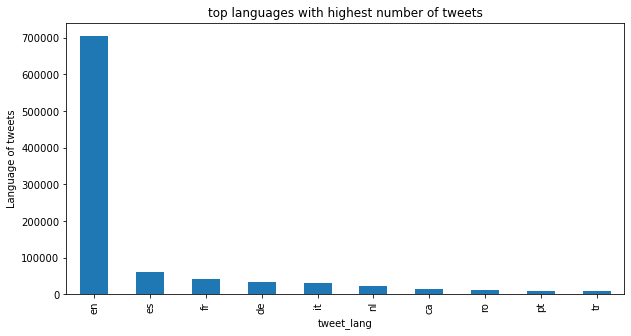

In [25]:
## Visualise languages of tweets

plt.figure(figsize=(10,5))
trump.groupby('tweet_lang')['tweet'].count().sort_values(ascending=False).head(10).plot.bar()
plt.ylabel('Language of tweets')
plt.title('top languages with highest number of tweets')
plt.show()

In [28]:
## filter data frame for USA

US= ["United States", "United States of America"]

US_trump= trump[trump["country"].isin(US)]

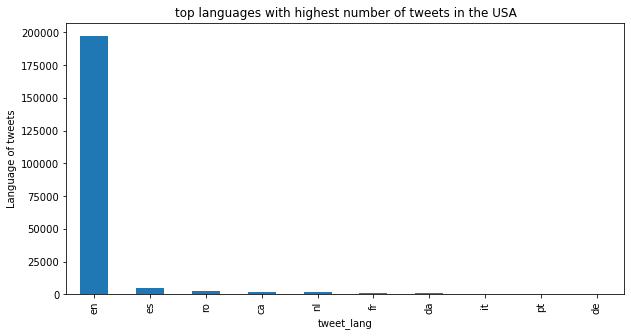

In [30]:
## visualize languages of tweets in the USA

plt.figure(figsize=(10,5))
US_trump.groupby('tweet_lang')['tweet'].count().sort_values(ascending=False).head(10).plot.bar()
plt.ylabel('Language of tweets')
plt.title('top languages with highest number of tweets in the USA')
plt.show()

### Languages of tweets

According to the US Census 78% of the US population speaks only English and 13,5% speak Spanish. By looking at citizens that are over the age of 18 it becomes more english-sided: 83,8% speak English and 9,5% speak Spanish. This is not proportional to the tweets but could depend on the languaguage detection model, which is pretrained and rule/lexicon based. 

source: https://data.census.gov/cedsci/table?q=languages%20in%20the%20USA&tid=ACSST1Y2019.S1601

In [ ]:
#### Literature on multilingual senitment analysis: 
    https://www.igi-global.com/pdf.aspx?tid=273141&ptid=253867&ctid=4&oa=true&isxn=9781799858997
    https://spacy.io/universe/project/spacy-langdetect
    
    
    
#### Lanugage models from spacy:

https://spacy.io/models

spanish: https://spacy.io/models/es